# Notebook 1: Modelle mit Auswertung

## Team

- Gülnisa Tamer 82312
- Sabrina Greifzu 84472
- Thomas Hausner 84461

## Ausgewählte Klassifizierungs-Algorithmen

- kleines neuronales Netz
- großes neuronales Netz
- Random Forest
- XGBoost
- CatBoost

## Scaler

- StandardScaler
- MinMaxScaler

## Feature Selection

- RFE

## Auswertung

- a) Training auf alle 40 Personen, Test auf alle Personen
- b) 40x Training auf 39 Personen, Test auf eine Person

In [1]:
import numpy as np
import pandas as pd

%matplotlib inline
import matplotlib.pyplot as plt

import tensorflow as tf

from tensorflow import keras 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, InputLayer
from tensorflow.keras.optimizers import Adam

from keras_tuner.tuners import RandomSearch

from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelBinarizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score

In [2]:
# Ergebnislisten für Vergleich
results_a = 7 * [0]
results_b = 7 * [0]

In [3]:
# Load Data

data = pd.read_csv('../data/activity_recognition_with_index.csv')

## Neuronale Netze
### Data Preprocessing mit MinMaxScaler

In [4]:
# Data Preparation

data_input = data.drop(['Person', 'class'], axis = 1)
data_person = data['Person']
data_labels_raw = data['class']

## train test split
train_data, test_data, train_labels_raw, test_labels_raw = train_test_split(
                      data_input, data_labels_raw, test_size = 0.1, random_state=123)

## preprocessing: scale data to make sure each feature has equal influence
#scaler = StandardScaler().fit(train_data)  # z-score
scaler = MinMaxScaler().fit(train_data)

train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)

## one-hot-encoding 
encoder = LabelBinarizer().fit(train_labels_raw)

train_labels = encoder.transform(train_labels_raw)
test_labels = encoder.transform(test_labels_raw)


#extract number of features and classes 
n_attributes = data_input.shape[1]
n_classes = train_labels.shape[1]

### Kleines Neuronales Netz mit MinMaxScaler

In [5]:
hp_ann_small = {'units': 30, 'activation': 'tanh', 'learning_rate': 0.001, 'nbr_hidden_layers': 2}

In [6]:
# Funktion, um ein neuronales Netz zu erzeugen, wird später wiederverwendet

def createANN(hp, n_attributes, n_classes):
    
    model = Sequential()  
    model.add( InputLayer(input_shape=(n_attributes, ), name="input_1D_vector")) 

    for i in range(hp['nbr_hidden_layers']):
        model.add( Dense(units=hp['units'], activation=hp['activation'],
                             name="hidden" +str(i)+ "_" +str(hp['units'])+ "nodes")) #hidden layer

    model.add( Dense(units=n_classes, activation='softmax', name="output_softmax"))
    optim = Adam(learning_rate = hp['learning_rate']) 
    #model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=optim, metrics=['accuracy'])
    model.compile(loss='mean_squared_error', optimizer=optim, metrics=['accuracy'])
    
    return model


In [7]:
model_ann_small = createANN(hp_ann_small, n_attributes, n_classes)

In [8]:
# Funktion zum Trainieren eines neuronalen Netzes

def trainANN(model, hp, train_data, train_labels):
    #optim = Adam(learning_rate=hp['learning_rate']) 

    #model.compile(loss=tf.keras.losses.CategoricalCrossentropy(), optimizer=optim, metrics=['accuracy'])

    # early stopping callback
    cb_early_stopping = tf.keras.callbacks.EarlyStopping(patience=50,restore_best_weights=True)

    #train the model with early stopping
    history = model.fit(train_data, train_labels, batch_size=20, epochs=500, verbose=2,
              validation_split = 0.1,
              callbacks = [cb_early_stopping])

    model.summary()  # print layers of the model

    tf.keras.utils.plot_model(model) # plot model
    
    # plot training process
    df_hist = pd.DataFrame(history.history)
    fig, ax = plt.subplots(figsize=(8, 6), dpi = 100)
    ax.plot(df_hist)
    ax.legend(df_hist.columns)
    plt.gca().set_ylim([0,1])
    plt.show()
    
    del model

Epoch 1/500
182/182 - 0s - loss: 0.1145 - accuracy: 0.6265 - val_loss: 0.0947 - val_accuracy: 0.7153
Epoch 2/500
182/182 - 0s - loss: 0.0817 - accuracy: 0.7528 - val_loss: 0.0701 - val_accuracy: 0.8020
Epoch 3/500
182/182 - 0s - loss: 0.0762 - accuracy: 0.7712 - val_loss: 0.0648 - val_accuracy: 0.8119
Epoch 4/500
182/182 - 0s - loss: 0.0701 - accuracy: 0.7809 - val_loss: 0.0606 - val_accuracy: 0.8342
Epoch 5/500
182/182 - 0s - loss: 0.0651 - accuracy: 0.8057 - val_loss: 0.0559 - val_accuracy: 0.8366
Epoch 6/500
182/182 - 0s - loss: 0.0627 - accuracy: 0.8230 - val_loss: 0.0559 - val_accuracy: 0.8243
Epoch 7/500
182/182 - 0s - loss: 0.0608 - accuracy: 0.8208 - val_loss: 0.0547 - val_accuracy: 0.8391
Epoch 8/500
182/182 - 0s - loss: 0.0606 - accuracy: 0.8230 - val_loss: 0.0564 - val_accuracy: 0.8441
Epoch 9/500
182/182 - 0s - loss: 0.0581 - accuracy: 0.8255 - val_loss: 0.0516 - val_accuracy: 0.8564
Epoch 10/500
182/182 - 0s - loss: 0.0569 - accuracy: 0.8357 - val_loss: 0.0592 - val_accura

Epoch 82/500
182/182 - 0s - loss: 0.0244 - accuracy: 0.9366 - val_loss: 0.0307 - val_accuracy: 0.9109
Epoch 83/500
182/182 - 0s - loss: 0.0229 - accuracy: 0.9396 - val_loss: 0.0276 - val_accuracy: 0.9282
Epoch 84/500
182/182 - 0s - loss: 0.0227 - accuracy: 0.9424 - val_loss: 0.0266 - val_accuracy: 0.9257
Epoch 85/500
182/182 - 0s - loss: 0.0229 - accuracy: 0.9402 - val_loss: 0.0288 - val_accuracy: 0.9282
Epoch 86/500
182/182 - 0s - loss: 0.0230 - accuracy: 0.9416 - val_loss: 0.0296 - val_accuracy: 0.9307
Epoch 87/500
182/182 - 0s - loss: 0.0215 - accuracy: 0.9487 - val_loss: 0.0323 - val_accuracy: 0.9035
Epoch 88/500
182/182 - 0s - loss: 0.0223 - accuracy: 0.9407 - val_loss: 0.0294 - val_accuracy: 0.9183
Epoch 89/500
182/182 - 0s - loss: 0.0243 - accuracy: 0.9341 - val_loss: 0.0269 - val_accuracy: 0.9282
Epoch 90/500
182/182 - 0s - loss: 0.0211 - accuracy: 0.9443 - val_loss: 0.0357 - val_accuracy: 0.9010
Epoch 91/500
182/182 - 0s - loss: 0.0236 - accuracy: 0.9391 - val_loss: 0.0268 - v

Epoch 162/500
182/182 - 0s - loss: 0.0120 - accuracy: 0.9716 - val_loss: 0.0223 - val_accuracy: 0.9480
Epoch 163/500
182/182 - 0s - loss: 0.0122 - accuracy: 0.9683 - val_loss: 0.0262 - val_accuracy: 0.9233
Epoch 164/500
182/182 - 0s - loss: 0.0130 - accuracy: 0.9680 - val_loss: 0.0255 - val_accuracy: 0.9282
Epoch 165/500
182/182 - 0s - loss: 0.0151 - accuracy: 0.9606 - val_loss: 0.0257 - val_accuracy: 0.9356
Epoch 166/500
182/182 - 0s - loss: 0.0132 - accuracy: 0.9666 - val_loss: 0.0214 - val_accuracy: 0.9455
Epoch 167/500
182/182 - 0s - loss: 0.0121 - accuracy: 0.9730 - val_loss: 0.0231 - val_accuracy: 0.9406
Epoch 168/500
182/182 - 0s - loss: 0.0147 - accuracy: 0.9614 - val_loss: 0.0229 - val_accuracy: 0.9406
Epoch 169/500
182/182 - 0s - loss: 0.0129 - accuracy: 0.9647 - val_loss: 0.0210 - val_accuracy: 0.9455
Epoch 170/500
182/182 - 0s - loss: 0.0119 - accuracy: 0.9697 - val_loss: 0.0227 - val_accuracy: 0.9356
Epoch 171/500
182/182 - 0s - loss: 0.0112 - accuracy: 0.9724 - val_loss: 

Epoch 242/500
182/182 - 0s - loss: 0.0103 - accuracy: 0.9755 - val_loss: 0.0219 - val_accuracy: 0.9406
Epoch 243/500
182/182 - 0s - loss: 0.0075 - accuracy: 0.9818 - val_loss: 0.0237 - val_accuracy: 0.9381
Epoch 244/500
182/182 - 0s - loss: 0.0089 - accuracy: 0.9788 - val_loss: 0.0236 - val_accuracy: 0.9381
Epoch 245/500
182/182 - 0s - loss: 0.0103 - accuracy: 0.9741 - val_loss: 0.0202 - val_accuracy: 0.9480
Epoch 246/500
182/182 - 0s - loss: 0.0077 - accuracy: 0.9810 - val_loss: 0.0214 - val_accuracy: 0.9455
Epoch 247/500
182/182 - 0s - loss: 0.0078 - accuracy: 0.9813 - val_loss: 0.0259 - val_accuracy: 0.9381
Epoch 248/500
182/182 - 0s - loss: 0.0078 - accuracy: 0.9807 - val_loss: 0.0208 - val_accuracy: 0.9480
Epoch 249/500
182/182 - 0s - loss: 0.0089 - accuracy: 0.9782 - val_loss: 0.0205 - val_accuracy: 0.9480
Epoch 250/500
182/182 - 0s - loss: 0.0069 - accuracy: 0.9846 - val_loss: 0.0168 - val_accuracy: 0.9604
Epoch 251/500
182/182 - 0s - loss: 0.0074 - accuracy: 0.9821 - val_loss: 

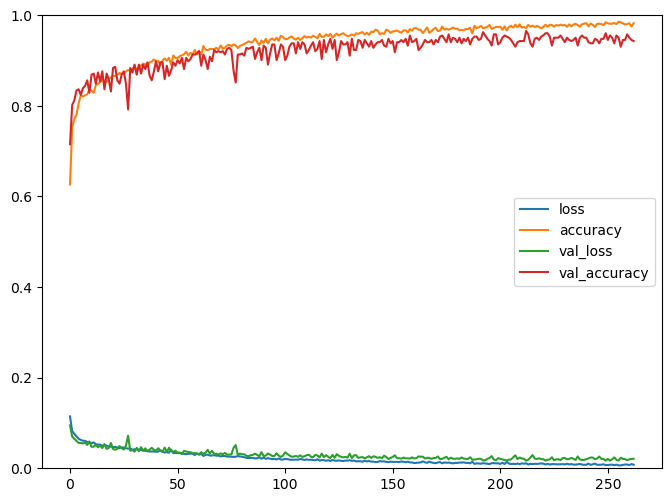

In [9]:
trainANN(model_ann_small, hp_ann_small, train_data, train_labels)

In [10]:
# Funktion, um das Modell auf das Testset nach Aufgabe a) zu testen

def testANN_a(model):
    print("######## Results auf test data #########")
    pred = model.predict(test_data)
    predictions = np.argmax(model.predict(test_data), axis=-1)  # neural network outputs to classes
    cm = confusion_matrix(test_labels_raw, predictions+1)

    acc = accuracy_score(test_labels_raw, predictions+1)
    print("Accuracy (test): ", acc)
    print(cm)
    return acc

In [11]:
# Ergebnis auf a)

acc = testANN_a(model_ann_small)
results_a[0]=acc

######## Results auf test data #########
Accuracy (test):  0.9285714285714286
[[103   3   1   0]
 [  1  97  10   0]
 [  3  11  92   0]
 [  0   1   2 124]]


In [12]:
#del train_data, train_labels,test_data, test_labels_raw

In [13]:
# Funktion, um das Modell auf das Testset nach Aufgabe b) zu testen

def testANN_b(hp, n_attributes, n_classes):

    # train test split / leave one out

    loocv_test = list()
    loocv_train = list()

    for i in range(1, 41):
        loocv_test.append(data[data['Person'] == i])
        loocv_train.append(data[data['Person'] != i])

    accuracies = list()

    for i in range(40):

        train_data = loocv_train[i].drop(['Person', 'class'], axis = 1)
        train_labels_raw = loocv_train[i]['class']
        test_data = loocv_test[i].drop(['Person', 'class'], axis = 1)
        test_labels_raw = loocv_test[i]['class']


        ## preprocessing: scale data to make sure each feature has equal influence
        #scaler = StandardScaler().fit(train_data)  # z-score
        scaler = MinMaxScaler().fit(train_data)
        train_data = scaler.transform(train_data)
        test_data = scaler.transform(test_data)

        ## one-hot-encoding 
        encoder = LabelBinarizer().fit(train_labels_raw)

        train_labels = encoder.transform(train_labels_raw)
        test_labels = encoder.transform(test_labels_raw)

        ### create neural network
        # Sequential API, adding layer to the model object
        model = createANN(hp, n_attributes, n_classes)
        trainANN(model, hp, train_data, train_labels)

        # classification of test set
        print("### Results auf test data ###")
        pred = model.predict(test_data)
        predictions = np.argmax(model.predict(test_data), axis=-1)  # neural network outputs to classes
        cm = confusion_matrix(test_labels_raw, predictions+1)
        acc = accuracy_score(test_labels_raw, predictions+1)
        accuracies.append(acc)
        print("Accuracy for person ", i+1, ": ", acc)
        print(cm)

        del model

    print('\n ##### overall accuracy: ', np.mean(accuracies), '#####')
    return accuracies

Epoch 1/500
197/197 - 0s - loss: 0.1079 - accuracy: 0.6538 - val_loss: 0.1195 - val_accuracy: 0.6613
Epoch 2/500
197/197 - 0s - loss: 0.0813 - accuracy: 0.7423 - val_loss: 0.1077 - val_accuracy: 0.6316
Epoch 3/500
197/197 - 0s - loss: 0.0774 - accuracy: 0.7558 - val_loss: 0.1023 - val_accuracy: 0.6636
Epoch 4/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7899 - val_loss: 0.0951 - val_accuracy: 0.6979
Epoch 5/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.7965 - val_loss: 0.0918 - val_accuracy: 0.7162
Epoch 6/500
197/197 - 0s - loss: 0.0655 - accuracy: 0.8003 - val_loss: 0.0959 - val_accuracy: 0.7551
Epoch 7/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.8028 - val_loss: 0.0874 - val_accuracy: 0.7162
Epoch 8/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8257 - val_loss: 0.0840 - val_accuracy: 0.7643
Epoch 9/500
197/197 - 0s - loss: 0.0574 - accuracy: 0.8296 - val_loss: 0.0825 - val_accuracy: 0.7689
Epoch 10/500
197/197 - 0s - loss: 0.0570 - accuracy: 0.8311 - val_loss: 0.0827 - val_accura

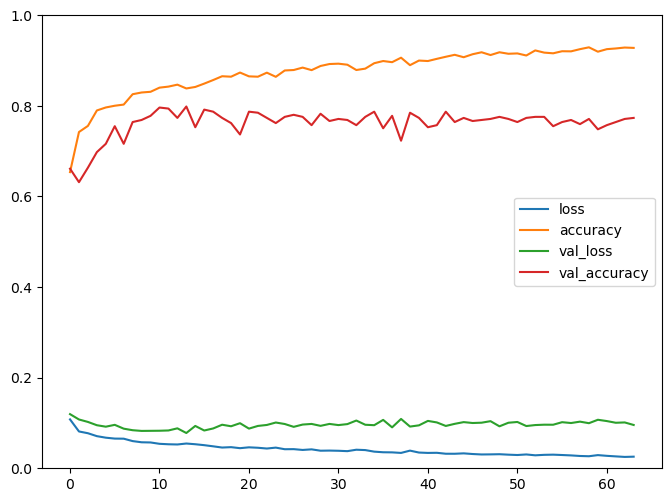

### Results auf test data ###
Accuracy for person  1 :  0.6785714285714286
[[18 10  0  0]
 [ 0 28  0  0]
 [ 0 26  2  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1086 - accuracy: 0.6578 - val_loss: 0.1197 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0810 - accuracy: 0.7469 - val_loss: 0.0997 - val_accuracy: 0.7437
Epoch 3/500
197/197 - 0s - loss: 0.0747 - accuracy: 0.7792 - val_loss: 0.0988 - val_accuracy: 0.6590
Epoch 4/500
197/197 - 0s - loss: 0.0699 - accuracy: 0.7924 - val_loss: 0.0883 - val_accuracy: 0.7414
Epoch 5/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8156 - val_loss: 0.0816 - val_accuracy: 0.7414
Epoch 6/500
197/197 - 0s - loss: 0.0618 - accuracy: 0.8214 - val_loss: 0.0694 - val_accuracy: 0.8192
Epoch 7/500
197/197 - 0s - loss: 0.0629 - accuracy: 0.8138 - val_loss: 0.0897 - val_accuracy: 0.7185
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8130 - val_loss: 0.0774 - val_accuracy: 0.7757
Epoch 9/500
197/197 - 0s - loss: 0.0574 - accuracy: 0.82

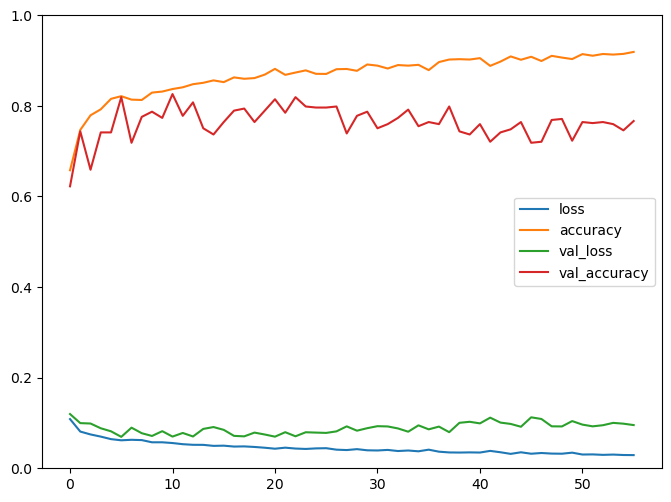

### Results auf test data ###
Accuracy for person  2 :  0.6875
[[13  0 15  0]
 [ 0  8 20  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1068 - accuracy: 0.6624 - val_loss: 0.1028 - val_accuracy: 0.6842
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7428 - val_loss: 0.0961 - val_accuracy: 0.6751
Epoch 3/500
197/197 - 0s - loss: 0.0750 - accuracy: 0.7736 - val_loss: 0.1020 - val_accuracy: 0.7346
Epoch 4/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7942 - val_loss: 0.0848 - val_accuracy: 0.7643
Epoch 5/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.7922 - val_loss: 0.0916 - val_accuracy: 0.7551
Epoch 6/500
197/197 - 0s - loss: 0.0645 - accuracy: 0.8087 - val_loss: 0.0829 - val_accuracy: 0.7483
Epoch 7/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8151 - val_loss: 0.0810 - val_accuracy: 0.7826
Epoch 8/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8219 - val_loss: 0.0740 - val_accuracy: 0.8009
Epoch 9/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8275 - val_los

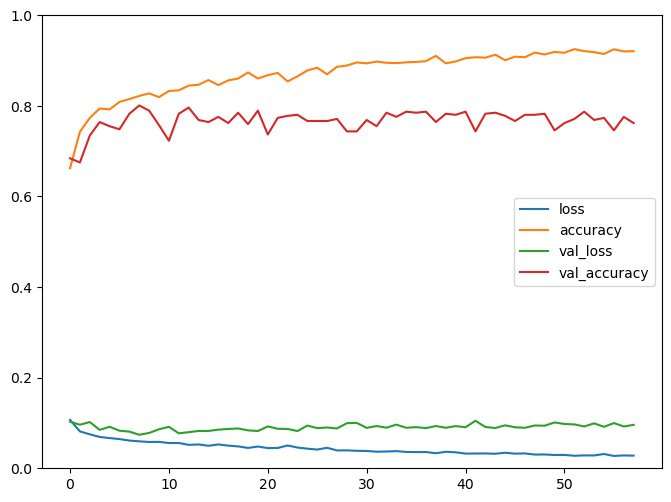

### Results auf test data ###
Accuracy for person  3 :  0.7232142857142857
[[17 11  0  0]
 [ 0 20  8  0]
 [ 0 12 16  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1111 - accuracy: 0.6479 - val_loss: 0.1271 - val_accuracy: 0.5858
Epoch 2/500
197/197 - 0s - loss: 0.0837 - accuracy: 0.7410 - val_loss: 0.1135 - val_accuracy: 0.6979
Epoch 3/500
197/197 - 0s - loss: 0.0775 - accuracy: 0.7591 - val_loss: 0.1118 - val_accuracy: 0.6430
Epoch 4/500
197/197 - 0s - loss: 0.0685 - accuracy: 0.7911 - val_loss: 0.0892 - val_accuracy: 0.7483
Epoch 5/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7942 - val_loss: 0.1030 - val_accuracy: 0.6751
Epoch 6/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8006 - val_loss: 0.0965 - val_accuracy: 0.6934
Epoch 7/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8140 - val_loss: 0.0820 - val_accuracy: 0.7918
Epoch 8/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.8191 - val_loss: 0.0827 - val_accuracy: 0.7735
Epoch 9/500
197/197 - 0s - loss: 0.0578 - accuracy: 0.82

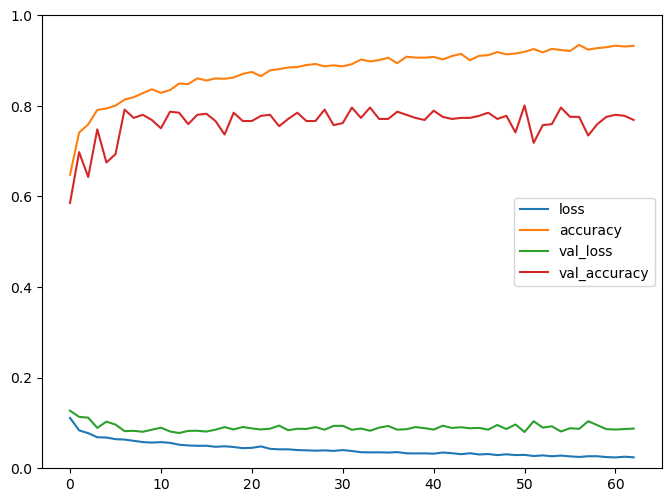

### Results auf test data ###
Accuracy for person  4 :  0.9196428571428571
[[28  0  0  0]
 [ 4 22  2  0]
 [ 0  0 28  0]
 [ 0  0  3 25]]
Epoch 1/500
197/197 - 0s - loss: 0.1062 - accuracy: 0.6571 - val_loss: 0.1162 - val_accuracy: 0.5904
Epoch 2/500
197/197 - 0s - loss: 0.0816 - accuracy: 0.7451 - val_loss: 0.1100 - val_accuracy: 0.6865
Epoch 3/500
197/197 - 0s - loss: 0.0740 - accuracy: 0.7688 - val_loss: 0.0997 - val_accuracy: 0.7185
Epoch 4/500
197/197 - 0s - loss: 0.0721 - accuracy: 0.7779 - val_loss: 0.1001 - val_accuracy: 0.6865
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.7980 - val_loss: 0.0902 - val_accuracy: 0.7346
Epoch 6/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8051 - val_loss: 0.0841 - val_accuracy: 0.7689
Epoch 7/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8168 - val_loss: 0.0801 - val_accuracy: 0.7872
Epoch 8/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8056 - val_loss: 0.0776 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.81

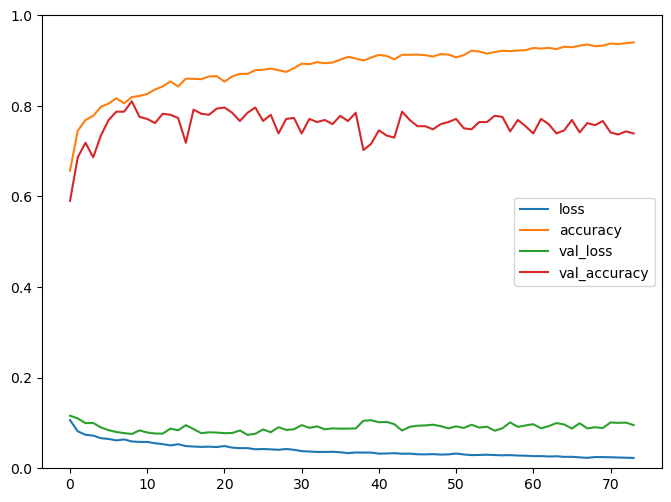

### Results auf test data ###
Accuracy for person  5 :  0.8482142857142857
[[25  3  0  0]
 [ 0 14 14  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1105 - accuracy: 0.6492 - val_loss: 0.1188 - val_accuracy: 0.5927
Epoch 2/500
197/197 - 0s - loss: 0.0801 - accuracy: 0.7538 - val_loss: 0.1013 - val_accuracy: 0.6819
Epoch 3/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7751 - val_loss: 0.1193 - val_accuracy: 0.6293
Epoch 4/500
197/197 - 0s - loss: 0.0705 - accuracy: 0.7868 - val_loss: 0.1063 - val_accuracy: 0.7185
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7922 - val_loss: 0.0896 - val_accuracy: 0.6957
Epoch 6/500
197/197 - 0s - loss: 0.0655 - accuracy: 0.8051 - val_loss: 0.1013 - val_accuracy: 0.6476
Epoch 7/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8186 - val_loss: 0.0842 - val_accuracy: 0.7551
Epoch 8/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.8161 - val_loss: 0.0901 - val_accuracy: 0.7300
Epoch 9/500
197/197 - 0s - loss: 0.0571 - accuracy: 0.83

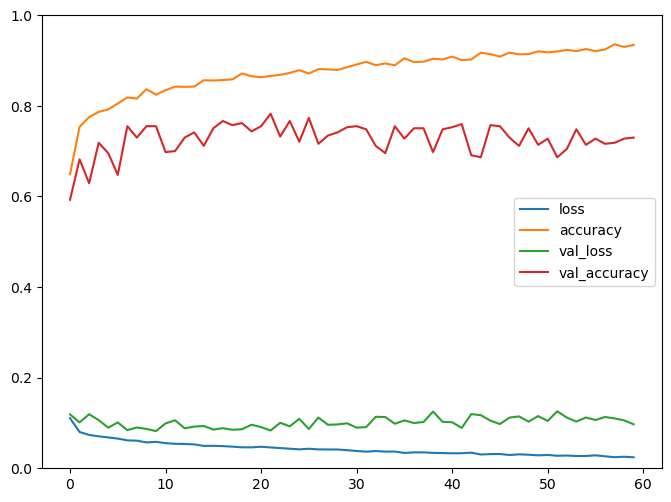

### Results auf test data ###
Accuracy for person  6 :  0.6517857142857143
[[28  0  0  0]
 [12 14  1  1]
 [21  4  3  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1088 - accuracy: 0.6627 - val_loss: 0.1095 - val_accuracy: 0.6499
Epoch 2/500
197/197 - 0s - loss: 0.0809 - accuracy: 0.7408 - val_loss: 0.0980 - val_accuracy: 0.7254
Epoch 3/500
197/197 - 0s - loss: 0.0746 - accuracy: 0.7677 - val_loss: 0.0911 - val_accuracy: 0.7506
Epoch 4/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7766 - val_loss: 0.0959 - val_accuracy: 0.7231
Epoch 5/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8036 - val_loss: 0.1020 - val_accuracy: 0.7117
Epoch 6/500
197/197 - 0s - loss: 0.0655 - accuracy: 0.8008 - val_loss: 0.0874 - val_accuracy: 0.7757
Epoch 7/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8151 - val_loss: 0.0874 - val_accuracy: 0.7712
Epoch 8/500
197/197 - 0s - loss: 0.0578 - accuracy: 0.8268 - val_loss: 0.0885 - val_accuracy: 0.7208
Epoch 9/500
197/197 - 0s - loss: 0.0570 - accuracy: 0.82

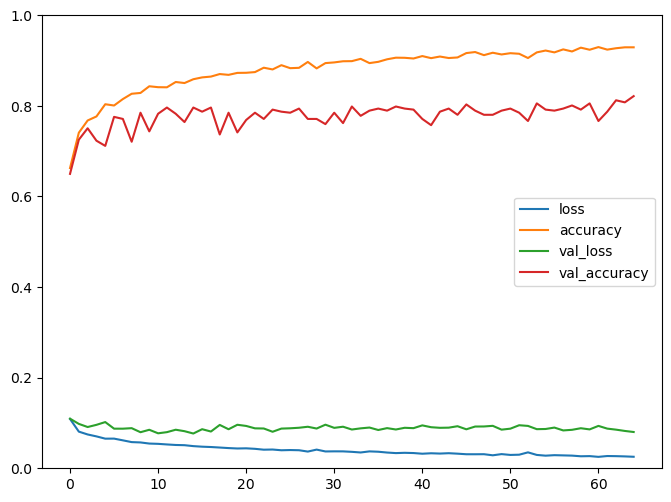

### Results auf test data ###
Accuracy for person  7 :  0.6785714285714286
[[25  0  3  0]
 [ 0 21  7  0]
 [ 7 14  7  0]
 [ 0  1  4 23]]
Epoch 1/500
197/197 - 0s - loss: 0.1097 - accuracy: 0.6426 - val_loss: 0.1137 - val_accuracy: 0.6384
Epoch 2/500
197/197 - 0s - loss: 0.0816 - accuracy: 0.7398 - val_loss: 0.1106 - val_accuracy: 0.6705
Epoch 3/500
197/197 - 0s - loss: 0.0738 - accuracy: 0.7733 - val_loss: 0.1057 - val_accuracy: 0.6476
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7873 - val_loss: 0.0870 - val_accuracy: 0.7277
Epoch 5/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.8097 - val_loss: 0.0856 - val_accuracy: 0.7323
Epoch 6/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8105 - val_loss: 0.0819 - val_accuracy: 0.7643
Epoch 7/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8189 - val_loss: 0.0822 - val_accuracy: 0.7437
Epoch 8/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.8201 - val_loss: 0.1034 - val_accuracy: 0.6819
Epoch 9/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.82

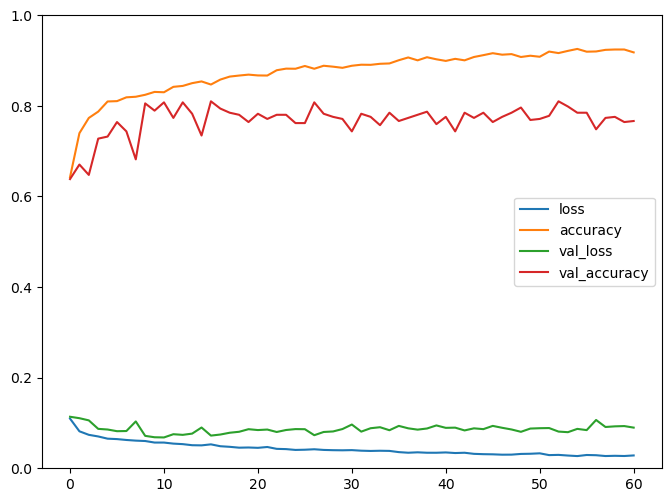

### Results auf test data ###
Accuracy for person  8 :  0.6696428571428571
[[19  9  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1060 - accuracy: 0.6566 - val_loss: 0.1134 - val_accuracy: 0.6499
Epoch 2/500
197/197 - 0s - loss: 0.0817 - accuracy: 0.7423 - val_loss: 0.1029 - val_accuracy: 0.6796
Epoch 3/500
197/197 - 0s - loss: 0.0747 - accuracy: 0.7761 - val_loss: 0.0927 - val_accuracy: 0.7140
Epoch 4/500
197/197 - 0s - loss: 0.0676 - accuracy: 0.7947 - val_loss: 0.0941 - val_accuracy: 0.7094
Epoch 5/500
197/197 - 0s - loss: 0.0646 - accuracy: 0.8092 - val_loss: 0.0996 - val_accuracy: 0.7094
Epoch 6/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8062 - val_loss: 0.1152 - val_accuracy: 0.6751
Epoch 7/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8191 - val_loss: 0.0799 - val_accuracy: 0.7872
Epoch 8/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.8199 - val_loss: 0.0776 - val_accuracy: 0.7666
Epoch 9/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.83

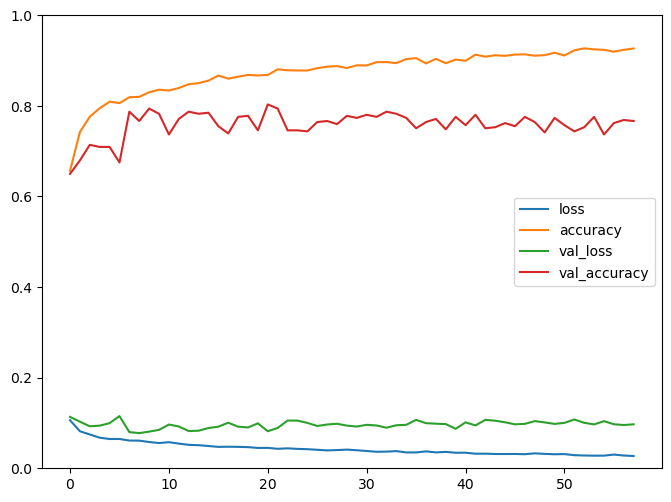

### Results auf test data ###
Accuracy for person  9 :  0.6696428571428571
[[27  0  1  0]
 [15 13  0  0]
 [ 7 14  7  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1083 - accuracy: 0.6566 - val_loss: 0.1144 - val_accuracy: 0.6339
Epoch 2/500
197/197 - 0s - loss: 0.0809 - accuracy: 0.7515 - val_loss: 0.1016 - val_accuracy: 0.7323
Epoch 3/500
197/197 - 0s - loss: 0.0760 - accuracy: 0.7647 - val_loss: 0.1076 - val_accuracy: 0.6568
Epoch 4/500
197/197 - 0s - loss: 0.0716 - accuracy: 0.7843 - val_loss: 0.1022 - val_accuracy: 0.6934
Epoch 5/500
197/197 - 0s - loss: 0.0696 - accuracy: 0.7883 - val_loss: 0.0799 - val_accuracy: 0.7803
Epoch 6/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8112 - val_loss: 0.0887 - val_accuracy: 0.7780
Epoch 7/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8184 - val_loss: 0.0738 - val_accuracy: 0.8101
Epoch 8/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8184 - val_loss: 0.0788 - val_accuracy: 0.8055
Epoch 9/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.82

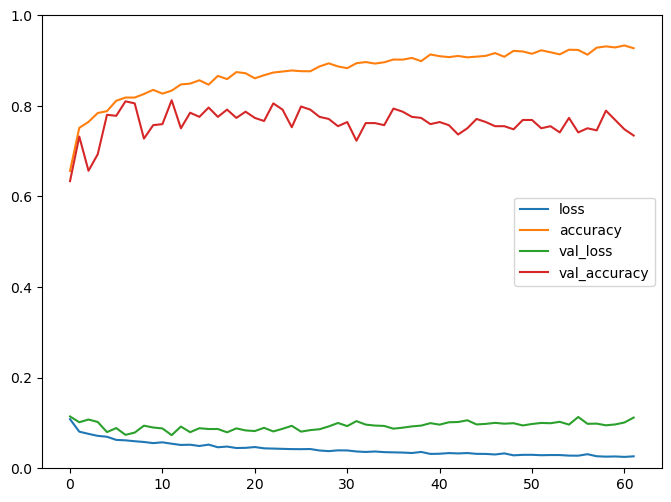

### Results auf test data ###
Accuracy for person  10 :  0.8125
[[21  4  3  0]
 [ 0 26  2  0]
 [ 0 12 16  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1073 - accuracy: 0.6650 - val_loss: 0.1202 - val_accuracy: 0.6270
Epoch 2/500
197/197 - 0s - loss: 0.0805 - accuracy: 0.7492 - val_loss: 0.1082 - val_accuracy: 0.6590
Epoch 3/500
197/197 - 0s - loss: 0.0773 - accuracy: 0.7619 - val_loss: 0.1034 - val_accuracy: 0.7346
Epoch 4/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7812 - val_loss: 0.1128 - val_accuracy: 0.6705
Epoch 5/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7932 - val_loss: 0.0939 - val_accuracy: 0.7140
Epoch 6/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.7960 - val_loss: 0.0795 - val_accuracy: 0.7918
Epoch 7/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8090 - val_loss: 0.1005 - val_accuracy: 0.6773
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8168 - val_loss: 0.0862 - val_accuracy: 0.7735
Epoch 9/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8181 - val_lo

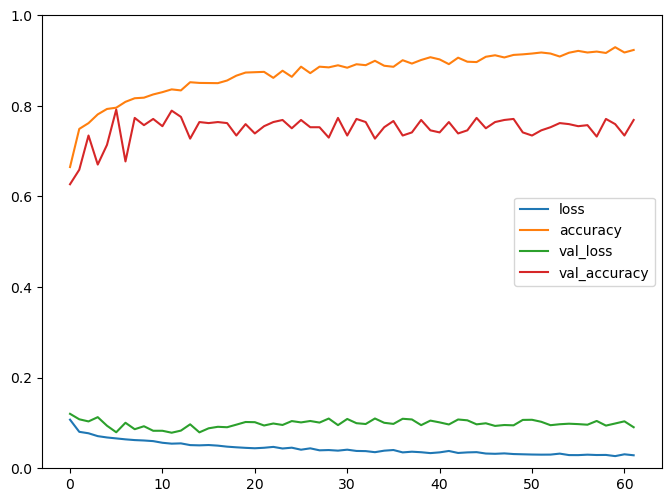

### Results auf test data ###
Accuracy for person  11 :  0.8482142857142857
[[20  8  0  0]
 [ 0 28  0  0]
 [ 0  9 19  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1057 - accuracy: 0.6662 - val_loss: 0.1247 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7436 - val_loss: 0.1071 - val_accuracy: 0.7162
Epoch 3/500
197/197 - 0s - loss: 0.0742 - accuracy: 0.7746 - val_loss: 0.1035 - val_accuracy: 0.7414
Epoch 4/500
197/197 - 0s - loss: 0.0723 - accuracy: 0.7759 - val_loss: 0.0993 - val_accuracy: 0.7414
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8031 - val_loss: 0.0927 - val_accuracy: 0.7551
Epoch 6/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8064 - val_loss: 0.0888 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8054 - val_loss: 0.0899 - val_accuracy: 0.7666
Epoch 8/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.8288 - val_loss: 0.0954 - val_accuracy: 0.7025
Epoch 9/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8

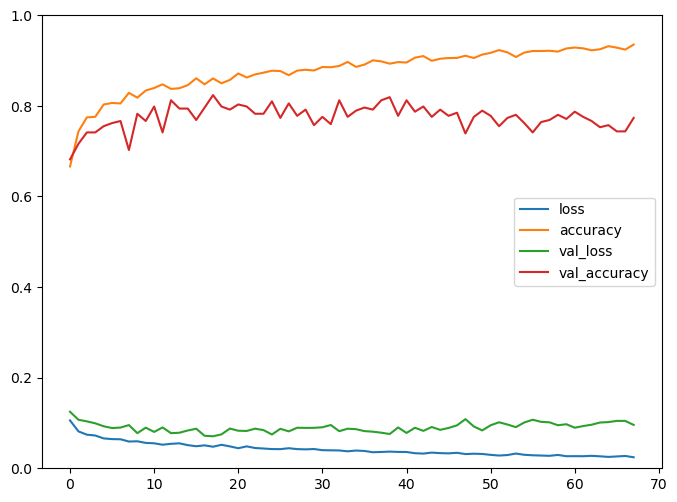

### Results auf test data ###
Accuracy for person  12 :  0.8482142857142857
[[18 10  0  0]
 [ 0 28  0  0]
 [ 0  7 21  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1106 - accuracy: 0.6489 - val_loss: 0.1221 - val_accuracy: 0.6133
Epoch 2/500
197/197 - 0s - loss: 0.0803 - accuracy: 0.7522 - val_loss: 0.1199 - val_accuracy: 0.6590
Epoch 3/500
197/197 - 0s - loss: 0.0746 - accuracy: 0.7690 - val_loss: 0.1006 - val_accuracy: 0.7506
Epoch 4/500
197/197 - 0s - loss: 0.0716 - accuracy: 0.7779 - val_loss: 0.1016 - val_accuracy: 0.6865
Epoch 5/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.8069 - val_loss: 0.0982 - val_accuracy: 0.7140
Epoch 6/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8189 - val_loss: 0.0942 - val_accuracy: 0.6979
Epoch 7/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8146 - val_loss: 0.0889 - val_accuracy: 0.7597
Epoch 8/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8199 - val_loss: 0.0903 - val_accuracy: 0.7551
Epoch 9/500
197/197 - 0s - loss: 0.0564 - accuracy: 0.8

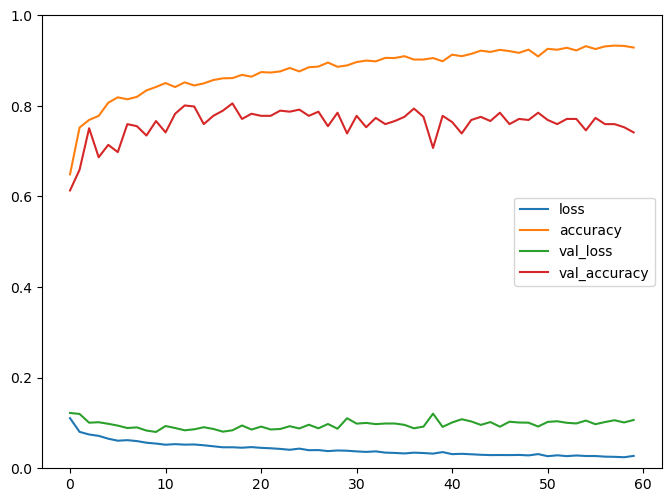

### Results auf test data ###
Accuracy for person  13 :  0.7142857142857143
[[28  0  0  0]
 [ 0  2 26  0]
 [ 0  6 22  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1109 - accuracy: 0.6421 - val_loss: 0.1074 - val_accuracy: 0.6682
Epoch 2/500
197/197 - 0s - loss: 0.0821 - accuracy: 0.7357 - val_loss: 0.0972 - val_accuracy: 0.6911
Epoch 3/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7802 - val_loss: 0.0948 - val_accuracy: 0.7368
Epoch 4/500
197/197 - 0s - loss: 0.0700 - accuracy: 0.7945 - val_loss: 0.0915 - val_accuracy: 0.7574
Epoch 5/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8107 - val_loss: 0.0922 - val_accuracy: 0.7071
Epoch 6/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8156 - val_loss: 0.0833 - val_accuracy: 0.7597
Epoch 7/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8168 - val_loss: 0.0825 - val_accuracy: 0.7437
Epoch 8/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8270 - val_loss: 0.0827 - val_accuracy: 0.7483
Epoch 9/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8

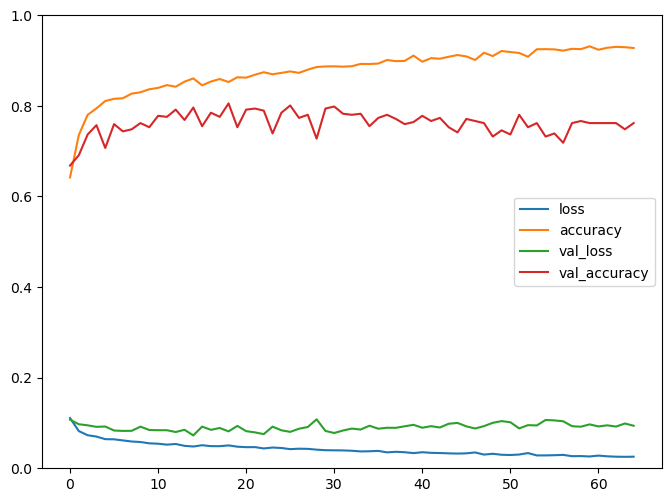

### Results auf test data ###
Accuracy for person  14 :  0.9553571428571429
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0  5 23  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1075 - accuracy: 0.6640 - val_loss: 0.1053 - val_accuracy: 0.7048
Epoch 2/500
197/197 - 0s - loss: 0.0779 - accuracy: 0.7637 - val_loss: 0.1067 - val_accuracy: 0.6865
Epoch 3/500
197/197 - 0s - loss: 0.0720 - accuracy: 0.7822 - val_loss: 0.0875 - val_accuracy: 0.6979
Epoch 4/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7975 - val_loss: 0.0802 - val_accuracy: 0.7666
Epoch 5/500
197/197 - 0s - loss: 0.0660 - accuracy: 0.7990 - val_loss: 0.0790 - val_accuracy: 0.7620
Epoch 6/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8171 - val_loss: 0.0781 - val_accuracy: 0.7551
Epoch 7/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8229 - val_loss: 0.0933 - val_accuracy: 0.7094
Epoch 8/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8260 - val_loss: 0.0738 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0570 - accuracy: 0.8

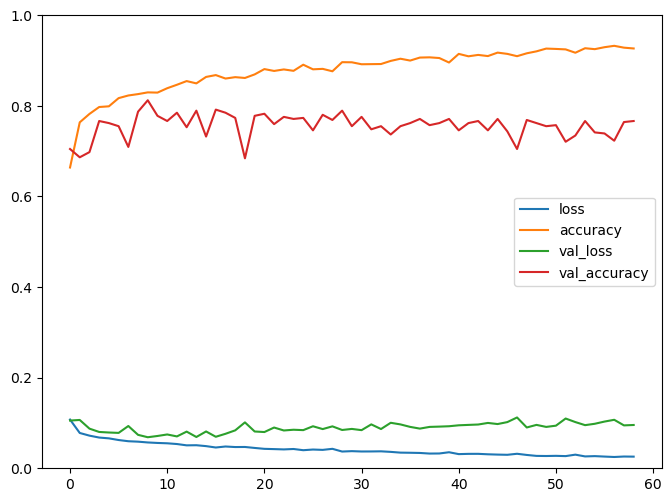

### Results auf test data ###
Accuracy for person  15 :  0.7857142857142857
[[24  3  1  0]
 [ 1 27  0  0]
 [ 2 17  9  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1111 - accuracy: 0.6451 - val_loss: 0.1120 - val_accuracy: 0.6201
Epoch 2/500
197/197 - 0s - loss: 0.0816 - accuracy: 0.7464 - val_loss: 0.1002 - val_accuracy: 0.7117
Epoch 3/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7800 - val_loss: 0.1027 - val_accuracy: 0.6842
Epoch 4/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7939 - val_loss: 0.0873 - val_accuracy: 0.7597
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8059 - val_loss: 0.0851 - val_accuracy: 0.7826
Epoch 6/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8105 - val_loss: 0.0795 - val_accuracy: 0.8055
Epoch 7/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8191 - val_loss: 0.0786 - val_accuracy: 0.8009
Epoch 8/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8214 - val_loss: 0.0769 - val_accuracy: 0.7986
Epoch 9/500
197/197 - 0s - loss: 0.0579 - accuracy: 0.8

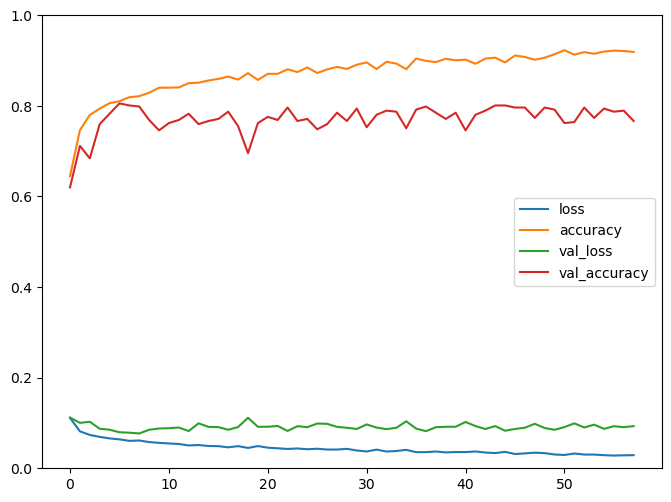

### Results auf test data ###
Accuracy for person  16 :  0.875
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1089 - accuracy: 0.6589 - val_loss: 0.1102 - val_accuracy: 0.7208
Epoch 2/500
197/197 - 0s - loss: 0.0789 - accuracy: 0.7530 - val_loss: 0.0922 - val_accuracy: 0.7140
Epoch 3/500
197/197 - 0s - loss: 0.0721 - accuracy: 0.7784 - val_loss: 0.0929 - val_accuracy: 0.6819
Epoch 4/500
197/197 - 0s - loss: 0.0671 - accuracy: 0.7965 - val_loss: 0.0814 - val_accuracy: 0.7689
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7889 - val_loss: 0.0887 - val_accuracy: 0.7277
Epoch 6/500
197/197 - 0s - loss: 0.0651 - accuracy: 0.7998 - val_loss: 0.0745 - val_accuracy: 0.8261
Epoch 7/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8275 - val_loss: 0.0745 - val_accuracy: 0.7963
Epoch 8/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8217 - val_loss: 0.0755 - val_accuracy: 0.7986
Epoch 9/500
197/197 - 0s - loss: 0.0546 - accuracy: 0.8438 - val_los

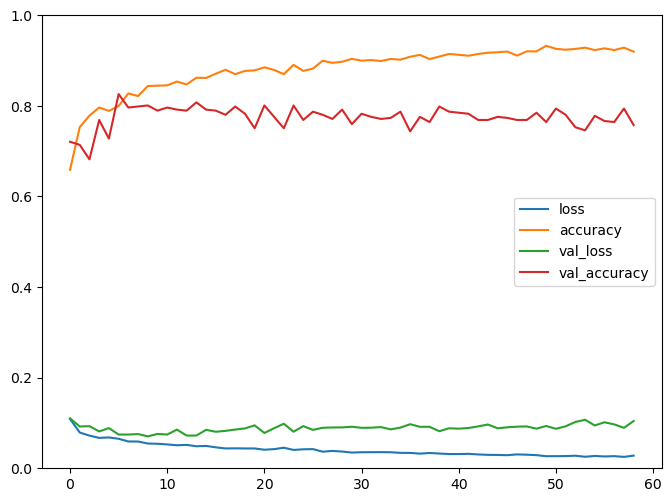

### Results auf test data ###
Accuracy for person  17 :  0.6875
[[10 13  5  0]
 [ 0 23  5  0]
 [ 1 11 16  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1094 - accuracy: 0.6477 - val_loss: 0.1297 - val_accuracy: 0.6247
Epoch 2/500
197/197 - 0s - loss: 0.0820 - accuracy: 0.7482 - val_loss: 0.1096 - val_accuracy: 0.6979
Epoch 3/500
197/197 - 0s - loss: 0.0734 - accuracy: 0.7741 - val_loss: 0.1068 - val_accuracy: 0.7117
Epoch 4/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7965 - val_loss: 0.0965 - val_accuracy: 0.7414
Epoch 5/500
197/197 - 0s - loss: 0.0670 - accuracy: 0.8046 - val_loss: 0.0944 - val_accuracy: 0.7254
Epoch 6/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8171 - val_loss: 0.0886 - val_accuracy: 0.7254
Epoch 7/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8222 - val_loss: 0.0863 - val_accuracy: 0.7437
Epoch 8/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8196 - val_loss: 0.0898 - val_accuracy: 0.7460
Epoch 9/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8199 - val_lo

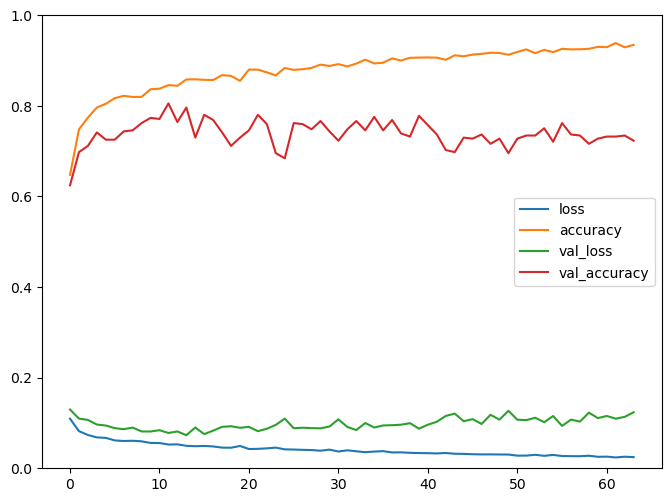

### Results auf test data ###
Accuracy for person  18 :  0.7678571428571429
[[28  0  0  0]
 [ 8 20  0  0]
 [ 4 14 10  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1082 - accuracy: 0.6594 - val_loss: 0.1143 - val_accuracy: 0.6293
Epoch 2/500
197/197 - 0s - loss: 0.0810 - accuracy: 0.7474 - val_loss: 0.1082 - val_accuracy: 0.7048
Epoch 3/500
197/197 - 0s - loss: 0.0741 - accuracy: 0.7680 - val_loss: 0.0927 - val_accuracy: 0.7849
Epoch 4/500
197/197 - 0s - loss: 0.0692 - accuracy: 0.7906 - val_loss: 0.0897 - val_accuracy: 0.7643
Epoch 5/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8028 - val_loss: 0.0886 - val_accuracy: 0.7666
Epoch 6/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8097 - val_loss: 0.0822 - val_accuracy: 0.7574
Epoch 7/500
197/197 - 0s - loss: 0.0651 - accuracy: 0.8064 - val_loss: 0.0820 - val_accuracy: 0.7780
Epoch 8/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8173 - val_loss: 0.0762 - val_accuracy: 0.7918
Epoch 9/500
197/197 - 0s - loss: 0.0576 - accuracy: 0.8

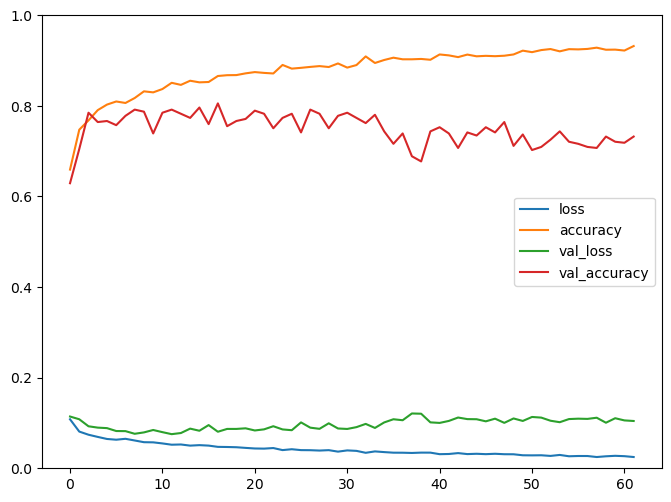

### Results auf test data ###
Accuracy for person  19 :  0.75
[[28  0  0  0]
 [ 0 28  0  0]
 [ 1 27  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1103 - accuracy: 0.6467 - val_loss: 0.1110 - val_accuracy: 0.6476
Epoch 2/500
197/197 - 0s - loss: 0.0811 - accuracy: 0.7510 - val_loss: 0.1018 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0745 - accuracy: 0.7703 - val_loss: 0.0894 - val_accuracy: 0.7551
Epoch 4/500
197/197 - 0s - loss: 0.0718 - accuracy: 0.7810 - val_loss: 0.0857 - val_accuracy: 0.7071
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7939 - val_loss: 0.0961 - val_accuracy: 0.7140
Epoch 6/500
197/197 - 0s - loss: 0.0683 - accuracy: 0.7937 - val_loss: 0.0964 - val_accuracy: 0.7025
Epoch 7/500
197/197 - 0s - loss: 0.0655 - accuracy: 0.8001 - val_loss: 0.0817 - val_accuracy: 0.7643
Epoch 8/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8039 - val_loss: 0.0799 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8151 - val_loss

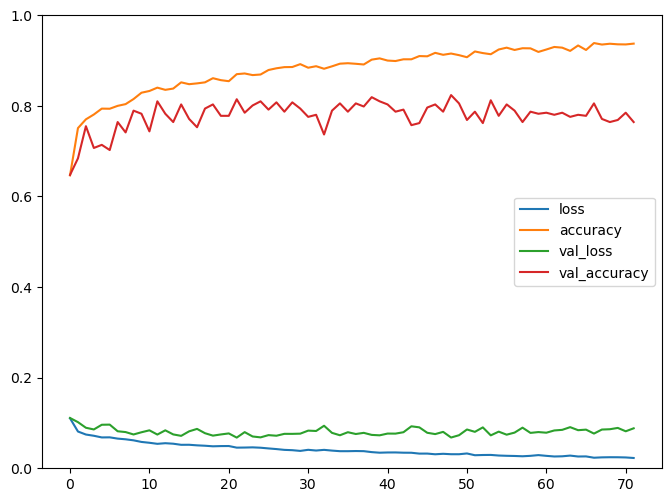

### Results auf test data ###
Accuracy for person  20 :  0.9464285714285714
[[27  0  1  0]
 [ 0 28  0  0]
 [ 0  5 23  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1082 - accuracy: 0.6512 - val_loss: 0.1217 - val_accuracy: 0.6178
Epoch 2/500
197/197 - 0s - loss: 0.0798 - accuracy: 0.7492 - val_loss: 0.1042 - val_accuracy: 0.7231
Epoch 3/500
197/197 - 0s - loss: 0.0728 - accuracy: 0.7794 - val_loss: 0.1099 - val_accuracy: 0.6888
Epoch 4/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7917 - val_loss: 0.1114 - val_accuracy: 0.6911
Epoch 5/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8125 - val_loss: 0.0887 - val_accuracy: 0.7597
Epoch 6/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8130 - val_loss: 0.0971 - val_accuracy: 0.7185
Epoch 7/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8235 - val_loss: 0.0883 - val_accuracy: 0.7689
Epoch 8/500
197/197 - 0s - loss: 0.0581 - accuracy: 0.8288 - val_loss: 0.0934 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0556 - accuracy: 0.8

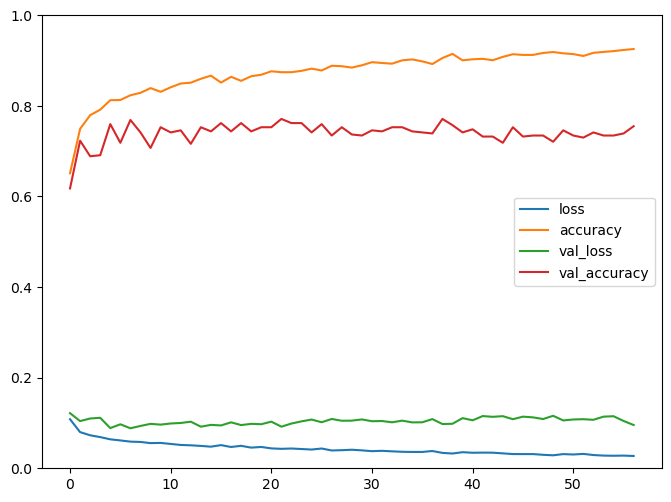

### Results auf test data ###
Accuracy for person  21 :  0.45535714285714285
[[12  6  8  2]
 [ 0 28  0  0]
 [ 0 27  1  0]
 [ 0 18  0 10]]
Epoch 1/500
197/197 - 0s - loss: 0.1067 - accuracy: 0.6642 - val_loss: 0.1352 - val_accuracy: 0.5950
Epoch 2/500
197/197 - 0s - loss: 0.0790 - accuracy: 0.7553 - val_loss: 0.1114 - val_accuracy: 0.6613
Epoch 3/500
197/197 - 0s - loss: 0.0716 - accuracy: 0.7797 - val_loss: 0.1100 - val_accuracy: 0.6865
Epoch 4/500
197/197 - 0s - loss: 0.0655 - accuracy: 0.8118 - val_loss: 0.1084 - val_accuracy: 0.6796
Epoch 5/500
197/197 - 0s - loss: 0.0642 - accuracy: 0.8034 - val_loss: 0.1049 - val_accuracy: 0.7208
Epoch 6/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8293 - val_loss: 0.1147 - val_accuracy: 0.6819
Epoch 7/500
197/197 - 0s - loss: 0.0584 - accuracy: 0.8268 - val_loss: 0.1095 - val_accuracy: 0.7117
Epoch 8/500
197/197 - 0s - loss: 0.0568 - accuracy: 0.8352 - val_loss: 0.1041 - val_accuracy: 0.7117
Epoch 9/500
197/197 - 0s - loss: 0.0550 - accuracy: 0.

197/197 - 0s - loss: 0.0192 - accuracy: 0.9514 - val_loss: 0.0941 - val_accuracy: 0.7620
Epoch 81/500
197/197 - 0s - loss: 0.0208 - accuracy: 0.9451 - val_loss: 0.1010 - val_accuracy: 0.7437
Epoch 82/500
197/197 - 0s - loss: 0.0190 - accuracy: 0.9491 - val_loss: 0.1121 - val_accuracy: 0.7048
Epoch 83/500
197/197 - 0s - loss: 0.0190 - accuracy: 0.9468 - val_loss: 0.1282 - val_accuracy: 0.6819
Epoch 84/500
197/197 - 0s - loss: 0.0201 - accuracy: 0.9448 - val_loss: 0.1046 - val_accuracy: 0.7414
Epoch 85/500
197/197 - 0s - loss: 0.0188 - accuracy: 0.9499 - val_loss: 0.1127 - val_accuracy: 0.7094
Epoch 86/500
197/197 - 0s - loss: 0.0197 - accuracy: 0.9481 - val_loss: 0.1045 - val_accuracy: 0.7300
Epoch 87/500
197/197 - 0s - loss: 0.0191 - accuracy: 0.9484 - val_loss: 0.0939 - val_accuracy: 0.7597
Epoch 88/500
197/197 - 0s - loss: 0.0179 - accuracy: 0.9542 - val_loss: 0.1025 - val_accuracy: 0.7254
Epoch 89/500
197/197 - 0s - loss: 0.0189 - accuracy: 0.9529 - val_loss: 0.0993 - val_accuracy: 

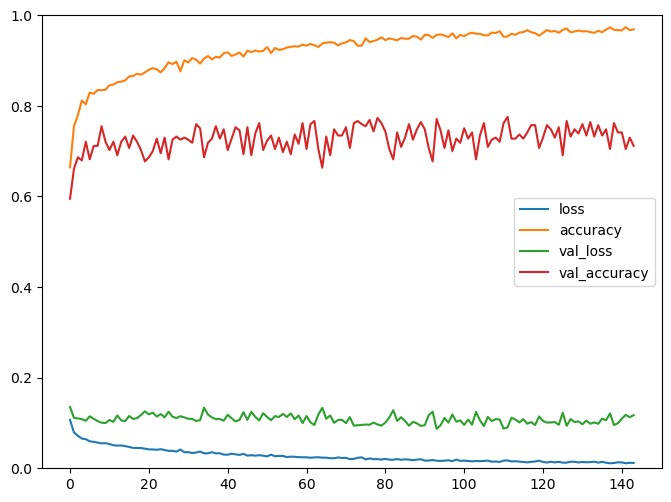

### Results auf test data ###
Accuracy for person  22 :  0.7053571428571429
[[28  0  0  0]
 [ 2  9 10  7]
 [ 5  9 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1094 - accuracy: 0.6601 - val_loss: 0.1119 - val_accuracy: 0.7368
Epoch 2/500
197/197 - 0s - loss: 0.0800 - accuracy: 0.7583 - val_loss: 0.1121 - val_accuracy: 0.6453
Epoch 3/500
197/197 - 0s - loss: 0.0748 - accuracy: 0.7746 - val_loss: 0.0891 - val_accuracy: 0.7391
Epoch 4/500
197/197 - 0s - loss: 0.0690 - accuracy: 0.8021 - val_loss: 0.0866 - val_accuracy: 0.7643
Epoch 5/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.7957 - val_loss: 0.0861 - val_accuracy: 0.7712
Epoch 6/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8148 - val_loss: 0.0913 - val_accuracy: 0.7597
Epoch 7/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8067 - val_loss: 0.0760 - val_accuracy: 0.7918
Epoch 8/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8237 - val_loss: 0.0871 - val_accuracy: 0.7254
Epoch 9/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8

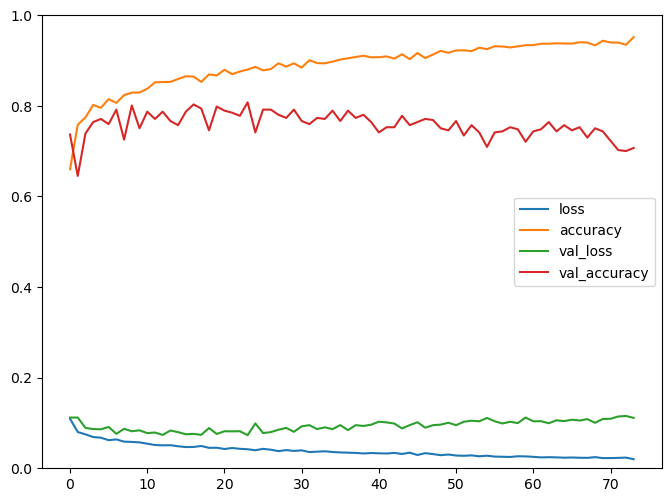

### Results auf test data ###
Accuracy for person  23 :  0.7589285714285714
[[28  0  0  0]
 [ 0  6 22  0]
 [ 4  0 24  0]
 [ 0  1  0 27]]
Epoch 1/500
197/197 - 0s - loss: 0.1092 - accuracy: 0.6484 - val_loss: 0.1178 - val_accuracy: 0.6476
Epoch 2/500
197/197 - 0s - loss: 0.0812 - accuracy: 0.7415 - val_loss: 0.1245 - val_accuracy: 0.6270
Epoch 3/500
197/197 - 0s - loss: 0.0767 - accuracy: 0.7634 - val_loss: 0.1133 - val_accuracy: 0.6430
Epoch 4/500
197/197 - 0s - loss: 0.0703 - accuracy: 0.7833 - val_loss: 0.0962 - val_accuracy: 0.7574
Epoch 5/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.7952 - val_loss: 0.1138 - val_accuracy: 0.6453
Epoch 6/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8077 - val_loss: 0.0905 - val_accuracy: 0.7277
Epoch 7/500
197/197 - 0s - loss: 0.0628 - accuracy: 0.8090 - val_loss: 0.0832 - val_accuracy: 0.7803
Epoch 8/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8260 - val_loss: 0.0814 - val_accuracy: 0.7963
Epoch 9/500
197/197 - 0s - loss: 0.0589 - accuracy: 0.8

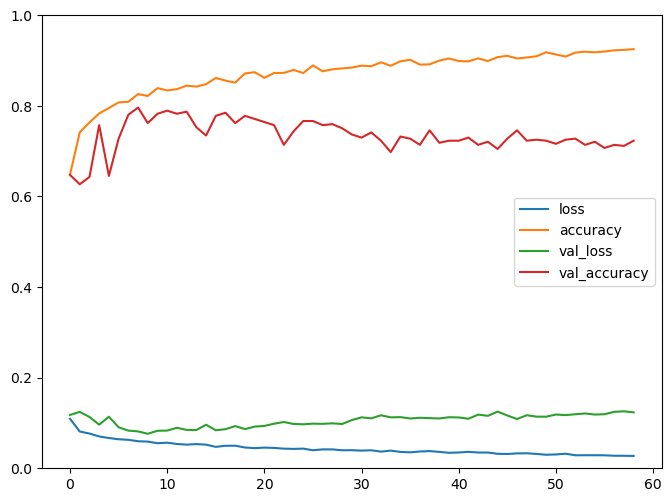

### Results auf test data ###
Accuracy for person  24 :  0.8392857142857143
[[27  0  1  0]
 [ 0 11 17  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1102 - accuracy: 0.6426 - val_loss: 0.1143 - val_accuracy: 0.6064
Epoch 2/500
197/197 - 0s - loss: 0.0812 - accuracy: 0.7405 - val_loss: 0.1081 - val_accuracy: 0.6888
Epoch 3/500
197/197 - 0s - loss: 0.0742 - accuracy: 0.7761 - val_loss: 0.1184 - val_accuracy: 0.6224
Epoch 4/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7980 - val_loss: 0.0938 - val_accuracy: 0.6934
Epoch 5/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.8102 - val_loss: 0.0989 - val_accuracy: 0.6773
Epoch 6/500
197/197 - 0s - loss: 0.0651 - accuracy: 0.8062 - val_loss: 0.0877 - val_accuracy: 0.7231
Epoch 7/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8092 - val_loss: 0.0858 - val_accuracy: 0.7437
Epoch 8/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8301 - val_loss: 0.0819 - val_accuracy: 0.7666
Epoch 9/500
197/197 - 0s - loss: 0.0589 - accuracy: 0.8

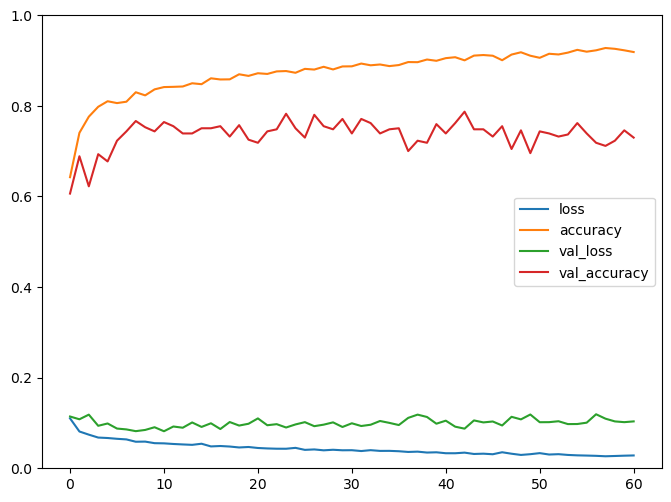

### Results auf test data ###
Accuracy for person  25 :  0.75
[[25  0  3  0]
 [ 1 27  0  0]
 [ 0 14 14  0]
 [ 0  1  9 18]]
Epoch 1/500
197/197 - 0s - loss: 0.1097 - accuracy: 0.6385 - val_loss: 0.1131 - val_accuracy: 0.7185
Epoch 2/500
197/197 - 0s - loss: 0.0801 - accuracy: 0.7510 - val_loss: 0.1021 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0755 - accuracy: 0.7693 - val_loss: 0.1023 - val_accuracy: 0.6659
Epoch 4/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7970 - val_loss: 0.0885 - val_accuracy: 0.7437
Epoch 5/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.8016 - val_loss: 0.0963 - val_accuracy: 0.6796
Epoch 6/500
197/197 - 0s - loss: 0.0636 - accuracy: 0.8084 - val_loss: 0.0749 - val_accuracy: 0.7780
Epoch 7/500
197/197 - 0s - loss: 0.0587 - accuracy: 0.8263 - val_loss: 0.0853 - val_accuracy: 0.7460
Epoch 8/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8306 - val_loss: 0.0976 - val_accuracy: 0.7002
Epoch 9/500
197/197 - 0s - loss: 0.0570 - accuracy: 0.8278 - val_loss

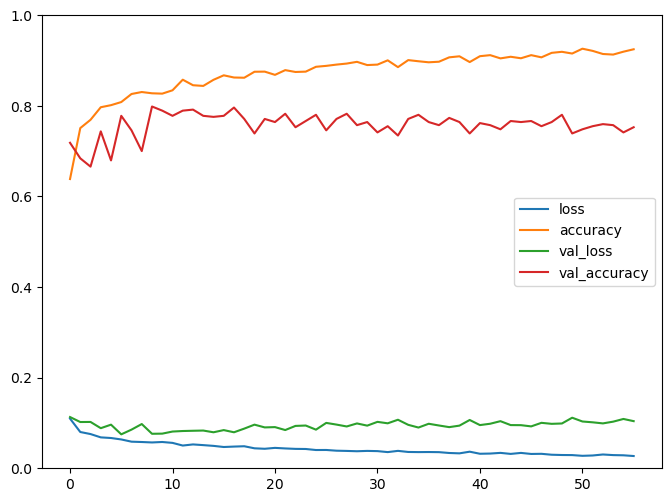

### Results auf test data ###
Accuracy for person  26 :  0.7142857142857143
[[28  0  0  0]
 [ 6 21  1  0]
 [12 13  3  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1090 - accuracy: 0.6385 - val_loss: 0.1032 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0809 - accuracy: 0.7504 - val_loss: 0.0987 - val_accuracy: 0.6682
Epoch 3/500
197/197 - 0s - loss: 0.0772 - accuracy: 0.7586 - val_loss: 0.0953 - val_accuracy: 0.7551
Epoch 4/500
197/197 - 0s - loss: 0.0708 - accuracy: 0.7825 - val_loss: 0.0889 - val_accuracy: 0.7597
Epoch 5/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7975 - val_loss: 0.0981 - val_accuracy: 0.6842
Epoch 6/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8021 - val_loss: 0.0754 - val_accuracy: 0.7849
Epoch 7/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8161 - val_loss: 0.0748 - val_accuracy: 0.7941
Epoch 8/500
197/197 - 0s - loss: 0.0578 - accuracy: 0.8283 - val_loss: 0.0811 - val_accuracy: 0.7620
Epoch 9/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8

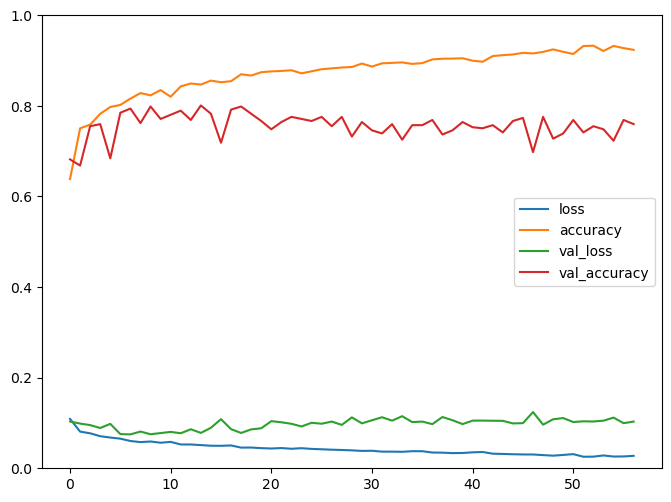

### Results auf test data ###
Accuracy for person  27 :  0.8482142857142857
[[25  2  1  0]
 [ 0 14 14  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1107 - accuracy: 0.6492 - val_loss: 0.1100 - val_accuracy: 0.7117
Epoch 2/500
197/197 - 0s - loss: 0.0789 - accuracy: 0.7563 - val_loss: 0.1092 - val_accuracy: 0.6819
Epoch 3/500
197/197 - 0s - loss: 0.0719 - accuracy: 0.7807 - val_loss: 0.1182 - val_accuracy: 0.6362
Epoch 4/500
197/197 - 0s - loss: 0.0666 - accuracy: 0.8062 - val_loss: 0.1004 - val_accuracy: 0.6888
Epoch 5/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8074 - val_loss: 0.0870 - val_accuracy: 0.7483
Epoch 6/500
197/197 - 0s - loss: 0.0618 - accuracy: 0.8207 - val_loss: 0.0868 - val_accuracy: 0.7277
Epoch 7/500
197/197 - 0s - loss: 0.0585 - accuracy: 0.8285 - val_loss: 0.0815 - val_accuracy: 0.7780
Epoch 8/500
197/197 - 0s - loss: 0.0577 - accuracy: 0.8303 - val_loss: 0.0865 - val_accuracy: 0.7254
Epoch 9/500
197/197 - 0s - loss: 0.0553 - accuracy: 0.8

197/197 - 0s - loss: 0.0194 - accuracy: 0.9486 - val_loss: 0.0881 - val_accuracy: 0.7529
Epoch 81/500
197/197 - 0s - loss: 0.0219 - accuracy: 0.9384 - val_loss: 0.1005 - val_accuracy: 0.7368
Epoch 82/500
197/197 - 0s - loss: 0.0211 - accuracy: 0.9453 - val_loss: 0.0897 - val_accuracy: 0.7483
Epoch 83/500
197/197 - 0s - loss: 0.0196 - accuracy: 0.9451 - val_loss: 0.0946 - val_accuracy: 0.7529
Epoch 84/500
197/197 - 0s - loss: 0.0183 - accuracy: 0.9506 - val_loss: 0.0933 - val_accuracy: 0.7551
Epoch 85/500
197/197 - 0s - loss: 0.0182 - accuracy: 0.9519 - val_loss: 0.0974 - val_accuracy: 0.7460
Epoch 86/500
197/197 - 0s - loss: 0.0196 - accuracy: 0.9461 - val_loss: 0.1011 - val_accuracy: 0.7574
Epoch 87/500
197/197 - 0s - loss: 0.0170 - accuracy: 0.9540 - val_loss: 0.0999 - val_accuracy: 0.7506
Epoch 88/500
197/197 - 0s - loss: 0.0195 - accuracy: 0.9473 - val_loss: 0.0960 - val_accuracy: 0.7460
Epoch 89/500
197/197 - 0s - loss: 0.0179 - accuracy: 0.9527 - val_loss: 0.1053 - val_accuracy: 

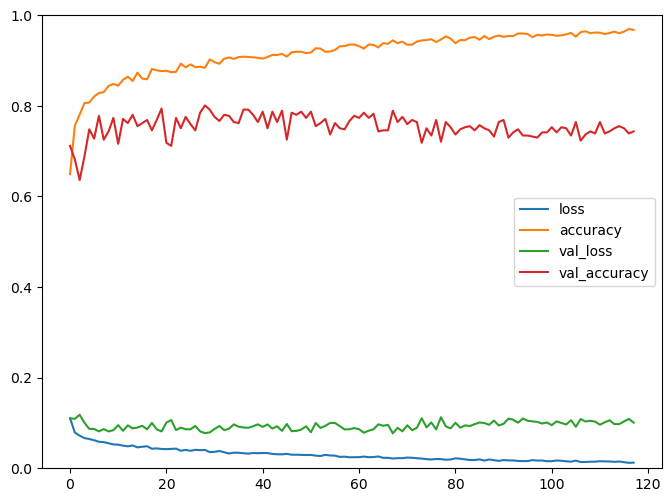

### Results auf test data ###
Accuracy for person  28 :  0.6607142857142857
[[21  1  6  0]
 [ 0  0 28  0]
 [ 2  1 25  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1129 - accuracy: 0.6314 - val_loss: 0.1088 - val_accuracy: 0.6362
Epoch 2/500
197/197 - 0s - loss: 0.0797 - accuracy: 0.7591 - val_loss: 0.1036 - val_accuracy: 0.6636
Epoch 3/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7838 - val_loss: 0.0913 - val_accuracy: 0.7300
Epoch 4/500
197/197 - 0s - loss: 0.0677 - accuracy: 0.7922 - val_loss: 0.0962 - val_accuracy: 0.6568
Epoch 5/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8006 - val_loss: 0.0831 - val_accuracy: 0.7643
Epoch 6/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8102 - val_loss: 0.0891 - val_accuracy: 0.7346
Epoch 7/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8148 - val_loss: 0.0840 - val_accuracy: 0.7643
Epoch 8/500
197/197 - 0s - loss: 0.0573 - accuracy: 0.8280 - val_loss: 0.0807 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0563 - accuracy: 0.8

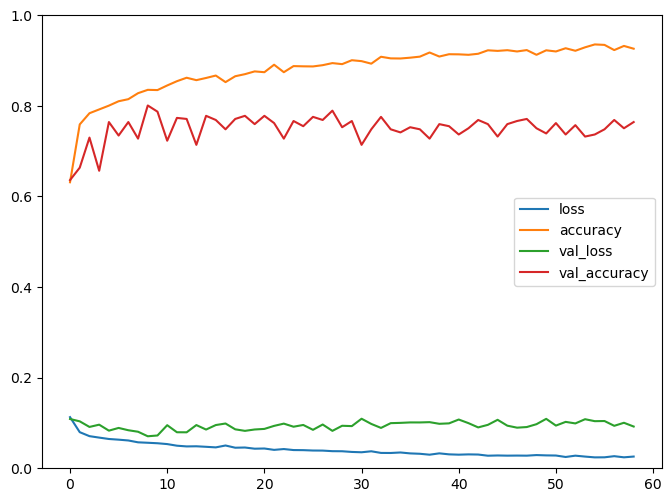

### Results auf test data ###
Accuracy for person  29 :  0.6696428571428571
[[15  8  5  0]
 [ 0 20  8  0]
 [ 0 16 12  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1104 - accuracy: 0.6416 - val_loss: 0.1060 - val_accuracy: 0.7094
Epoch 2/500
197/197 - 0s - loss: 0.0838 - accuracy: 0.7354 - val_loss: 0.0974 - val_accuracy: 0.7460
Epoch 3/500
197/197 - 0s - loss: 0.0777 - accuracy: 0.7530 - val_loss: 0.1096 - val_accuracy: 0.6796
Epoch 4/500
197/197 - 0s - loss: 0.0730 - accuracy: 0.7723 - val_loss: 0.0965 - val_accuracy: 0.7162
Epoch 5/500
197/197 - 0s - loss: 0.0706 - accuracy: 0.7835 - val_loss: 0.0853 - val_accuracy: 0.7735
Epoch 6/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8125 - val_loss: 0.0837 - val_accuracy: 0.7689
Epoch 7/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8112 - val_loss: 0.0801 - val_accuracy: 0.7643
Epoch 8/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8278 - val_loss: 0.0743 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0579 - accuracy: 0.8

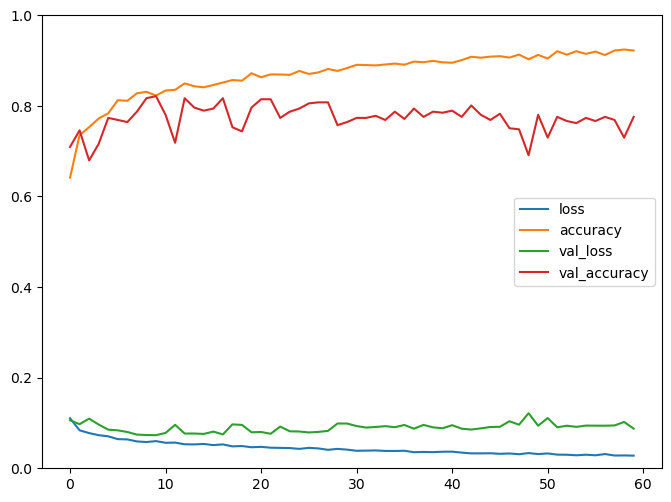

### Results auf test data ###
Accuracy for person  30 :  0.9017857142857143
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 11 17  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1089 - accuracy: 0.6512 - val_loss: 0.1170 - val_accuracy: 0.6407
Epoch 2/500
197/197 - 0s - loss: 0.0797 - accuracy: 0.7583 - val_loss: 0.1022 - val_accuracy: 0.7231
Epoch 3/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7733 - val_loss: 0.0998 - val_accuracy: 0.6751
Epoch 4/500
197/197 - 0s - loss: 0.0697 - accuracy: 0.7901 - val_loss: 0.1045 - val_accuracy: 0.6842
Epoch 5/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.7985 - val_loss: 0.0834 - val_accuracy: 0.7849
Epoch 6/500
197/197 - 0s - loss: 0.0629 - accuracy: 0.8062 - val_loss: 0.0936 - val_accuracy: 0.7254
Epoch 7/500
197/197 - 0s - loss: 0.0636 - accuracy: 0.8072 - val_loss: 0.0823 - val_accuracy: 0.7735
Epoch 8/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8278 - val_loss: 0.0858 - val_accuracy: 0.7826
Epoch 9/500
197/197 - 0s - loss: 0.0581 - accuracy: 0.8

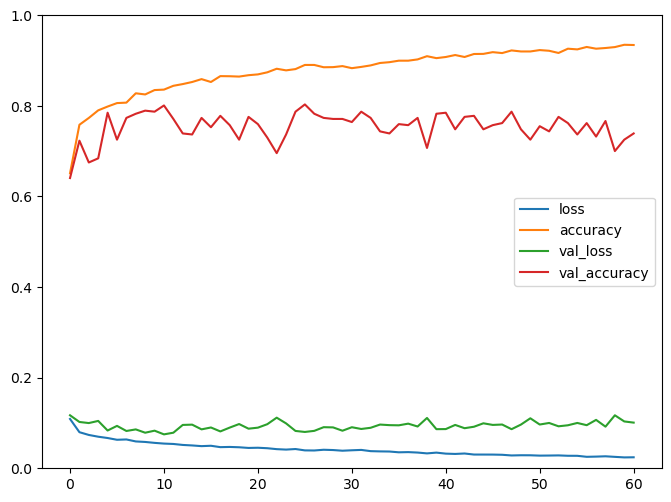

### Results auf test data ###
Accuracy for person  31 :  0.7589285714285714
[[24  4  0  0]
 [ 0 28  0  0]
 [ 0 23  5  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1093 - accuracy: 0.6495 - val_loss: 0.1119 - val_accuracy: 0.6590
Epoch 2/500
197/197 - 0s - loss: 0.0810 - accuracy: 0.7487 - val_loss: 0.1070 - val_accuracy: 0.6476
Epoch 3/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7741 - val_loss: 0.0997 - val_accuracy: 0.7117
Epoch 4/500
197/197 - 0s - loss: 0.0701 - accuracy: 0.7873 - val_loss: 0.0875 - val_accuracy: 0.7437
Epoch 5/500
197/197 - 0s - loss: 0.0669 - accuracy: 0.7967 - val_loss: 0.0847 - val_accuracy: 0.7780
Epoch 6/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.8046 - val_loss: 0.0974 - val_accuracy: 0.6773
Epoch 7/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8105 - val_loss: 0.0823 - val_accuracy: 0.7918
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8219 - val_loss: 0.0929 - val_accuracy: 0.7071
Epoch 9/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8

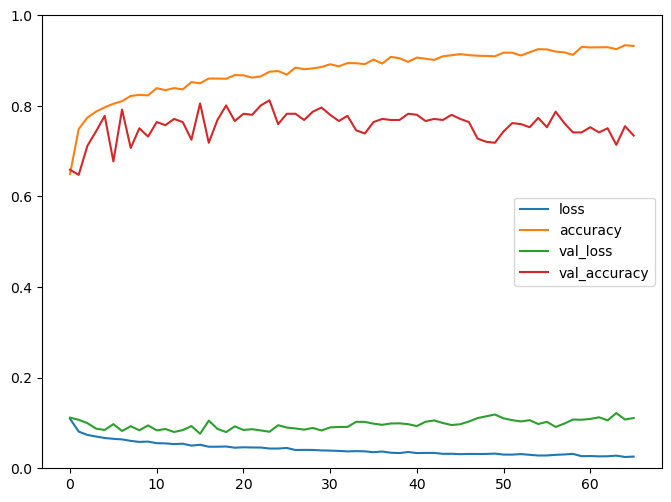

### Results auf test data ###
Accuracy for person  32 :  0.8392857142857143
[[14 13  1  0]
 [ 0 26  2  0]
 [ 0  2 26  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1081 - accuracy: 0.6563 - val_loss: 0.1042 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0806 - accuracy: 0.7530 - val_loss: 0.1053 - val_accuracy: 0.7048
Epoch 3/500
197/197 - 0s - loss: 0.0759 - accuracy: 0.7627 - val_loss: 0.1075 - val_accuracy: 0.6384
Epoch 4/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7922 - val_loss: 0.0922 - val_accuracy: 0.7460
Epoch 5/500
197/197 - 0s - loss: 0.0671 - accuracy: 0.7950 - val_loss: 0.0830 - val_accuracy: 0.7437
Epoch 6/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8153 - val_loss: 0.0789 - val_accuracy: 0.7895
Epoch 7/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8189 - val_loss: 0.0779 - val_accuracy: 0.7620
Epoch 8/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8207 - val_loss: 0.0771 - val_accuracy: 0.7757
Epoch 9/500
197/197 - 0s - loss: 0.0571 - accuracy: 0.8

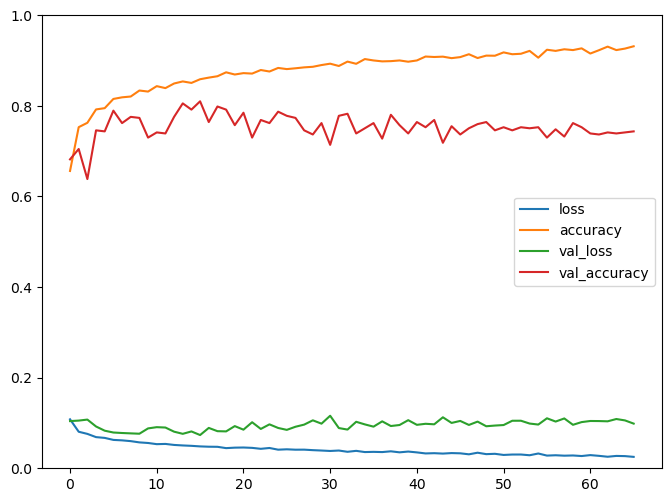

### Results auf test data ###
Accuracy for person  33 :  0.7589285714285714
[[28  0  0  0]
 [ 0 27  1  0]
 [12 14  2  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1104 - accuracy: 0.6523 - val_loss: 0.1147 - val_accuracy: 0.6728
Epoch 2/500
197/197 - 0s - loss: 0.0808 - accuracy: 0.7487 - val_loss: 0.1077 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0727 - accuracy: 0.7792 - val_loss: 0.1033 - val_accuracy: 0.6590
Epoch 4/500
197/197 - 0s - loss: 0.0689 - accuracy: 0.7934 - val_loss: 0.0879 - val_accuracy: 0.7574
Epoch 5/500
197/197 - 0s - loss: 0.0658 - accuracy: 0.8028 - val_loss: 0.0816 - val_accuracy: 0.7757
Epoch 6/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8166 - val_loss: 0.1012 - val_accuracy: 0.6865
Epoch 7/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8268 - val_loss: 0.0914 - val_accuracy: 0.7231
Epoch 8/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8311 - val_loss: 0.0852 - val_accuracy: 0.7666
Epoch 9/500
197/197 - 0s - loss: 0.0553 - accuracy: 0.8

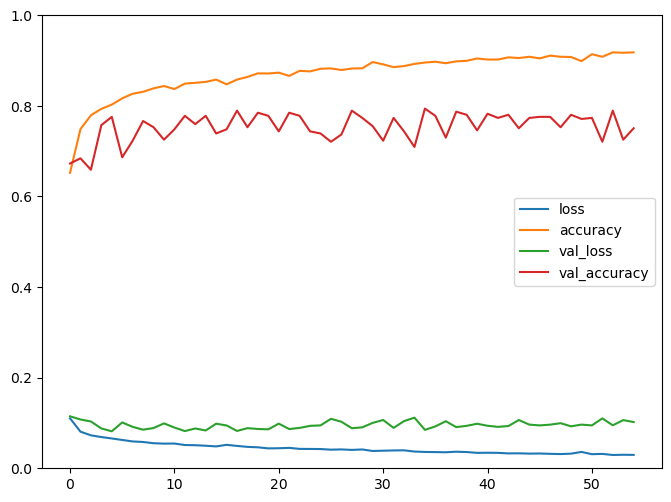

### Results auf test data ###
Accuracy for person  34 :  0.8125
[[26  0  2  0]
 [ 0 15 13  0]
 [ 0  6 22  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1125 - accuracy: 0.6372 - val_loss: 0.1110 - val_accuracy: 0.7277
Epoch 2/500
197/197 - 0s - loss: 0.0811 - accuracy: 0.7380 - val_loss: 0.1057 - val_accuracy: 0.6659
Epoch 3/500
197/197 - 0s - loss: 0.0758 - accuracy: 0.7736 - val_loss: 0.0855 - val_accuracy: 0.7529
Epoch 4/500
197/197 - 0s - loss: 0.0694 - accuracy: 0.7889 - val_loss: 0.0852 - val_accuracy: 0.7597
Epoch 5/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.7993 - val_loss: 0.0846 - val_accuracy: 0.7666
Epoch 6/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8133 - val_loss: 0.0881 - val_accuracy: 0.6979
Epoch 7/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8268 - val_loss: 0.0690 - val_accuracy: 0.7963
Epoch 8/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8268 - val_loss: 0.0790 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0574 - accuracy: 0.8293 - val_lo

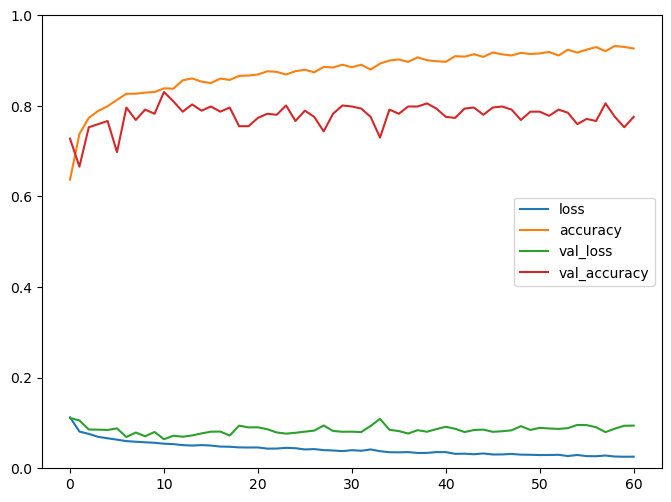

### Results auf test data ###
Accuracy for person  35 :  0.8035714285714286
[[20  0  8  0]
 [ 0 21  7  0]
 [ 0  2 26  0]
 [ 0  0  5 23]]
Epoch 1/500
197/197 - 0s - loss: 0.1092 - accuracy: 0.6632 - val_loss: 0.1161 - val_accuracy: 0.5973
Epoch 2/500
197/197 - 0s - loss: 0.0812 - accuracy: 0.7461 - val_loss: 0.1213 - val_accuracy: 0.6041
Epoch 3/500
197/197 - 0s - loss: 0.0752 - accuracy: 0.7693 - val_loss: 0.0964 - val_accuracy: 0.6728
Epoch 4/500
197/197 - 0s - loss: 0.0692 - accuracy: 0.7871 - val_loss: 0.0896 - val_accuracy: 0.7483
Epoch 5/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.7983 - val_loss: 0.0945 - val_accuracy: 0.7872
Epoch 6/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8044 - val_loss: 0.0961 - val_accuracy: 0.7162
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8115 - val_loss: 0.0798 - val_accuracy: 0.7780
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8191 - val_loss: 0.0925 - val_accuracy: 0.7483
Epoch 9/500
197/197 - 0s - loss: 0.0577 - accuracy: 0.8

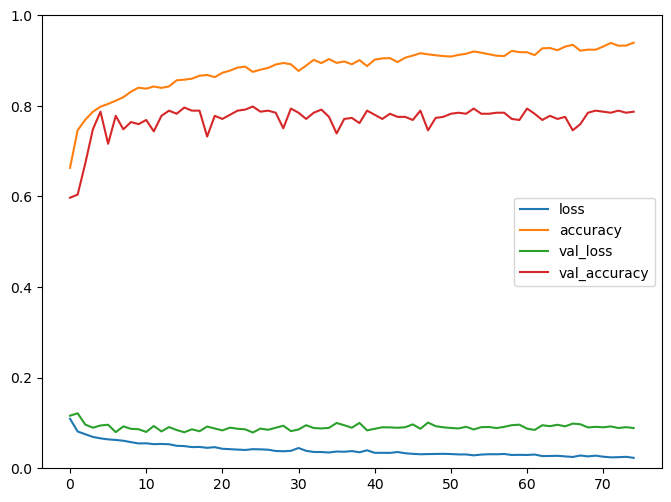

### Results auf test data ###
Accuracy for person  36 :  0.8839285714285714
[[27  1  0  0]
 [ 0 24  4  0]
 [ 0  8 20  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1123 - accuracy: 0.6436 - val_loss: 0.1156 - val_accuracy: 0.7071
Epoch 2/500
197/197 - 0s - loss: 0.0842 - accuracy: 0.7296 - val_loss: 0.1070 - val_accuracy: 0.7094
Epoch 3/500
197/197 - 0s - loss: 0.0762 - accuracy: 0.7596 - val_loss: 0.0967 - val_accuracy: 0.7300
Epoch 4/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7868 - val_loss: 0.0954 - val_accuracy: 0.6957
Epoch 5/500
197/197 - 0s - loss: 0.0663 - accuracy: 0.8016 - val_loss: 0.0950 - val_accuracy: 0.7185
Epoch 6/500
197/197 - 0s - loss: 0.0646 - accuracy: 0.8021 - val_loss: 0.0812 - val_accuracy: 0.8032
Epoch 7/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8077 - val_loss: 0.0842 - val_accuracy: 0.7666
Epoch 8/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8201 - val_loss: 0.0873 - val_accuracy: 0.7529
Epoch 9/500
197/197 - 0s - loss: 0.0583 - accuracy: 0.8

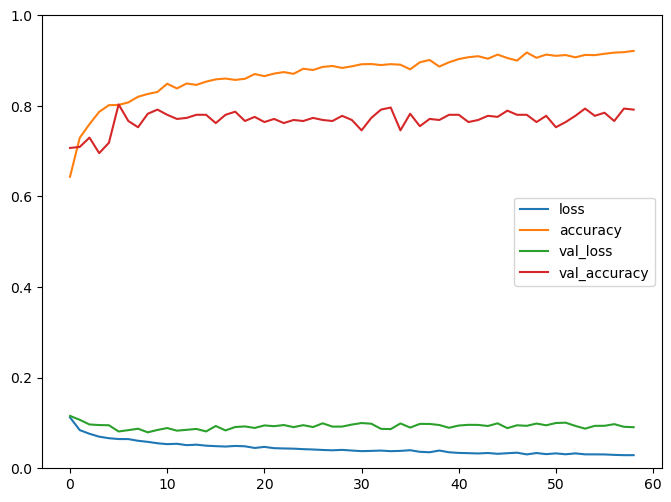

### Results auf test data ###
Accuracy for person  37 :  0.9642857142857143
[[28  0  0  0]
 [ 0 28  0  0]
 [ 3  1 24  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1093 - accuracy: 0.6517 - val_loss: 0.1024 - val_accuracy: 0.6865
Epoch 2/500
197/197 - 0s - loss: 0.0822 - accuracy: 0.7329 - val_loss: 0.0984 - val_accuracy: 0.7025
Epoch 3/500
197/197 - 0s - loss: 0.0754 - accuracy: 0.7733 - val_loss: 0.0828 - val_accuracy: 0.7826
Epoch 4/500
197/197 - 0s - loss: 0.0708 - accuracy: 0.7835 - val_loss: 0.0898 - val_accuracy: 0.7346
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.8018 - val_loss: 0.0843 - val_accuracy: 0.7551
Epoch 6/500
197/197 - 0s - loss: 0.0673 - accuracy: 0.7960 - val_loss: 0.0877 - val_accuracy: 0.7643
Epoch 7/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8128 - val_loss: 0.0740 - val_accuracy: 0.7963
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8240 - val_loss: 0.0777 - val_accuracy: 0.7780
Epoch 9/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8

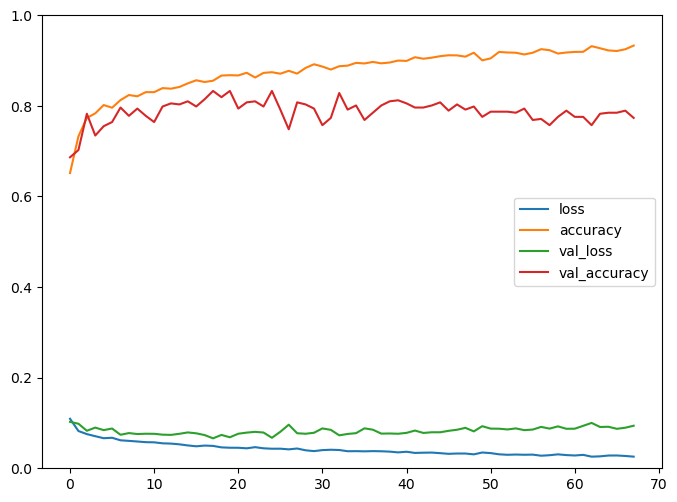

### Results auf test data ###
Accuracy for person  38 :  0.875
[[27  1  0  0]
 [ 0 16 12  0]
 [ 0  1 27  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1046 - accuracy: 0.6563 - val_loss: 0.0764 - val_accuracy: 0.7025
Epoch 2/500
197/197 - 0s - loss: 0.0800 - accuracy: 0.7515 - val_loss: 0.0651 - val_accuracy: 0.7803
Epoch 3/500
197/197 - 0s - loss: 0.0733 - accuracy: 0.7782 - val_loss: 0.0499 - val_accuracy: 0.8558
Epoch 4/500
197/197 - 0s - loss: 0.0705 - accuracy: 0.7807 - val_loss: 0.0436 - val_accuracy: 0.9130
Epoch 5/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7939 - val_loss: 0.0546 - val_accuracy: 0.8284
Epoch 6/500
197/197 - 0s - loss: 0.0663 - accuracy: 0.7947 - val_loss: 0.0497 - val_accuracy: 0.8490
Epoch 7/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8102 - val_loss: 0.0404 - val_accuracy: 0.9130
Epoch 8/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8173 - val_loss: 0.0487 - val_accuracy: 0.8375
Epoch 9/500
197/197 - 0s - loss: 0.0579 - accuracy: 0.8255 - val_los

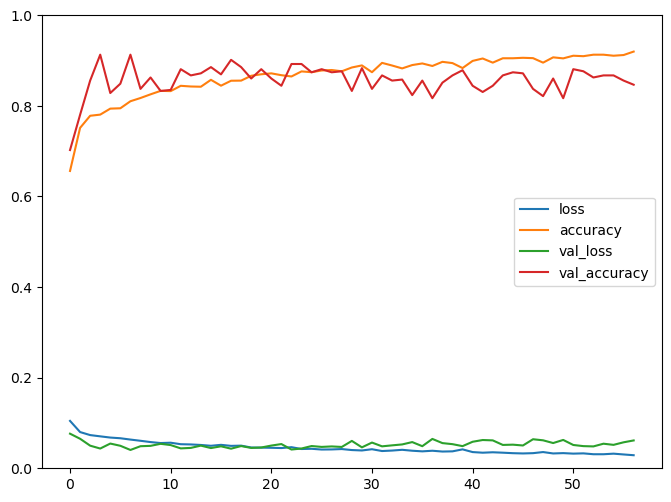

### Results auf test data ###
Accuracy for person  39 :  0.45535714285714285
[[10 18  0  0]
 [ 0 12  0 16]
 [ 0  8  1 19]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1074 - accuracy: 0.6568 - val_loss: 0.1153 - val_accuracy: 0.6316
Epoch 2/500
197/197 - 0s - loss: 0.0815 - accuracy: 0.7431 - val_loss: 0.1198 - val_accuracy: 0.5995
Epoch 3/500
197/197 - 0s - loss: 0.0747 - accuracy: 0.7672 - val_loss: 0.1034 - val_accuracy: 0.6568
Epoch 4/500
197/197 - 0s - loss: 0.0706 - accuracy: 0.7838 - val_loss: 0.0963 - val_accuracy: 0.7231
Epoch 5/500
197/197 - 0s - loss: 0.0684 - accuracy: 0.7945 - val_loss: 0.1018 - val_accuracy: 0.6911
Epoch 6/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8156 - val_loss: 0.0852 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8118 - val_loss: 0.0808 - val_accuracy: 0.7826
Epoch 8/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8237 - val_loss: 0.0794 - val_accuracy: 0.7941
Epoch 9/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.

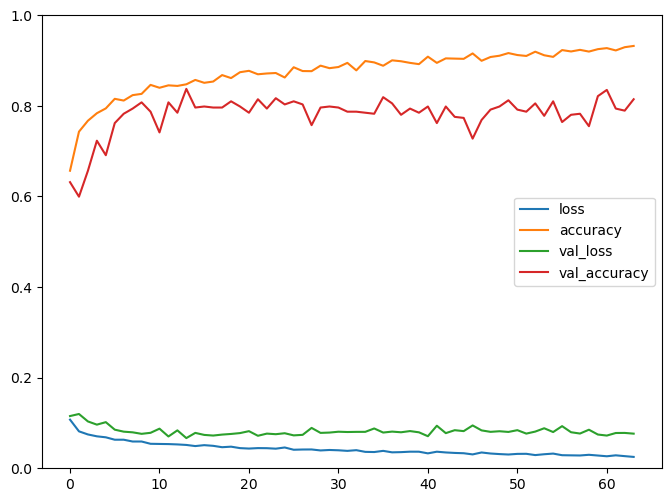

### Results auf test data ###
Accuracy for person  40 :  0.7767857142857143
[[28  0  0  0]
 [ 0 21  7  0]
 [ 4 14 10  0]
 [ 0  0  0 28]]

 ##### overall accuracy:  0.76875 #####


In [14]:
# Ergebnis auf b)
accuracies = testANN_b(hp_ann_small, n_attributes, n_classes)
results_b[0] = accuracies

In [15]:
np.mean(accuracies)

0.76875

In [16]:
# Lollipop plot

def lolli_plot(name):
    
    df_acc = pd.DataFrame({'Person': range(1,41), 'Accuracy': accuracies})
    df_acc_ordered = df_acc.sort_values(by='Accuracy')

    fig, ax = plt.subplots(figsize=(6, 10), dpi = 100)

    # horizontal lollipop chart
    ax.hlines(y=df_acc['Person'], xmin=0, xmax=df_acc_ordered['Accuracy'])
    ax.plot(df_acc_ordered['Accuracy'], df_acc['Person'], 'o')

    # annotations
    order = list(df_acc_ordered['Person']-1)

    for i, k in enumerate(order):
        ax.text(x=df_acc['Accuracy'][k]+0.05, y=df_acc['Person'][i]-0.3,
                s=round(df_acc['Accuracy'][k],2))

    ax.text(0.3, 38, 'mean accuracy:\n'+ str(round(np.mean(accuracies), 2)), 
            fontsize=14, ha='center', 
            bbox=dict(boxstyle="round4,pad=0.3", fc="w", ec="black", lw=1,))

    ## Add titles and axis names, ticks
    plt.xticks(np.arange(0, 1.1, 0.1))
    plt.yticks(df_acc['Person'], df_acc_ordered['Person'])

    plt.xlim(0, 1.15)
    plt.ylim(0, 41)

    plt.title(name + ' : Accuracies by Person (LOO-CV)', loc='left', fontsize=14)
    plt.xlabel('Accuracy')
    plt.ylabel('Person')

    # Show and save the plot
    plt.savefig('../pictures/'+name+'_accuracies.png', dpi = 200)
    plt.show()

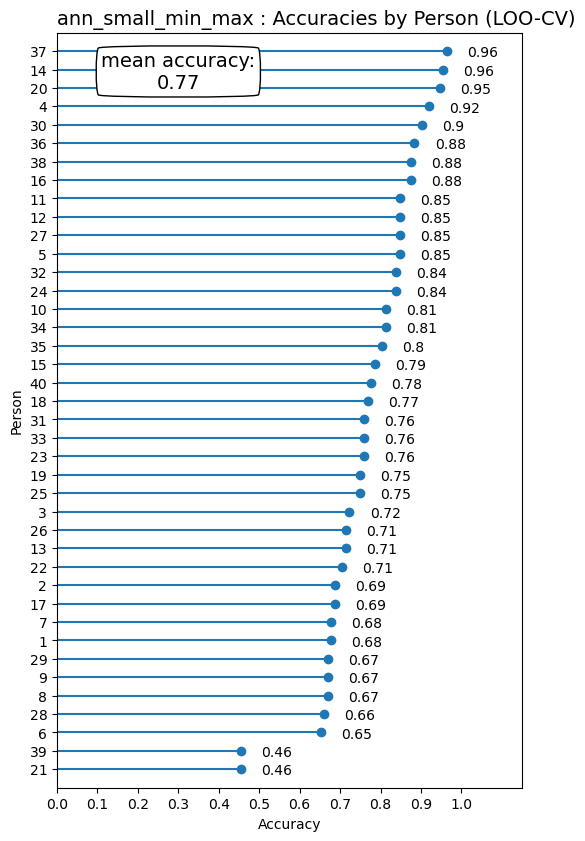

In [17]:
# Ergebnis auf b)

lolli_plot('ann_small_min_max')

### Großes Neuronales Netz mit MinMaxScaler (mit Keras Tuner optimiert)

In [18]:
hp_ann_big = {'units': 540, 'activation': 'relu', 'learning_rate': 0.001, 'nbr_hidden_layers': 3}

In [19]:
model_ann_big = createANN(hp_ann_big, n_attributes, n_classes)

Epoch 1/500
182/182 - 1s - loss: 0.1015 - accuracy: 0.6568 - val_loss: 0.0873 - val_accuracy: 0.6683
Epoch 2/500
182/182 - 0s - loss: 0.0834 - accuracy: 0.7340 - val_loss: 0.0798 - val_accuracy: 0.7698
Epoch 3/500
182/182 - 0s - loss: 0.0761 - accuracy: 0.7687 - val_loss: 0.0748 - val_accuracy: 0.7574
Epoch 4/500
182/182 - 0s - loss: 0.0683 - accuracy: 0.7985 - val_loss: 0.0815 - val_accuracy: 0.7475
Epoch 5/500
182/182 - 0s - loss: 0.0709 - accuracy: 0.7913 - val_loss: 0.0676 - val_accuracy: 0.7847
Epoch 6/500
182/182 - 0s - loss: 0.0642 - accuracy: 0.8071 - val_loss: 0.0641 - val_accuracy: 0.8094
Epoch 7/500
182/182 - 0s - loss: 0.0608 - accuracy: 0.8222 - val_loss: 0.0534 - val_accuracy: 0.8589
Epoch 8/500
182/182 - 0s - loss: 0.0602 - accuracy: 0.8228 - val_loss: 0.0479 - val_accuracy: 0.8614
Epoch 9/500
182/182 - 0s - loss: 0.0578 - accuracy: 0.8349 - val_loss: 0.0503 - val_accuracy: 0.8614
Epoch 10/500
182/182 - 0s - loss: 0.0573 - accuracy: 0.8360 - val_loss: 0.0618 - val_accura

Epoch 82/500
182/182 - 0s - loss: 0.0162 - accuracy: 0.9578 - val_loss: 0.0184 - val_accuracy: 0.9505
Epoch 83/500
182/182 - 0s - loss: 0.0133 - accuracy: 0.9647 - val_loss: 0.0192 - val_accuracy: 0.9480
Epoch 84/500
182/182 - 0s - loss: 0.0181 - accuracy: 0.9523 - val_loss: 0.0193 - val_accuracy: 0.9455
Epoch 85/500
182/182 - 0s - loss: 0.0129 - accuracy: 0.9647 - val_loss: 0.0188 - val_accuracy: 0.9455
Epoch 86/500
182/182 - 0s - loss: 0.0131 - accuracy: 0.9628 - val_loss: 0.0263 - val_accuracy: 0.9332
Epoch 87/500
182/182 - 0s - loss: 0.0173 - accuracy: 0.9518 - val_loss: 0.0219 - val_accuracy: 0.9332
Epoch 88/500
182/182 - 0s - loss: 0.0194 - accuracy: 0.9479 - val_loss: 0.0433 - val_accuracy: 0.8762
Epoch 89/500
182/182 - 0s - loss: 0.0197 - accuracy: 0.9449 - val_loss: 0.0190 - val_accuracy: 0.9455
Epoch 90/500
182/182 - 0s - loss: 0.0154 - accuracy: 0.9576 - val_loss: 0.0150 - val_accuracy: 0.9554
Epoch 91/500
182/182 - 0s - loss: 0.0137 - accuracy: 0.9625 - val_loss: 0.0207 - v

Epoch 162/500
182/182 - 0s - loss: 0.0062 - accuracy: 0.9835 - val_loss: 0.0163 - val_accuracy: 0.9554
Epoch 163/500
182/182 - 0s - loss: 0.0087 - accuracy: 0.9738 - val_loss: 0.0156 - val_accuracy: 0.9653
Epoch 164/500
182/182 - 0s - loss: 0.0075 - accuracy: 0.9799 - val_loss: 0.0098 - val_accuracy: 0.9703
Epoch 165/500
182/182 - 0s - loss: 0.0094 - accuracy: 0.9749 - val_loss: 0.0161 - val_accuracy: 0.9530
Epoch 166/500
182/182 - 0s - loss: 0.0079 - accuracy: 0.9788 - val_loss: 0.0090 - val_accuracy: 0.9802
Epoch 167/500
182/182 - 0s - loss: 0.0041 - accuracy: 0.9887 - val_loss: 0.0207 - val_accuracy: 0.9356
Epoch 168/500
182/182 - 0s - loss: 0.0076 - accuracy: 0.9793 - val_loss: 0.0092 - val_accuracy: 0.9728
Epoch 169/500
182/182 - 0s - loss: 0.0071 - accuracy: 0.9815 - val_loss: 0.0199 - val_accuracy: 0.9480
Epoch 170/500
182/182 - 0s - loss: 0.0097 - accuracy: 0.9735 - val_loss: 0.0171 - val_accuracy: 0.9604
Epoch 171/500
182/182 - 0s - loss: 0.0100 - accuracy: 0.9716 - val_loss: 

Epoch 242/500
182/182 - 0s - loss: 0.0030 - accuracy: 0.9937 - val_loss: 0.0120 - val_accuracy: 0.9629
Epoch 243/500
182/182 - 0s - loss: 0.0063 - accuracy: 0.9857 - val_loss: 0.0095 - val_accuracy: 0.9728
Epoch 244/500
182/182 - 0s - loss: 0.0056 - accuracy: 0.9854 - val_loss: 0.0158 - val_accuracy: 0.9629
Epoch 245/500
182/182 - 0s - loss: 0.0092 - accuracy: 0.9771 - val_loss: 0.0139 - val_accuracy: 0.9703
Epoch 246/500
182/182 - 0s - loss: 0.0094 - accuracy: 0.9768 - val_loss: 0.0237 - val_accuracy: 0.9455
Epoch 247/500
182/182 - 0s - loss: 0.0102 - accuracy: 0.9735 - val_loss: 0.0245 - val_accuracy: 0.9332
Model: "sequential_41"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_540nodes (Dense)     (None, 540)               288360    
_________________________________________________________________
hidden1_540nodes (Dense)     (None, 540)               292140    
_____________________________

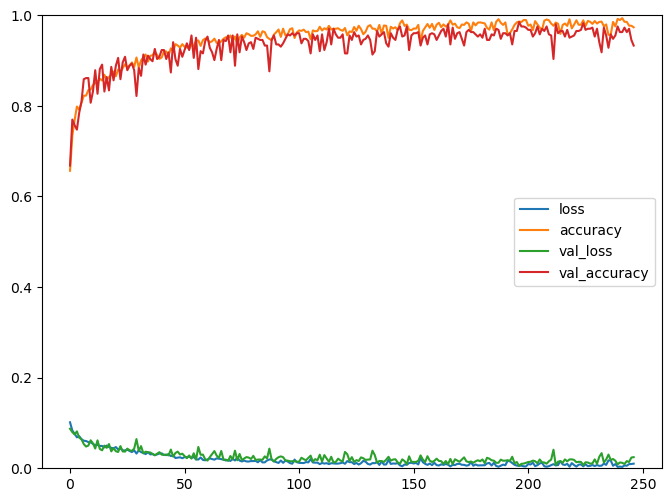

In [20]:
trainANN(model_ann_big, hp_ann_big, train_data, train_labels)

In [21]:
# Ergebnis auf a)

acc = testANN_a(model_ann_big)
results_a[1] = acc

######## Results auf test data #########
Accuracy (test):  0.9642857142857143
[[107   0   0   0]
 [  0  98  10   0]
 [  0   5 101   0]
 [  0   0   1 126]]


Epoch 1/500
197/197 - 0s - loss: 0.0971 - accuracy: 0.6830 - val_loss: 0.1178 - val_accuracy: 0.6247
Epoch 2/500
197/197 - 0s - loss: 0.0823 - accuracy: 0.7370 - val_loss: 0.0993 - val_accuracy: 0.6888
Epoch 3/500
197/197 - 0s - loss: 0.0759 - accuracy: 0.7690 - val_loss: 0.1048 - val_accuracy: 0.6796
Epoch 4/500
197/197 - 0s - loss: 0.0705 - accuracy: 0.7939 - val_loss: 0.1112 - val_accuracy: 0.7346
Epoch 5/500
197/197 - 0s - loss: 0.0670 - accuracy: 0.7955 - val_loss: 0.1074 - val_accuracy: 0.6751
Epoch 6/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8130 - val_loss: 0.1020 - val_accuracy: 0.7437
Epoch 7/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8242 - val_loss: 0.0991 - val_accuracy: 0.7643
Epoch 8/500
197/197 - 0s - loss: 0.0576 - accuracy: 0.8257 - val_loss: 0.0935 - val_accuracy: 0.7620
Epoch 9/500
197/197 - 0s - loss: 0.0554 - accuracy: 0.8374 - val_loss: 0.0990 - val_accuracy: 0.7529
Epoch 10/500
197/197 - 0s - loss: 0.0545 - accuracy: 0.8423 - val_loss: 0.0964 - val_accura

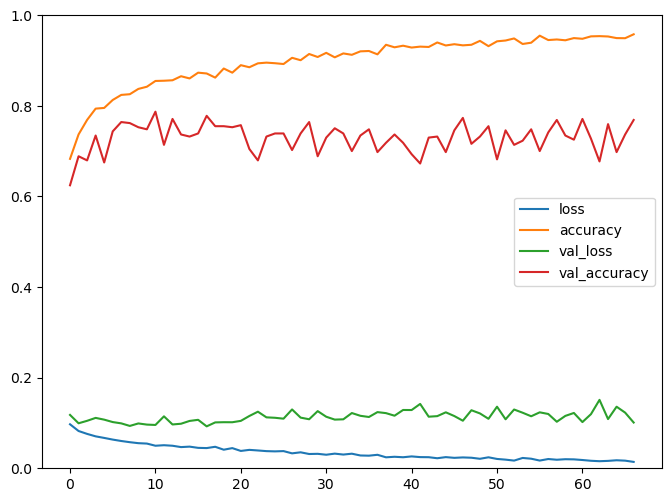

### Results auf test data ###
Accuracy for person  1 :  0.75
[[15  6  7  0]
 [ 0 13 15  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0973 - accuracy: 0.6731 - val_loss: 0.1221 - val_accuracy: 0.6865
Epoch 2/500
197/197 - 0s - loss: 0.0840 - accuracy: 0.7354 - val_loss: 0.1174 - val_accuracy: 0.6682
Epoch 3/500
197/197 - 0s - loss: 0.0759 - accuracy: 0.7632 - val_loss: 0.1140 - val_accuracy: 0.6682
Epoch 4/500
197/197 - 0s - loss: 0.0700 - accuracy: 0.7937 - val_loss: 0.0969 - val_accuracy: 0.7643
Epoch 5/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.8011 - val_loss: 0.1008 - val_accuracy: 0.7643
Epoch 6/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7937 - val_loss: 0.0857 - val_accuracy: 0.8032
Epoch 7/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8268 - val_loss: 0.0927 - val_accuracy: 0.7735
Epoch 8/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8235 - val_loss: 0.1029 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8161 - val_loss:

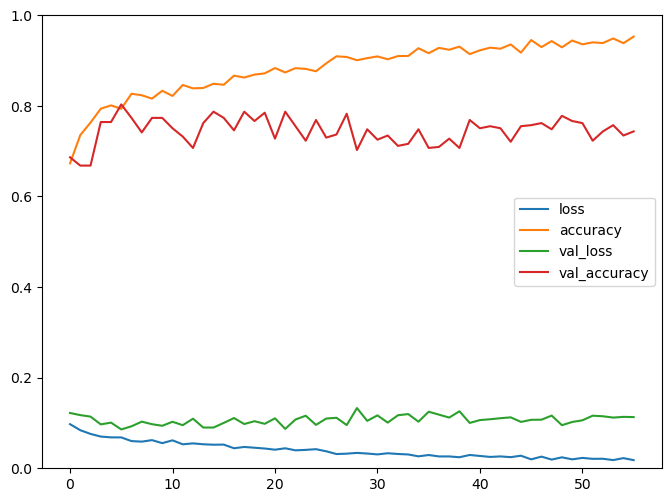

### Results auf test data ###
Accuracy for person  2 :  0.7232142857142857
[[13  0 15  0]
 [ 0 12 16  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1010 - accuracy: 0.6586 - val_loss: 0.0993 - val_accuracy: 0.6888
Epoch 2/500
197/197 - 0s - loss: 0.0843 - accuracy: 0.7326 - val_loss: 0.1162 - val_accuracy: 0.6453
Epoch 3/500
197/197 - 0s - loss: 0.0776 - accuracy: 0.7599 - val_loss: 0.1310 - val_accuracy: 0.6247
Epoch 4/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7924 - val_loss: 0.0910 - val_accuracy: 0.7506
Epoch 5/500
197/197 - 0s - loss: 0.0718 - accuracy: 0.7774 - val_loss: 0.1155 - val_accuracy: 0.7002
Epoch 6/500
197/197 - 0s - loss: 0.0646 - accuracy: 0.8034 - val_loss: 0.0999 - val_accuracy: 0.7551
Epoch 7/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8194 - val_loss: 0.1032 - val_accuracy: 0.7300
Epoch 8/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8199 - val_loss: 0.0949 - val_accuracy: 0.7803
Epoch 9/500
197/197 - 0s - loss: 0.0584 - accuracy: 0.83

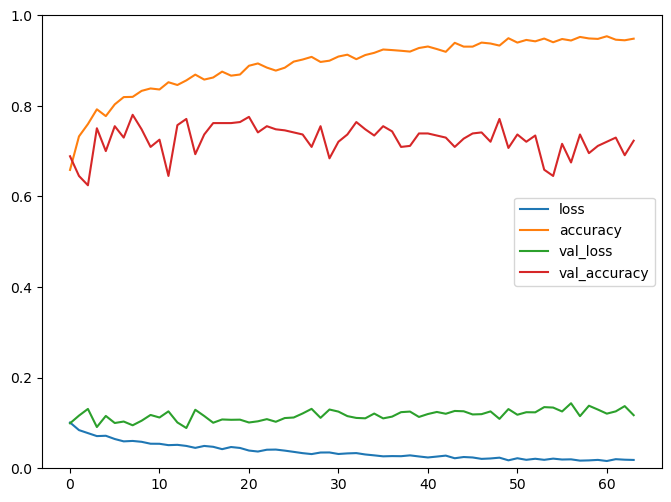

### Results auf test data ###
Accuracy for person  3 :  0.6339285714285714
[[ 4 24  0  0]
 [ 0 28  0  0]
 [ 0 17 11  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0996 - accuracy: 0.6662 - val_loss: 0.1028 - val_accuracy: 0.7002
Epoch 2/500
197/197 - 0s - loss: 0.0838 - accuracy: 0.7321 - val_loss: 0.1004 - val_accuracy: 0.6316
Epoch 3/500
197/197 - 0s - loss: 0.0804 - accuracy: 0.7550 - val_loss: 0.1215 - val_accuracy: 0.6522
Epoch 4/500
197/197 - 0s - loss: 0.0757 - accuracy: 0.7675 - val_loss: 0.0933 - val_accuracy: 0.7300
Epoch 5/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7896 - val_loss: 0.0955 - val_accuracy: 0.7117
Epoch 6/500
197/197 - 0s - loss: 0.0646 - accuracy: 0.8028 - val_loss: 0.0945 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0645 - accuracy: 0.8100 - val_loss: 0.0771 - val_accuracy: 0.7986
Epoch 8/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8158 - val_loss: 0.0785 - val_accuracy: 0.7803
Epoch 9/500
197/197 - 0s - loss: 0.0574 - accuracy: 0.83

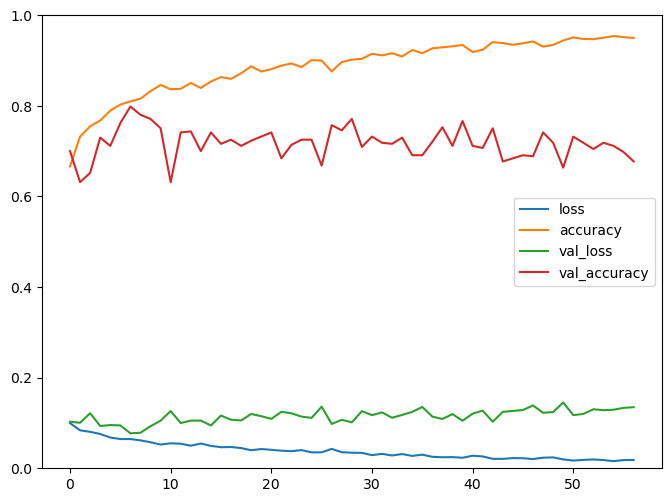

### Results auf test data ###
Accuracy for person  4 :  0.75
[[28  0  0  0]
 [22  6  0  0]
 [ 2  0 26  0]
 [ 0  0  4 24]]
Epoch 1/500
197/197 - 0s - loss: 0.0996 - accuracy: 0.6609 - val_loss: 0.1063 - val_accuracy: 0.6453
Epoch 2/500
197/197 - 0s - loss: 0.0827 - accuracy: 0.7319 - val_loss: 0.1094 - val_accuracy: 0.6819
Epoch 3/500
197/197 - 0s - loss: 0.0773 - accuracy: 0.7647 - val_loss: 0.1008 - val_accuracy: 0.6888
Epoch 4/500
197/197 - 0s - loss: 0.0685 - accuracy: 0.7856 - val_loss: 0.1206 - val_accuracy: 0.6568
Epoch 5/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8092 - val_loss: 0.1178 - val_accuracy: 0.6545
Epoch 6/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8135 - val_loss: 0.0955 - val_accuracy: 0.7689
Epoch 7/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8196 - val_loss: 0.1027 - val_accuracy: 0.7483
Epoch 8/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8158 - val_loss: 0.1076 - val_accuracy: 0.7185
Epoch 9/500
197/197 - 0s - loss: 0.0567 - accuracy: 0.8306 - val_loss:

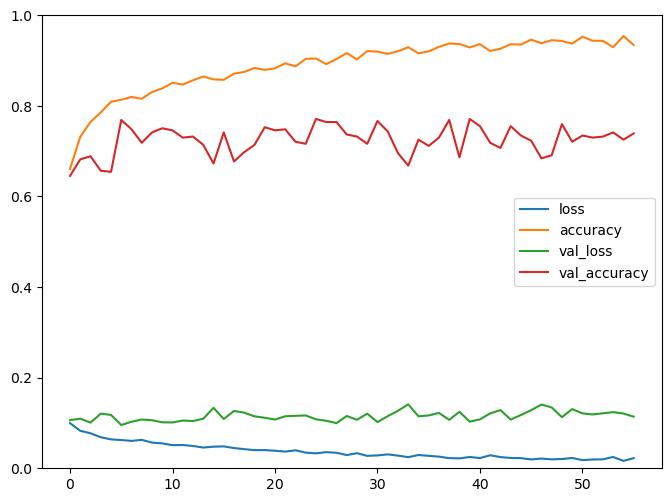

### Results auf test data ###
Accuracy for person  5 :  0.9107142857142857
[[25  3  0  0]
 [ 0 21  7  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0998 - accuracy: 0.6629 - val_loss: 0.1193 - val_accuracy: 0.6293
Epoch 2/500
197/197 - 0s - loss: 0.0875 - accuracy: 0.7189 - val_loss: 0.1078 - val_accuracy: 0.7117
Epoch 3/500
197/197 - 0s - loss: 0.0752 - accuracy: 0.7677 - val_loss: 0.1133 - val_accuracy: 0.7002
Epoch 4/500
197/197 - 0s - loss: 0.0711 - accuracy: 0.7899 - val_loss: 0.0967 - val_accuracy: 0.7483
Epoch 5/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7947 - val_loss: 0.1121 - val_accuracy: 0.6888
Epoch 6/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.8016 - val_loss: 0.0983 - val_accuracy: 0.7712
Epoch 7/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8189 - val_loss: 0.0967 - val_accuracy: 0.7597
Epoch 8/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8293 - val_loss: 0.1083 - val_accuracy: 0.7323
Epoch 9/500
197/197 - 0s - loss: 0.0548 - accuracy: 0.83

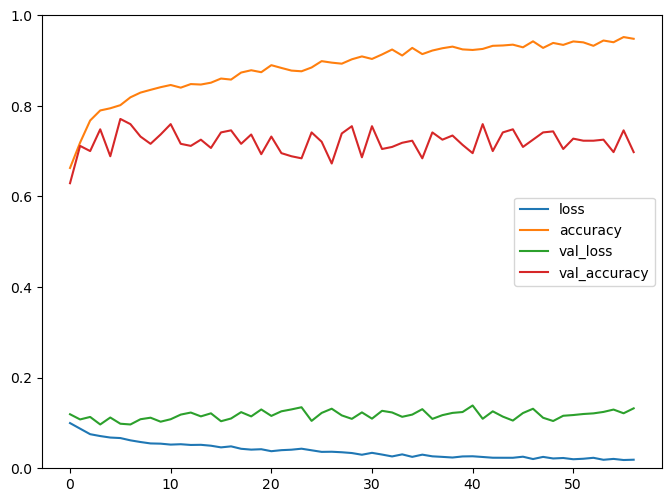

### Results auf test data ###
Accuracy for person  6 :  0.5625
[[28  0  0  0]
 [22  6  0  0]
 [22  5  1  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0990 - accuracy: 0.6581 - val_loss: 0.1091 - val_accuracy: 0.6979
Epoch 2/500
197/197 - 0s - loss: 0.0847 - accuracy: 0.7283 - val_loss: 0.1208 - val_accuracy: 0.6407
Epoch 3/500
197/197 - 0s - loss: 0.0820 - accuracy: 0.7354 - val_loss: 0.1124 - val_accuracy: 0.6545
Epoch 4/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7934 - val_loss: 0.1018 - val_accuracy: 0.7208
Epoch 5/500
197/197 - 0s - loss: 0.0719 - accuracy: 0.7777 - val_loss: 0.0968 - val_accuracy: 0.7437
Epoch 6/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8161 - val_loss: 0.0902 - val_accuracy: 0.7986
Epoch 7/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8204 - val_loss: 0.1057 - val_accuracy: 0.7551
Epoch 8/500
197/197 - 0s - loss: 0.0558 - accuracy: 0.8374 - val_loss: 0.1018 - val_accuracy: 0.7460
Epoch 9/500
197/197 - 0s - loss: 0.0581 - accuracy: 0.8250 - val_los

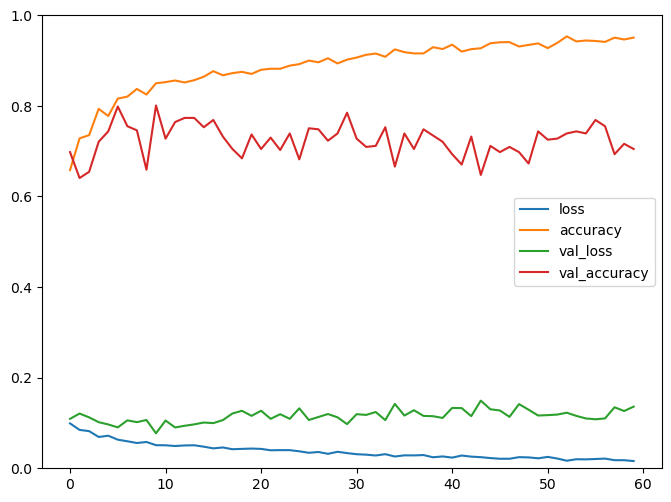

### Results auf test data ###
Accuracy for person  7 :  0.7142857142857143
[[24  0  4  0]
 [ 0 23  5  0]
 [ 7 13  8  0]
 [ 0  3  0 25]]
Epoch 1/500
197/197 - 0s - loss: 0.1030 - accuracy: 0.6454 - val_loss: 0.1274 - val_accuracy: 0.6087
Epoch 2/500
197/197 - 0s - loss: 0.0895 - accuracy: 0.7024 - val_loss: 0.1130 - val_accuracy: 0.5995
Epoch 3/500
197/197 - 0s - loss: 0.0798 - accuracy: 0.7499 - val_loss: 0.1068 - val_accuracy: 0.6979
Epoch 4/500
197/197 - 0s - loss: 0.0741 - accuracy: 0.7802 - val_loss: 0.1038 - val_accuracy: 0.7162
Epoch 5/500
197/197 - 0s - loss: 0.0684 - accuracy: 0.7952 - val_loss: 0.1027 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8245 - val_loss: 0.1234 - val_accuracy: 0.6934
Epoch 7/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8235 - val_loss: 0.1082 - val_accuracy: 0.7025
Epoch 8/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.8204 - val_loss: 0.1071 - val_accuracy: 0.7048
Epoch 9/500
197/197 - 0s - loss: 0.0528 - accuracy: 0.84

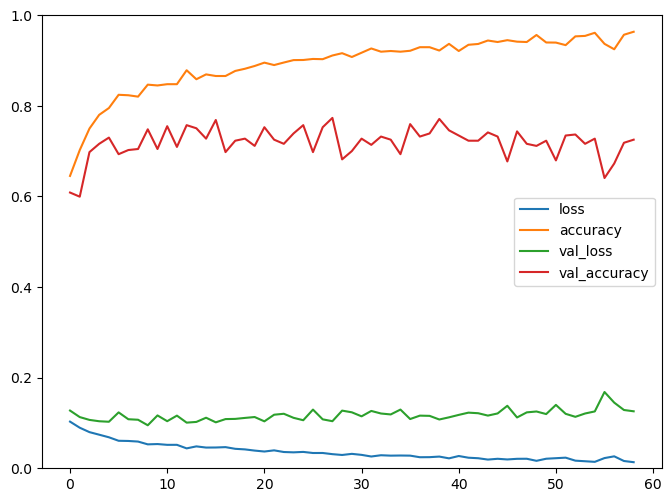

### Results auf test data ###
Accuracy for person  8 :  0.7053571428571429
[[23  5  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1031 - accuracy: 0.6456 - val_loss: 0.1046 - val_accuracy: 0.7323
Epoch 2/500
197/197 - 0s - loss: 0.0840 - accuracy: 0.7344 - val_loss: 0.1040 - val_accuracy: 0.6636
Epoch 3/500
197/197 - 0s - loss: 0.0766 - accuracy: 0.7642 - val_loss: 0.0943 - val_accuracy: 0.7323
Epoch 4/500
197/197 - 0s - loss: 0.0707 - accuracy: 0.7850 - val_loss: 0.1031 - val_accuracy: 0.7162
Epoch 5/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8031 - val_loss: 0.0998 - val_accuracy: 0.7277
Epoch 6/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8194 - val_loss: 0.0929 - val_accuracy: 0.7551
Epoch 7/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8156 - val_loss: 0.1050 - val_accuracy: 0.7162
Epoch 8/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.8189 - val_loss: 0.0859 - val_accuracy: 0.7849
Epoch 9/500
197/197 - 0s - loss: 0.0544 - accuracy: 0.84

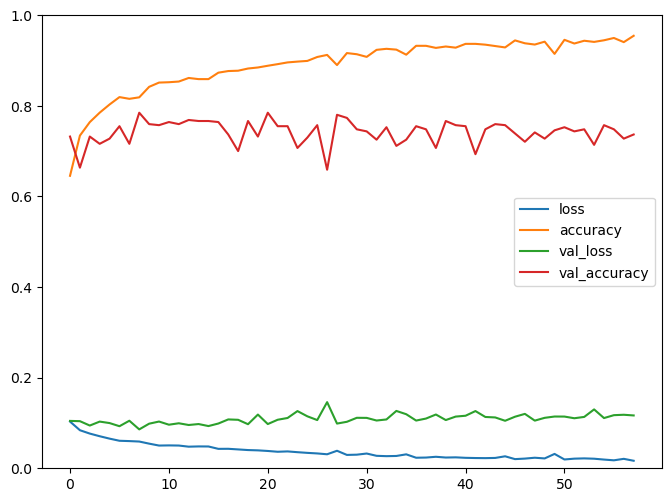

### Results auf test data ###
Accuracy for person  9 :  0.6696428571428571
[[25  0  3  0]
 [15 13  0  0]
 [ 7 12  9  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0987 - accuracy: 0.6662 - val_loss: 0.1139 - val_accuracy: 0.6407
Epoch 2/500
197/197 - 0s - loss: 0.0830 - accuracy: 0.7319 - val_loss: 0.0922 - val_accuracy: 0.7551
Epoch 3/500
197/197 - 0s - loss: 0.0746 - accuracy: 0.7736 - val_loss: 0.1008 - val_accuracy: 0.7231
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7904 - val_loss: 0.0999 - val_accuracy: 0.7529
Epoch 5/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8186 - val_loss: 0.1079 - val_accuracy: 0.7071
Epoch 6/500
197/197 - 0s - loss: 0.0629 - accuracy: 0.8102 - val_loss: 0.1142 - val_accuracy: 0.6773
Epoch 7/500
197/197 - 0s - loss: 0.0576 - accuracy: 0.8288 - val_loss: 0.1165 - val_accuracy: 0.6682
Epoch 8/500
197/197 - 0s - loss: 0.0571 - accuracy: 0.8321 - val_loss: 0.1099 - val_accuracy: 0.7323
Epoch 9/500
197/197 - 0s - loss: 0.0552 - accuracy: 0.83

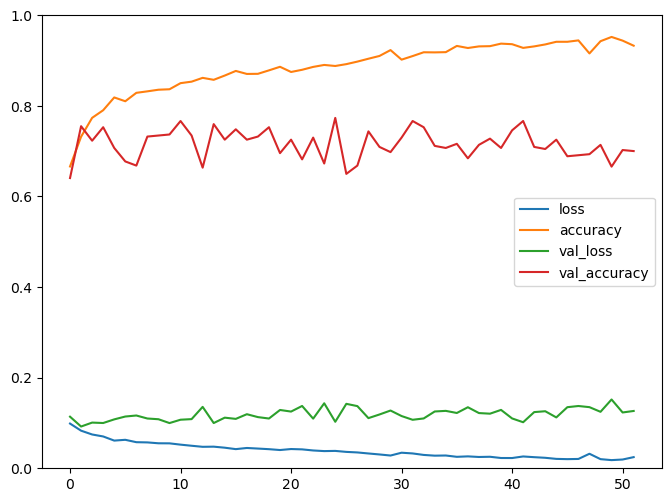

### Results auf test data ###
Accuracy for person  10 :  0.6875
[[18  9  1  0]
 [ 0 28  0  0]
 [ 0 21  7  0]
 [ 0  4  0 24]]
Epoch 1/500
197/197 - 0s - loss: 0.1008 - accuracy: 0.6660 - val_loss: 0.1325 - val_accuracy: 0.6087
Epoch 2/500
197/197 - 0s - loss: 0.0865 - accuracy: 0.7222 - val_loss: 0.1236 - val_accuracy: 0.6682
Epoch 3/500
197/197 - 0s - loss: 0.0759 - accuracy: 0.7700 - val_loss: 0.0940 - val_accuracy: 0.7689
Epoch 4/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7718 - val_loss: 0.1152 - val_accuracy: 0.7231
Epoch 5/500
197/197 - 0s - loss: 0.0696 - accuracy: 0.7906 - val_loss: 0.1008 - val_accuracy: 0.7529
Epoch 6/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8105 - val_loss: 0.0934 - val_accuracy: 0.7735
Epoch 7/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.7995 - val_loss: 0.1124 - val_accuracy: 0.7025
Epoch 8/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8212 - val_loss: 0.1022 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0584 - accuracy: 0.8229 - val_lo

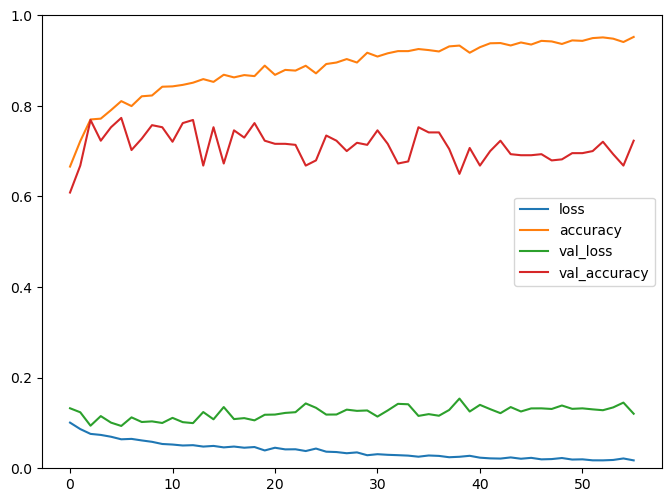

### Results auf test data ###
Accuracy for person  11 :  0.7946428571428571
[[18 10  0  0]
 [ 0 28  0  0]
 [ 0 13 15  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0976 - accuracy: 0.6825 - val_loss: 0.1145 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0806 - accuracy: 0.7512 - val_loss: 0.1029 - val_accuracy: 0.7231
Epoch 3/500
197/197 - 0s - loss: 0.0765 - accuracy: 0.7614 - val_loss: 0.0912 - val_accuracy: 0.7437
Epoch 4/500
197/197 - 0s - loss: 0.0700 - accuracy: 0.7881 - val_loss: 0.1047 - val_accuracy: 0.7346
Epoch 5/500
197/197 - 0s - loss: 0.0677 - accuracy: 0.7906 - val_loss: 0.0962 - val_accuracy: 0.7323
Epoch 6/500
197/197 - 0s - loss: 0.0658 - accuracy: 0.8016 - val_loss: 0.0902 - val_accuracy: 0.7666
Epoch 7/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8214 - val_loss: 0.1019 - val_accuracy: 0.7620
Epoch 8/500
197/197 - 0s - loss: 0.0574 - accuracy: 0.8285 - val_loss: 0.0874 - val_accuracy: 0.7620
Epoch 9/500
197/197 - 0s - loss: 0.0565 - accuracy: 0.8

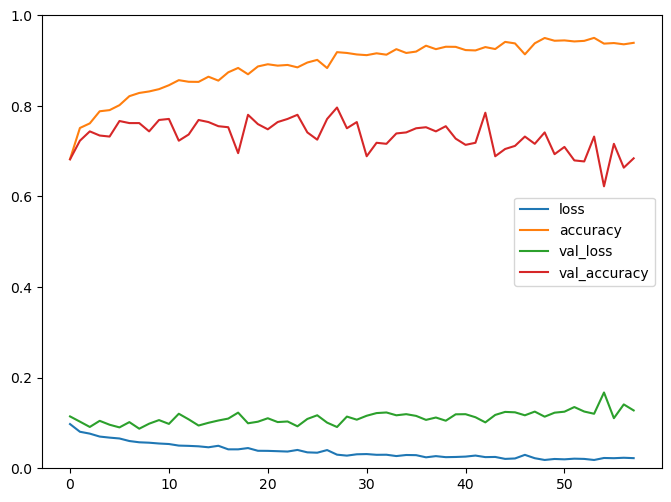

### Results auf test data ###
Accuracy for person  12 :  0.9017857142857143
[[22  6  0  0]
 [ 0 28  0  0]
 [ 0  5 23  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1000 - accuracy: 0.6589 - val_loss: 0.1150 - val_accuracy: 0.6751
Epoch 2/500
197/197 - 0s - loss: 0.0832 - accuracy: 0.7408 - val_loss: 0.1102 - val_accuracy: 0.6934
Epoch 3/500
197/197 - 0s - loss: 0.0763 - accuracy: 0.7639 - val_loss: 0.1018 - val_accuracy: 0.7643
Epoch 4/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7945 - val_loss: 0.1236 - val_accuracy: 0.6087
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7906 - val_loss: 0.0913 - val_accuracy: 0.7414
Epoch 6/500
197/197 - 0s - loss: 0.0646 - accuracy: 0.8092 - val_loss: 0.1018 - val_accuracy: 0.7231
Epoch 7/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8263 - val_loss: 0.1032 - val_accuracy: 0.7666
Epoch 8/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8204 - val_loss: 0.1057 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0550 - accuracy: 0.8

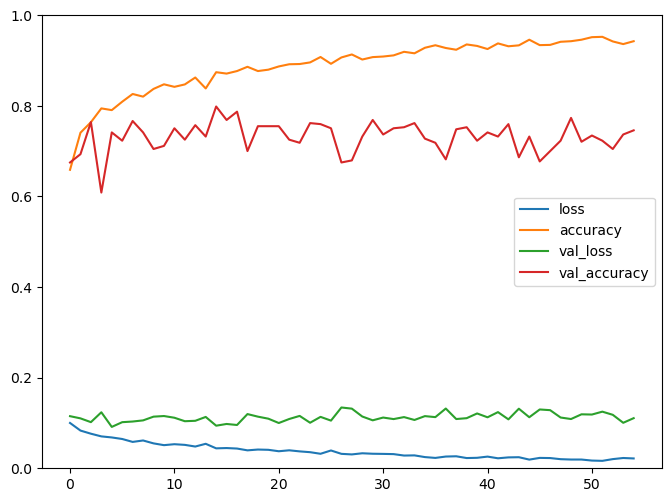

### Results auf test data ###
Accuracy for person  13 :  0.7767857142857143
[[28  0  0  0]
 [ 1 27  0  0]
 [ 7 16  5  0]
 [ 0  1  0 27]]
Epoch 1/500
197/197 - 0s - loss: 0.1020 - accuracy: 0.6599 - val_loss: 0.1168 - val_accuracy: 0.6339
Epoch 2/500
197/197 - 0s - loss: 0.0823 - accuracy: 0.7421 - val_loss: 0.1217 - val_accuracy: 0.6636
Epoch 3/500
197/197 - 0s - loss: 0.0740 - accuracy: 0.7746 - val_loss: 0.1199 - val_accuracy: 0.7071
Epoch 4/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7756 - val_loss: 0.1269 - val_accuracy: 0.6316
Epoch 5/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7889 - val_loss: 0.1011 - val_accuracy: 0.7643
Epoch 6/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8054 - val_loss: 0.1032 - val_accuracy: 0.7208
Epoch 7/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8263 - val_loss: 0.1254 - val_accuracy: 0.6773
Epoch 8/500
197/197 - 0s - loss: 0.0581 - accuracy: 0.8237 - val_loss: 0.0978 - val_accuracy: 0.7666
Epoch 9/500
197/197 - 0s - loss: 0.0545 - accuracy: 0.8

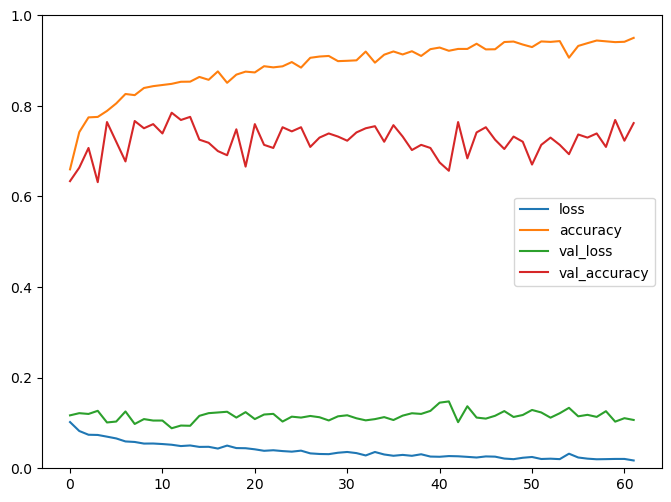

### Results auf test data ###
Accuracy for person  14 :  0.9375
[[28  0  0  0]
 [ 0 22  6  0]
 [ 0  1 27  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0993 - accuracy: 0.6637 - val_loss: 0.1148 - val_accuracy: 0.6613
Epoch 2/500
197/197 - 0s - loss: 0.0835 - accuracy: 0.7362 - val_loss: 0.0925 - val_accuracy: 0.7323
Epoch 3/500
197/197 - 0s - loss: 0.0731 - accuracy: 0.7751 - val_loss: 0.0816 - val_accuracy: 0.7620
Epoch 4/500
197/197 - 0s - loss: 0.0769 - accuracy: 0.7700 - val_loss: 0.0946 - val_accuracy: 0.6819
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7988 - val_loss: 0.0941 - val_accuracy: 0.7483
Epoch 6/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8123 - val_loss: 0.0859 - val_accuracy: 0.7712
Epoch 7/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.8273 - val_loss: 0.0970 - val_accuracy: 0.7735
Epoch 8/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8247 - val_loss: 0.1098 - val_accuracy: 0.7346
Epoch 9/500
197/197 - 0s - loss: 0.0531 - accuracy: 0.8428 - val_lo

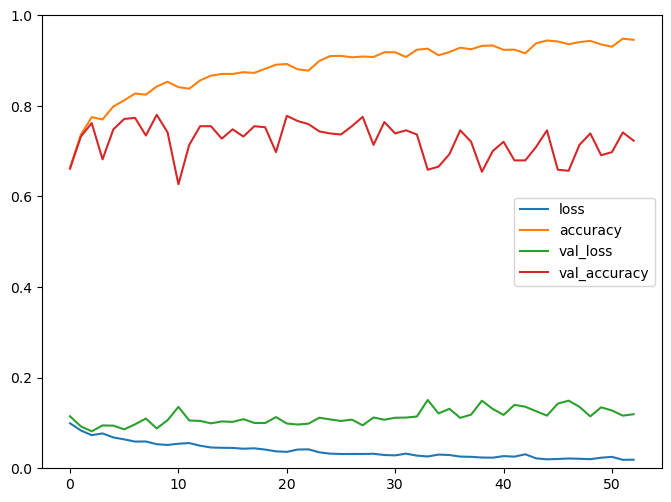

### Results auf test data ###
Accuracy for person  15 :  0.7589285714285714
[[23  1  4  0]
 [ 7 18  3  0]
 [ 0  9 19  0]
 [ 0  1  2 25]]
Epoch 1/500
197/197 - 0s - loss: 0.1024 - accuracy: 0.6525 - val_loss: 0.1201 - val_accuracy: 0.6476
Epoch 2/500
197/197 - 0s - loss: 0.0845 - accuracy: 0.7278 - val_loss: 0.1147 - val_accuracy: 0.6682
Epoch 3/500
197/197 - 0s - loss: 0.0755 - accuracy: 0.7700 - val_loss: 0.1055 - val_accuracy: 0.7574
Epoch 4/500
197/197 - 0s - loss: 0.0694 - accuracy: 0.7901 - val_loss: 0.0780 - val_accuracy: 0.7620
Epoch 5/500
197/197 - 0s - loss: 0.0707 - accuracy: 0.7896 - val_loss: 0.1087 - val_accuracy: 0.6362
Epoch 6/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.8041 - val_loss: 0.1183 - val_accuracy: 0.7071
Epoch 7/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8148 - val_loss: 0.1055 - val_accuracy: 0.7620
Epoch 8/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8173 - val_loss: 0.0954 - val_accuracy: 0.7712
Epoch 9/500
197/197 - 0s - loss: 0.0564 - accuracy: 0.8

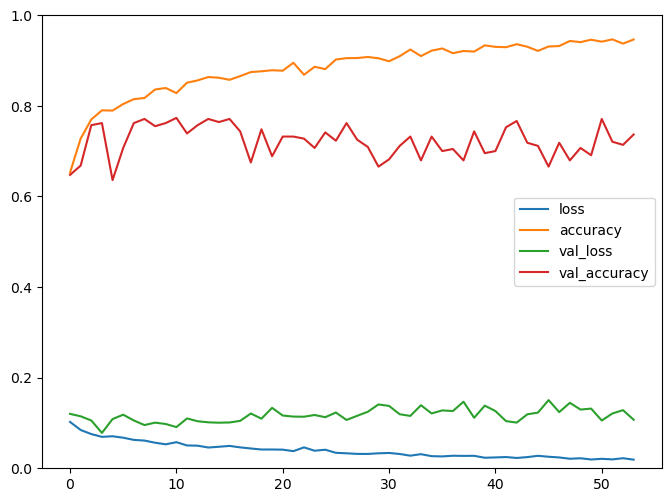

### Results auf test data ###
Accuracy for person  16 :  0.7857142857142857
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 22  6  0]
 [ 0  0  2 26]]
Epoch 1/500
197/197 - 0s - loss: 0.1008 - accuracy: 0.6642 - val_loss: 0.1384 - val_accuracy: 0.5927
Epoch 2/500
197/197 - 0s - loss: 0.0832 - accuracy: 0.7281 - val_loss: 0.1079 - val_accuracy: 0.7574
Epoch 3/500
197/197 - 0s - loss: 0.0770 - accuracy: 0.7560 - val_loss: 0.0978 - val_accuracy: 0.7529
Epoch 4/500
197/197 - 0s - loss: 0.0692 - accuracy: 0.7891 - val_loss: 0.1302 - val_accuracy: 0.6430
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.8062 - val_loss: 0.0919 - val_accuracy: 0.7506
Epoch 6/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8130 - val_loss: 0.1115 - val_accuracy: 0.6842
Epoch 7/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8255 - val_loss: 0.1061 - val_accuracy: 0.7346
Epoch 8/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8201 - val_loss: 0.1064 - val_accuracy: 0.7597
Epoch 9/500
197/197 - 0s - loss: 0.0522 - accuracy: 0.8

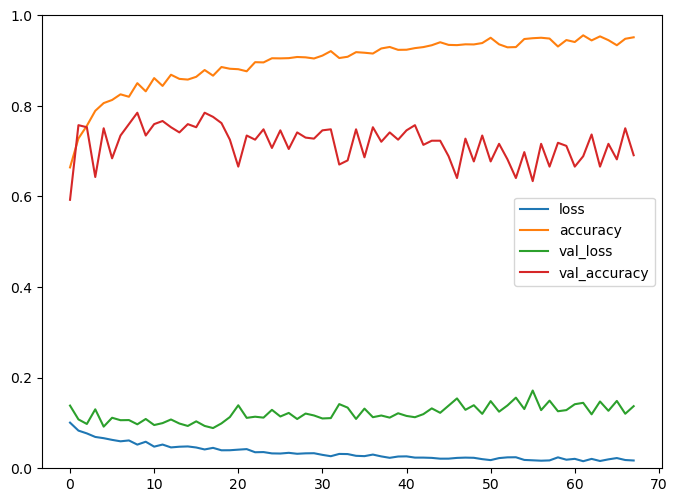

### Results auf test data ###
Accuracy for person  17 :  0.6696428571428571
[[19  7  2  0]
 [ 3 24  1  0]
 [17  7  4  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0970 - accuracy: 0.6703 - val_loss: 0.1164 - val_accuracy: 0.6773
Epoch 2/500
197/197 - 0s - loss: 0.0838 - accuracy: 0.7319 - val_loss: 0.0990 - val_accuracy: 0.7437
Epoch 3/500
197/197 - 0s - loss: 0.0763 - accuracy: 0.7723 - val_loss: 0.0896 - val_accuracy: 0.7231
Epoch 4/500
197/197 - 0s - loss: 0.0719 - accuracy: 0.7828 - val_loss: 0.1091 - val_accuracy: 0.7391
Epoch 5/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8059 - val_loss: 0.1063 - val_accuracy: 0.7346
Epoch 6/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8214 - val_loss: 0.1108 - val_accuracy: 0.7346
Epoch 7/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8196 - val_loss: 0.1118 - val_accuracy: 0.7185
Epoch 8/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8207 - val_loss: 0.1241 - val_accuracy: 0.6568
Epoch 9/500
197/197 - 0s - loss: 0.0552 - accuracy: 0.8

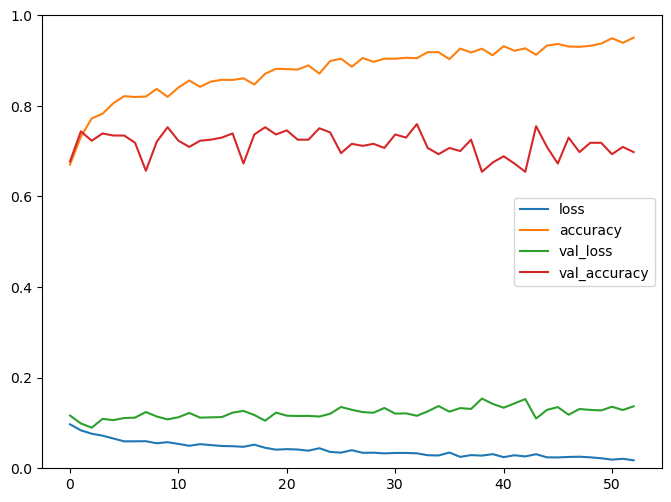

### Results auf test data ###
Accuracy for person  18 :  0.7767857142857143
[[20  5  3  0]
 [ 0 24  4  0]
 [ 0 11 17  0]
 [ 0  0  2 26]]
Epoch 1/500
197/197 - 0s - loss: 0.0986 - accuracy: 0.6701 - val_loss: 0.1295 - val_accuracy: 0.6178
Epoch 2/500
197/197 - 0s - loss: 0.0800 - accuracy: 0.7510 - val_loss: 0.1000 - val_accuracy: 0.7048
Epoch 3/500
197/197 - 0s - loss: 0.0763 - accuracy: 0.7700 - val_loss: 0.1071 - val_accuracy: 0.7506
Epoch 4/500
197/197 - 0s - loss: 0.0694 - accuracy: 0.7873 - val_loss: 0.1100 - val_accuracy: 0.6476
Epoch 5/500
197/197 - 0s - loss: 0.0656 - accuracy: 0.8003 - val_loss: 0.0921 - val_accuracy: 0.7117
Epoch 6/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8130 - val_loss: 0.0924 - val_accuracy: 0.7666
Epoch 7/500
197/197 - 0s - loss: 0.0575 - accuracy: 0.8296 - val_loss: 0.0942 - val_accuracy: 0.7368
Epoch 8/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.8207 - val_loss: 0.1059 - val_accuracy: 0.7506
Epoch 9/500
197/197 - 0s - loss: 0.0522 - accuracy: 0.8

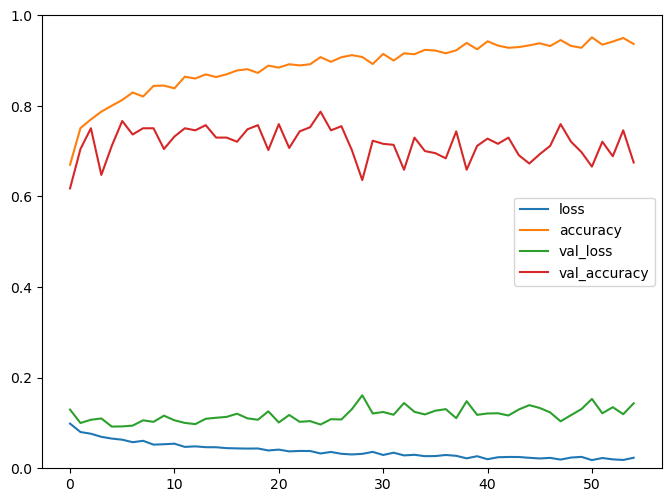

### Results auf test data ###
Accuracy for person  19 :  0.6964285714285714
[[23  5  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  1 27]]
Epoch 1/500
197/197 - 0s - loss: 0.1011 - accuracy: 0.6573 - val_loss: 0.1176 - val_accuracy: 0.6362
Epoch 2/500
197/197 - 0s - loss: 0.0841 - accuracy: 0.7413 - val_loss: 0.1101 - val_accuracy: 0.6362
Epoch 3/500
197/197 - 0s - loss: 0.0768 - accuracy: 0.7685 - val_loss: 0.1344 - val_accuracy: 0.6133
Epoch 4/500
197/197 - 0s - loss: 0.0713 - accuracy: 0.7856 - val_loss: 0.1013 - val_accuracy: 0.6705
Epoch 5/500
197/197 - 0s - loss: 0.0670 - accuracy: 0.8031 - val_loss: 0.0926 - val_accuracy: 0.7574
Epoch 6/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8201 - val_loss: 0.0994 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0547 - accuracy: 0.8446 - val_loss: 0.1308 - val_accuracy: 0.6705
Epoch 8/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8257 - val_loss: 0.0881 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0581 - accuracy: 0.8

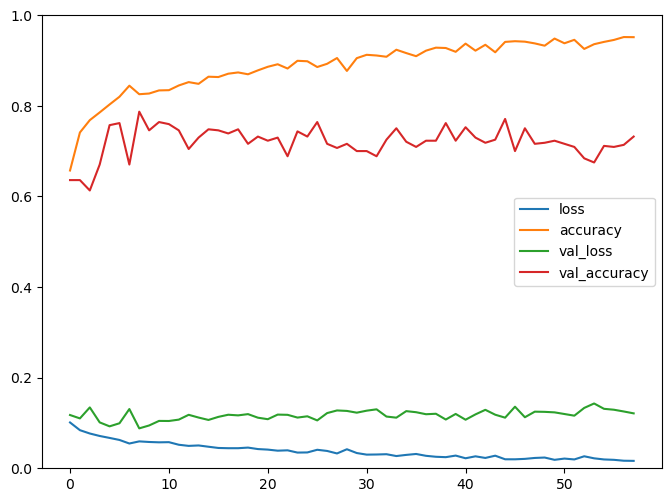

### Results auf test data ###
Accuracy for person  20 :  0.9464285714285714
[[27  1  0  0]
 [ 0 28  0  0]
 [ 0  5 23  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1005 - accuracy: 0.6545 - val_loss: 0.1307 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0843 - accuracy: 0.7255 - val_loss: 0.1072 - val_accuracy: 0.6499
Epoch 3/500
197/197 - 0s - loss: 0.0740 - accuracy: 0.7764 - val_loss: 0.1082 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7965 - val_loss: 0.1154 - val_accuracy: 0.6888
Epoch 5/500
197/197 - 0s - loss: 0.0685 - accuracy: 0.7891 - val_loss: 0.1162 - val_accuracy: 0.7414
Epoch 6/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8194 - val_loss: 0.1227 - val_accuracy: 0.6979
Epoch 7/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8128 - val_loss: 0.1085 - val_accuracy: 0.7346
Epoch 8/500
197/197 - 0s - loss: 0.0561 - accuracy: 0.8349 - val_loss: 0.1138 - val_accuracy: 0.7048
Epoch 9/500
197/197 - 0s - loss: 0.0539 - accuracy: 0.8

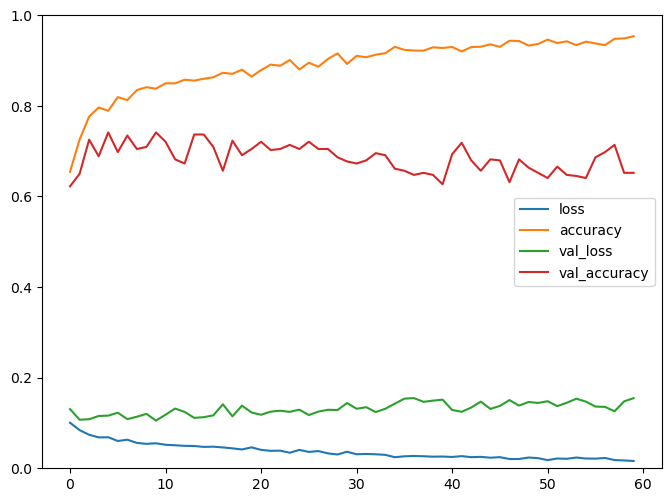

### Results auf test data ###
Accuracy for person  21 :  0.42857142857142855
[[10 16  1  1]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0 18  0 10]]
Epoch 1/500
197/197 - 0s - loss: 0.0979 - accuracy: 0.6785 - val_loss: 0.1445 - val_accuracy: 0.5423
Epoch 2/500
197/197 - 0s - loss: 0.0813 - accuracy: 0.7520 - val_loss: 0.1400 - val_accuracy: 0.5927
Epoch 3/500
197/197 - 0s - loss: 0.0718 - accuracy: 0.7861 - val_loss: 0.1190 - val_accuracy: 0.6934
Epoch 4/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7861 - val_loss: 0.1163 - val_accuracy: 0.6911
Epoch 5/500
197/197 - 0s - loss: 0.0731 - accuracy: 0.7769 - val_loss: 0.1191 - val_accuracy: 0.6979
Epoch 6/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8303 - val_loss: 0.1047 - val_accuracy: 0.7254
Epoch 7/500
197/197 - 0s - loss: 0.0589 - accuracy: 0.8265 - val_loss: 0.1110 - val_accuracy: 0.7071
Epoch 8/500
197/197 - 0s - loss: 0.0569 - accuracy: 0.8377 - val_loss: 0.1169 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.

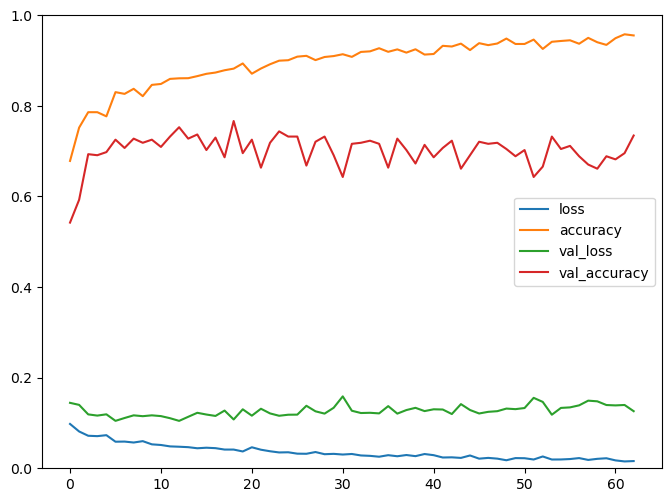

### Results auf test data ###
Accuracy for person  22 :  0.625
[[28  0  0  0]
 [ 7  0  9 12]
 [14  0 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0989 - accuracy: 0.6650 - val_loss: 0.1366 - val_accuracy: 0.5721
Epoch 2/500
197/197 - 0s - loss: 0.0874 - accuracy: 0.7194 - val_loss: 0.0993 - val_accuracy: 0.6773
Epoch 3/500
197/197 - 0s - loss: 0.0741 - accuracy: 0.7754 - val_loss: 0.1132 - val_accuracy: 0.6957
Epoch 4/500
197/197 - 0s - loss: 0.0735 - accuracy: 0.7838 - val_loss: 0.1063 - val_accuracy: 0.7002
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7967 - val_loss: 0.1326 - val_accuracy: 0.6339
Epoch 6/500
197/197 - 0s - loss: 0.0642 - accuracy: 0.8072 - val_loss: 0.0966 - val_accuracy: 0.7666
Epoch 7/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8074 - val_loss: 0.0945 - val_accuracy: 0.7689
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8194 - val_loss: 0.1001 - val_accuracy: 0.7368
Epoch 9/500
197/197 - 0s - loss: 0.0557 - accuracy: 0.8352 - val_los

Epoch 81/500
197/197 - 0s - loss: 0.0167 - accuracy: 0.9540 - val_loss: 0.1175 - val_accuracy: 0.7277
Epoch 82/500
197/197 - 0s - loss: 0.0123 - accuracy: 0.9644 - val_loss: 0.1179 - val_accuracy: 0.7460
Epoch 83/500
197/197 - 0s - loss: 0.0165 - accuracy: 0.9524 - val_loss: 0.1139 - val_accuracy: 0.7620
Epoch 84/500
197/197 - 0s - loss: 0.0141 - accuracy: 0.9598 - val_loss: 0.1331 - val_accuracy: 0.7094
Epoch 85/500
197/197 - 0s - loss: 0.0110 - accuracy: 0.9713 - val_loss: 0.1375 - val_accuracy: 0.7094
Epoch 86/500
197/197 - 0s - loss: 0.0167 - accuracy: 0.9540 - val_loss: 0.1137 - val_accuracy: 0.7391
Epoch 87/500
197/197 - 0s - loss: 0.0152 - accuracy: 0.9560 - val_loss: 0.1277 - val_accuracy: 0.7254
Epoch 88/500
197/197 - 0s - loss: 0.0124 - accuracy: 0.9667 - val_loss: 0.1212 - val_accuracy: 0.7323
Epoch 89/500
197/197 - 0s - loss: 0.0131 - accuracy: 0.9631 - val_loss: 0.1224 - val_accuracy: 0.7323
Epoch 90/500
197/197 - 0s - loss: 0.0163 - accuracy: 0.9537 - val_loss: 0.1111 - v

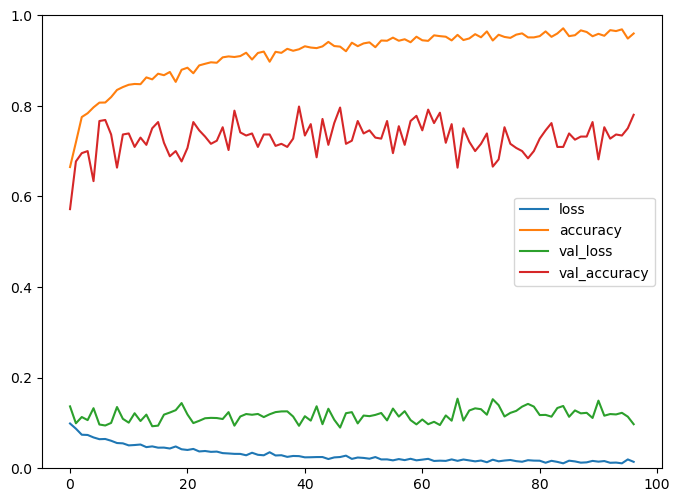

### Results auf test data ###
Accuracy for person  23 :  0.8482142857142857
[[27  0  1  0]
 [ 0 23  4  1]
 [ 0 11 17  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1000 - accuracy: 0.6642 - val_loss: 0.1147 - val_accuracy: 0.6362
Epoch 2/500
197/197 - 0s - loss: 0.0825 - accuracy: 0.7408 - val_loss: 0.1264 - val_accuracy: 0.6247
Epoch 3/500
197/197 - 0s - loss: 0.0752 - accuracy: 0.7744 - val_loss: 0.0975 - val_accuracy: 0.7048
Epoch 4/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7868 - val_loss: 0.1025 - val_accuracy: 0.7071
Epoch 5/500
197/197 - 0s - loss: 0.0672 - accuracy: 0.7993 - val_loss: 0.1189 - val_accuracy: 0.6636
Epoch 6/500
197/197 - 0s - loss: 0.0651 - accuracy: 0.8087 - val_loss: 0.1057 - val_accuracy: 0.7529
Epoch 7/500
197/197 - 0s - loss: 0.0636 - accuracy: 0.8120 - val_loss: 0.1088 - val_accuracy: 0.7094
Epoch 8/500
197/197 - 0s - loss: 0.0556 - accuracy: 0.8364 - val_loss: 0.1159 - val_accuracy: 0.7254
Epoch 9/500
197/197 - 0s - loss: 0.0560 - accuracy: 0.8

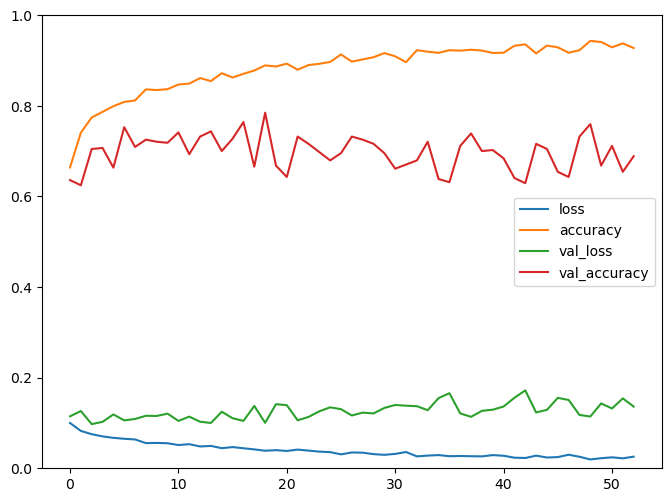

### Results auf test data ###
Accuracy for person  24 :  0.7767857142857143
[[24  0  4  0]
 [ 0 14 14  0]
 [ 0  6 21  1]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0976 - accuracy: 0.6828 - val_loss: 0.1119 - val_accuracy: 0.6270
Epoch 2/500
197/197 - 0s - loss: 0.0780 - accuracy: 0.7606 - val_loss: 0.0867 - val_accuracy: 0.7643
Epoch 3/500
197/197 - 0s - loss: 0.0758 - accuracy: 0.7683 - val_loss: 0.1091 - val_accuracy: 0.7185
Epoch 4/500
197/197 - 0s - loss: 0.0677 - accuracy: 0.8003 - val_loss: 0.0943 - val_accuracy: 0.7323
Epoch 5/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8112 - val_loss: 0.0908 - val_accuracy: 0.7643
Epoch 6/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8118 - val_loss: 0.1034 - val_accuracy: 0.7460
Epoch 7/500
197/197 - 0s - loss: 0.0557 - accuracy: 0.8374 - val_loss: 0.1118 - val_accuracy: 0.7254
Epoch 8/500
197/197 - 0s - loss: 0.0567 - accuracy: 0.8336 - val_loss: 0.0834 - val_accuracy: 0.7757
Epoch 9/500
197/197 - 0s - loss: 0.0569 - accuracy: 0.8

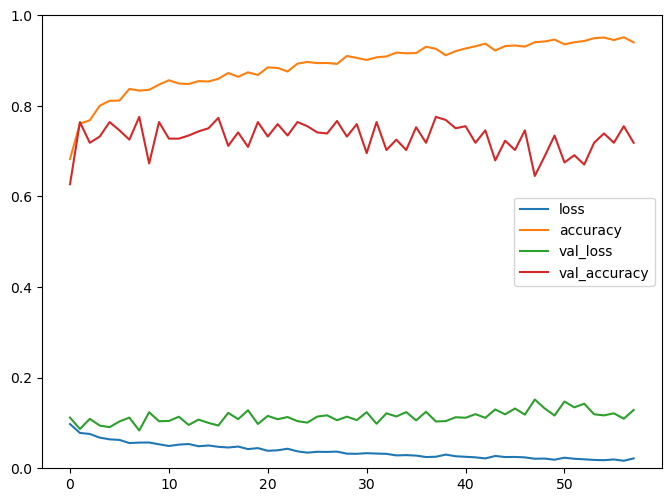

### Results auf test data ###
Accuracy for person  25 :  0.6785714285714286
[[24  4  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  2  2 24]]
Epoch 1/500
197/197 - 0s - loss: 0.0986 - accuracy: 0.6645 - val_loss: 0.1067 - val_accuracy: 0.7094
Epoch 2/500
197/197 - 0s - loss: 0.0840 - accuracy: 0.7362 - val_loss: 0.0981 - val_accuracy: 0.7254
Epoch 3/500
197/197 - 0s - loss: 0.0756 - accuracy: 0.7670 - val_loss: 0.1052 - val_accuracy: 0.6659
Epoch 4/500
197/197 - 0s - loss: 0.0723 - accuracy: 0.7805 - val_loss: 0.1008 - val_accuracy: 0.7368
Epoch 5/500
197/197 - 0s - loss: 0.0676 - accuracy: 0.8013 - val_loss: 0.0850 - val_accuracy: 0.7872
Epoch 6/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8148 - val_loss: 0.0984 - val_accuracy: 0.7414
Epoch 7/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8199 - val_loss: 0.0954 - val_accuracy: 0.7346
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8184 - val_loss: 0.0976 - val_accuracy: 0.7391
Epoch 9/500
197/197 - 0s - loss: 0.0563 - accuracy: 0.8

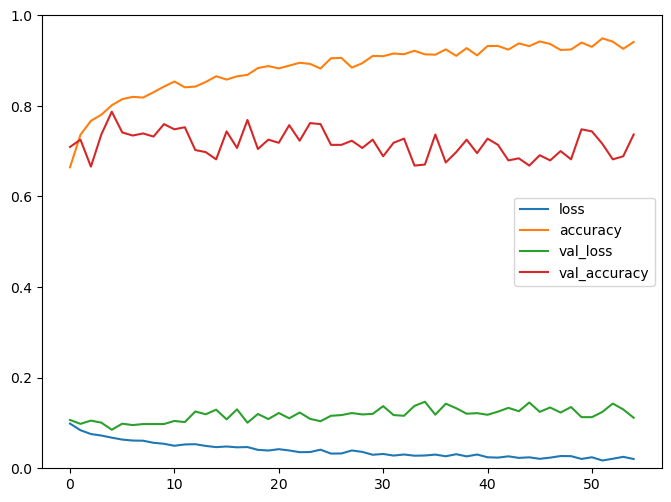

### Results auf test data ###
Accuracy for person  26 :  0.7142857142857143
[[28  0  0  0]
 [ 6 21  1  0]
 [11 14  3  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0990 - accuracy: 0.6718 - val_loss: 0.1140 - val_accuracy: 0.6407
Epoch 2/500
197/197 - 0s - loss: 0.0839 - accuracy: 0.7342 - val_loss: 0.1133 - val_accuracy: 0.7025
Epoch 3/500
197/197 - 0s - loss: 0.0784 - accuracy: 0.7593 - val_loss: 0.0920 - val_accuracy: 0.7918
Epoch 4/500
197/197 - 0s - loss: 0.0712 - accuracy: 0.7828 - val_loss: 0.1081 - val_accuracy: 0.7483
Epoch 5/500
197/197 - 0s - loss: 0.0669 - accuracy: 0.8026 - val_loss: 0.1050 - val_accuracy: 0.7094
Epoch 6/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8153 - val_loss: 0.1077 - val_accuracy: 0.7483
Epoch 7/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8173 - val_loss: 0.1039 - val_accuracy: 0.7460
Epoch 8/500
197/197 - 0s - loss: 0.0585 - accuracy: 0.8260 - val_loss: 0.0955 - val_accuracy: 0.7712
Epoch 9/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8

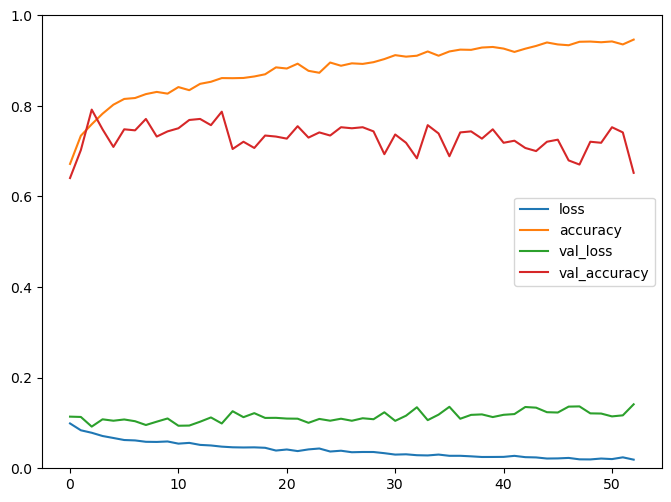

### Results auf test data ###
Accuracy for person  27 :  0.8035714285714286
[[21  1  6  0]
 [ 0 13 15  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0987 - accuracy: 0.6734 - val_loss: 0.1100 - val_accuracy: 0.6636
Epoch 2/500
197/197 - 0s - loss: 0.0786 - accuracy: 0.7563 - val_loss: 0.1109 - val_accuracy: 0.6545
Epoch 3/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7891 - val_loss: 0.1107 - val_accuracy: 0.6773
Epoch 4/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.8008 - val_loss: 0.1023 - val_accuracy: 0.7346
Epoch 5/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8079 - val_loss: 0.0871 - val_accuracy: 0.7689
Epoch 6/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8255 - val_loss: 0.1014 - val_accuracy: 0.7437
Epoch 7/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8288 - val_loss: 0.0938 - val_accuracy: 0.7483
Epoch 8/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8250 - val_loss: 0.1117 - val_accuracy: 0.6545
Epoch 9/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8

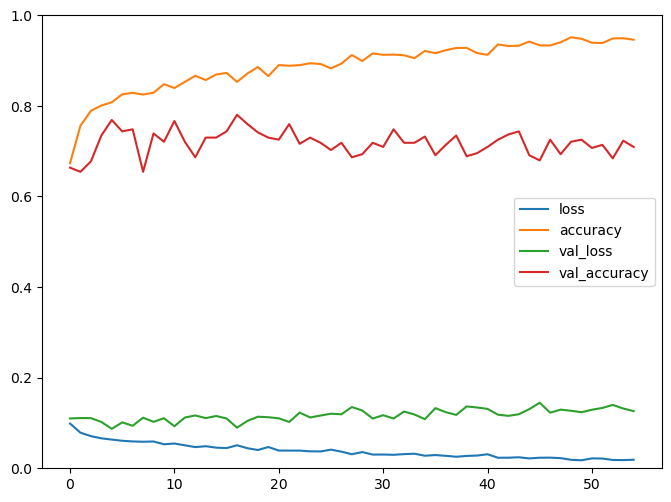

### Results auf test data ###
Accuracy for person  28 :  0.5
[[28  0  0  0]
 [28  0  0  0]
 [27  1  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0989 - accuracy: 0.6629 - val_loss: 0.1086 - val_accuracy: 0.6979
Epoch 2/500
197/197 - 0s - loss: 0.0835 - accuracy: 0.7321 - val_loss: 0.0934 - val_accuracy: 0.7323
Epoch 3/500
197/197 - 0s - loss: 0.0793 - accuracy: 0.7517 - val_loss: 0.0985 - val_accuracy: 0.7231
Epoch 4/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7871 - val_loss: 0.0876 - val_accuracy: 0.7346
Epoch 5/500
197/197 - 0s - loss: 0.0652 - accuracy: 0.8059 - val_loss: 0.0973 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8135 - val_loss: 0.1284 - val_accuracy: 0.6705
Epoch 7/500
197/197 - 0s - loss: 0.0568 - accuracy: 0.8288 - val_loss: 0.1098 - val_accuracy: 0.7162
Epoch 8/500
197/197 - 0s - loss: 0.0551 - accuracy: 0.8380 - val_loss: 0.1074 - val_accuracy: 0.7323
Epoch 9/500
197/197 - 0s - loss: 0.0544 - accuracy: 0.8413 - val_loss:

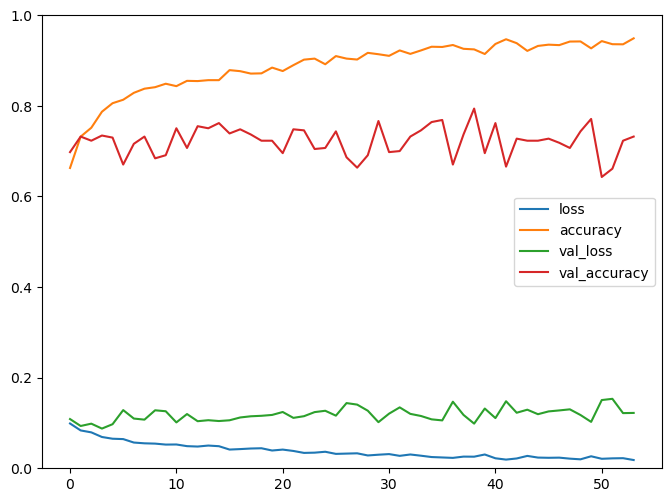

### Results auf test data ###
Accuracy for person  29 :  0.7142857142857143
[[15  9  4  0]
 [ 0 28  0  0]
 [ 0 19  9  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1022 - accuracy: 0.6571 - val_loss: 0.1130 - val_accuracy: 0.6064
Epoch 2/500
197/197 - 0s - loss: 0.0838 - accuracy: 0.7288 - val_loss: 0.1024 - val_accuracy: 0.7391
Epoch 3/500
197/197 - 0s - loss: 0.0770 - accuracy: 0.7586 - val_loss: 0.1068 - val_accuracy: 0.7414
Epoch 4/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7939 - val_loss: 0.0946 - val_accuracy: 0.7437
Epoch 5/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.7927 - val_loss: 0.1163 - val_accuracy: 0.6682
Epoch 6/500
197/197 - 0s - loss: 0.0703 - accuracy: 0.7843 - val_loss: 0.1103 - val_accuracy: 0.7162
Epoch 7/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8207 - val_loss: 0.1029 - val_accuracy: 0.7391
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8179 - val_loss: 0.0874 - val_accuracy: 0.7551
Epoch 9/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8

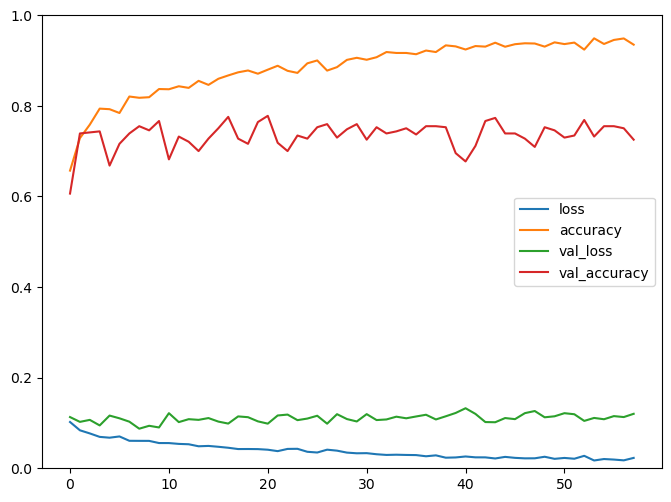

### Results auf test data ###
Accuracy for person  30 :  0.9017857142857143
[[28  0  0  0]
 [ 0 23  5  0]
 [ 0  6 22  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1016 - accuracy: 0.6596 - val_loss: 0.1090 - val_accuracy: 0.7071
Epoch 2/500
197/197 - 0s - loss: 0.0862 - accuracy: 0.7286 - val_loss: 0.0988 - val_accuracy: 0.6613
Epoch 3/500
197/197 - 0s - loss: 0.0760 - accuracy: 0.7721 - val_loss: 0.1150 - val_accuracy: 0.6659
Epoch 4/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7937 - val_loss: 0.1206 - val_accuracy: 0.6430
Epoch 5/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7947 - val_loss: 0.0964 - val_accuracy: 0.7483
Epoch 6/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8049 - val_loss: 0.0932 - val_accuracy: 0.7643
Epoch 7/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8217 - val_loss: 0.0976 - val_accuracy: 0.7529
Epoch 8/500
197/197 - 0s - loss: 0.0564 - accuracy: 0.8308 - val_loss: 0.0882 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0576 - accuracy: 0.8

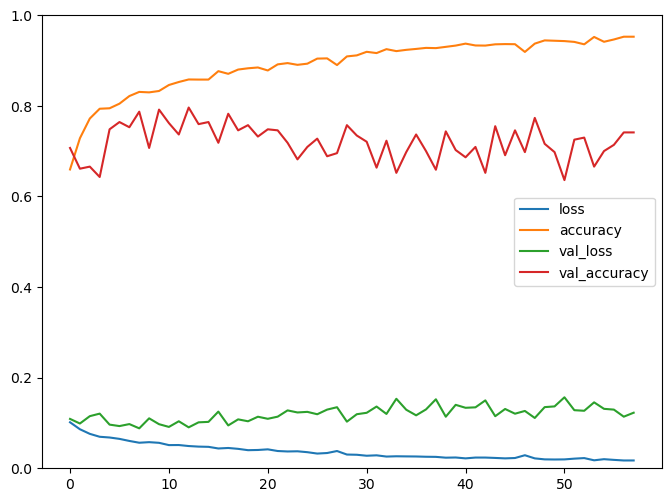

### Results auf test data ###
Accuracy for person  31 :  0.6339285714285714
[[11 17  0  0]
 [ 0 28  0  0]
 [ 0 22  6  0]
 [ 0  0  2 26]]
Epoch 1/500
197/197 - 0s - loss: 0.0975 - accuracy: 0.6695 - val_loss: 0.1262 - val_accuracy: 0.6407
Epoch 2/500
197/197 - 0s - loss: 0.0827 - accuracy: 0.7393 - val_loss: 0.1044 - val_accuracy: 0.7048
Epoch 3/500
197/197 - 0s - loss: 0.0744 - accuracy: 0.7716 - val_loss: 0.1126 - val_accuracy: 0.7025
Epoch 4/500
197/197 - 0s - loss: 0.0713 - accuracy: 0.7828 - val_loss: 0.1078 - val_accuracy: 0.7002
Epoch 5/500
197/197 - 0s - loss: 0.0651 - accuracy: 0.8016 - val_loss: 0.1009 - val_accuracy: 0.7437
Epoch 6/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8191 - val_loss: 0.0840 - val_accuracy: 0.7918
Epoch 7/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8224 - val_loss: 0.1073 - val_accuracy: 0.7483
Epoch 8/500
197/197 - 0s - loss: 0.0587 - accuracy: 0.8273 - val_loss: 0.1048 - val_accuracy: 0.6865
Epoch 9/500
197/197 - 0s - loss: 0.0554 - accuracy: 0.8

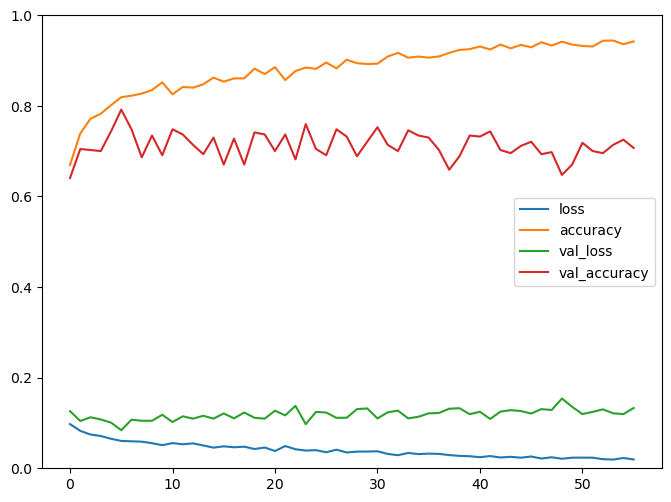

### Results auf test data ###
Accuracy for person  32 :  0.8839285714285714
[[16  0 12  0]
 [ 0 27  1  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1006 - accuracy: 0.6711 - val_loss: 0.1393 - val_accuracy: 0.6064
Epoch 2/500
197/197 - 0s - loss: 0.0839 - accuracy: 0.7298 - val_loss: 0.1149 - val_accuracy: 0.6979
Epoch 3/500
197/197 - 0s - loss: 0.0764 - accuracy: 0.7721 - val_loss: 0.1190 - val_accuracy: 0.6407
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7883 - val_loss: 0.1015 - val_accuracy: 0.7460
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8062 - val_loss: 0.0995 - val_accuracy: 0.7346
Epoch 6/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8242 - val_loss: 0.1109 - val_accuracy: 0.7323
Epoch 7/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8293 - val_loss: 0.1039 - val_accuracy: 0.7551
Epoch 8/500
197/197 - 0s - loss: 0.0569 - accuracy: 0.8341 - val_loss: 0.1211 - val_accuracy: 0.6796
Epoch 9/500
197/197 - 0s - loss: 0.0535 - accuracy: 0.8

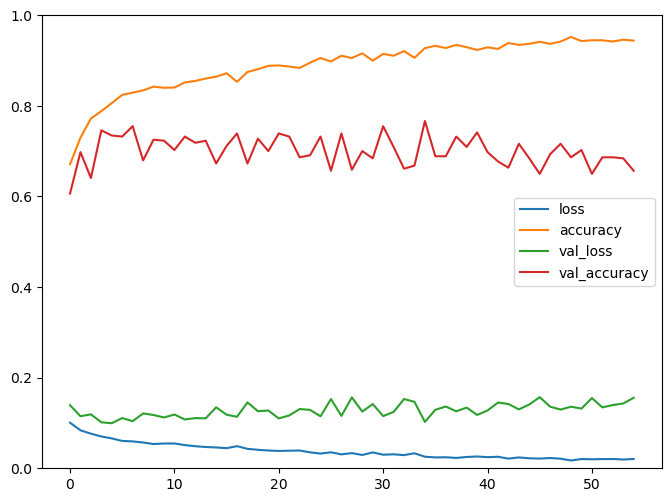

### Results auf test data ###
Accuracy for person  33 :  0.7321428571428571
[[28  0  0  0]
 [ 0 27  1  0]
 [14 14  0  0]
 [ 0  1  0 27]]
Epoch 1/500
197/197 - 0s - loss: 0.0992 - accuracy: 0.6751 - val_loss: 0.1163 - val_accuracy: 0.6865
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7497 - val_loss: 0.1205 - val_accuracy: 0.6064
Epoch 3/500
197/197 - 0s - loss: 0.0749 - accuracy: 0.7733 - val_loss: 0.1070 - val_accuracy: 0.6636
Epoch 4/500
197/197 - 0s - loss: 0.0676 - accuracy: 0.7988 - val_loss: 0.1028 - val_accuracy: 0.7460
Epoch 5/500
197/197 - 0s - loss: 0.0652 - accuracy: 0.8084 - val_loss: 0.1040 - val_accuracy: 0.7483
Epoch 6/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8133 - val_loss: 0.1156 - val_accuracy: 0.7231
Epoch 7/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8250 - val_loss: 0.0967 - val_accuracy: 0.7506
Epoch 8/500
197/197 - 0s - loss: 0.0569 - accuracy: 0.8369 - val_loss: 0.0976 - val_accuracy: 0.7529
Epoch 9/500
197/197 - 0s - loss: 0.0542 - accuracy: 0.8

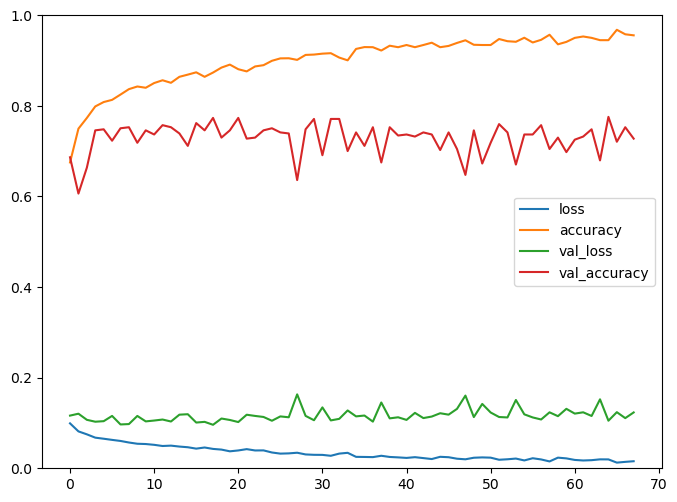

### Results auf test data ###
Accuracy for person  34 :  0.8660714285714286
[[27  1  0  0]
 [ 0 14 11  3]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0979 - accuracy: 0.6744 - val_loss: 0.1060 - val_accuracy: 0.6384
Epoch 2/500
197/197 - 0s - loss: 0.0843 - accuracy: 0.7293 - val_loss: 0.0914 - val_accuracy: 0.7437
Epoch 3/500
197/197 - 0s - loss: 0.0798 - accuracy: 0.7553 - val_loss: 0.1189 - val_accuracy: 0.6682
Epoch 4/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7990 - val_loss: 0.1091 - val_accuracy: 0.7002
Epoch 5/500
197/197 - 0s - loss: 0.0652 - accuracy: 0.8100 - val_loss: 0.0916 - val_accuracy: 0.7849
Epoch 6/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8077 - val_loss: 0.1087 - val_accuracy: 0.7117
Epoch 7/500
197/197 - 0s - loss: 0.0575 - accuracy: 0.8280 - val_loss: 0.1033 - val_accuracy: 0.7277
Epoch 8/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8242 - val_loss: 0.1064 - val_accuracy: 0.7254
Epoch 9/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8

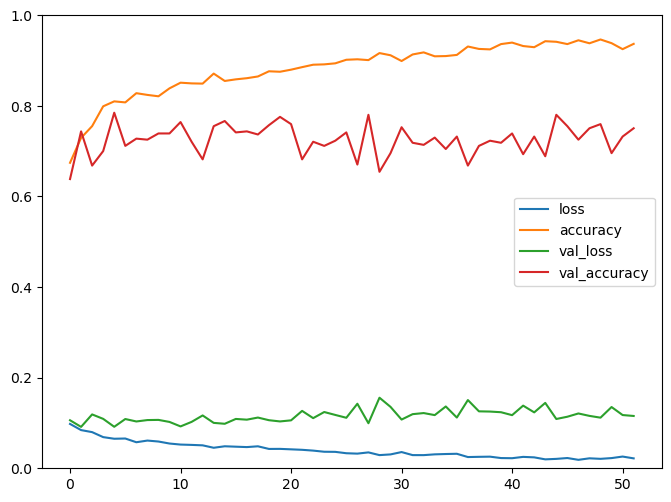

### Results auf test data ###
Accuracy for person  35 :  0.8303571428571429
[[20  2  6  0]
 [ 0 26  2  0]
 [ 0  7 21  0]
 [ 0  0  2 26]]
Epoch 1/500
197/197 - 0s - loss: 0.0980 - accuracy: 0.6731 - val_loss: 0.1072 - val_accuracy: 0.7162
Epoch 2/500
197/197 - 0s - loss: 0.0832 - accuracy: 0.7382 - val_loss: 0.1162 - val_accuracy: 0.6522
Epoch 3/500
197/197 - 0s - loss: 0.0756 - accuracy: 0.7683 - val_loss: 0.1143 - val_accuracy: 0.7048
Epoch 4/500
197/197 - 0s - loss: 0.0714 - accuracy: 0.7878 - val_loss: 0.1016 - val_accuracy: 0.7414
Epoch 5/500
197/197 - 0s - loss: 0.0669 - accuracy: 0.7985 - val_loss: 0.1167 - val_accuracy: 0.7094
Epoch 6/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8039 - val_loss: 0.1163 - val_accuracy: 0.7025
Epoch 7/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8023 - val_loss: 0.1085 - val_accuracy: 0.6796
Epoch 8/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8260 - val_loss: 0.1022 - val_accuracy: 0.7666
Epoch 9/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8

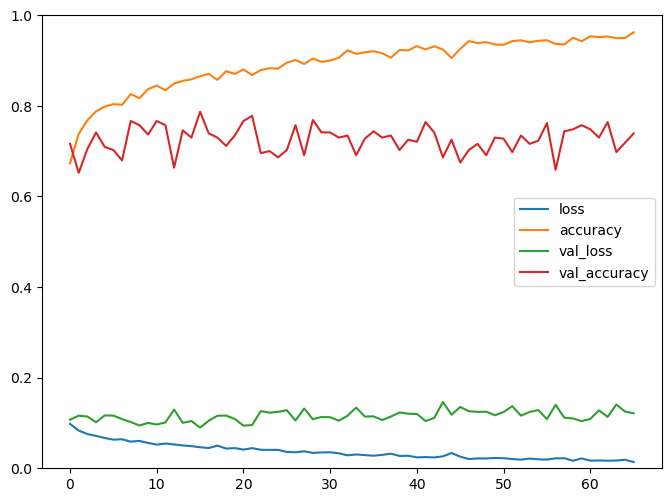

### Results auf test data ###
Accuracy for person  36 :  0.8392857142857143
[[28  0  0  0]
 [ 0 25  3  0]
 [14  1 13  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1018 - accuracy: 0.6543 - val_loss: 0.0990 - val_accuracy: 0.6842
Epoch 2/500
197/197 - 0s - loss: 0.0853 - accuracy: 0.7194 - val_loss: 0.0985 - val_accuracy: 0.6751
Epoch 3/500
197/197 - 0s - loss: 0.0809 - accuracy: 0.7504 - val_loss: 0.1143 - val_accuracy: 0.6545
Epoch 4/500
197/197 - 0s - loss: 0.0740 - accuracy: 0.7746 - val_loss: 0.0935 - val_accuracy: 0.7071
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.8026 - val_loss: 0.1002 - val_accuracy: 0.7346
Epoch 6/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8044 - val_loss: 0.1027 - val_accuracy: 0.6979
Epoch 7/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8074 - val_loss: 0.1034 - val_accuracy: 0.7277
Epoch 8/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8209 - val_loss: 0.0953 - val_accuracy: 0.7323
Epoch 9/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8

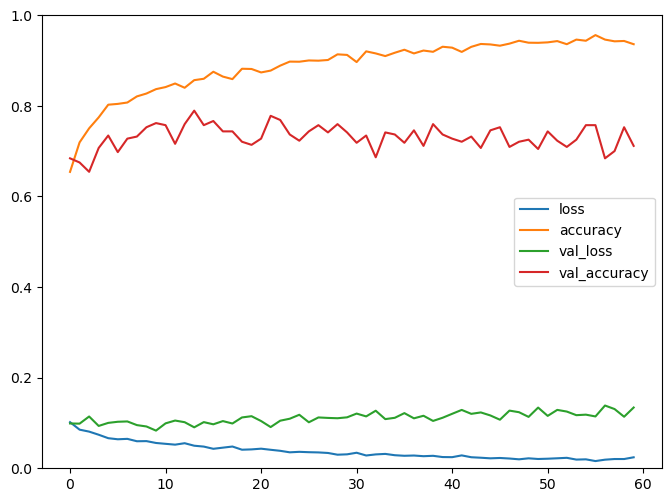

### Results auf test data ###
Accuracy for person  37 :  0.9732142857142857
[[28  0  0  0]
 [ 0 28  0  0]
 [ 3  0 25  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1000 - accuracy: 0.6634 - val_loss: 0.1024 - val_accuracy: 0.6568
Epoch 2/500
197/197 - 0s - loss: 0.0859 - accuracy: 0.7309 - val_loss: 0.1198 - val_accuracy: 0.6545
Epoch 3/500
197/197 - 0s - loss: 0.0788 - accuracy: 0.7611 - val_loss: 0.1019 - val_accuracy: 0.7780
Epoch 4/500
197/197 - 0s - loss: 0.0743 - accuracy: 0.7749 - val_loss: 0.1044 - val_accuracy: 0.7094
Epoch 5/500
197/197 - 0s - loss: 0.0684 - accuracy: 0.8021 - val_loss: 0.1269 - val_accuracy: 0.6522
Epoch 6/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7960 - val_loss: 0.0949 - val_accuracy: 0.7780
Epoch 7/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8118 - val_loss: 0.0942 - val_accuracy: 0.7712
Epoch 8/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8252 - val_loss: 0.0997 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8

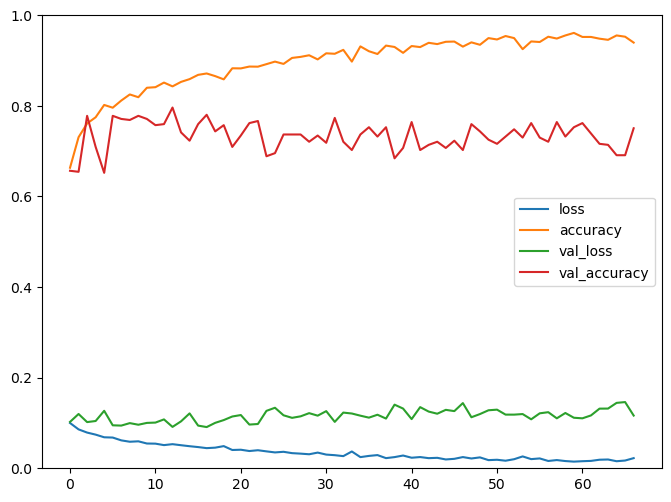

### Results auf test data ###
Accuracy for person  38 :  0.8303571428571429
[[28  0  0  0]
 [ 0 19  9  0]
 [ 0 10 18  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1009 - accuracy: 0.6535 - val_loss: 0.0643 - val_accuracy: 0.8192
Epoch 2/500
197/197 - 0s - loss: 0.0847 - accuracy: 0.7235 - val_loss: 0.0811 - val_accuracy: 0.7712
Epoch 3/500
197/197 - 0s - loss: 0.0762 - accuracy: 0.7675 - val_loss: 0.0610 - val_accuracy: 0.8078
Epoch 4/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7906 - val_loss: 0.0763 - val_accuracy: 0.7551
Epoch 5/500
197/197 - 0s - loss: 0.0645 - accuracy: 0.8051 - val_loss: 0.0450 - val_accuracy: 0.8719
Epoch 6/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.8194 - val_loss: 0.0468 - val_accuracy: 0.8787
Epoch 7/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8235 - val_loss: 0.0546 - val_accuracy: 0.8284
Epoch 8/500
197/197 - 0s - loss: 0.0578 - accuracy: 0.8247 - val_loss: 0.0531 - val_accuracy: 0.8650
Epoch 9/500
197/197 - 0s - loss: 0.0568 - accuracy: 0.8

197/197 - 0s - loss: 0.0181 - accuracy: 0.9504 - val_loss: 0.0647 - val_accuracy: 0.8421
Epoch 81/500
197/197 - 0s - loss: 0.0123 - accuracy: 0.9659 - val_loss: 0.0633 - val_accuracy: 0.8398
Epoch 82/500
197/197 - 0s - loss: 0.0134 - accuracy: 0.9606 - val_loss: 0.0709 - val_accuracy: 0.8330
Epoch 83/500
197/197 - 0s - loss: 0.0149 - accuracy: 0.9585 - val_loss: 0.0907 - val_accuracy: 0.7757
Epoch 84/500
197/197 - 0s - loss: 0.0157 - accuracy: 0.9537 - val_loss: 0.0770 - val_accuracy: 0.8307
Epoch 85/500
197/197 - 0s - loss: 0.0177 - accuracy: 0.9486 - val_loss: 0.1037 - val_accuracy: 0.7391
Epoch 86/500
197/197 - 0s - loss: 0.0140 - accuracy: 0.9606 - val_loss: 0.0834 - val_accuracy: 0.7963
Epoch 87/500
197/197 - 0s - loss: 0.0154 - accuracy: 0.9568 - val_loss: 0.0633 - val_accuracy: 0.8352
Epoch 88/500
197/197 - 0s - loss: 0.0120 - accuracy: 0.9667 - val_loss: 0.0834 - val_accuracy: 0.7872
Epoch 89/500
197/197 - 0s - loss: 0.0171 - accuracy: 0.9517 - val_loss: 0.0766 - val_accuracy: 

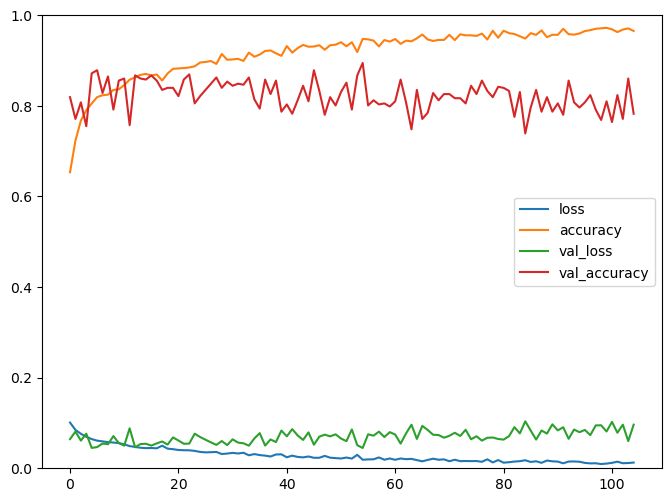

### Results auf test data ###
Accuracy for person  39 :  0.375
[[25  3  0  0]
 [ 1 16  0 11]
 [ 3  4  0 21]
 [ 0 27  0  1]]
Epoch 1/500
197/197 - 0s - loss: 0.1006 - accuracy: 0.6685 - val_loss: 0.1195 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0862 - accuracy: 0.7293 - val_loss: 0.1054 - val_accuracy: 0.7506
Epoch 3/500
197/197 - 0s - loss: 0.0802 - accuracy: 0.7525 - val_loss: 0.0946 - val_accuracy: 0.7094
Epoch 4/500
197/197 - 0s - loss: 0.0749 - accuracy: 0.7703 - val_loss: 0.1054 - val_accuracy: 0.7323
Epoch 5/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7881 - val_loss: 0.1069 - val_accuracy: 0.6888
Epoch 6/500
197/197 - 0s - loss: 0.0658 - accuracy: 0.8067 - val_loss: 0.1203 - val_accuracy: 0.7117
Epoch 7/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8153 - val_loss: 0.0801 - val_accuracy: 0.8055
Epoch 8/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8265 - val_loss: 0.0868 - val_accuracy: 0.7643
Epoch 9/500
197/197 - 0s - loss: 0.0571 - accuracy: 0.8293 - val_los

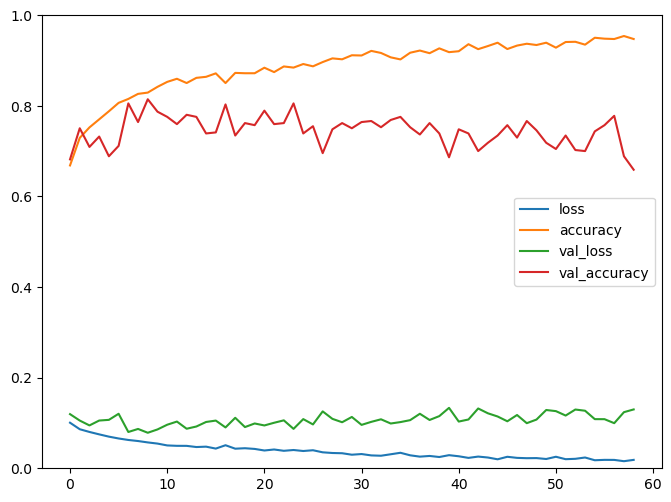

### Results auf test data ###
Accuracy for person  40 :  0.8125
[[28  0  0  0]
 [ 0 21  7  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]

 ##### overall accuracy:  0.7479910714285715 #####


In [22]:
# Ergebnis auf b)

accuracies = testANN_b(hp_ann_big, n_attributes, n_classes)
results_b[1] = accuracies

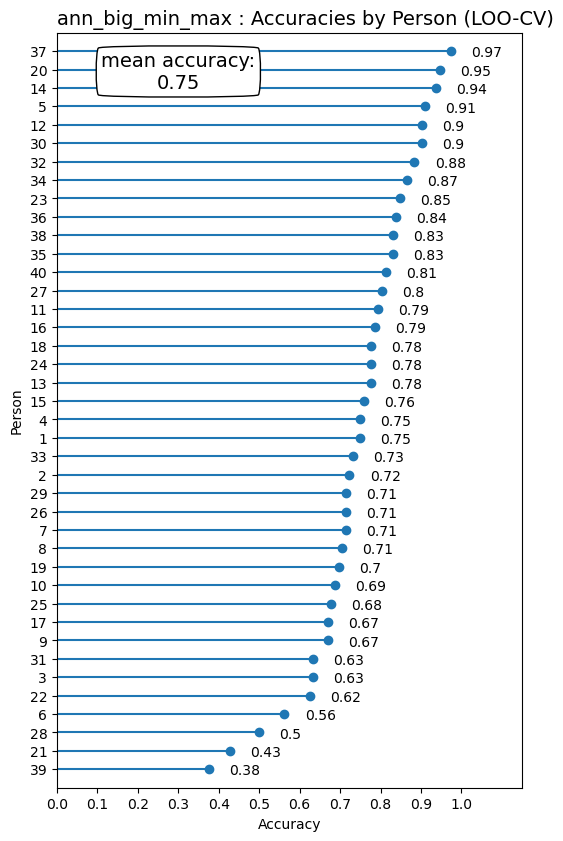

In [23]:
lolli_plot('ann_big_min_max')

### Data Preprocessing mit StandardScaler

In [24]:
## train test split
train_data, test_data, train_labels_raw, test_labels_raw = train_test_split(
                      data_input, data_labels_raw, test_size = 0.1, random_state=123)

## preprocessing: scale data to make sure each feature has equal influence
scaler = StandardScaler().fit(train_data)  # z-score

train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)

### Kleines Neuronales Netz mit StandardScaler

model_ann_small = createANN(hp_ann_small, n_attributes, n_classes)
trainANN(model_ann_small, hp_ann_small, train_data, train_labels)

In [26]:
# Ergebnis auf a)

acc = testANN_a(model_ann_small)
results_a[2] = acc

######## Results auf test data #########
Accuracy (test):  0.9285714285714286
[[100   3   4   0]
 [  1  93  14   0]
 [  1   7  97   1]
 [  0   1   0 126]]


Epoch 1/500
197/197 - 0s - loss: 0.1129 - accuracy: 0.6413 - val_loss: 0.1300 - val_accuracy: 0.5973
Epoch 2/500
197/197 - 0s - loss: 0.0809 - accuracy: 0.7479 - val_loss: 0.1126 - val_accuracy: 0.6545
Epoch 3/500
197/197 - 0s - loss: 0.0742 - accuracy: 0.7703 - val_loss: 0.1091 - val_accuracy: 0.6545
Epoch 4/500
197/197 - 0s - loss: 0.0714 - accuracy: 0.7787 - val_loss: 0.0939 - val_accuracy: 0.7346
Epoch 5/500
197/197 - 0s - loss: 0.0670 - accuracy: 0.7924 - val_loss: 0.0953 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8084 - val_loss: 0.0818 - val_accuracy: 0.8009
Epoch 7/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8079 - val_loss: 0.0772 - val_accuracy: 0.7986
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8217 - val_loss: 0.0812 - val_accuracy: 0.7803
Epoch 9/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8278 - val_loss: 0.0822 - val_accuracy: 0.7551
Epoch 10/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8247 - val_loss: 0.0781 - val_accura

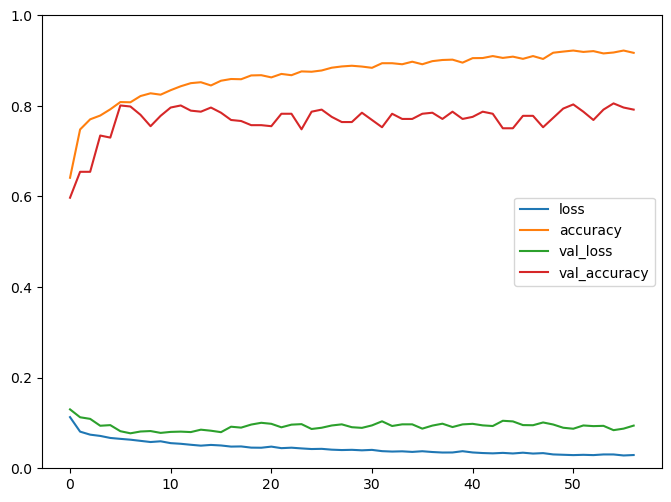

### Results auf test data ###
Accuracy for person  1 :  0.8482142857142857
[[14  0 14  0]
 [ 0 28  0  0]
 [ 0  3 25  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1099 - accuracy: 0.6484 - val_loss: 0.1156 - val_accuracy: 0.5950
Epoch 2/500
197/197 - 0s - loss: 0.0812 - accuracy: 0.7367 - val_loss: 0.0965 - val_accuracy: 0.7551
Epoch 3/500
197/197 - 0s - loss: 0.0748 - accuracy: 0.7738 - val_loss: 0.1123 - val_accuracy: 0.6430
Epoch 4/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7828 - val_loss: 0.0868 - val_accuracy: 0.7986
Epoch 5/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7894 - val_loss: 0.0851 - val_accuracy: 0.7048
Epoch 6/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.7962 - val_loss: 0.0786 - val_accuracy: 0.7872
Epoch 7/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8171 - val_loss: 0.0836 - val_accuracy: 0.7666
Epoch 8/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8301 - val_loss: 0.0787 - val_accuracy: 0.7643
Epoch 9/500
197/197 - 0s - loss: 0.0569 - accuracy: 0.83

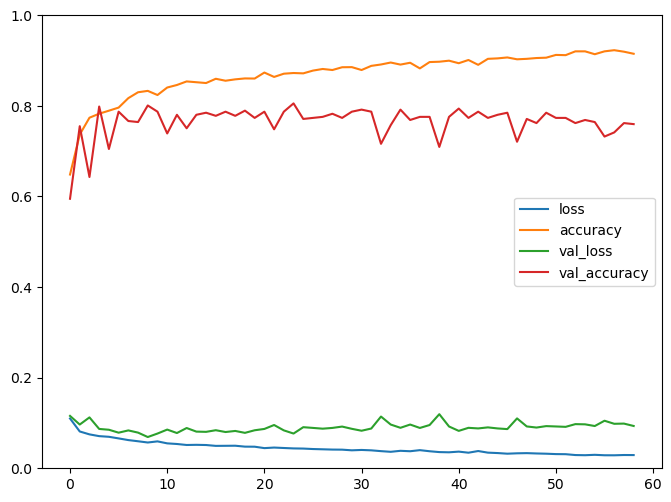

### Results auf test data ###
Accuracy for person  2 :  0.7142857142857143
[[10  0 18  0]
 [ 0 14 14  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1093 - accuracy: 0.6489 - val_loss: 0.1145 - val_accuracy: 0.6476
Epoch 2/500
197/197 - 0s - loss: 0.0819 - accuracy: 0.7459 - val_loss: 0.0956 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0734 - accuracy: 0.7787 - val_loss: 0.0816 - val_accuracy: 0.7735
Epoch 4/500
197/197 - 0s - loss: 0.0696 - accuracy: 0.7845 - val_loss: 0.0826 - val_accuracy: 0.7849
Epoch 5/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8069 - val_loss: 0.0954 - val_accuracy: 0.6979
Epoch 6/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.8008 - val_loss: 0.0922 - val_accuracy: 0.7162
Epoch 7/500
197/197 - 0s - loss: 0.0628 - accuracy: 0.8133 - val_loss: 0.0774 - val_accuracy: 0.7826
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8128 - val_loss: 0.0802 - val_accuracy: 0.7826
Epoch 9/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.82

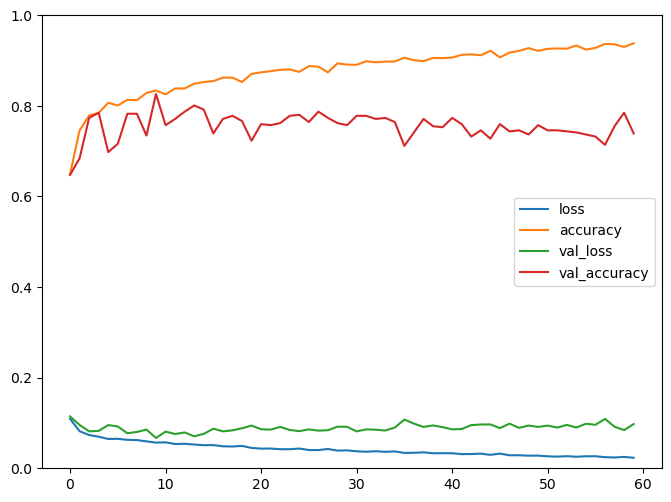

### Results auf test data ###
Accuracy for person  3 :  0.75
[[17 11  0  0]
 [ 0 23  5  0]
 [ 0 12 16  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1114 - accuracy: 0.6426 - val_loss: 0.1220 - val_accuracy: 0.6499
Epoch 2/500
197/197 - 0s - loss: 0.0812 - accuracy: 0.7398 - val_loss: 0.1108 - val_accuracy: 0.7002
Epoch 3/500
197/197 - 0s - loss: 0.0751 - accuracy: 0.7637 - val_loss: 0.1172 - val_accuracy: 0.6773
Epoch 4/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7856 - val_loss: 0.1026 - val_accuracy: 0.7414
Epoch 5/500
197/197 - 0s - loss: 0.0665 - accuracy: 0.7995 - val_loss: 0.0960 - val_accuracy: 0.7231
Epoch 6/500
197/197 - 0s - loss: 0.0635 - accuracy: 0.8064 - val_loss: 0.0876 - val_accuracy: 0.7506
Epoch 7/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8201 - val_loss: 0.0838 - val_accuracy: 0.7574
Epoch 8/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8199 - val_loss: 0.0821 - val_accuracy: 0.7849
Epoch 9/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8217 - val_loss:

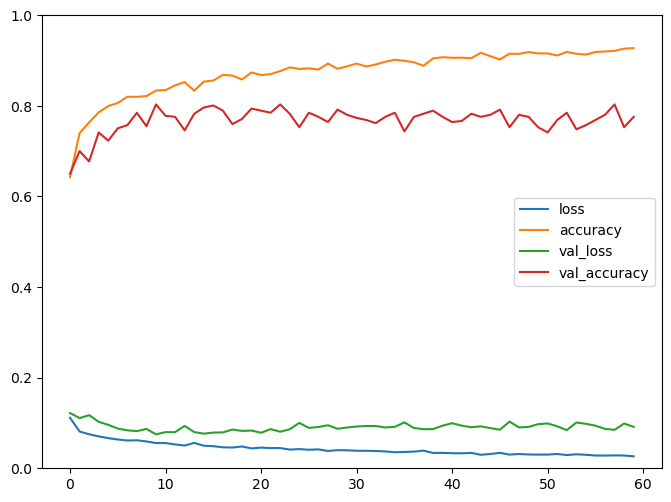

### Results auf test data ###
Accuracy for person  4 :  0.9553571428571429
[[28  0  0  0]
 [ 2 26  0  0]
 [ 0  0 28  0]
 [ 0  0  3 25]]
Epoch 1/500
197/197 - 0s - loss: 0.1117 - accuracy: 0.6322 - val_loss: 0.1159 - val_accuracy: 0.6339
Epoch 2/500
197/197 - 0s - loss: 0.0819 - accuracy: 0.7489 - val_loss: 0.1148 - val_accuracy: 0.6316
Epoch 3/500
197/197 - 0s - loss: 0.0747 - accuracy: 0.7680 - val_loss: 0.0973 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0687 - accuracy: 0.7957 - val_loss: 0.0912 - val_accuracy: 0.7506
Epoch 5/500
197/197 - 0s - loss: 0.0676 - accuracy: 0.7894 - val_loss: 0.0972 - val_accuracy: 0.6796
Epoch 6/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8049 - val_loss: 0.0860 - val_accuracy: 0.7391
Epoch 7/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8196 - val_loss: 0.0947 - val_accuracy: 0.6888
Epoch 8/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8156 - val_loss: 0.0805 - val_accuracy: 0.7460
Epoch 9/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.82

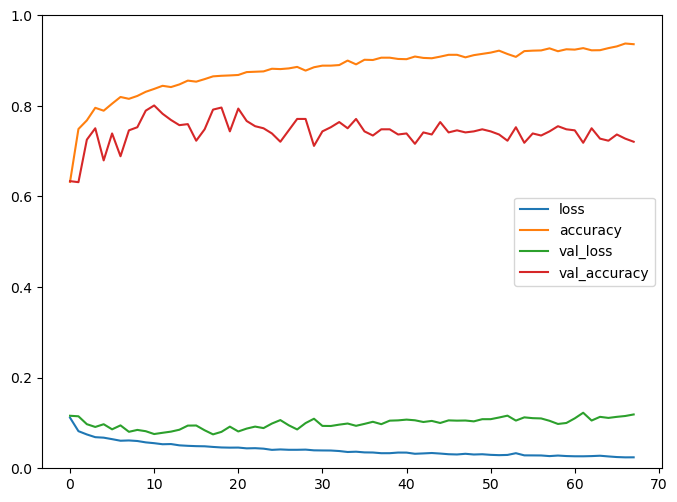

### Results auf test data ###
Accuracy for person  5 :  0.8839285714285714
[[24  4  0  0]
 [ 0 19  9  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1120 - accuracy: 0.6502 - val_loss: 0.1088 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0817 - accuracy: 0.7474 - val_loss: 0.0982 - val_accuracy: 0.6911
Epoch 3/500
197/197 - 0s - loss: 0.0748 - accuracy: 0.7708 - val_loss: 0.0981 - val_accuracy: 0.7368
Epoch 4/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7901 - val_loss: 0.0932 - val_accuracy: 0.6888
Epoch 5/500
197/197 - 0s - loss: 0.0665 - accuracy: 0.7952 - val_loss: 0.0981 - val_accuracy: 0.7208
Epoch 6/500
197/197 - 0s - loss: 0.0623 - accuracy: 0.8163 - val_loss: 0.0848 - val_accuracy: 0.7597
Epoch 7/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8092 - val_loss: 0.0960 - val_accuracy: 0.6773
Epoch 8/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8235 - val_loss: 0.0709 - val_accuracy: 0.8101
Epoch 9/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.81

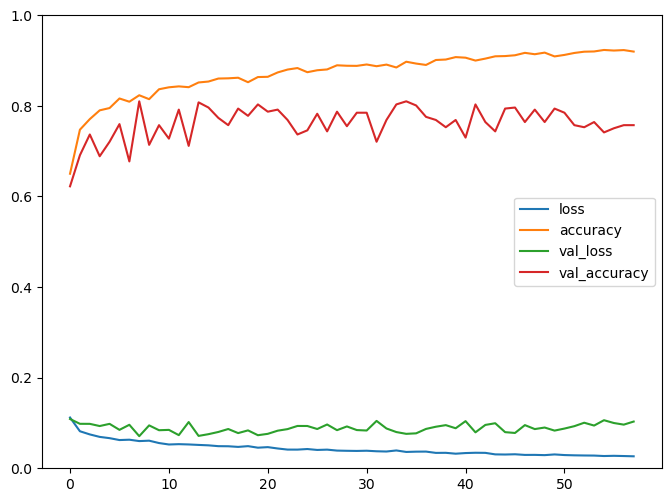

### Results auf test data ###
Accuracy for person  6 :  0.8214285714285714
[[28  0  0  0]
 [ 5 22  1  0]
 [ 6  8 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1096 - accuracy: 0.6533 - val_loss: 0.1096 - val_accuracy: 0.7048
Epoch 2/500
197/197 - 0s - loss: 0.0781 - accuracy: 0.7601 - val_loss: 0.0967 - val_accuracy: 0.7437
Epoch 3/500
197/197 - 0s - loss: 0.0720 - accuracy: 0.7833 - val_loss: 0.0949 - val_accuracy: 0.7666
Epoch 4/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7906 - val_loss: 0.0929 - val_accuracy: 0.7368
Epoch 5/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.8021 - val_loss: 0.0822 - val_accuracy: 0.7391
Epoch 6/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8135 - val_loss: 0.0873 - val_accuracy: 0.7346
Epoch 7/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8191 - val_loss: 0.0812 - val_accuracy: 0.7803
Epoch 8/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8151 - val_loss: 0.0846 - val_accuracy: 0.7597
Epoch 9/500
197/197 - 0s - loss: 0.0584 - accuracy: 0.82

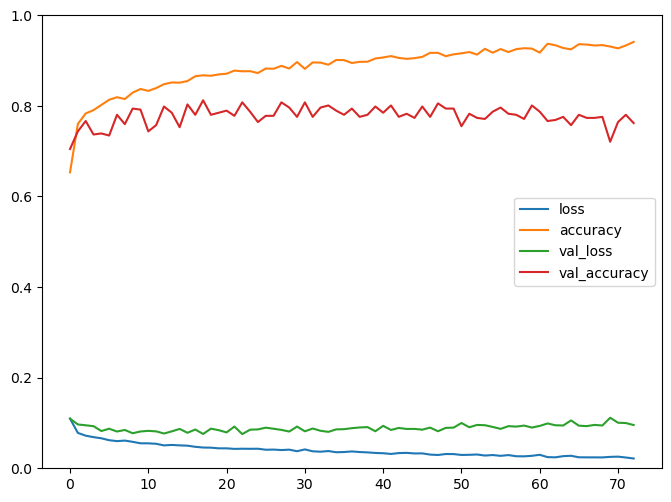

### Results auf test data ###
Accuracy for person  7 :  0.6071428571428571
[[20  0  8  0]
 [ 0 21  7  0]
 [ 7 14  7  0]
 [ 0  3  5 20]]
Epoch 1/500
197/197 - 0s - loss: 0.1068 - accuracy: 0.6634 - val_loss: 0.1072 - val_accuracy: 0.6911
Epoch 2/500
197/197 - 0s - loss: 0.0801 - accuracy: 0.7494 - val_loss: 0.1060 - val_accuracy: 0.6705
Epoch 3/500
197/197 - 0s - loss: 0.0722 - accuracy: 0.7769 - val_loss: 0.0920 - val_accuracy: 0.6979
Epoch 4/500
197/197 - 0s - loss: 0.0674 - accuracy: 0.7990 - val_loss: 0.0925 - val_accuracy: 0.7162
Epoch 5/500
197/197 - 0s - loss: 0.0652 - accuracy: 0.8097 - val_loss: 0.0842 - val_accuracy: 0.7551
Epoch 6/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8235 - val_loss: 0.0749 - val_accuracy: 0.7918
Epoch 7/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8232 - val_loss: 0.0649 - val_accuracy: 0.8261
Epoch 8/500
197/197 - 0s - loss: 0.0577 - accuracy: 0.8301 - val_loss: 0.0683 - val_accuracy: 0.8101
Epoch 9/500
197/197 - 0s - loss: 0.0560 - accuracy: 0.83

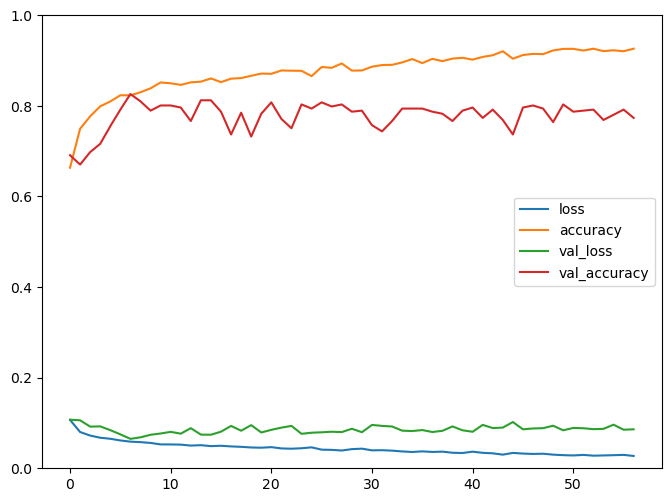

### Results auf test data ###
Accuracy for person  8 :  0.6785714285714286
[[20  8  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1071 - accuracy: 0.6578 - val_loss: 0.1007 - val_accuracy: 0.7254
Epoch 2/500
197/197 - 0s - loss: 0.0807 - accuracy: 0.7423 - val_loss: 0.0886 - val_accuracy: 0.7071
Epoch 3/500
197/197 - 0s - loss: 0.0721 - accuracy: 0.7792 - val_loss: 0.0890 - val_accuracy: 0.7277
Epoch 4/500
197/197 - 0s - loss: 0.0713 - accuracy: 0.7833 - val_loss: 0.0830 - val_accuracy: 0.7323
Epoch 5/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.8018 - val_loss: 0.0902 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8123 - val_loss: 0.0644 - val_accuracy: 0.8169
Epoch 7/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8207 - val_loss: 0.0767 - val_accuracy: 0.7735
Epoch 8/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8224 - val_loss: 0.0807 - val_accuracy: 0.7918
Epoch 9/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.82

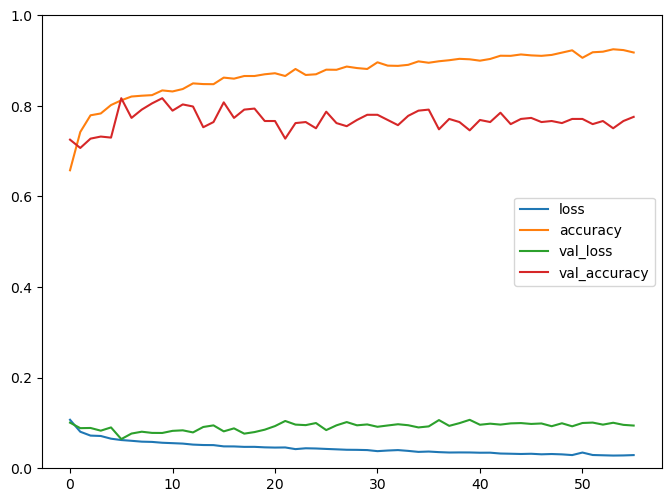

### Results auf test data ###
Accuracy for person  9 :  0.6875
[[25  0  3  0]
 [14 10  4  0]
 [ 5  7 14  2]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1126 - accuracy: 0.6459 - val_loss: 0.1167 - val_accuracy: 0.6362
Epoch 2/500
197/197 - 0s - loss: 0.0800 - accuracy: 0.7548 - val_loss: 0.1137 - val_accuracy: 0.6362
Epoch 3/500
197/197 - 0s - loss: 0.0755 - accuracy: 0.7746 - val_loss: 0.1171 - val_accuracy: 0.6705
Epoch 4/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7919 - val_loss: 0.0963 - val_accuracy: 0.7094
Epoch 5/500
197/197 - 0s - loss: 0.0656 - accuracy: 0.8046 - val_loss: 0.0871 - val_accuracy: 0.7643
Epoch 6/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8186 - val_loss: 0.0864 - val_accuracy: 0.7574
Epoch 7/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8227 - val_loss: 0.1015 - val_accuracy: 0.7277
Epoch 8/500
197/197 - 0s - loss: 0.0570 - accuracy: 0.8408 - val_loss: 0.0802 - val_accuracy: 0.7918
Epoch 9/500
197/197 - 0s - loss: 0.0563 - accuracy: 0.8357 - val_los

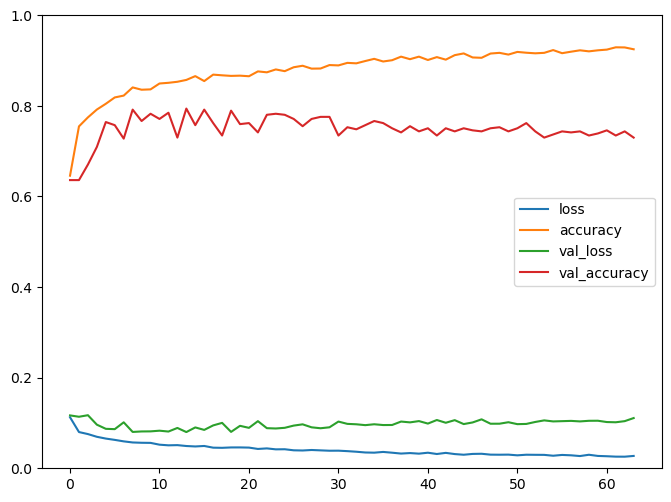

### Results auf test data ###
Accuracy for person  10 :  0.8214285714285714
[[22  6  0  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1112 - accuracy: 0.6489 - val_loss: 0.1000 - val_accuracy: 0.6773
Epoch 2/500
197/197 - 0s - loss: 0.0816 - accuracy: 0.7426 - val_loss: 0.1279 - val_accuracy: 0.5721
Epoch 3/500
197/197 - 0s - loss: 0.0726 - accuracy: 0.7858 - val_loss: 0.0780 - val_accuracy: 0.7895
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7911 - val_loss: 0.0779 - val_accuracy: 0.7780
Epoch 5/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7894 - val_loss: 0.0785 - val_accuracy: 0.7941
Epoch 6/500
197/197 - 0s - loss: 0.0635 - accuracy: 0.8100 - val_loss: 0.0765 - val_accuracy: 0.7895
Epoch 7/500
197/197 - 0s - loss: 0.0628 - accuracy: 0.8115 - val_loss: 0.0739 - val_accuracy: 0.8192
Epoch 8/500
197/197 - 0s - loss: 0.0583 - accuracy: 0.8308 - val_loss: 0.0781 - val_accuracy: 0.7849
Epoch 9/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8

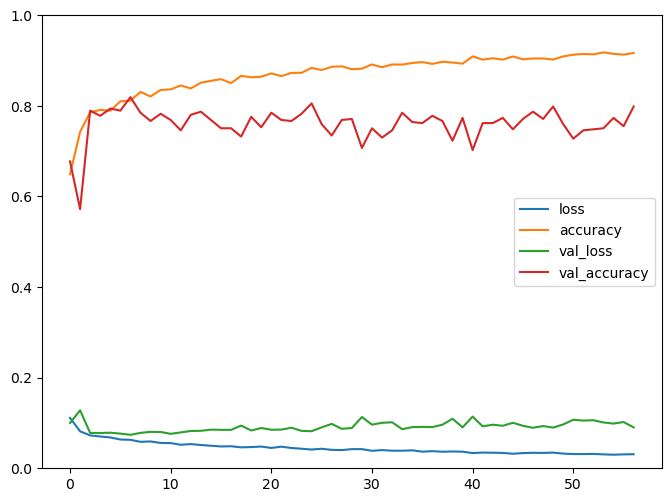

### Results auf test data ###
Accuracy for person  11 :  0.8214285714285714
[[20  8  0  0]
 [ 0 28  0  0]
 [ 0 12 16  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1074 - accuracy: 0.6500 - val_loss: 0.1074 - val_accuracy: 0.7094
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7466 - val_loss: 0.1007 - val_accuracy: 0.6545
Epoch 3/500
197/197 - 0s - loss: 0.0742 - accuracy: 0.7695 - val_loss: 0.0832 - val_accuracy: 0.7666
Epoch 4/500
197/197 - 0s - loss: 0.0707 - accuracy: 0.7794 - val_loss: 0.0807 - val_accuracy: 0.7826
Epoch 5/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.7993 - val_loss: 0.0794 - val_accuracy: 0.7986
Epoch 6/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8102 - val_loss: 0.0773 - val_accuracy: 0.7918
Epoch 7/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8176 - val_loss: 0.0747 - val_accuracy: 0.8009
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8128 - val_loss: 0.0821 - val_accuracy: 0.7757
Epoch 9/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8

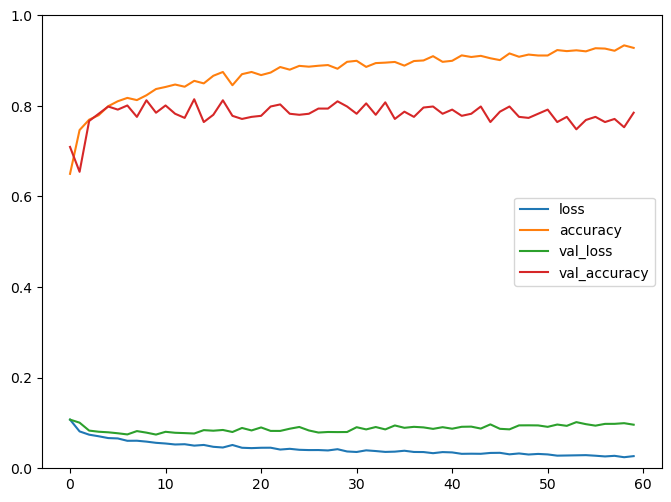

### Results auf test data ###
Accuracy for person  12 :  0.8928571428571429
[[20  8  0  0]
 [ 0 28  0  0]
 [ 0  4 24  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1089 - accuracy: 0.6454 - val_loss: 0.1122 - val_accuracy: 0.6110
Epoch 2/500
197/197 - 0s - loss: 0.0822 - accuracy: 0.7390 - val_loss: 0.1071 - val_accuracy: 0.6545
Epoch 3/500
197/197 - 0s - loss: 0.0731 - accuracy: 0.7782 - val_loss: 0.0937 - val_accuracy: 0.7025
Epoch 4/500
197/197 - 0s - loss: 0.0705 - accuracy: 0.7858 - val_loss: 0.0953 - val_accuracy: 0.7117
Epoch 5/500
197/197 - 0s - loss: 0.0660 - accuracy: 0.8051 - val_loss: 0.0847 - val_accuracy: 0.7574
Epoch 6/500
197/197 - 0s - loss: 0.0655 - accuracy: 0.7993 - val_loss: 0.0841 - val_accuracy: 0.7689
Epoch 7/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8301 - val_loss: 0.0893 - val_accuracy: 0.7460
Epoch 8/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8166 - val_loss: 0.0850 - val_accuracy: 0.7597
Epoch 9/500
197/197 - 0s - loss: 0.0570 - accuracy: 0.8

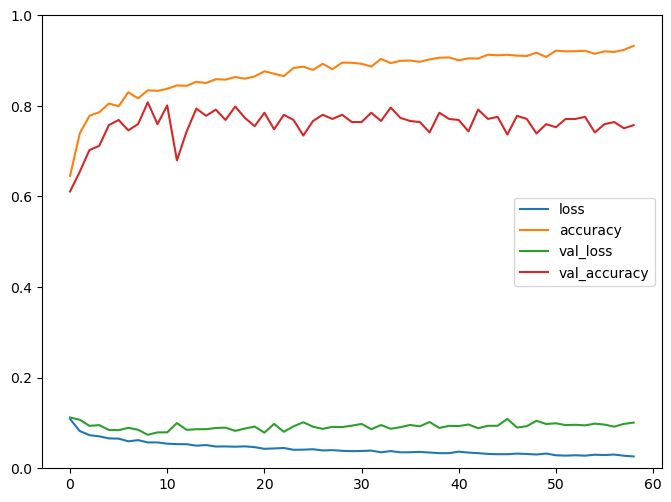

### Results auf test data ###
Accuracy for person  13 :  0.8125
[[28  0  0  0]
 [ 0 28  0  0]
 [ 1 20  7  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1114 - accuracy: 0.6510 - val_loss: 0.1123 - val_accuracy: 0.6636
Epoch 2/500
197/197 - 0s - loss: 0.0831 - accuracy: 0.7382 - val_loss: 0.1102 - val_accuracy: 0.6453
Epoch 3/500
197/197 - 0s - loss: 0.0761 - accuracy: 0.7627 - val_loss: 0.1198 - val_accuracy: 0.6339
Epoch 4/500
197/197 - 0s - loss: 0.0716 - accuracy: 0.7828 - val_loss: 0.0948 - val_accuracy: 0.7368
Epoch 5/500
197/197 - 0s - loss: 0.0677 - accuracy: 0.7947 - val_loss: 0.0849 - val_accuracy: 0.7254
Epoch 6/500
197/197 - 0s - loss: 0.0674 - accuracy: 0.7980 - val_loss: 0.0917 - val_accuracy: 0.7002
Epoch 7/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8163 - val_loss: 0.0826 - val_accuracy: 0.7780
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8168 - val_loss: 0.0834 - val_accuracy: 0.7757
Epoch 9/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8204 - val_lo

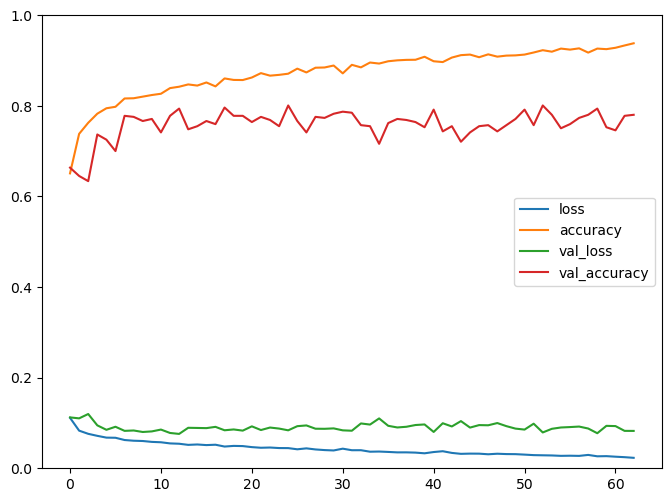

### Results auf test data ###
Accuracy for person  14 :  0.9910714285714286
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0  1 27  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1098 - accuracy: 0.6385 - val_loss: 0.1114 - val_accuracy: 0.6682
Epoch 2/500
197/197 - 0s - loss: 0.0816 - accuracy: 0.7469 - val_loss: 0.1081 - val_accuracy: 0.6613
Epoch 3/500
197/197 - 0s - loss: 0.0728 - accuracy: 0.7784 - val_loss: 0.0966 - val_accuracy: 0.6819
Epoch 4/500
197/197 - 0s - loss: 0.0673 - accuracy: 0.8011 - val_loss: 0.0925 - val_accuracy: 0.7437
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.7957 - val_loss: 0.0903 - val_accuracy: 0.7368
Epoch 6/500
197/197 - 0s - loss: 0.0648 - accuracy: 0.8087 - val_loss: 0.0814 - val_accuracy: 0.7757
Epoch 7/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8298 - val_loss: 0.0808 - val_accuracy: 0.7735
Epoch 8/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8232 - val_loss: 0.0807 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0565 - accuracy: 0.8

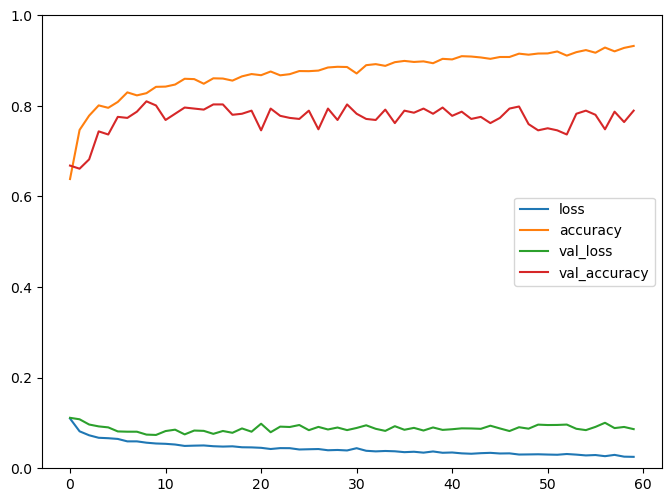

### Results auf test data ###
Accuracy for person  15 :  0.6428571428571429
[[26  0  2  0]
 [19  6  3  0]
 [11  3 14  0]
 [ 0  0  2 26]]
Epoch 1/500
197/197 - 0s - loss: 0.1088 - accuracy: 0.6640 - val_loss: 0.1144 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0806 - accuracy: 0.7504 - val_loss: 0.1102 - val_accuracy: 0.7140
Epoch 3/500
197/197 - 0s - loss: 0.0751 - accuracy: 0.7718 - val_loss: 0.1071 - val_accuracy: 0.6888
Epoch 4/500
197/197 - 0s - loss: 0.0701 - accuracy: 0.7843 - val_loss: 0.1082 - val_accuracy: 0.6979
Epoch 5/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.8011 - val_loss: 0.1075 - val_accuracy: 0.6865
Epoch 6/500
197/197 - 0s - loss: 0.0648 - accuracy: 0.8062 - val_loss: 0.0904 - val_accuracy: 0.7483
Epoch 7/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8204 - val_loss: 0.1030 - val_accuracy: 0.6773
Epoch 8/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8219 - val_loss: 0.0811 - val_accuracy: 0.7757
Epoch 9/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8

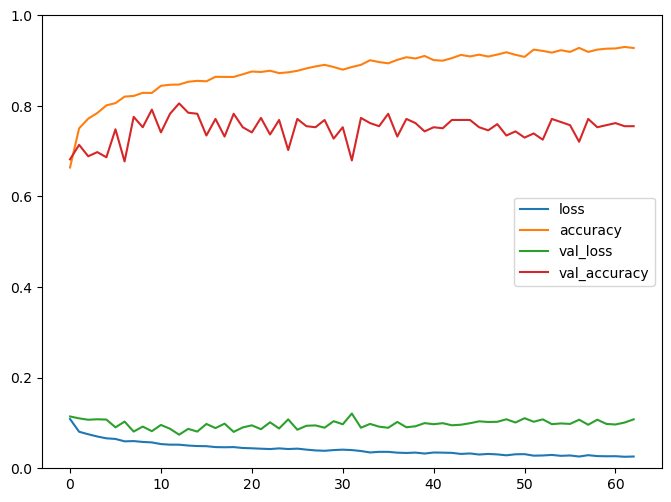

### Results auf test data ###
Accuracy for person  16 :  0.875
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1023 - accuracy: 0.6955 - val_loss: 0.1110 - val_accuracy: 0.6499
Epoch 2/500
197/197 - 0s - loss: 0.0788 - accuracy: 0.7492 - val_loss: 0.1020 - val_accuracy: 0.7208
Epoch 3/500
197/197 - 0s - loss: 0.0733 - accuracy: 0.7733 - val_loss: 0.1047 - val_accuracy: 0.6728
Epoch 4/500
197/197 - 0s - loss: 0.0674 - accuracy: 0.8036 - val_loss: 0.0944 - val_accuracy: 0.7483
Epoch 5/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8115 - val_loss: 0.0831 - val_accuracy: 0.7666
Epoch 6/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8143 - val_loss: 0.0807 - val_accuracy: 0.7803
Epoch 7/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8283 - val_loss: 0.0760 - val_accuracy: 0.7849
Epoch 8/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8268 - val_loss: 0.0719 - val_accuracy: 0.7918
Epoch 9/500
197/197 - 0s - loss: 0.0571 - accuracy: 0.8313 - val_los

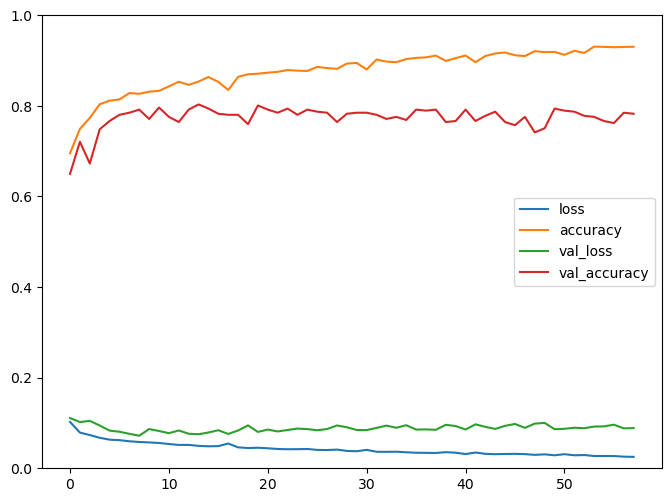

### Results auf test data ###
Accuracy for person  17 :  0.625
[[21  5  2  0]
 [10 18  0  0]
 [17  8  3  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1055 - accuracy: 0.6792 - val_loss: 0.1139 - val_accuracy: 0.7254
Epoch 2/500
197/197 - 0s - loss: 0.0802 - accuracy: 0.7540 - val_loss: 0.0984 - val_accuracy: 0.7117
Epoch 3/500
197/197 - 0s - loss: 0.0737 - accuracy: 0.7703 - val_loss: 0.1086 - val_accuracy: 0.6430
Epoch 4/500
197/197 - 0s - loss: 0.0684 - accuracy: 0.7945 - val_loss: 0.0923 - val_accuracy: 0.7368
Epoch 5/500
197/197 - 0s - loss: 0.0665 - accuracy: 0.8034 - val_loss: 0.0834 - val_accuracy: 0.7895
Epoch 6/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8102 - val_loss: 0.0914 - val_accuracy: 0.7162
Epoch 7/500
197/197 - 0s - loss: 0.0619 - accuracy: 0.8105 - val_loss: 0.0802 - val_accuracy: 0.7689
Epoch 8/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8181 - val_loss: 0.0808 - val_accuracy: 0.7529
Epoch 9/500
197/197 - 0s - loss: 0.0577 - accuracy: 0.8339 - val_los

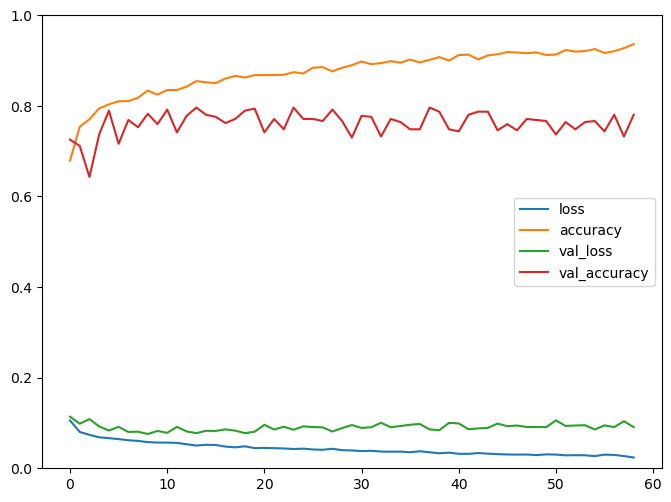

### Results auf test data ###
Accuracy for person  18 :  0.7678571428571429
[[28  0  0  0]
 [11 13  4  0]
 [ 5  6 17  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1060 - accuracy: 0.6708 - val_loss: 0.1292 - val_accuracy: 0.6133
Epoch 2/500
197/197 - 0s - loss: 0.0822 - accuracy: 0.7410 - val_loss: 0.1265 - val_accuracy: 0.6064
Epoch 3/500
197/197 - 0s - loss: 0.0756 - accuracy: 0.7779 - val_loss: 0.1131 - val_accuracy: 0.6522
Epoch 4/500
197/197 - 0s - loss: 0.0708 - accuracy: 0.7835 - val_loss: 0.1028 - val_accuracy: 0.6728
Epoch 5/500
197/197 - 0s - loss: 0.0648 - accuracy: 0.8074 - val_loss: 0.0835 - val_accuracy: 0.7826
Epoch 6/500
197/197 - 0s - loss: 0.0635 - accuracy: 0.8153 - val_loss: 0.1090 - val_accuracy: 0.6590
Epoch 7/500
197/197 - 0s - loss: 0.0642 - accuracy: 0.8097 - val_loss: 0.0796 - val_accuracy: 0.7597
Epoch 8/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8268 - val_loss: 0.0801 - val_accuracy: 0.7918
Epoch 9/500
197/197 - 0s - loss: 0.0577 - accuracy: 0.8

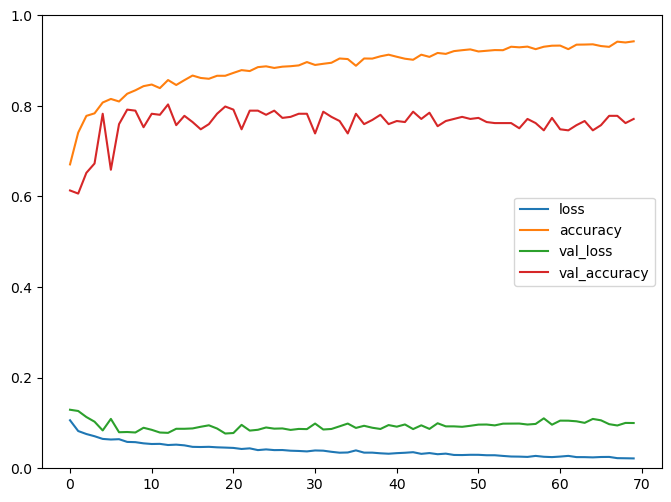

### Results auf test data ###
Accuracy for person  19 :  0.625
[[14 14  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1166 - accuracy: 0.6319 - val_loss: 0.1264 - val_accuracy: 0.5995
Epoch 2/500
197/197 - 0s - loss: 0.0835 - accuracy: 0.7372 - val_loss: 0.1112 - val_accuracy: 0.6590
Epoch 3/500
197/197 - 0s - loss: 0.0756 - accuracy: 0.7624 - val_loss: 0.1083 - val_accuracy: 0.7025
Epoch 4/500
197/197 - 0s - loss: 0.0711 - accuracy: 0.7805 - val_loss: 0.0990 - val_accuracy: 0.7277
Epoch 5/500
197/197 - 0s - loss: 0.0671 - accuracy: 0.7988 - val_loss: 0.0919 - val_accuracy: 0.7323
Epoch 6/500
197/197 - 0s - loss: 0.0672 - accuracy: 0.7922 - val_loss: 0.1066 - val_accuracy: 0.6613
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8123 - val_loss: 0.0849 - val_accuracy: 0.7666
Epoch 8/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8222 - val_loss: 0.0767 - val_accuracy: 0.7803
Epoch 9/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8247 - val_los

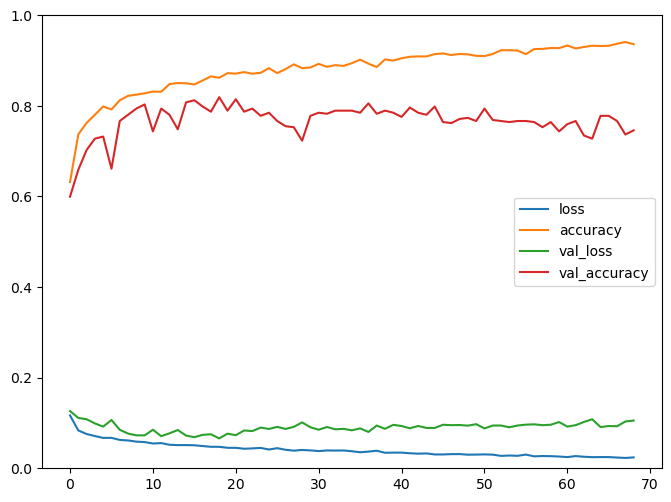

### Results auf test data ###
Accuracy for person  20 :  0.9553571428571429
[[28  0  0  0]
 [ 0 27  1  0]
 [ 0  4 24  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1094 - accuracy: 0.6726 - val_loss: 0.1297 - val_accuracy: 0.6339
Epoch 2/500
197/197 - 0s - loss: 0.0787 - accuracy: 0.7576 - val_loss: 0.1215 - val_accuracy: 0.6178
Epoch 3/500
197/197 - 0s - loss: 0.0745 - accuracy: 0.7728 - val_loss: 0.1103 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0672 - accuracy: 0.8001 - val_loss: 0.1003 - val_accuracy: 0.7277
Epoch 5/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8084 - val_loss: 0.0955 - val_accuracy: 0.7208
Epoch 6/500
197/197 - 0s - loss: 0.0629 - accuracy: 0.8097 - val_loss: 0.0960 - val_accuracy: 0.7414
Epoch 7/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8171 - val_loss: 0.1094 - val_accuracy: 0.6728
Epoch 8/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8235 - val_loss: 0.0919 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8

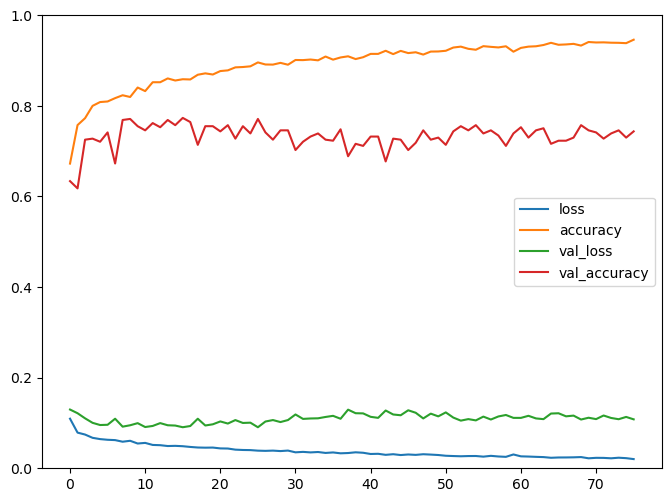

### Results auf test data ###
Accuracy for person  21 :  0.4017857142857143
[[10 13  2  3]
 [ 0 26  2  0]
 [ 0 27  1  0]
 [ 0 20  0  8]]
Epoch 1/500
197/197 - 0s - loss: 0.1090 - accuracy: 0.6548 - val_loss: 0.1214 - val_accuracy: 0.6362
Epoch 2/500
197/197 - 0s - loss: 0.0815 - accuracy: 0.7436 - val_loss: 0.1201 - val_accuracy: 0.6339
Epoch 3/500
197/197 - 0s - loss: 0.0715 - accuracy: 0.7815 - val_loss: 0.1143 - val_accuracy: 0.7025
Epoch 4/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7939 - val_loss: 0.1111 - val_accuracy: 0.7208
Epoch 5/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.8102 - val_loss: 0.1099 - val_accuracy: 0.7140
Epoch 6/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8100 - val_loss: 0.1101 - val_accuracy: 0.7208
Epoch 7/500
197/197 - 0s - loss: 0.0584 - accuracy: 0.8288 - val_loss: 0.1113 - val_accuracy: 0.6865
Epoch 8/500
197/197 - 0s - loss: 0.0566 - accuracy: 0.8397 - val_loss: 0.1107 - val_accuracy: 0.7002
Epoch 9/500
197/197 - 0s - loss: 0.0554 - accuracy: 0.8

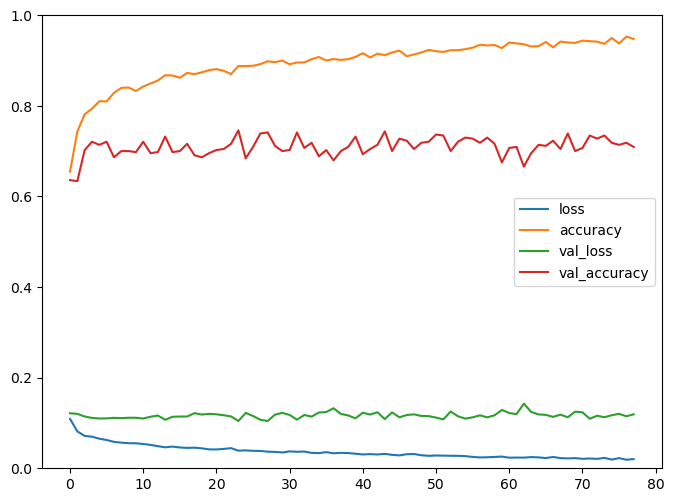

### Results auf test data ###
Accuracy for person  22 :  0.6339285714285714
[[28  0  0  0]
 [ 2  1 14 11]
 [14  0 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1079 - accuracy: 0.6647 - val_loss: 0.1202 - val_accuracy: 0.6133
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7446 - val_loss: 0.1036 - val_accuracy: 0.7002
Epoch 3/500
197/197 - 0s - loss: 0.0740 - accuracy: 0.7728 - val_loss: 0.1220 - val_accuracy: 0.5950
Epoch 4/500
197/197 - 0s - loss: 0.0723 - accuracy: 0.7878 - val_loss: 0.0965 - val_accuracy: 0.6934
Epoch 5/500
197/197 - 0s - loss: 0.0671 - accuracy: 0.8026 - val_loss: 0.0863 - val_accuracy: 0.7574
Epoch 6/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8059 - val_loss: 0.0845 - val_accuracy: 0.7574
Epoch 7/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8227 - val_loss: 0.0758 - val_accuracy: 0.7872
Epoch 8/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8222 - val_loss: 0.0776 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0578 - accuracy: 0.8

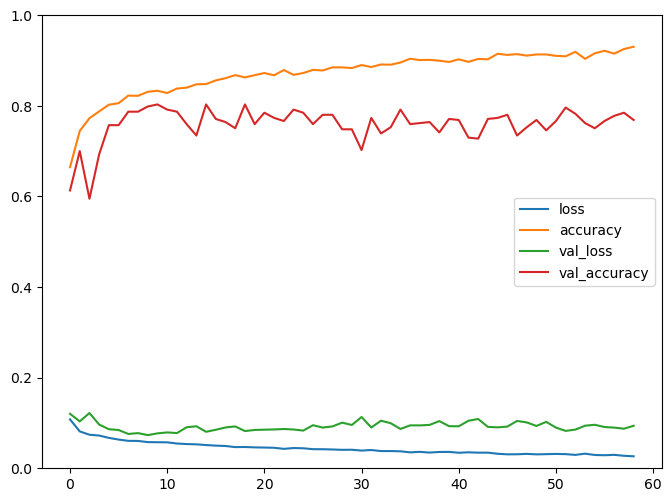

### Results auf test data ###
Accuracy for person  23 :  0.7678571428571429
[[27  0  1  0]
 [ 0 14 13  1]
 [ 0 10 17  1]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1085 - accuracy: 0.6454 - val_loss: 0.1097 - val_accuracy: 0.6316
Epoch 2/500
197/197 - 0s - loss: 0.0806 - accuracy: 0.7487 - val_loss: 0.0920 - val_accuracy: 0.7071
Epoch 3/500
197/197 - 0s - loss: 0.0742 - accuracy: 0.7680 - val_loss: 0.0896 - val_accuracy: 0.7002
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7858 - val_loss: 0.0767 - val_accuracy: 0.7872
Epoch 5/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8006 - val_loss: 0.0768 - val_accuracy: 0.7986
Epoch 6/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.8039 - val_loss: 0.0764 - val_accuracy: 0.7803
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8184 - val_loss: 0.0713 - val_accuracy: 0.7986
Epoch 8/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8156 - val_loss: 0.0903 - val_accuracy: 0.7162
Epoch 9/500
197/197 - 0s - loss: 0.0571 - accuracy: 0.8

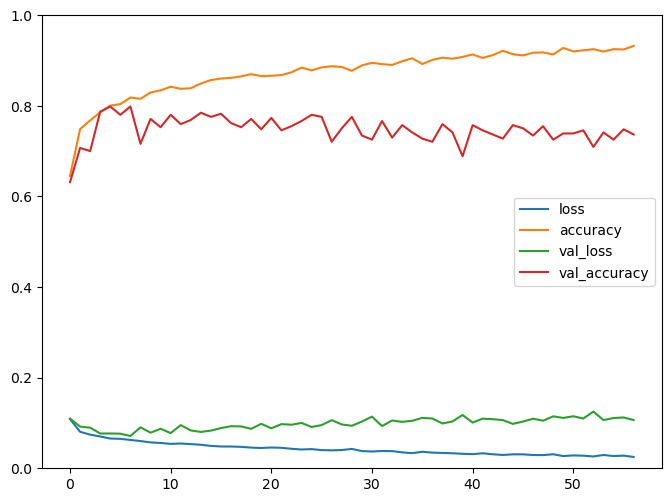

### Results auf test data ###
Accuracy for person  24 :  0.7767857142857143
[[28  0  0  0]
 [ 1 17 10  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1079 - accuracy: 0.6525 - val_loss: 0.1160 - val_accuracy: 0.6087
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7530 - val_loss: 0.1146 - val_accuracy: 0.6705
Epoch 3/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7766 - val_loss: 0.1051 - val_accuracy: 0.7025
Epoch 4/500
197/197 - 0s - loss: 0.0720 - accuracy: 0.7774 - val_loss: 0.0967 - val_accuracy: 0.6934
Epoch 5/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.7983 - val_loss: 0.0778 - val_accuracy: 0.8009
Epoch 6/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.7993 - val_loss: 0.0914 - val_accuracy: 0.7506
Epoch 7/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8204 - val_loss: 0.0776 - val_accuracy: 0.7803
Epoch 8/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8166 - val_loss: 0.0817 - val_accuracy: 0.7735
Epoch 9/500
197/197 - 0s - loss: 0.0565 - accuracy: 0.8

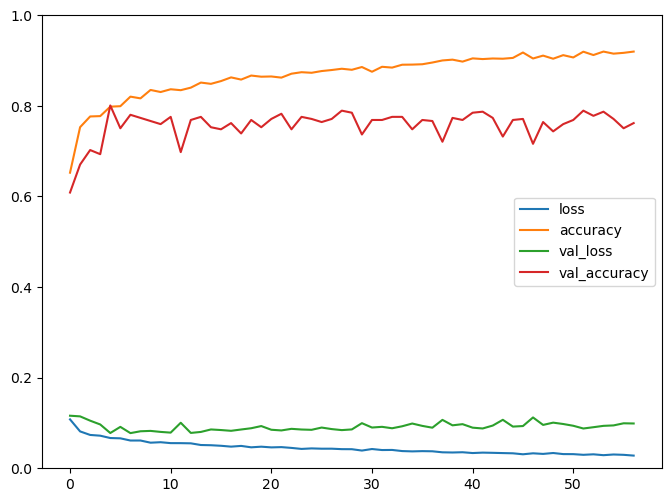

### Results auf test data ###
Accuracy for person  25 :  0.6875
[[25  3  0  0]
 [ 0 28  0  0]
 [ 0 20  8  0]
 [ 0  0 12 16]]
Epoch 1/500
197/197 - 0s - loss: 0.1069 - accuracy: 0.6556 - val_loss: 0.1108 - val_accuracy: 0.6934
Epoch 2/500
197/197 - 0s - loss: 0.0822 - accuracy: 0.7446 - val_loss: 0.1024 - val_accuracy: 0.7071
Epoch 3/500
197/197 - 0s - loss: 0.0752 - accuracy: 0.7639 - val_loss: 0.1008 - val_accuracy: 0.7208
Epoch 4/500
197/197 - 0s - loss: 0.0696 - accuracy: 0.7952 - val_loss: 0.1086 - val_accuracy: 0.6568
Epoch 5/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7853 - val_loss: 0.1091 - val_accuracy: 0.6613
Epoch 6/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8044 - val_loss: 0.0963 - val_accuracy: 0.7048
Epoch 7/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8133 - val_loss: 0.0881 - val_accuracy: 0.7437
Epoch 8/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8250 - val_loss: 0.0884 - val_accuracy: 0.7437
Epoch 9/500
197/197 - 0s - loss: 0.0581 - accuracy: 0.8306 - val_lo

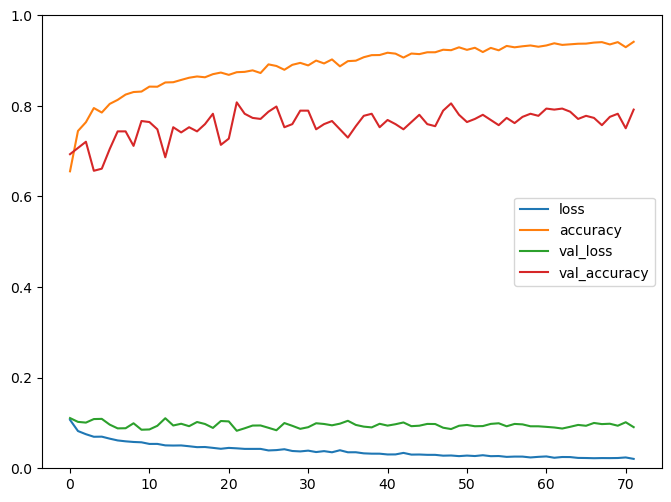

### Results auf test data ###
Accuracy for person  26 :  0.7232142857142857
[[28  0  0  0]
 [ 5 23  0  0]
 [12 14  2  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1082 - accuracy: 0.6479 - val_loss: 0.1197 - val_accuracy: 0.6728
Epoch 2/500
197/197 - 0s - loss: 0.0816 - accuracy: 0.7433 - val_loss: 0.1052 - val_accuracy: 0.7368
Epoch 3/500
197/197 - 0s - loss: 0.0737 - accuracy: 0.7741 - val_loss: 0.1039 - val_accuracy: 0.6499
Epoch 4/500
197/197 - 0s - loss: 0.0715 - accuracy: 0.7789 - val_loss: 0.0947 - val_accuracy: 0.7506
Epoch 5/500
197/197 - 0s - loss: 0.0674 - accuracy: 0.7983 - val_loss: 0.0904 - val_accuracy: 0.7025
Epoch 6/500
197/197 - 0s - loss: 0.0656 - accuracy: 0.8021 - val_loss: 0.0788 - val_accuracy: 0.8078
Epoch 7/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8184 - val_loss: 0.0721 - val_accuracy: 0.8078
Epoch 8/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8229 - val_loss: 0.0823 - val_accuracy: 0.7941
Epoch 9/500
197/197 - 0s - loss: 0.0589 - accuracy: 0.8

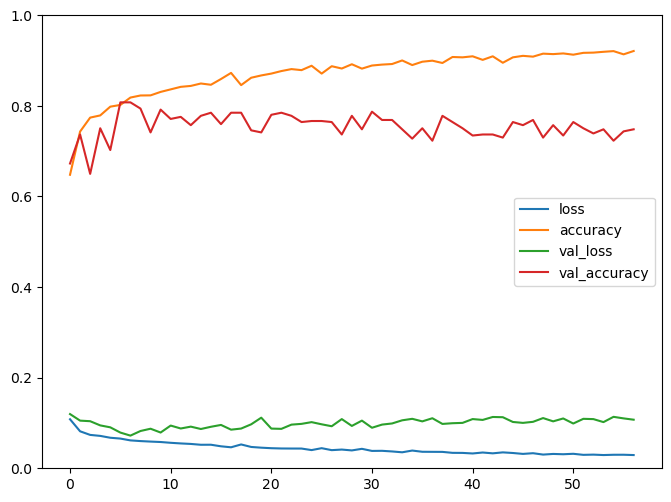

### Results auf test data ###
Accuracy for person  27 :  0.8392857142857143
[[24  1  3  0]
 [ 0 14 14  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1077 - accuracy: 0.6510 - val_loss: 0.1128 - val_accuracy: 0.6064
Epoch 2/500
197/197 - 0s - loss: 0.0779 - accuracy: 0.7583 - val_loss: 0.1072 - val_accuracy: 0.6522
Epoch 3/500
197/197 - 0s - loss: 0.0732 - accuracy: 0.7769 - val_loss: 0.0900 - val_accuracy: 0.6842
Epoch 4/500
197/197 - 0s - loss: 0.0687 - accuracy: 0.7932 - val_loss: 0.0809 - val_accuracy: 0.7849
Epoch 5/500
197/197 - 0s - loss: 0.0648 - accuracy: 0.8051 - val_loss: 0.0787 - val_accuracy: 0.7918
Epoch 6/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8181 - val_loss: 0.0732 - val_accuracy: 0.8124
Epoch 7/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8291 - val_loss: 0.0921 - val_accuracy: 0.7025
Epoch 8/500
197/197 - 0s - loss: 0.0566 - accuracy: 0.8316 - val_loss: 0.0754 - val_accuracy: 0.7918
Epoch 9/500
197/197 - 0s - loss: 0.0579 - accuracy: 0.8

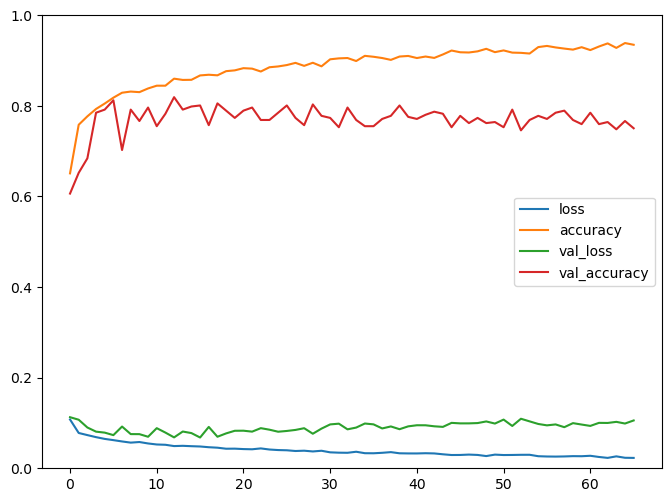

### Results auf test data ###
Accuracy for person  28 :  0.6160714285714286
[[21  6  1  0]
 [ 0  9 19  0]
 [ 0 17 11  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1066 - accuracy: 0.6507 - val_loss: 0.1174 - val_accuracy: 0.6407
Epoch 2/500
197/197 - 0s - loss: 0.0828 - accuracy: 0.7334 - val_loss: 0.1075 - val_accuracy: 0.6590
Epoch 3/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7708 - val_loss: 0.1071 - val_accuracy: 0.6568
Epoch 4/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7825 - val_loss: 0.0797 - val_accuracy: 0.7735
Epoch 5/500
197/197 - 0s - loss: 0.0648 - accuracy: 0.7995 - val_loss: 0.0859 - val_accuracy: 0.7597
Epoch 6/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8097 - val_loss: 0.0784 - val_accuracy: 0.7666
Epoch 7/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8189 - val_loss: 0.0874 - val_accuracy: 0.7643
Epoch 8/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8181 - val_loss: 0.0829 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8

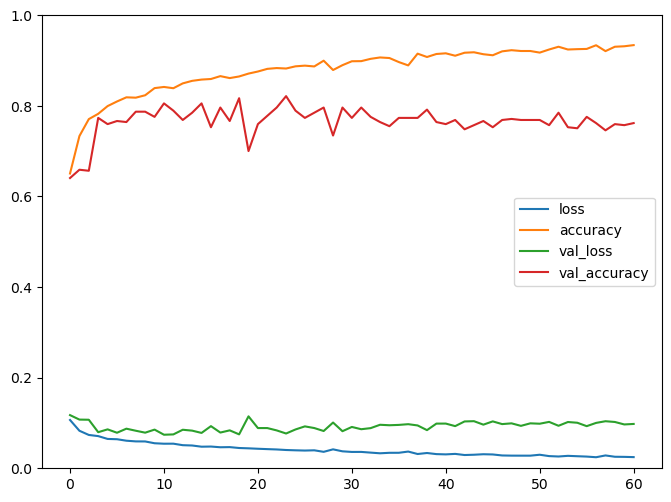

### Results auf test data ###
Accuracy for person  29 :  0.6785714285714286
[[15  0 13  0]
 [ 0 13 15  0]
 [ 0  8 20  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1058 - accuracy: 0.6632 - val_loss: 0.1050 - val_accuracy: 0.6751
Epoch 2/500
197/197 - 0s - loss: 0.0805 - accuracy: 0.7476 - val_loss: 0.1147 - val_accuracy: 0.6430
Epoch 3/500
197/197 - 0s - loss: 0.0744 - accuracy: 0.7744 - val_loss: 0.1022 - val_accuracy: 0.6682
Epoch 4/500
197/197 - 0s - loss: 0.0734 - accuracy: 0.7723 - val_loss: 0.1039 - val_accuracy: 0.6705
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.7993 - val_loss: 0.0789 - val_accuracy: 0.7735
Epoch 6/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8110 - val_loss: 0.0777 - val_accuracy: 0.7872
Epoch 7/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8059 - val_loss: 0.0773 - val_accuracy: 0.7895
Epoch 8/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8250 - val_loss: 0.0872 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.8

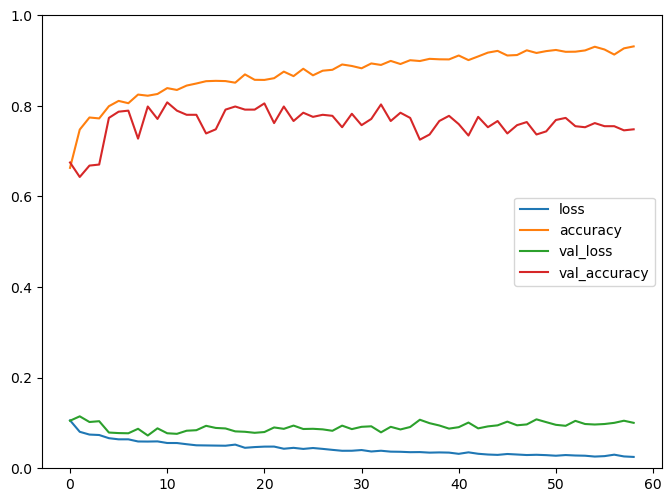

### Results auf test data ###
Accuracy for person  30 :  0.9553571428571429
[[28  0  0  0]
 [ 0 26  2  0]
 [ 0  3 25  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1094 - accuracy: 0.6484 - val_loss: 0.1186 - val_accuracy: 0.6018
Epoch 2/500
197/197 - 0s - loss: 0.0808 - accuracy: 0.7403 - val_loss: 0.1050 - val_accuracy: 0.7002
Epoch 3/500
197/197 - 0s - loss: 0.0754 - accuracy: 0.7705 - val_loss: 0.1020 - val_accuracy: 0.6934
Epoch 4/500
197/197 - 0s - loss: 0.0700 - accuracy: 0.7838 - val_loss: 0.0916 - val_accuracy: 0.7162
Epoch 5/500
197/197 - 0s - loss: 0.0683 - accuracy: 0.7939 - val_loss: 0.1022 - val_accuracy: 0.7094
Epoch 6/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8079 - val_loss: 0.0812 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0635 - accuracy: 0.8097 - val_loss: 0.0873 - val_accuracy: 0.7803
Epoch 8/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8196 - val_loss: 0.0786 - val_accuracy: 0.7643
Epoch 9/500
197/197 - 0s - loss: 0.0576 - accuracy: 0.8

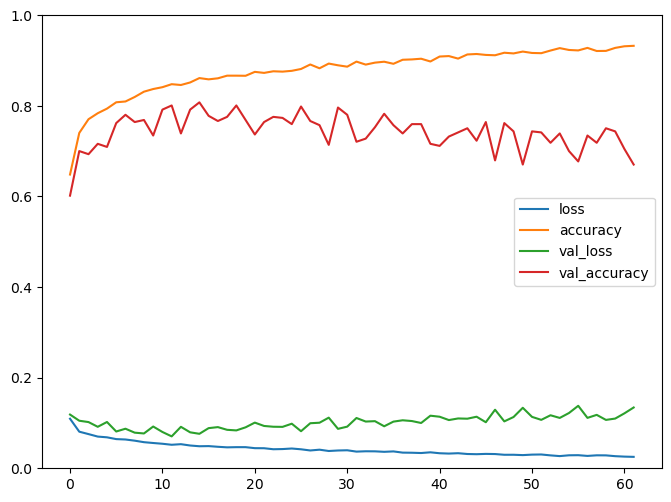

### Results auf test data ###
Accuracy for person  31 :  0.7946428571428571
[[19  6  3  0]
 [ 0 27  1  0]
 [ 0 13 15  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1140 - accuracy: 0.6370 - val_loss: 0.1111 - val_accuracy: 0.6659
Epoch 2/500
197/197 - 0s - loss: 0.0818 - accuracy: 0.7438 - val_loss: 0.1198 - val_accuracy: 0.6293
Epoch 3/500
197/197 - 0s - loss: 0.0757 - accuracy: 0.7642 - val_loss: 0.0971 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0705 - accuracy: 0.7812 - val_loss: 0.0948 - val_accuracy: 0.7208
Epoch 5/500
197/197 - 0s - loss: 0.0656 - accuracy: 0.7973 - val_loss: 0.0890 - val_accuracy: 0.7643
Epoch 6/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8133 - val_loss: 0.0937 - val_accuracy: 0.7048
Epoch 7/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8044 - val_loss: 0.0909 - val_accuracy: 0.7391
Epoch 8/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8158 - val_loss: 0.0787 - val_accuracy: 0.7849
Epoch 9/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8

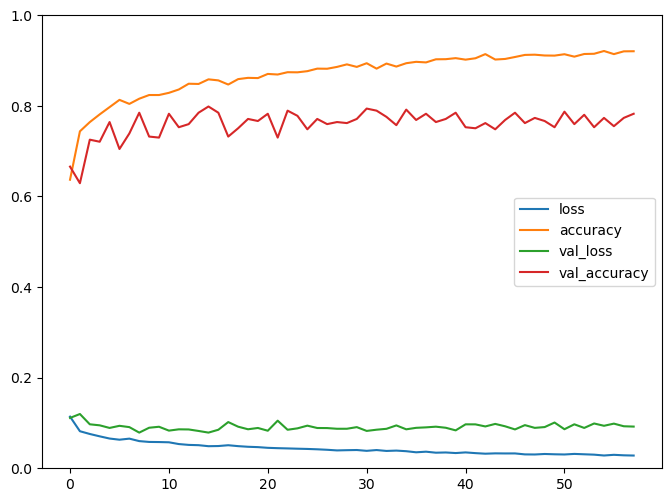

### Results auf test data ###
Accuracy for person  32 :  0.7767857142857143
[[16 12  0  0]
 [ 0 28  0  0]
 [ 0 13 15  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1088 - accuracy: 0.6510 - val_loss: 0.1182 - val_accuracy: 0.6156
Epoch 2/500
197/197 - 0s - loss: 0.0835 - accuracy: 0.7375 - val_loss: 0.1065 - val_accuracy: 0.7162
Epoch 3/500
197/197 - 0s - loss: 0.0764 - accuracy: 0.7532 - val_loss: 0.1111 - val_accuracy: 0.6728
Epoch 4/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7868 - val_loss: 0.0905 - val_accuracy: 0.7254
Epoch 5/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8018 - val_loss: 0.0902 - val_accuracy: 0.7368
Epoch 6/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8105 - val_loss: 0.0784 - val_accuracy: 0.7826
Epoch 7/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8112 - val_loss: 0.0800 - val_accuracy: 0.7780
Epoch 8/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8291 - val_loss: 0.0803 - val_accuracy: 0.7918
Epoch 9/500
197/197 - 0s - loss: 0.0569 - accuracy: 0.8

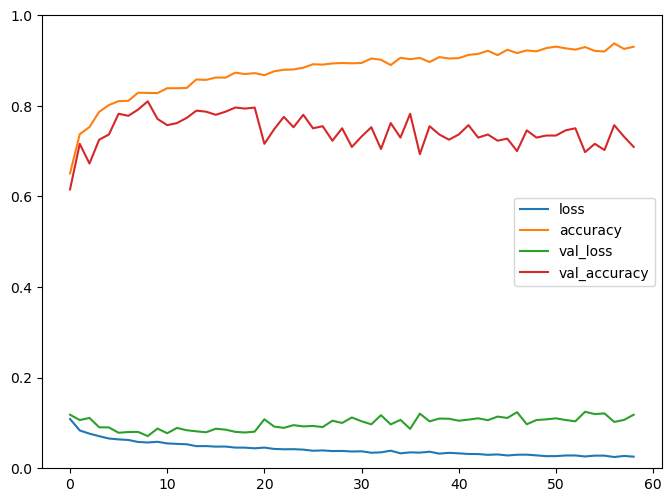

### Results auf test data ###
Accuracy for person  33 :  0.7410714285714286
[[28  0  0  0]
 [ 0 18 10  0]
 [ 5 14  9  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1105 - accuracy: 0.6500 - val_loss: 0.1065 - val_accuracy: 0.6705
Epoch 2/500
197/197 - 0s - loss: 0.0825 - accuracy: 0.7456 - val_loss: 0.1071 - val_accuracy: 0.6659
Epoch 3/500
197/197 - 0s - loss: 0.0744 - accuracy: 0.7772 - val_loss: 0.0974 - val_accuracy: 0.7346
Epoch 4/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7922 - val_loss: 0.0878 - val_accuracy: 0.7666
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.7993 - val_loss: 0.0899 - val_accuracy: 0.7391
Epoch 6/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8095 - val_loss: 0.0955 - val_accuracy: 0.6957
Epoch 7/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8245 - val_loss: 0.0813 - val_accuracy: 0.7963
Epoch 8/500
197/197 - 0s - loss: 0.0587 - accuracy: 0.8280 - val_loss: 0.0805 - val_accuracy: 0.7574
Epoch 9/500
197/197 - 0s - loss: 0.0564 - accuracy: 0.8

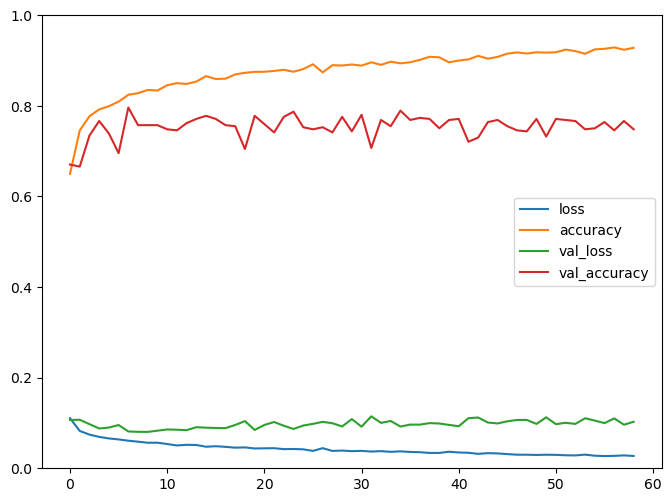

### Results auf test data ###
Accuracy for person  34 :  0.7410714285714286
[[27  0  1  0]
 [ 0  0 27  1]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1049 - accuracy: 0.6606 - val_loss: 0.1167 - val_accuracy: 0.6018
Epoch 2/500
197/197 - 0s - loss: 0.0806 - accuracy: 0.7497 - val_loss: 0.1060 - val_accuracy: 0.6613
Epoch 3/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7772 - val_loss: 0.0970 - val_accuracy: 0.6979
Epoch 4/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7980 - val_loss: 0.0861 - val_accuracy: 0.7391
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.7973 - val_loss: 0.0804 - val_accuracy: 0.7597
Epoch 6/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.7993 - val_loss: 0.0868 - val_accuracy: 0.7689
Epoch 7/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8293 - val_loss: 0.0777 - val_accuracy: 0.7963
Epoch 8/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8179 - val_loss: 0.0882 - val_accuracy: 0.7712
Epoch 9/500
197/197 - 0s - loss: 0.0560 - accuracy: 0.8

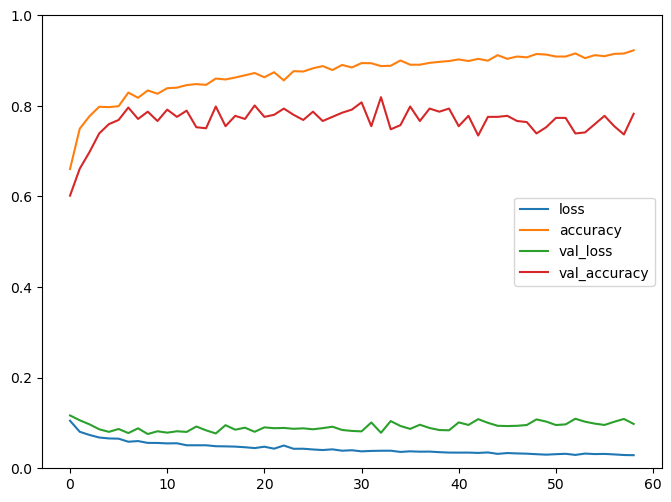

### Results auf test data ###
Accuracy for person  35 :  0.7857142857142857
[[19  2  7  0]
 [ 0 21  7  0]
 [ 0  3 25  0]
 [ 0  0  5 23]]
Epoch 1/500
197/197 - 0s - loss: 0.1115 - accuracy: 0.6461 - val_loss: 0.1152 - val_accuracy: 0.6316
Epoch 2/500
197/197 - 0s - loss: 0.0824 - accuracy: 0.7375 - val_loss: 0.0985 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0754 - accuracy: 0.7708 - val_loss: 0.0957 - val_accuracy: 0.7391
Epoch 4/500
197/197 - 0s - loss: 0.0708 - accuracy: 0.7810 - val_loss: 0.1073 - val_accuracy: 0.6499
Epoch 5/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7909 - val_loss: 0.0852 - val_accuracy: 0.7757
Epoch 6/500
197/197 - 0s - loss: 0.0656 - accuracy: 0.7975 - val_loss: 0.0972 - val_accuracy: 0.7300
Epoch 7/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8176 - val_loss: 0.0927 - val_accuracy: 0.7140
Epoch 8/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8199 - val_loss: 0.0830 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0567 - accuracy: 0.8

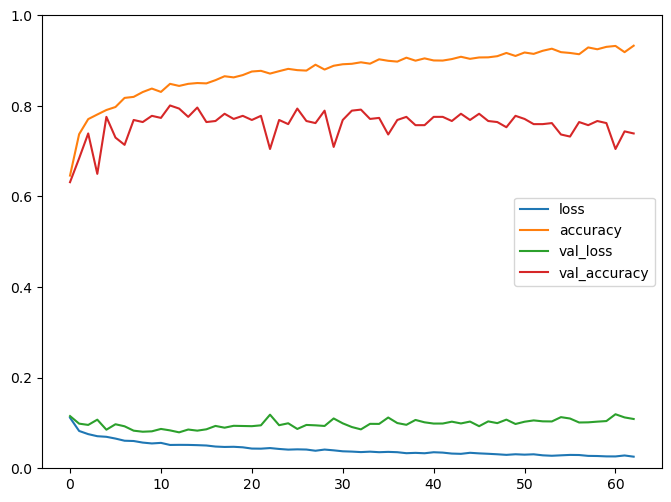

### Results auf test data ###
Accuracy for person  36 :  1.0
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1111 - accuracy: 0.6500 - val_loss: 0.1059 - val_accuracy: 0.7071
Epoch 2/500
197/197 - 0s - loss: 0.0808 - accuracy: 0.7456 - val_loss: 0.1049 - val_accuracy: 0.7140
Epoch 3/500
197/197 - 0s - loss: 0.0760 - accuracy: 0.7672 - val_loss: 0.1001 - val_accuracy: 0.6934
Epoch 4/500
197/197 - 0s - loss: 0.0711 - accuracy: 0.7830 - val_loss: 0.0920 - val_accuracy: 0.7529
Epoch 5/500
197/197 - 0s - loss: 0.0663 - accuracy: 0.8021 - val_loss: 0.0926 - val_accuracy: 0.7071
Epoch 6/500
197/197 - 0s - loss: 0.0651 - accuracy: 0.8034 - val_loss: 0.0845 - val_accuracy: 0.7757
Epoch 7/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8100 - val_loss: 0.0858 - val_accuracy: 0.7826
Epoch 8/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8217 - val_loss: 0.0897 - val_accuracy: 0.7460
Epoch 9/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8189 - val_loss:

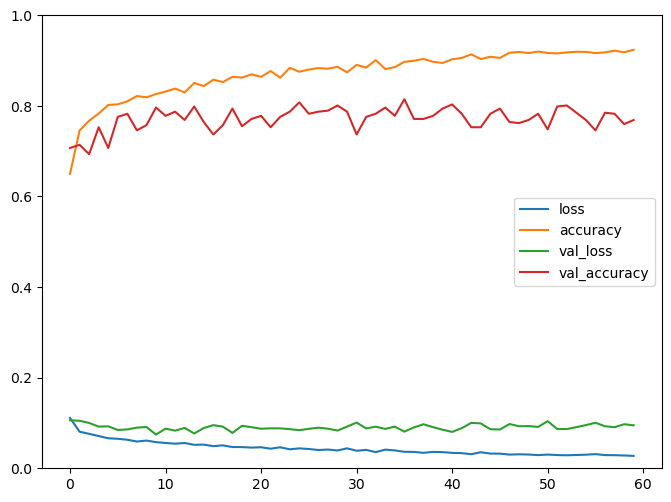

### Results auf test data ###
Accuracy for person  37 :  0.9732142857142857
[[28  0  0  0]
 [ 0 28  0  0]
 [ 3  0 25  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1096 - accuracy: 0.6566 - val_loss: 0.1006 - val_accuracy: 0.7002
Epoch 2/500
197/197 - 0s - loss: 0.0834 - accuracy: 0.7321 - val_loss: 0.1019 - val_accuracy: 0.6957
Epoch 3/500
197/197 - 0s - loss: 0.0754 - accuracy: 0.7713 - val_loss: 0.1107 - val_accuracy: 0.6636
Epoch 4/500
197/197 - 0s - loss: 0.0701 - accuracy: 0.7883 - val_loss: 0.0899 - val_accuracy: 0.7780
Epoch 5/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7955 - val_loss: 0.0918 - val_accuracy: 0.7529
Epoch 6/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8064 - val_loss: 0.0853 - val_accuracy: 0.8055
Epoch 7/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8095 - val_loss: 0.0772 - val_accuracy: 0.8284
Epoch 8/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8270 - val_loss: 0.0737 - val_accuracy: 0.8101
Epoch 9/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8

197/197 - 0s - loss: 0.0204 - accuracy: 0.9440 - val_loss: 0.0733 - val_accuracy: 0.8124
Epoch 81/500
197/197 - 0s - loss: 0.0201 - accuracy: 0.9481 - val_loss: 0.0684 - val_accuracy: 0.8284
Epoch 82/500
197/197 - 0s - loss: 0.0217 - accuracy: 0.9423 - val_loss: 0.0837 - val_accuracy: 0.7826
Epoch 83/500
197/197 - 0s - loss: 0.0203 - accuracy: 0.9481 - val_loss: 0.0698 - val_accuracy: 0.8192
Model: "sequential_120"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                16020     
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 17,074
Trainable params: 17,074
Non-trainable params: 0
_________________________________________________

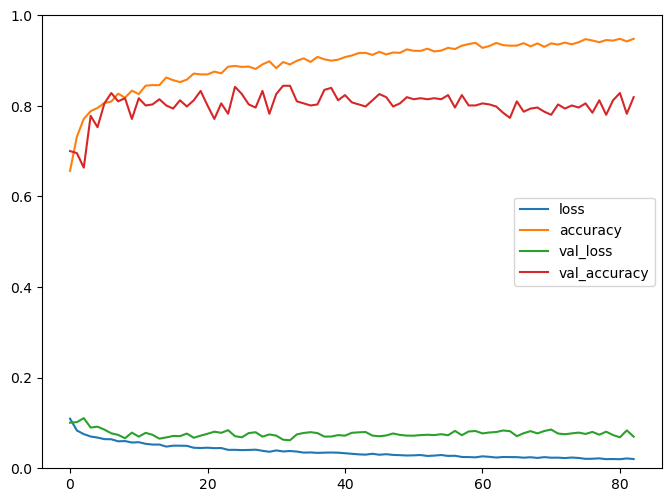

### Results auf test data ###
Accuracy for person  38 :  0.9017857142857143
[[28  0  0  0]
 [ 0 22  6  0]
 [ 0  5 23  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1095 - accuracy: 0.6510 - val_loss: 0.0755 - val_accuracy: 0.7185
Epoch 2/500
197/197 - 0s - loss: 0.0848 - accuracy: 0.7260 - val_loss: 0.0568 - val_accuracy: 0.8467
Epoch 3/500
197/197 - 0s - loss: 0.0767 - accuracy: 0.7532 - val_loss: 0.0548 - val_accuracy: 0.8421
Epoch 4/500
197/197 - 0s - loss: 0.0720 - accuracy: 0.7787 - val_loss: 0.0524 - val_accuracy: 0.8444
Epoch 5/500
197/197 - 0s - loss: 0.0703 - accuracy: 0.7822 - val_loss: 0.0466 - val_accuracy: 0.8924
Epoch 6/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8084 - val_loss: 0.0505 - val_accuracy: 0.8696
Epoch 7/500
197/197 - 0s - loss: 0.0623 - accuracy: 0.8143 - val_loss: 0.0449 - val_accuracy: 0.9016
Epoch 8/500
197/197 - 0s - loss: 0.0585 - accuracy: 0.8285 - val_loss: 0.0413 - val_accuracy: 0.9016
Epoch 9/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8

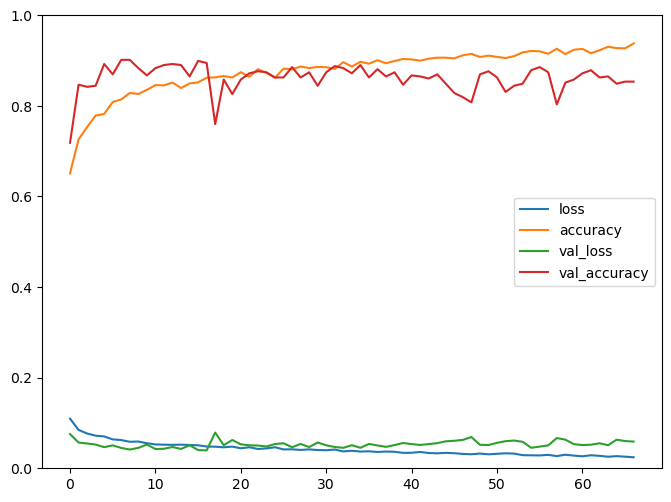

### Results auf test data ###
Accuracy for person  39 :  0.38392857142857145
[[ 3 25  0  0]
 [ 0 12  0 16]
 [ 0 10  0 18]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1081 - accuracy: 0.6566 - val_loss: 0.1094 - val_accuracy: 0.7231
Epoch 2/500
197/197 - 0s - loss: 0.0826 - accuracy: 0.7454 - val_loss: 0.1051 - val_accuracy: 0.7185
Epoch 3/500
197/197 - 0s - loss: 0.0746 - accuracy: 0.7690 - val_loss: 0.1000 - val_accuracy: 0.7346
Epoch 4/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7937 - val_loss: 0.1011 - val_accuracy: 0.6888
Epoch 5/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7932 - val_loss: 0.0835 - val_accuracy: 0.7162
Epoch 6/500
197/197 - 0s - loss: 0.0660 - accuracy: 0.7993 - val_loss: 0.0708 - val_accuracy: 0.8215
Epoch 7/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8161 - val_loss: 0.0707 - val_accuracy: 0.8330
Epoch 8/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8257 - val_loss: 0.0775 - val_accuracy: 0.8169
Epoch 9/500
197/197 - 0s - loss: 0.0570 - accuracy: 0.

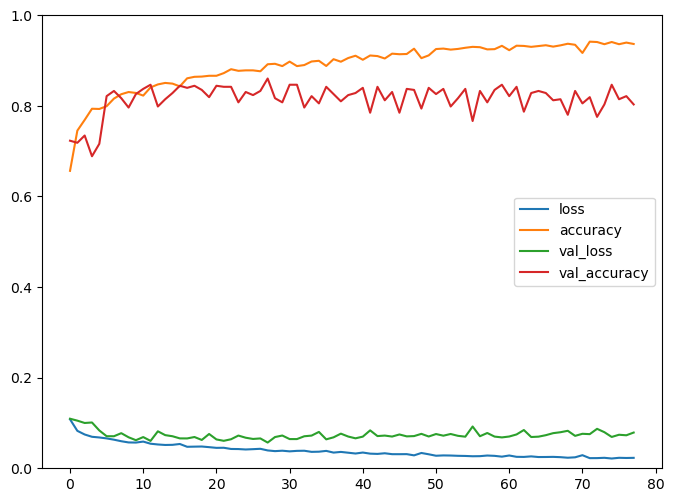

### Results auf test data ###
Accuracy for person  40 :  0.7321428571428571
[[28  0  0  0]
 [ 0 22  6  0]
 [10 14  4  0]
 [ 0  0  0 28]]

 ##### overall accuracy:  0.7671875 #####


In [27]:
# Ergebnis auf b)

accuracies = testANN_b(hp_ann_small, n_attributes, n_classes)
results_b[2] = accuracies

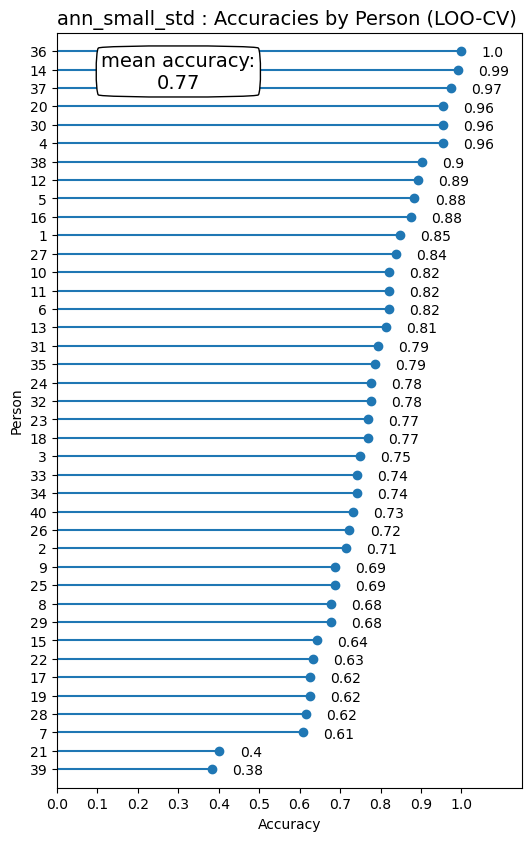

In [28]:
lolli_plot('ann_small_std')

### Großes Neuronales Netz  mit StandardScaler

Epoch 1/500
182/182 - 0s - loss: 0.0879 - accuracy: 0.7461 - val_loss: 0.0766 - val_accuracy: 0.7723
Epoch 2/500
182/182 - 0s - loss: 0.0633 - accuracy: 0.8258 - val_loss: 0.0623 - val_accuracy: 0.8317
Epoch 3/500
182/182 - 0s - loss: 0.0561 - accuracy: 0.8470 - val_loss: 0.0476 - val_accuracy: 0.8738
Epoch 4/500
182/182 - 0s - loss: 0.0460 - accuracy: 0.8751 - val_loss: 0.0707 - val_accuracy: 0.8094
Epoch 5/500
182/182 - 0s - loss: 0.0468 - accuracy: 0.8801 - val_loss: 0.0511 - val_accuracy: 0.8688
Epoch 6/500
182/182 - 0s - loss: 0.0483 - accuracy: 0.8773 - val_loss: 0.0424 - val_accuracy: 0.8861
Epoch 7/500
182/182 - 0s - loss: 0.0396 - accuracy: 0.8950 - val_loss: 0.0472 - val_accuracy: 0.8688
Epoch 8/500
182/182 - 0s - loss: 0.0381 - accuracy: 0.9030 - val_loss: 0.0516 - val_accuracy: 0.8589
Epoch 9/500
182/182 - 0s - loss: 0.0349 - accuracy: 0.9101 - val_loss: 0.0517 - val_accuracy: 0.8639
Epoch 10/500
182/182 - 0s - loss: 0.0312 - accuracy: 0.9190 - val_loss: 0.0388 - val_accura

Epoch 82/500
182/182 - 0s - loss: 0.0525 - accuracy: 0.8922 - val_loss: 0.0565 - val_accuracy: 0.8837
Epoch 83/500
182/182 - 0s - loss: 0.0463 - accuracy: 0.9052 - val_loss: 0.0554 - val_accuracy: 0.8812
Epoch 84/500
182/182 - 0s - loss: 0.0341 - accuracy: 0.9300 - val_loss: 0.0511 - val_accuracy: 0.8936
Epoch 85/500
182/182 - 0s - loss: 0.0304 - accuracy: 0.9374 - val_loss: 0.0483 - val_accuracy: 0.9010
Epoch 86/500
182/182 - 0s - loss: 0.0332 - accuracy: 0.9319 - val_loss: 0.0501 - val_accuracy: 0.8985
Epoch 87/500
182/182 - 0s - loss: 0.0349 - accuracy: 0.9289 - val_loss: 0.0514 - val_accuracy: 0.8936
Epoch 88/500
182/182 - 0s - loss: 0.0288 - accuracy: 0.9416 - val_loss: 0.0533 - val_accuracy: 0.8886
Epoch 89/500
182/182 - 0s - loss: 0.0354 - accuracy: 0.9275 - val_loss: 0.0444 - val_accuracy: 0.9059
Epoch 90/500
182/182 - 0s - loss: 0.0375 - accuracy: 0.9231 - val_loss: 0.0407 - val_accuracy: 0.9158
Epoch 91/500
182/182 - 0s - loss: 0.0325 - accuracy: 0.9322 - val_loss: 0.0494 - v

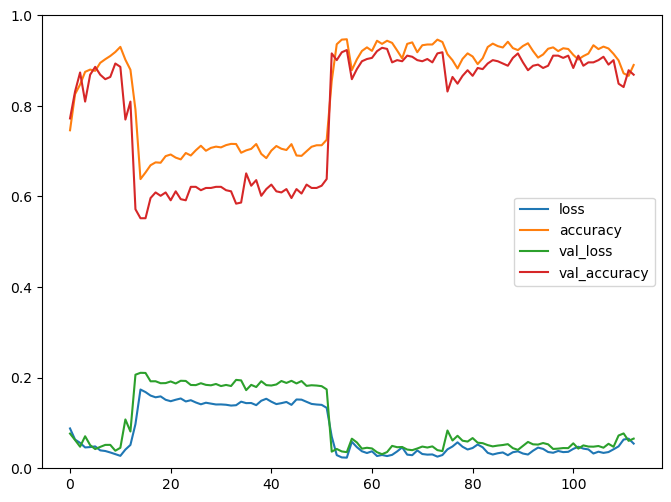

In [29]:
model_ann_big = createANN(hp_ann_big, n_attributes, n_classes)
trainANN(model_ann_big, hp_ann_big, train_data, train_labels)

In [30]:
# Ergebnis auf a)

acc = testANN_a(model_ann_big)
results_a[3] = acc

######## Results auf test data #########
Accuracy (test):  0.9151785714285714
[[102   1   4   0]
 [  3  87  14   4]
 [  2   9  94   1]
 [  0   0   0 127]]


Epoch 1/500
197/197 - 0s - loss: 0.0991 - accuracy: 0.6660 - val_loss: 0.1455 - val_accuracy: 0.5606
Epoch 2/500
197/197 - 0s - loss: 0.0860 - accuracy: 0.7230 - val_loss: 0.1069 - val_accuracy: 0.7254
Epoch 3/500
197/197 - 0s - loss: 0.0819 - accuracy: 0.7367 - val_loss: 0.1196 - val_accuracy: 0.6659
Epoch 4/500
197/197 - 0s - loss: 0.0766 - accuracy: 0.7680 - val_loss: 0.1050 - val_accuracy: 0.7437
Epoch 5/500
197/197 - 0s - loss: 0.0676 - accuracy: 0.7962 - val_loss: 0.1064 - val_accuracy: 0.6819
Epoch 6/500
197/197 - 0s - loss: 0.0655 - accuracy: 0.7985 - val_loss: 0.1040 - val_accuracy: 0.6911
Epoch 7/500
197/197 - 0s - loss: 0.0658 - accuracy: 0.8044 - val_loss: 0.0984 - val_accuracy: 0.7185
Epoch 8/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8204 - val_loss: 0.0955 - val_accuracy: 0.7712
Epoch 9/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8186 - val_loss: 0.0938 - val_accuracy: 0.7757
Epoch 10/500
197/197 - 0s - loss: 0.0539 - accuracy: 0.8346 - val_loss: 0.1181 - val_accura

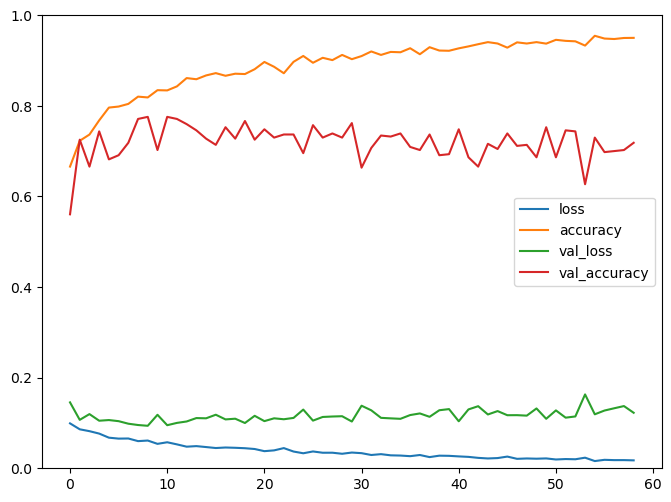

### Results auf test data ###
Accuracy for person  1 :  0.8482142857142857
[[17  5  6  0]
 [ 0 27  1  0]
 [ 0  5 23  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0971 - accuracy: 0.6840 - val_loss: 0.1178 - val_accuracy: 0.6133
Epoch 2/500
197/197 - 0s - loss: 0.0846 - accuracy: 0.7309 - val_loss: 0.1185 - val_accuracy: 0.7071
Epoch 3/500
197/197 - 0s - loss: 0.0745 - accuracy: 0.7797 - val_loss: 0.1210 - val_accuracy: 0.6659
Epoch 4/500
197/197 - 0s - loss: 0.0714 - accuracy: 0.7838 - val_loss: 0.1040 - val_accuracy: 0.7620
Epoch 5/500
197/197 - 0s - loss: 0.0673 - accuracy: 0.7950 - val_loss: 0.0997 - val_accuracy: 0.7551
Epoch 6/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8097 - val_loss: 0.1019 - val_accuracy: 0.7254
Epoch 7/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.8194 - val_loss: 0.1013 - val_accuracy: 0.7460
Epoch 8/500
197/197 - 0s - loss: 0.0574 - accuracy: 0.8260 - val_loss: 0.1075 - val_accuracy: 0.7048
Epoch 9/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.82

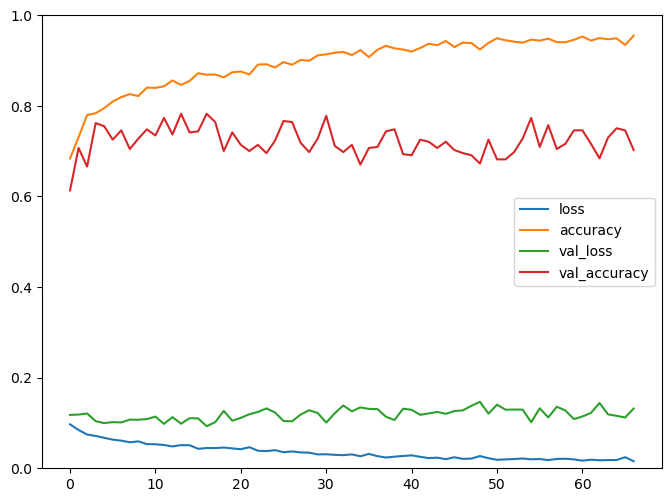

### Results auf test data ###
Accuracy for person  2 :  0.8125
[[21  0  7  0]
 [ 0 14 14  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0995 - accuracy: 0.6678 - val_loss: 0.1116 - val_accuracy: 0.7002
Epoch 2/500
197/197 - 0s - loss: 0.0845 - accuracy: 0.7306 - val_loss: 0.1012 - val_accuracy: 0.6865
Epoch 3/500
197/197 - 0s - loss: 0.0772 - accuracy: 0.7667 - val_loss: 0.1024 - val_accuracy: 0.7277
Epoch 4/500
197/197 - 0s - loss: 0.0671 - accuracy: 0.7967 - val_loss: 0.1111 - val_accuracy: 0.7048
Epoch 5/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7960 - val_loss: 0.1371 - val_accuracy: 0.6339
Epoch 6/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8125 - val_loss: 0.1017 - val_accuracy: 0.7506
Epoch 7/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8212 - val_loss: 0.0909 - val_accuracy: 0.7300
Epoch 8/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8229 - val_loss: 0.1173 - val_accuracy: 0.6888
Epoch 9/500
197/197 - 0s - loss: 0.0550 - accuracy: 0.8369 - val_los

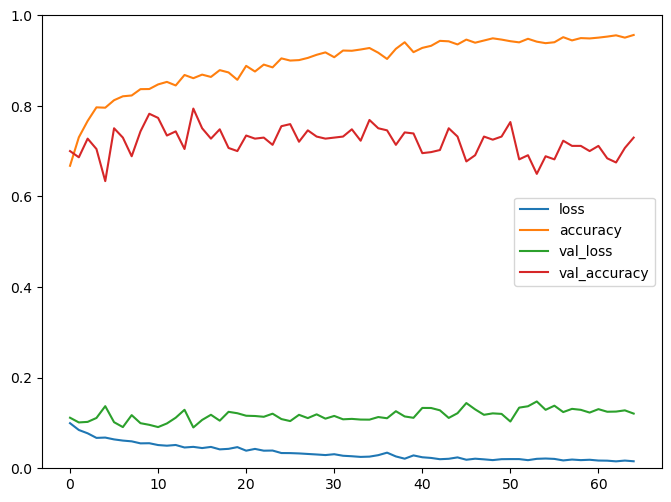

### Results auf test data ###
Accuracy for person  3 :  0.6339285714285714
[[ 4 24  0  0]
 [ 0 20  8  0]
 [ 0  8 20  0]
 [ 0  0  1 27]]
Epoch 1/500
197/197 - 0s - loss: 0.0975 - accuracy: 0.6792 - val_loss: 0.1051 - val_accuracy: 0.6773
Epoch 2/500
197/197 - 0s - loss: 0.0789 - accuracy: 0.7596 - val_loss: 0.1109 - val_accuracy: 0.6751
Epoch 3/500
197/197 - 0s - loss: 0.0767 - accuracy: 0.7695 - val_loss: 0.1122 - val_accuracy: 0.7391
Epoch 4/500
197/197 - 0s - loss: 0.0724 - accuracy: 0.7792 - val_loss: 0.0991 - val_accuracy: 0.7437
Epoch 5/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.7962 - val_loss: 0.0951 - val_accuracy: 0.7529
Epoch 6/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8146 - val_loss: 0.0966 - val_accuracy: 0.7506
Epoch 7/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.8207 - val_loss: 0.1071 - val_accuracy: 0.7277
Epoch 8/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8196 - val_loss: 0.1077 - val_accuracy: 0.7048
Epoch 9/500
197/197 - 0s - loss: 0.0556 - accuracy: 0.83

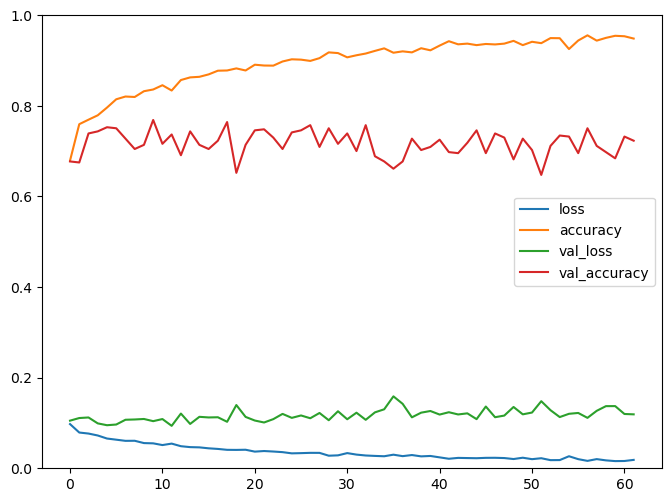

### Results auf test data ###
Accuracy for person  4 :  0.7946428571428571
[[28  0  0  0]
 [19  9  0  0]
 [ 0  0 28  0]
 [ 0  0  4 24]]
Epoch 1/500
197/197 - 0s - loss: 0.1019 - accuracy: 0.6627 - val_loss: 0.1145 - val_accuracy: 0.6156
Epoch 2/500
197/197 - 0s - loss: 0.0829 - accuracy: 0.7408 - val_loss: 0.0898 - val_accuracy: 0.7323
Epoch 3/500
197/197 - 0s - loss: 0.0752 - accuracy: 0.7693 - val_loss: 0.0944 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0721 - accuracy: 0.7794 - val_loss: 0.1100 - val_accuracy: 0.7162
Epoch 5/500
197/197 - 0s - loss: 0.0677 - accuracy: 0.7955 - val_loss: 0.0970 - val_accuracy: 0.7620
Epoch 6/500
197/197 - 0s - loss: 0.0670 - accuracy: 0.7952 - val_loss: 0.0957 - val_accuracy: 0.7551
Epoch 7/500
197/197 - 0s - loss: 0.0670 - accuracy: 0.8016 - val_loss: 0.1073 - val_accuracy: 0.7231
Epoch 8/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8252 - val_loss: 0.0937 - val_accuracy: 0.7849
Epoch 9/500
197/197 - 0s - loss: 0.0572 - accuracy: 0.82

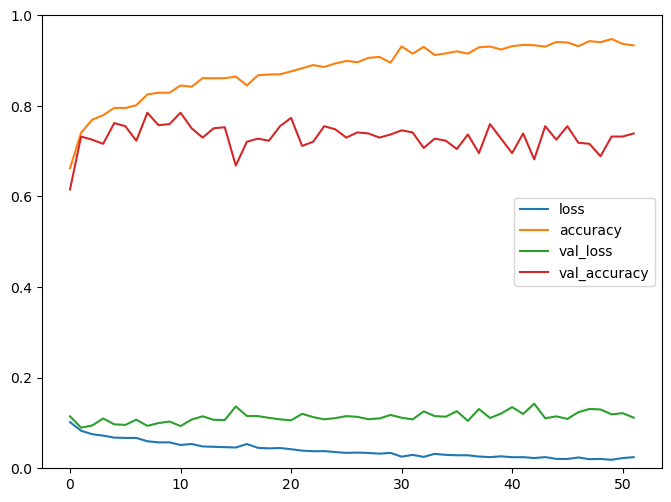

### Results auf test data ###
Accuracy for person  5 :  0.7232142857142857
[[25  3  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1003 - accuracy: 0.6614 - val_loss: 0.1138 - val_accuracy: 0.6842
Epoch 2/500
197/197 - 0s - loss: 0.0853 - accuracy: 0.7235 - val_loss: 0.1290 - val_accuracy: 0.6156
Epoch 3/500
197/197 - 0s - loss: 0.0773 - accuracy: 0.7614 - val_loss: 0.1092 - val_accuracy: 0.6705
Epoch 4/500
197/197 - 0s - loss: 0.0699 - accuracy: 0.7886 - val_loss: 0.1028 - val_accuracy: 0.7071
Epoch 5/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8056 - val_loss: 0.1029 - val_accuracy: 0.7117
Epoch 6/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8064 - val_loss: 0.1075 - val_accuracy: 0.6957
Epoch 7/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8219 - val_loss: 0.1000 - val_accuracy: 0.7391
Epoch 8/500
197/197 - 0s - loss: 0.0581 - accuracy: 0.8280 - val_loss: 0.0900 - val_accuracy: 0.7506
Epoch 9/500
197/197 - 0s - loss: 0.0562 - accuracy: 0.83

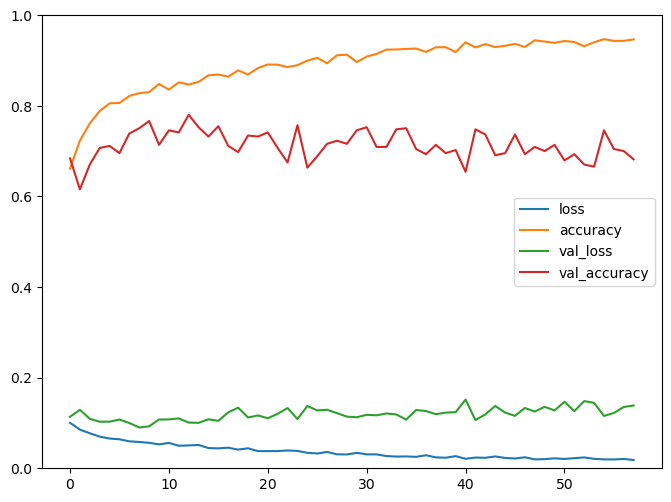

### Results auf test data ###
Accuracy for person  6 :  0.6339285714285714
[[28  0  0  0]
 [21  6  1  0]
 [15  4  9  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1018 - accuracy: 0.6584 - val_loss: 0.1358 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0790 - accuracy: 0.7522 - val_loss: 0.1077 - val_accuracy: 0.7460
Epoch 3/500
197/197 - 0s - loss: 0.0738 - accuracy: 0.7744 - val_loss: 0.1086 - val_accuracy: 0.7300
Epoch 4/500
197/197 - 0s - loss: 0.0658 - accuracy: 0.7978 - val_loss: 0.0901 - val_accuracy: 0.7277
Epoch 5/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.8018 - val_loss: 0.1127 - val_accuracy: 0.7254
Epoch 6/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8148 - val_loss: 0.1134 - val_accuracy: 0.7231
Epoch 7/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8138 - val_loss: 0.1085 - val_accuracy: 0.7254
Epoch 8/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8217 - val_loss: 0.1040 - val_accuracy: 0.7529
Epoch 9/500
197/197 - 0s - loss: 0.0574 - accuracy: 0.82

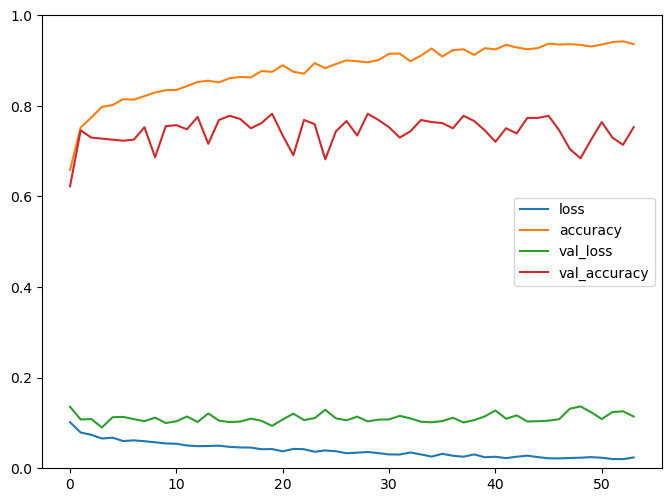

### Results auf test data ###
Accuracy for person  7 :  0.6339285714285714
[[23  0  5  0]
 [ 0 21  7  0]
 [ 7 14  7  0]
 [ 0  6  2 20]]
Epoch 1/500
197/197 - 0s - loss: 0.0979 - accuracy: 0.6767 - val_loss: 0.1292 - val_accuracy: 0.6613
Epoch 2/500
197/197 - 0s - loss: 0.0820 - accuracy: 0.7446 - val_loss: 0.1062 - val_accuracy: 0.7140
Epoch 3/500
197/197 - 0s - loss: 0.0740 - accuracy: 0.7746 - val_loss: 0.1127 - val_accuracy: 0.6682
Epoch 4/500
197/197 - 0s - loss: 0.0669 - accuracy: 0.8034 - val_loss: 0.0903 - val_accuracy: 0.7300
Epoch 5/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8158 - val_loss: 0.1178 - val_accuracy: 0.6613
Epoch 6/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8082 - val_loss: 0.1067 - val_accuracy: 0.7391
Epoch 7/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8135 - val_loss: 0.0977 - val_accuracy: 0.7208
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8189 - val_loss: 0.0948 - val_accuracy: 0.7368
Epoch 9/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.81

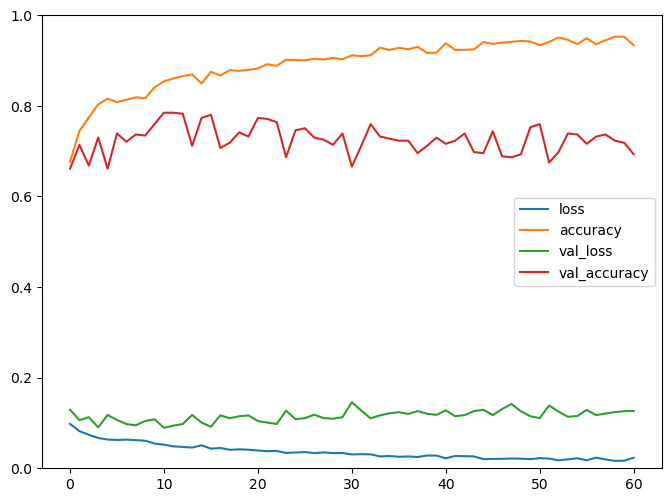

### Results auf test data ###
Accuracy for person  8 :  0.7321428571428571
[[26  2  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0971 - accuracy: 0.6779 - val_loss: 0.0882 - val_accuracy: 0.7391
Epoch 2/500
197/197 - 0s - loss: 0.0810 - accuracy: 0.7471 - val_loss: 0.0798 - val_accuracy: 0.7643
Epoch 3/500
197/197 - 0s - loss: 0.0758 - accuracy: 0.7751 - val_loss: 0.0913 - val_accuracy: 0.7597
Epoch 4/500
197/197 - 0s - loss: 0.0699 - accuracy: 0.7873 - val_loss: 0.1105 - val_accuracy: 0.7277
Epoch 5/500
197/197 - 0s - loss: 0.0727 - accuracy: 0.7853 - val_loss: 0.1197 - val_accuracy: 0.6957
Epoch 6/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8059 - val_loss: 0.0939 - val_accuracy: 0.7414
Epoch 7/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8181 - val_loss: 0.0969 - val_accuracy: 0.7643
Epoch 8/500
197/197 - 0s - loss: 0.0565 - accuracy: 0.8324 - val_loss: 0.0978 - val_accuracy: 0.7803
Epoch 9/500
197/197 - 0s - loss: 0.0547 - accuracy: 0.84

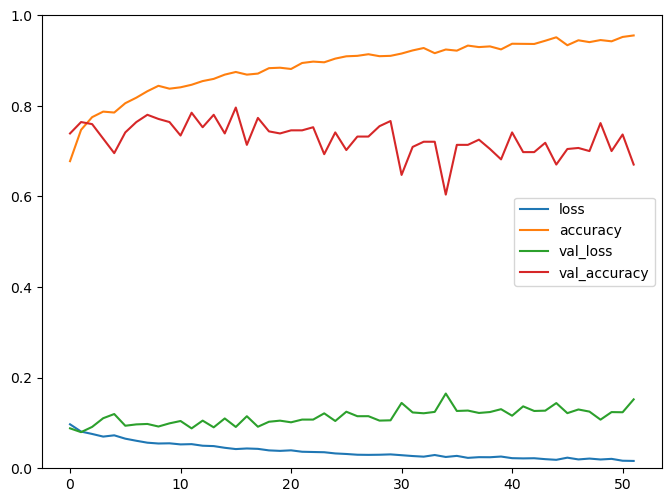

### Results auf test data ###
Accuracy for person  9 :  0.7410714285714286
[[18  0 10  0]
 [ 1 20  7  0]
 [ 0  5 17  6]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0981 - accuracy: 0.6820 - val_loss: 0.1299 - val_accuracy: 0.5904
Epoch 2/500
197/197 - 0s - loss: 0.0805 - accuracy: 0.7443 - val_loss: 0.0933 - val_accuracy: 0.7391
Epoch 3/500
197/197 - 0s - loss: 0.0789 - accuracy: 0.7601 - val_loss: 0.1355 - val_accuracy: 0.6293
Epoch 4/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7830 - val_loss: 0.1182 - val_accuracy: 0.6568
Epoch 5/500
197/197 - 0s - loss: 0.0666 - accuracy: 0.7985 - val_loss: 0.1104 - val_accuracy: 0.7346
Epoch 6/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8158 - val_loss: 0.0938 - val_accuracy: 0.7460
Epoch 7/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8196 - val_loss: 0.1103 - val_accuracy: 0.7208
Epoch 8/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8166 - val_loss: 0.0943 - val_accuracy: 0.7849
Epoch 9/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.82

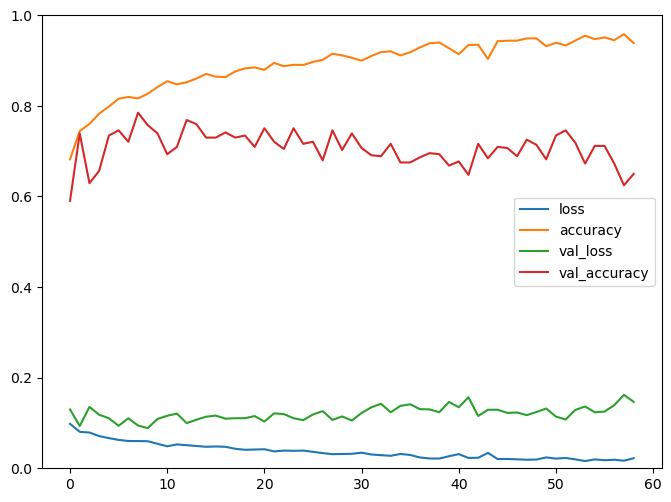

### Results auf test data ###
Accuracy for person  10 :  0.8035714285714286
[[21  2  5  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  1  0 27]]
Epoch 1/500
197/197 - 0s - loss: 0.1004 - accuracy: 0.6650 - val_loss: 0.1363 - val_accuracy: 0.6041
Epoch 2/500
197/197 - 0s - loss: 0.0804 - accuracy: 0.7456 - val_loss: 0.1014 - val_accuracy: 0.7254
Epoch 3/500
197/197 - 0s - loss: 0.0752 - accuracy: 0.7695 - val_loss: 0.0988 - val_accuracy: 0.6728
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7820 - val_loss: 0.1037 - val_accuracy: 0.7140
Epoch 5/500
197/197 - 0s - loss: 0.0665 - accuracy: 0.7983 - val_loss: 0.1104 - val_accuracy: 0.7071
Epoch 6/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8087 - val_loss: 0.0889 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8280 - val_loss: 0.0891 - val_accuracy: 0.7735
Epoch 8/500
197/197 - 0s - loss: 0.0528 - accuracy: 0.8453 - val_loss: 0.0955 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0581 - accuracy: 0.8

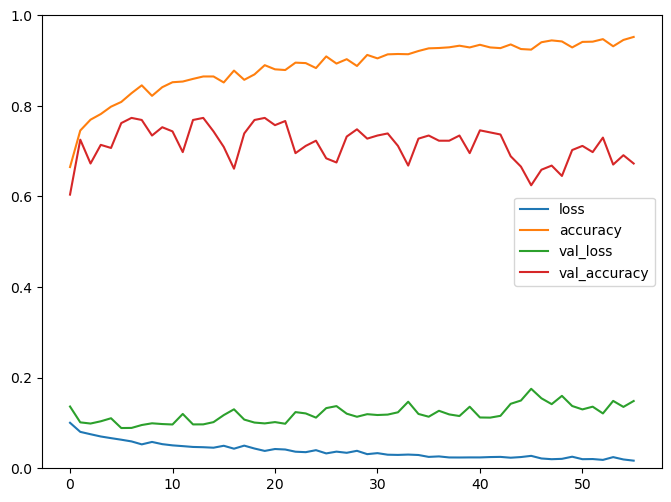

### Results auf test data ###
Accuracy for person  11 :  0.8839285714285714
[[20  5  3  0]
 [ 0 25  3  0]
 [ 0  2 26  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1002 - accuracy: 0.6543 - val_loss: 0.1385 - val_accuracy: 0.5881
Epoch 2/500
197/197 - 0s - loss: 0.0852 - accuracy: 0.7293 - val_loss: 0.1145 - val_accuracy: 0.6407
Epoch 3/500
197/197 - 0s - loss: 0.0766 - accuracy: 0.7657 - val_loss: 0.1226 - val_accuracy: 0.6430
Epoch 4/500
197/197 - 0s - loss: 0.0770 - accuracy: 0.7619 - val_loss: 0.1206 - val_accuracy: 0.6682
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7904 - val_loss: 0.0957 - val_accuracy: 0.7414
Epoch 6/500
197/197 - 0s - loss: 0.0660 - accuracy: 0.8082 - val_loss: 0.1020 - val_accuracy: 0.7483
Epoch 7/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8184 - val_loss: 0.0960 - val_accuracy: 0.7666
Epoch 8/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8163 - val_loss: 0.1015 - val_accuracy: 0.7391
Epoch 9/500
197/197 - 0s - loss: 0.0540 - accuracy: 0.8

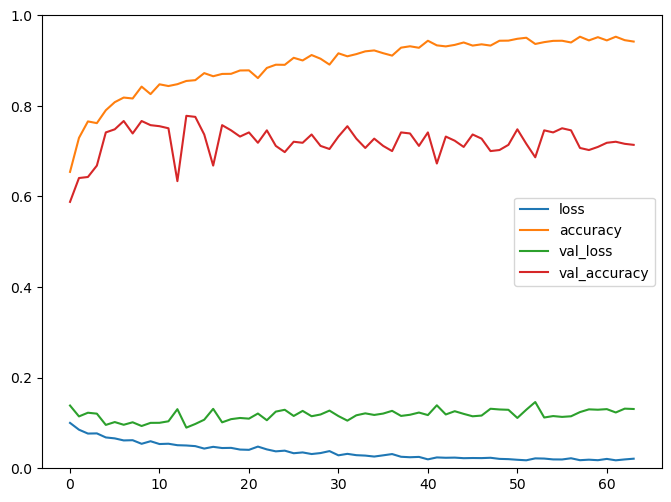

### Results auf test data ###
Accuracy for person  12 :  0.8125
[[18 10  0  0]
 [ 0 28  0  0]
 [ 0 11 17  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1015 - accuracy: 0.6690 - val_loss: 0.1167 - val_accuracy: 0.6064
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7487 - val_loss: 0.1049 - val_accuracy: 0.7025
Epoch 3/500
197/197 - 0s - loss: 0.0754 - accuracy: 0.7723 - val_loss: 0.0931 - val_accuracy: 0.7368
Epoch 4/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7988 - val_loss: 0.1028 - val_accuracy: 0.7254
Epoch 5/500
197/197 - 0s - loss: 0.0694 - accuracy: 0.7911 - val_loss: 0.1072 - val_accuracy: 0.7071
Epoch 6/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.8026 - val_loss: 0.1087 - val_accuracy: 0.7323
Epoch 7/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8224 - val_loss: 0.1040 - val_accuracy: 0.7597
Epoch 8/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8240 - val_loss: 0.0950 - val_accuracy: 0.7712
Epoch 9/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8140 - val_lo

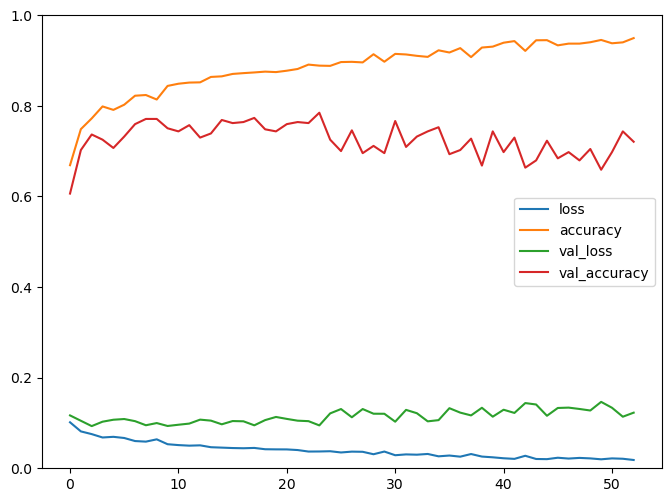

### Results auf test data ###
Accuracy for person  13 :  0.8125
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 21  7  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1035 - accuracy: 0.6576 - val_loss: 0.1213 - val_accuracy: 0.6453
Epoch 2/500
197/197 - 0s - loss: 0.0859 - accuracy: 0.7148 - val_loss: 0.1106 - val_accuracy: 0.6819
Epoch 3/500
197/197 - 0s - loss: 0.0752 - accuracy: 0.7708 - val_loss: 0.1051 - val_accuracy: 0.7162
Epoch 4/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7856 - val_loss: 0.1085 - val_accuracy: 0.7002
Epoch 5/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7939 - val_loss: 0.0987 - val_accuracy: 0.7666
Epoch 6/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8222 - val_loss: 0.0873 - val_accuracy: 0.7849
Epoch 7/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8181 - val_loss: 0.0988 - val_accuracy: 0.7803
Epoch 8/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8163 - val_loss: 0.0940 - val_accuracy: 0.7597
Epoch 9/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8255 - val_lo

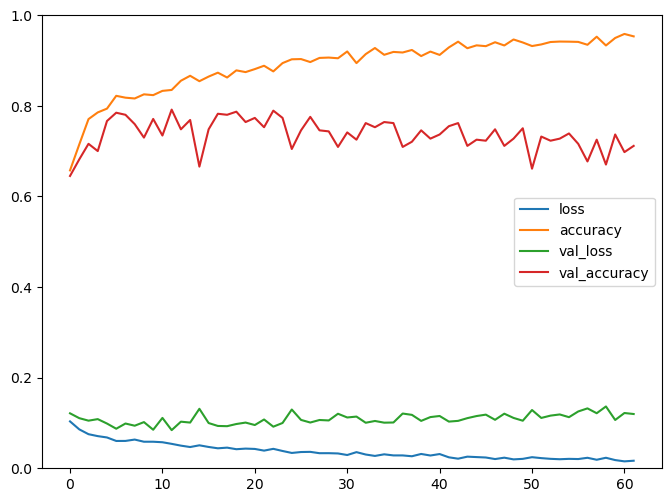

### Results auf test data ###
Accuracy for person  14 :  0.9464285714285714
[[28  0  0  0]
 [ 0 22  6  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0987 - accuracy: 0.6662 - val_loss: 0.1121 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0817 - accuracy: 0.7459 - val_loss: 0.1073 - val_accuracy: 0.6407
Epoch 3/500
197/197 - 0s - loss: 0.0741 - accuracy: 0.7718 - val_loss: 0.0844 - val_accuracy: 0.7666
Epoch 4/500
197/197 - 0s - loss: 0.0685 - accuracy: 0.7904 - val_loss: 0.0912 - val_accuracy: 0.7574
Epoch 5/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8125 - val_loss: 0.1081 - val_accuracy: 0.7460
Epoch 6/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8186 - val_loss: 0.0982 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8181 - val_loss: 0.1025 - val_accuracy: 0.7529
Epoch 8/500
197/197 - 0s - loss: 0.0576 - accuracy: 0.8324 - val_loss: 0.0944 - val_accuracy: 0.7597
Epoch 9/500
197/197 - 0s - loss: 0.0516 - accuracy: 0.8

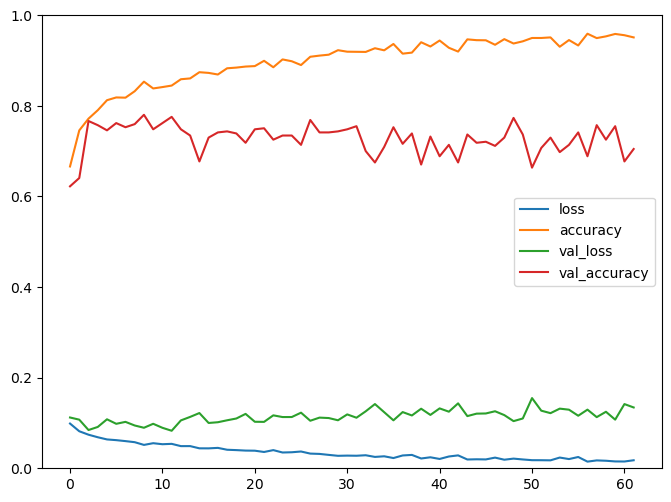

### Results auf test data ###
Accuracy for person  15 :  0.45535714285714285
[[24  1  3  0]
 [ 1  0 27  0]
 [ 1  0 27  0]
 [ 0  6 22  0]]
Epoch 1/500
197/197 - 0s - loss: 0.1011 - accuracy: 0.6685 - val_loss: 0.1112 - val_accuracy: 0.6316
Epoch 2/500
197/197 - 0s - loss: 0.0852 - accuracy: 0.7354 - val_loss: 0.1078 - val_accuracy: 0.6957
Epoch 3/500
197/197 - 0s - loss: 0.0771 - accuracy: 0.7713 - val_loss: 0.1055 - val_accuracy: 0.7117
Epoch 4/500
197/197 - 0s - loss: 0.0745 - accuracy: 0.7741 - val_loss: 0.1190 - val_accuracy: 0.6865
Epoch 5/500
197/197 - 0s - loss: 0.0717 - accuracy: 0.7766 - val_loss: 0.1033 - val_accuracy: 0.7277
Epoch 6/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8084 - val_loss: 0.0985 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8082 - val_loss: 0.0932 - val_accuracy: 0.7643
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8242 - val_loss: 0.1325 - val_accuracy: 0.6568
Epoch 9/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.

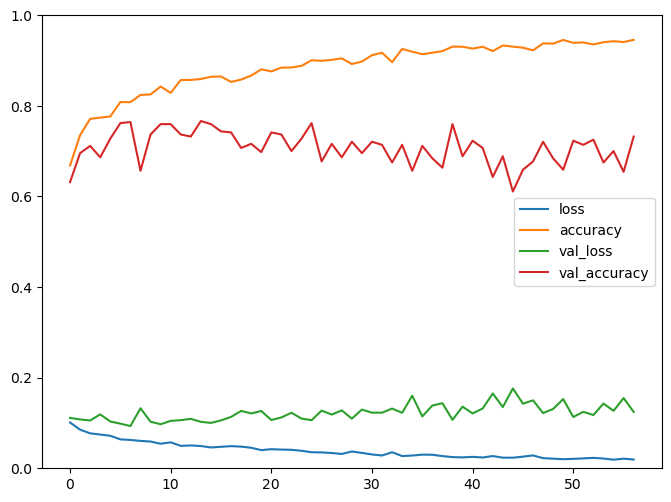

### Results auf test data ###
Accuracy for person  16 :  0.8392857142857143
[[28  0  0  0]
 [ 0 28  0  0]
 [ 3 14 11  0]
 [ 0  0  1 27]]
Epoch 1/500
197/197 - 0s - loss: 0.1000 - accuracy: 0.6571 - val_loss: 0.1103 - val_accuracy: 0.6407
Epoch 2/500
197/197 - 0s - loss: 0.0855 - accuracy: 0.7344 - val_loss: 0.1160 - val_accuracy: 0.6522
Epoch 3/500
197/197 - 0s - loss: 0.0738 - accuracy: 0.7677 - val_loss: 0.1122 - val_accuracy: 0.7002
Epoch 4/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7934 - val_loss: 0.0962 - val_accuracy: 0.7391
Epoch 5/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8158 - val_loss: 0.0855 - val_accuracy: 0.7826
Epoch 6/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8161 - val_loss: 0.0903 - val_accuracy: 0.7666
Epoch 7/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8291 - val_loss: 0.0947 - val_accuracy: 0.7780
Epoch 8/500
197/197 - 0s - loss: 0.0531 - accuracy: 0.8413 - val_loss: 0.0966 - val_accuracy: 0.7735
Epoch 9/500
197/197 - 0s - loss: 0.0545 - accuracy: 0.8

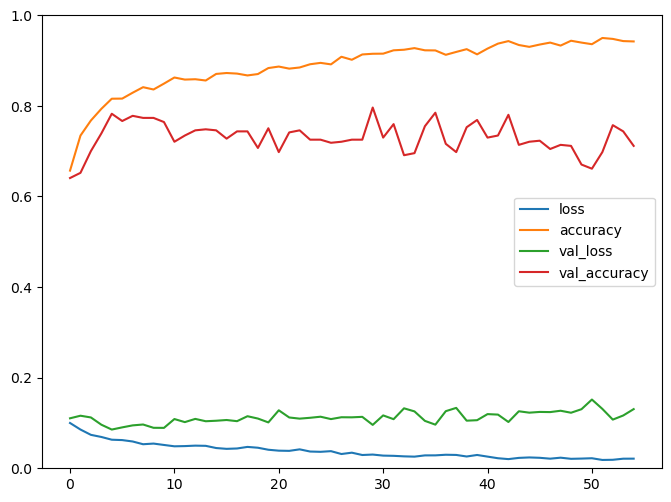

### Results auf test data ###
Accuracy for person  17 :  0.5535714285714286
[[26  0  0  2]
 [18  0 10  0]
 [15  0  8  5]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0982 - accuracy: 0.6706 - val_loss: 0.1312 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0846 - accuracy: 0.7296 - val_loss: 0.1004 - val_accuracy: 0.6865
Epoch 3/500
197/197 - 0s - loss: 0.0740 - accuracy: 0.7728 - val_loss: 0.1003 - val_accuracy: 0.7529
Epoch 4/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7927 - val_loss: 0.1148 - val_accuracy: 0.6979
Epoch 5/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7856 - val_loss: 0.1019 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.8054 - val_loss: 0.0967 - val_accuracy: 0.7597
Epoch 7/500
197/197 - 0s - loss: 0.0598 - accuracy: 0.8176 - val_loss: 0.1144 - val_accuracy: 0.7231
Epoch 8/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8298 - val_loss: 0.0932 - val_accuracy: 0.7620
Epoch 9/500
197/197 - 0s - loss: 0.0564 - accuracy: 0.8

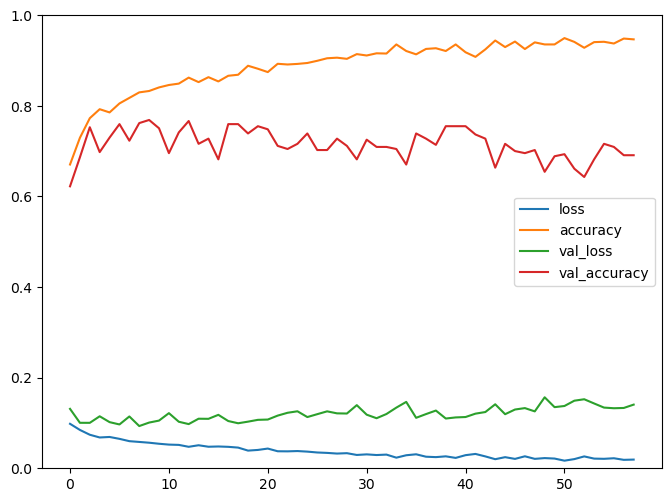

### Results auf test data ###
Accuracy for person  18 :  0.6785714285714286
[[28  0  0  0]
 [15 11  2  0]
 [13  6  9  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1028 - accuracy: 0.6454 - val_loss: 0.1369 - val_accuracy: 0.5973
Epoch 2/500
197/197 - 0s - loss: 0.0838 - accuracy: 0.7291 - val_loss: 0.1167 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0771 - accuracy: 0.7624 - val_loss: 0.1157 - val_accuracy: 0.6728
Epoch 4/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7883 - val_loss: 0.1212 - val_accuracy: 0.6339
Epoch 5/500
197/197 - 0s - loss: 0.0666 - accuracy: 0.8013 - val_loss: 0.1355 - val_accuracy: 0.5858
Epoch 6/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7962 - val_loss: 0.1252 - val_accuracy: 0.6796
Epoch 7/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8199 - val_loss: 0.1055 - val_accuracy: 0.7597
Epoch 8/500
197/197 - 0s - loss: 0.0573 - accuracy: 0.8336 - val_loss: 0.1071 - val_accuracy: 0.7391
Epoch 9/500
197/197 - 0s - loss: 0.0579 - accuracy: 0.8

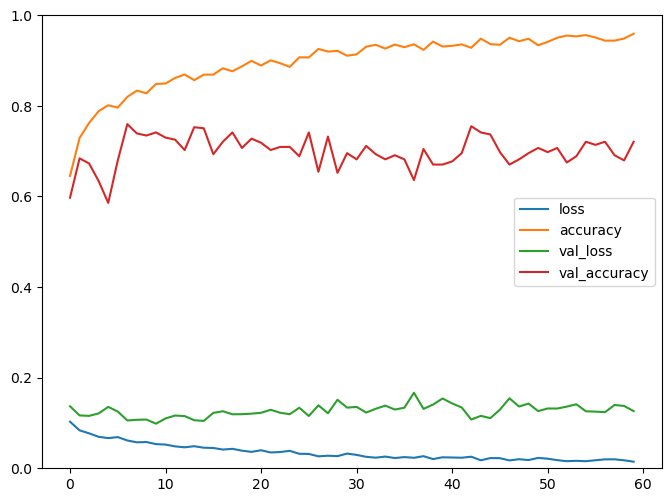

### Results auf test data ###
Accuracy for person  19 :  0.6071428571428571
[[12 16  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1000 - accuracy: 0.6568 - val_loss: 0.1230 - val_accuracy: 0.6934
Epoch 2/500
197/197 - 0s - loss: 0.0853 - accuracy: 0.7227 - val_loss: 0.1207 - val_accuracy: 0.6362
Epoch 3/500
197/197 - 0s - loss: 0.0785 - accuracy: 0.7586 - val_loss: 0.1038 - val_accuracy: 0.7002
Epoch 4/500
197/197 - 0s - loss: 0.0741 - accuracy: 0.7772 - val_loss: 0.1211 - val_accuracy: 0.6636
Epoch 5/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7894 - val_loss: 0.1012 - val_accuracy: 0.7437
Epoch 6/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8115 - val_loss: 0.1023 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8196 - val_loss: 0.1044 - val_accuracy: 0.7620
Epoch 8/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8204 - val_loss: 0.0961 - val_accuracy: 0.7300
Epoch 9/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8

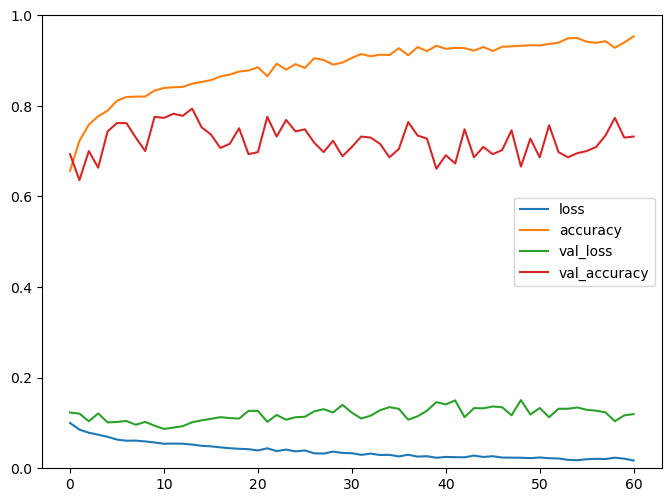

### Results auf test data ###
Accuracy for person  20 :  0.9107142857142857
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 10 18  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0987 - accuracy: 0.6640 - val_loss: 0.1055 - val_accuracy: 0.6407
Epoch 2/500
197/197 - 0s - loss: 0.0833 - accuracy: 0.7347 - val_loss: 0.1154 - val_accuracy: 0.7094
Epoch 3/500
197/197 - 0s - loss: 0.0734 - accuracy: 0.7764 - val_loss: 0.1277 - val_accuracy: 0.6453
Epoch 4/500
197/197 - 0s - loss: 0.0706 - accuracy: 0.7876 - val_loss: 0.1096 - val_accuracy: 0.7300
Epoch 5/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8087 - val_loss: 0.1220 - val_accuracy: 0.6499
Epoch 6/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8212 - val_loss: 0.1119 - val_accuracy: 0.7094
Epoch 7/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8179 - val_loss: 0.1021 - val_accuracy: 0.7414
Epoch 8/500
197/197 - 0s - loss: 0.0571 - accuracy: 0.8316 - val_loss: 0.1069 - val_accuracy: 0.7162
Epoch 9/500
197/197 - 0s - loss: 0.0532 - accuracy: 0.8

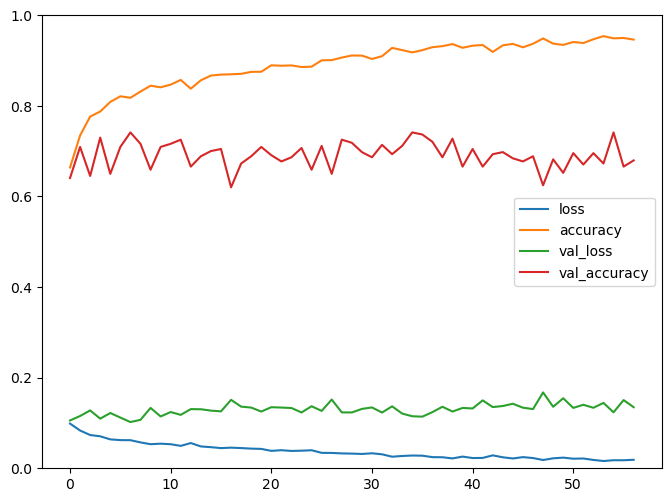

### Results auf test data ###
Accuracy for person  21 :  0.48214285714285715
[[12 14  1  1]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0 14  0 14]]
Epoch 1/500
197/197 - 0s - loss: 0.1006 - accuracy: 0.6660 - val_loss: 0.1181 - val_accuracy: 0.6911
Epoch 2/500
197/197 - 0s - loss: 0.0815 - accuracy: 0.7362 - val_loss: 0.1113 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7812 - val_loss: 0.1218 - val_accuracy: 0.6842
Epoch 4/500
197/197 - 0s - loss: 0.0715 - accuracy: 0.7843 - val_loss: 0.1143 - val_accuracy: 0.7185
Epoch 5/500
197/197 - 0s - loss: 0.0666 - accuracy: 0.8056 - val_loss: 0.1032 - val_accuracy: 0.7391
Epoch 6/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8194 - val_loss: 0.1161 - val_accuracy: 0.7117
Epoch 7/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8163 - val_loss: 0.1094 - val_accuracy: 0.7460
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8199 - val_loss: 0.1201 - val_accuracy: 0.6911
Epoch 9/500
197/197 - 0s - loss: 0.0535 - accuracy: 0.

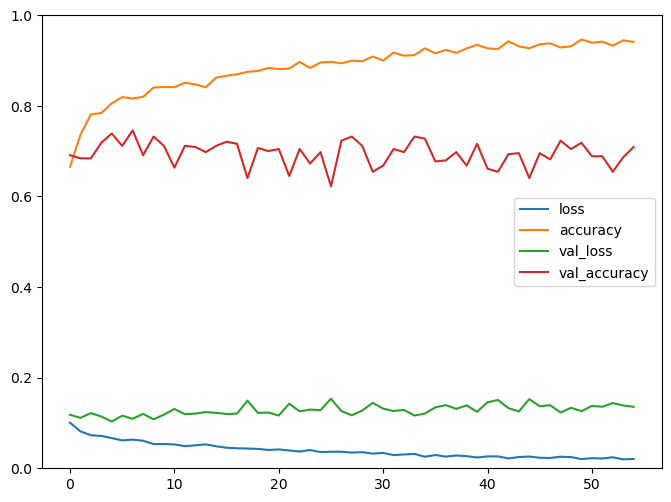

### Results auf test data ###
Accuracy for person  22 :  0.625
[[27  0  1  0]
 [ 0  1 13 14]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0997 - accuracy: 0.6576 - val_loss: 0.1026 - val_accuracy: 0.6430
Epoch 2/500
197/197 - 0s - loss: 0.0839 - accuracy: 0.7276 - val_loss: 0.1202 - val_accuracy: 0.6659
Epoch 3/500
197/197 - 0s - loss: 0.0792 - accuracy: 0.7548 - val_loss: 0.1047 - val_accuracy: 0.7368
Epoch 4/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7886 - val_loss: 0.1127 - val_accuracy: 0.7346
Epoch 5/500
197/197 - 0s - loss: 0.0686 - accuracy: 0.7990 - val_loss: 0.1052 - val_accuracy: 0.7208
Epoch 6/500
197/197 - 0s - loss: 0.0663 - accuracy: 0.8039 - val_loss: 0.1058 - val_accuracy: 0.7437
Epoch 7/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8176 - val_loss: 0.0969 - val_accuracy: 0.7666
Epoch 8/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8179 - val_loss: 0.0991 - val_accuracy: 0.7803
Epoch 9/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8285 - val_los

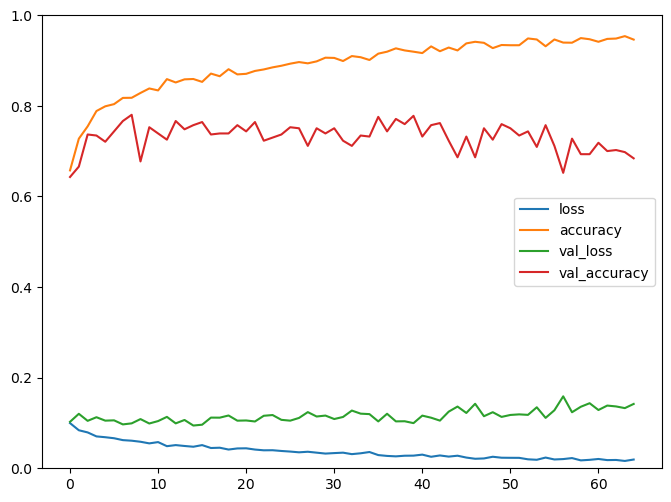

### Results auf test data ###
Accuracy for person  23 :  0.7946428571428571
[[27  0  1  0]
 [ 1 12 15  0]
 [ 0  4 23  1]
 [ 0  1  0 27]]
Epoch 1/500
197/197 - 0s - loss: 0.0986 - accuracy: 0.6701 - val_loss: 0.1129 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0848 - accuracy: 0.7316 - val_loss: 0.1219 - val_accuracy: 0.6682
Epoch 3/500
197/197 - 0s - loss: 0.0714 - accuracy: 0.7906 - val_loss: 0.1226 - val_accuracy: 0.6293
Epoch 4/500
197/197 - 0s - loss: 0.0696 - accuracy: 0.7917 - val_loss: 0.1148 - val_accuracy: 0.7071
Epoch 5/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.8023 - val_loss: 0.0963 - val_accuracy: 0.7666
Epoch 6/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8120 - val_loss: 0.1066 - val_accuracy: 0.7002
Epoch 7/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8191 - val_loss: 0.1009 - val_accuracy: 0.7597
Epoch 8/500
197/197 - 0s - loss: 0.0578 - accuracy: 0.8349 - val_loss: 0.1055 - val_accuracy: 0.7529
Epoch 9/500
197/197 - 0s - loss: 0.0558 - accuracy: 0.8

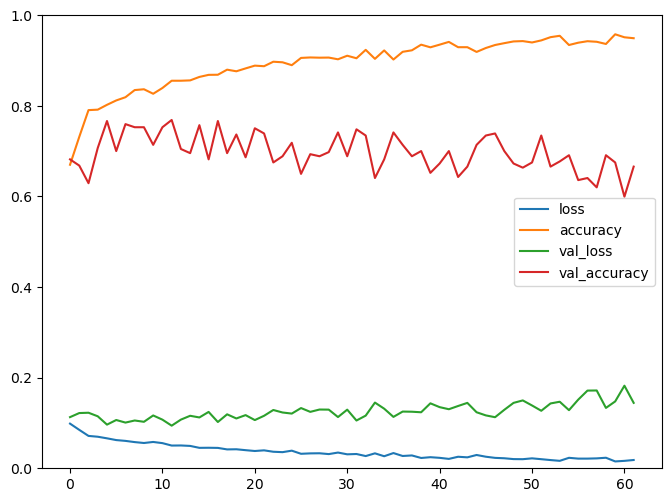

### Results auf test data ###
Accuracy for person  24 :  0.8392857142857143
[[28  0  0  0]
 [ 1 13 14  0]
 [ 0  3 25  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0999 - accuracy: 0.6698 - val_loss: 0.1252 - val_accuracy: 0.6156
Epoch 2/500
197/197 - 0s - loss: 0.0834 - accuracy: 0.7296 - val_loss: 0.0915 - val_accuracy: 0.7231
Epoch 3/500
197/197 - 0s - loss: 0.0759 - accuracy: 0.7680 - val_loss: 0.0769 - val_accuracy: 0.8009
Epoch 4/500
197/197 - 0s - loss: 0.0739 - accuracy: 0.7736 - val_loss: 0.1139 - val_accuracy: 0.6590
Epoch 5/500
197/197 - 0s - loss: 0.0686 - accuracy: 0.7934 - val_loss: 0.1005 - val_accuracy: 0.7803
Epoch 6/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8291 - val_loss: 0.1138 - val_accuracy: 0.7048
Epoch 7/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8156 - val_loss: 0.0959 - val_accuracy: 0.7414
Epoch 8/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8288 - val_loss: 0.0952 - val_accuracy: 0.7529
Epoch 9/500
197/197 - 0s - loss: 0.0572 - accuracy: 0.8

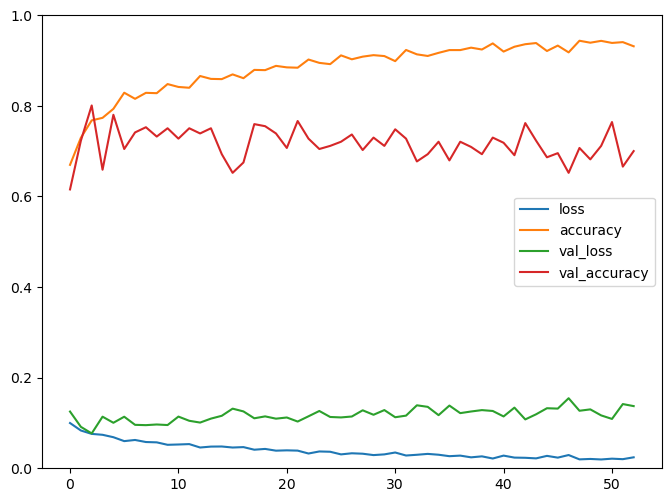

### Results auf test data ###
Accuracy for person  25 :  0.5
[[24  4  0  0]
 [ 0 28  0  0]
 [ 0 26  2  0]
 [ 0  2 24  2]]
Epoch 1/500
197/197 - 0s - loss: 0.1020 - accuracy: 0.6619 - val_loss: 0.1377 - val_accuracy: 0.6087
Epoch 2/500
197/197 - 0s - loss: 0.0835 - accuracy: 0.7362 - val_loss: 0.1064 - val_accuracy: 0.7048
Epoch 3/500
197/197 - 0s - loss: 0.0771 - accuracy: 0.7578 - val_loss: 0.0997 - val_accuracy: 0.7048
Epoch 4/500
197/197 - 0s - loss: 0.0723 - accuracy: 0.7764 - val_loss: 0.1112 - val_accuracy: 0.7300
Epoch 5/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7909 - val_loss: 0.0961 - val_accuracy: 0.7803
Epoch 6/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8079 - val_loss: 0.0934 - val_accuracy: 0.7735
Epoch 7/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8102 - val_loss: 0.0933 - val_accuracy: 0.7323
Epoch 8/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8212 - val_loss: 0.0914 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0548 - accuracy: 0.8385 - val_loss:

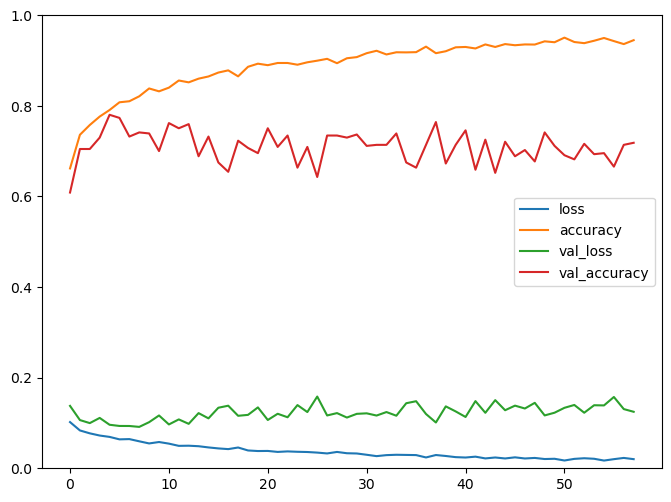

### Results auf test data ###
Accuracy for person  26 :  0.7589285714285714
[[28  0  0  0]
 [ 4 24  0  0]
 [ 8 14  6  0]
 [ 0  0  1 27]]
Epoch 1/500
197/197 - 0s - loss: 0.1013 - accuracy: 0.6566 - val_loss: 0.1230 - val_accuracy: 0.6293
Epoch 2/500
197/197 - 0s - loss: 0.0853 - accuracy: 0.7220 - val_loss: 0.1150 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0788 - accuracy: 0.7616 - val_loss: 0.0928 - val_accuracy: 0.7460
Epoch 4/500
197/197 - 0s - loss: 0.0708 - accuracy: 0.7863 - val_loss: 0.0829 - val_accuracy: 0.7712
Epoch 5/500
197/197 - 0s - loss: 0.0684 - accuracy: 0.7939 - val_loss: 0.0978 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8250 - val_loss: 0.0964 - val_accuracy: 0.7368
Epoch 7/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8224 - val_loss: 0.0945 - val_accuracy: 0.7529
Epoch 8/500
197/197 - 0s - loss: 0.0585 - accuracy: 0.8260 - val_loss: 0.1012 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0547 - accuracy: 0.8

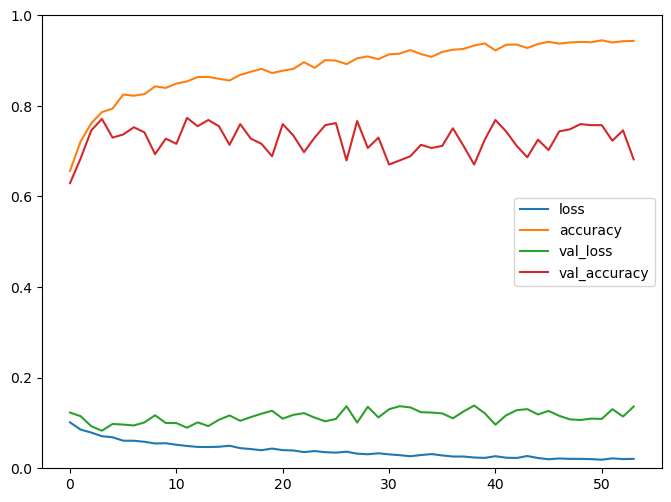

### Results auf test data ###
Accuracy for person  27 :  0.8214285714285714
[[24  2  2  0]
 [ 0 14 14  0]
 [ 0  0 28  0]
 [ 0  1  1 26]]
Epoch 1/500
197/197 - 0s - loss: 0.0985 - accuracy: 0.6787 - val_loss: 0.1121 - val_accuracy: 0.6888
Epoch 2/500
197/197 - 0s - loss: 0.0825 - accuracy: 0.7451 - val_loss: 0.1022 - val_accuracy: 0.7002
Epoch 3/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7792 - val_loss: 0.1120 - val_accuracy: 0.6796
Epoch 4/500
197/197 - 0s - loss: 0.0706 - accuracy: 0.7861 - val_loss: 0.1196 - val_accuracy: 0.6407
Epoch 5/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8207 - val_loss: 0.0973 - val_accuracy: 0.7277
Epoch 6/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.7967 - val_loss: 0.1012 - val_accuracy: 0.7460
Epoch 7/500
197/197 - 0s - loss: 0.0569 - accuracy: 0.8334 - val_loss: 0.0968 - val_accuracy: 0.7368
Epoch 8/500
197/197 - 0s - loss: 0.0567 - accuracy: 0.8374 - val_loss: 0.1038 - val_accuracy: 0.7071
Epoch 9/500
197/197 - 0s - loss: 0.0536 - accuracy: 0.8

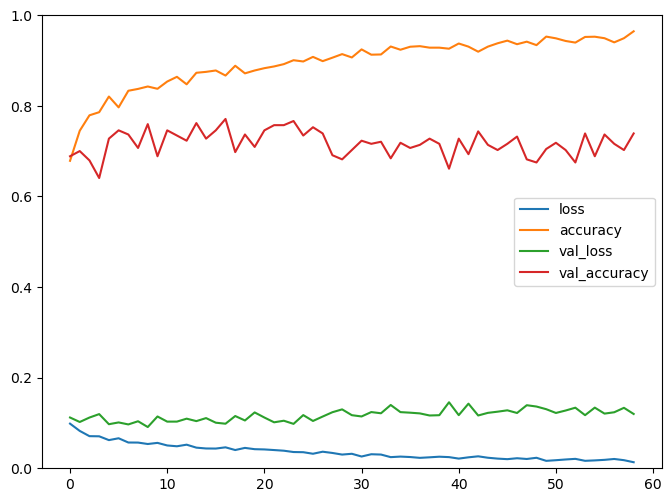

### Results auf test data ###
Accuracy for person  28 :  0.5535714285714286
[[28  0  0  0]
 [17  0 11  0]
 [21  1  6  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0964 - accuracy: 0.6820 - val_loss: 0.1035 - val_accuracy: 0.6728
Epoch 2/500
197/197 - 0s - loss: 0.0817 - accuracy: 0.7502 - val_loss: 0.1079 - val_accuracy: 0.6636
Epoch 3/500
197/197 - 0s - loss: 0.0788 - accuracy: 0.7578 - val_loss: 0.1114 - val_accuracy: 0.6751
Epoch 4/500
197/197 - 0s - loss: 0.0739 - accuracy: 0.7723 - val_loss: 0.0930 - val_accuracy: 0.7712
Epoch 5/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.8084 - val_loss: 0.1163 - val_accuracy: 0.6773
Epoch 6/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8054 - val_loss: 0.0982 - val_accuracy: 0.7551
Epoch 7/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8179 - val_loss: 0.0993 - val_accuracy: 0.7529
Epoch 8/500
197/197 - 0s - loss: 0.0561 - accuracy: 0.8316 - val_loss: 0.0962 - val_accuracy: 0.7620
Epoch 9/500
197/197 - 0s - loss: 0.0532 - accuracy: 0.8

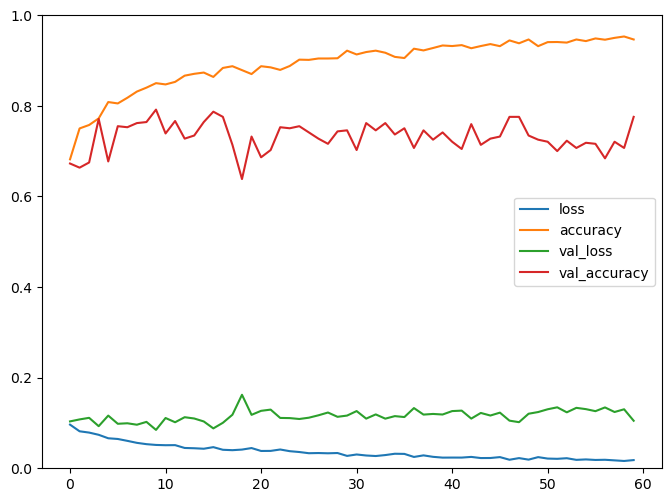

### Results auf test data ###
Accuracy for person  29 :  0.6696428571428571
[[15  1 12  0]
 [ 0  8 20  0]
 [ 0  4 24  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1017 - accuracy: 0.6568 - val_loss: 0.1233 - val_accuracy: 0.6957
Epoch 2/500
197/197 - 0s - loss: 0.0848 - accuracy: 0.7342 - val_loss: 0.1217 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0763 - accuracy: 0.7657 - val_loss: 0.0983 - val_accuracy: 0.7551
Epoch 4/500
197/197 - 0s - loss: 0.0711 - accuracy: 0.7848 - val_loss: 0.1047 - val_accuracy: 0.7300
Epoch 5/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.7970 - val_loss: 0.1135 - val_accuracy: 0.7094
Epoch 6/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.7975 - val_loss: 0.0969 - val_accuracy: 0.7231
Epoch 7/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8240 - val_loss: 0.0950 - val_accuracy: 0.7849
Epoch 8/500
197/197 - 0s - loss: 0.0571 - accuracy: 0.8349 - val_loss: 0.1186 - val_accuracy: 0.6796
Epoch 9/500
197/197 - 0s - loss: 0.0574 - accuracy: 0.8

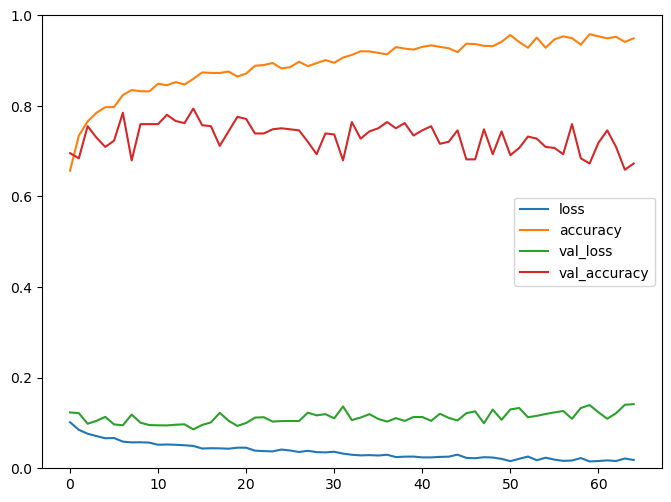

### Results auf test data ###
Accuracy for person  30 :  0.9464285714285714
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0  6 22  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1037 - accuracy: 0.6512 - val_loss: 0.1276 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0835 - accuracy: 0.7387 - val_loss: 0.1028 - val_accuracy: 0.7300
Epoch 3/500
197/197 - 0s - loss: 0.0787 - accuracy: 0.7532 - val_loss: 0.1130 - val_accuracy: 0.6751
Epoch 4/500
197/197 - 0s - loss: 0.0672 - accuracy: 0.7998 - val_loss: 0.0989 - val_accuracy: 0.7574
Epoch 5/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.8026 - val_loss: 0.1103 - val_accuracy: 0.7117
Epoch 6/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8171 - val_loss: 0.1081 - val_accuracy: 0.7254
Epoch 7/500
197/197 - 0s - loss: 0.0570 - accuracy: 0.8331 - val_loss: 0.0972 - val_accuracy: 0.7574
Epoch 8/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8313 - val_loss: 0.1157 - val_accuracy: 0.7254
Epoch 9/500
197/197 - 0s - loss: 0.0588 - accuracy: 0.8

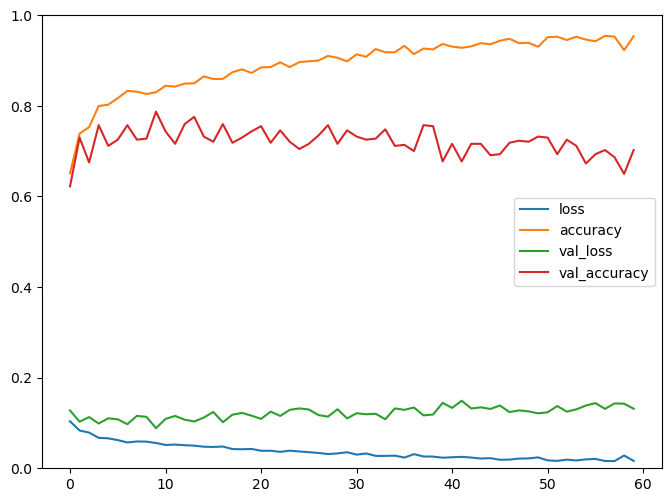

### Results auf test data ###
Accuracy for person  31 :  0.7142857142857143
[[11  9  8  0]
 [ 0 28  0  0]
 [ 0 15 13  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0995 - accuracy: 0.6721 - val_loss: 0.1153 - val_accuracy: 0.6499
Epoch 2/500
197/197 - 0s - loss: 0.0815 - accuracy: 0.7410 - val_loss: 0.0973 - val_accuracy: 0.7117
Epoch 3/500
197/197 - 0s - loss: 0.0732 - accuracy: 0.7792 - val_loss: 0.1124 - val_accuracy: 0.7048
Epoch 4/500
197/197 - 0s - loss: 0.0719 - accuracy: 0.7830 - val_loss: 0.1181 - val_accuracy: 0.6407
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7978 - val_loss: 0.1122 - val_accuracy: 0.6773
Epoch 6/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8143 - val_loss: 0.1007 - val_accuracy: 0.7208
Epoch 7/500
197/197 - 0s - loss: 0.0585 - accuracy: 0.8293 - val_loss: 0.1003 - val_accuracy: 0.7323
Epoch 8/500
197/197 - 0s - loss: 0.0575 - accuracy: 0.8298 - val_loss: 0.0930 - val_accuracy: 0.7483
Epoch 9/500
197/197 - 0s - loss: 0.0530 - accuracy: 0.8

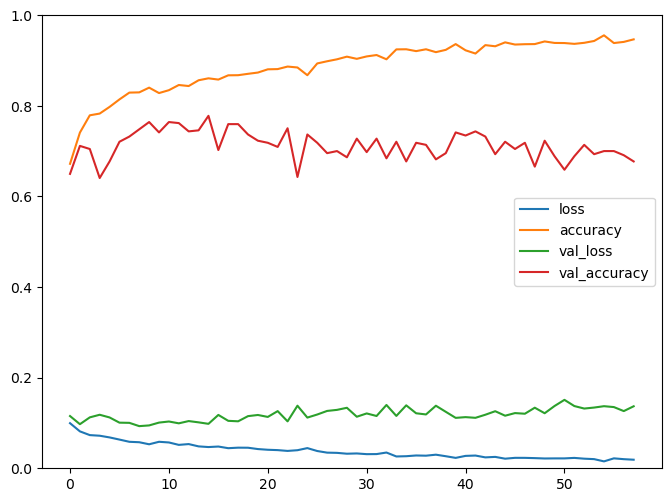

### Results auf test data ###
Accuracy for person  32 :  0.7678571428571429
[[10 17  1  0]
 [ 0 21  7  0]
 [ 0  0 27  1]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1013 - accuracy: 0.6573 - val_loss: 0.1119 - val_accuracy: 0.5995
Epoch 2/500
197/197 - 0s - loss: 0.0822 - accuracy: 0.7408 - val_loss: 0.1053 - val_accuracy: 0.7185
Epoch 3/500
197/197 - 0s - loss: 0.0727 - accuracy: 0.7856 - val_loss: 0.1135 - val_accuracy: 0.7025
Epoch 4/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.8003 - val_loss: 0.0958 - val_accuracy: 0.7803
Epoch 5/500
197/197 - 0s - loss: 0.0687 - accuracy: 0.7952 - val_loss: 0.1089 - val_accuracy: 0.6728
Epoch 6/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.8044 - val_loss: 0.1073 - val_accuracy: 0.7208
Epoch 7/500
197/197 - 0s - loss: 0.0576 - accuracy: 0.8263 - val_loss: 0.1123 - val_accuracy: 0.6865
Epoch 8/500
197/197 - 0s - loss: 0.0578 - accuracy: 0.8324 - val_loss: 0.0990 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0554 - accuracy: 0.8

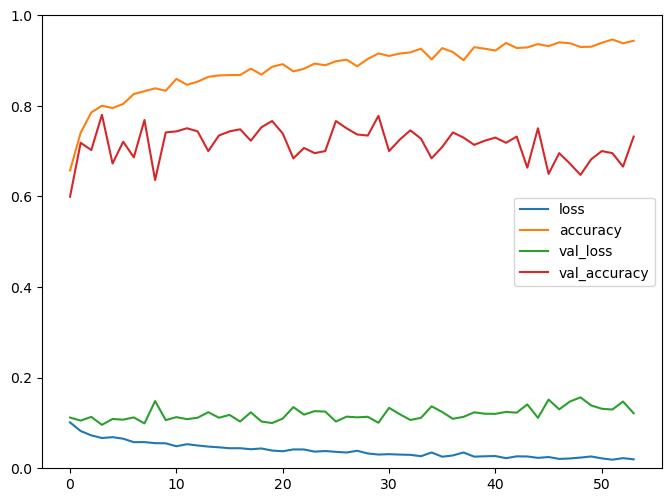

### Results auf test data ###
Accuracy for person  33 :  0.7053571428571429
[[28  0  0  0]
 [ 4 23  1  0]
 [14 14  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1020 - accuracy: 0.6550 - val_loss: 0.1025 - val_accuracy: 0.6773
Epoch 2/500
197/197 - 0s - loss: 0.0856 - accuracy: 0.7136 - val_loss: 0.1094 - val_accuracy: 0.6270
Epoch 3/500
197/197 - 0s - loss: 0.0810 - accuracy: 0.7494 - val_loss: 0.1132 - val_accuracy: 0.6705
Epoch 4/500
197/197 - 0s - loss: 0.0689 - accuracy: 0.7932 - val_loss: 0.0971 - val_accuracy: 0.7597
Epoch 5/500
197/197 - 0s - loss: 0.0697 - accuracy: 0.7939 - val_loss: 0.0944 - val_accuracy: 0.7506
Epoch 6/500
197/197 - 0s - loss: 0.0655 - accuracy: 0.8008 - val_loss: 0.0982 - val_accuracy: 0.7506
Epoch 7/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8105 - val_loss: 0.1086 - val_accuracy: 0.7254
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8252 - val_loss: 0.0898 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0561 - accuracy: 0.8

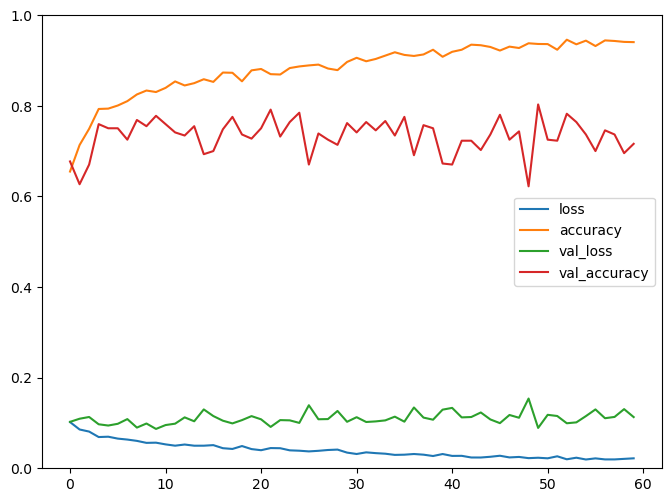

### Results auf test data ###
Accuracy for person  34 :  0.8303571428571429
[[26  0  2  0]
 [ 0 11 17  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1004 - accuracy: 0.6632 - val_loss: 0.1100 - val_accuracy: 0.6865
Epoch 2/500
197/197 - 0s - loss: 0.0858 - accuracy: 0.7237 - val_loss: 0.0986 - val_accuracy: 0.6522
Epoch 3/500
197/197 - 0s - loss: 0.0809 - accuracy: 0.7446 - val_loss: 0.0927 - val_accuracy: 0.7666
Epoch 4/500
197/197 - 0s - loss: 0.0741 - accuracy: 0.7764 - val_loss: 0.0992 - val_accuracy: 0.7323
Epoch 5/500
197/197 - 0s - loss: 0.0685 - accuracy: 0.7896 - val_loss: 0.1094 - val_accuracy: 0.6636
Epoch 6/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8028 - val_loss: 0.0862 - val_accuracy: 0.7826
Epoch 7/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8196 - val_loss: 0.0982 - val_accuracy: 0.7551
Epoch 8/500
197/197 - 0s - loss: 0.0583 - accuracy: 0.8250 - val_loss: 0.1106 - val_accuracy: 0.7208
Epoch 9/500
197/197 - 0s - loss: 0.0665 - accuracy: 0.7

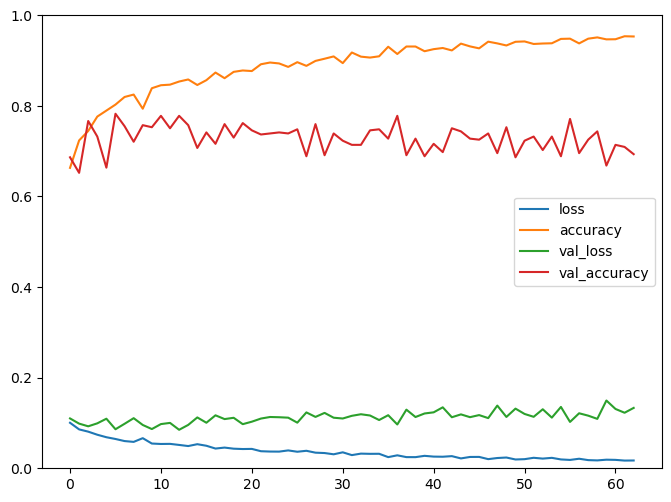

### Results auf test data ###
Accuracy for person  35 :  0.8303571428571429
[[18  3  7  0]
 [ 0 26  2  0]
 [ 0  2 26  0]
 [ 0  0  5 23]]
Epoch 1/500
197/197 - 0s - loss: 0.1005 - accuracy: 0.6680 - val_loss: 0.1268 - val_accuracy: 0.6178
Epoch 2/500
197/197 - 0s - loss: 0.0838 - accuracy: 0.7230 - val_loss: 0.1131 - val_accuracy: 0.6247
Epoch 3/500
197/197 - 0s - loss: 0.0765 - accuracy: 0.7660 - val_loss: 0.1005 - val_accuracy: 0.7208
Epoch 4/500
197/197 - 0s - loss: 0.0716 - accuracy: 0.7843 - val_loss: 0.1145 - val_accuracy: 0.7117
Epoch 5/500
197/197 - 0s - loss: 0.0648 - accuracy: 0.8092 - val_loss: 0.1107 - val_accuracy: 0.7323
Epoch 6/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8077 - val_loss: 0.1015 - val_accuracy: 0.7460
Epoch 7/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8173 - val_loss: 0.0960 - val_accuracy: 0.7368
Epoch 8/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8301 - val_loss: 0.1006 - val_accuracy: 0.7437
Epoch 9/500
197/197 - 0s - loss: 0.0554 - accuracy: 0.8

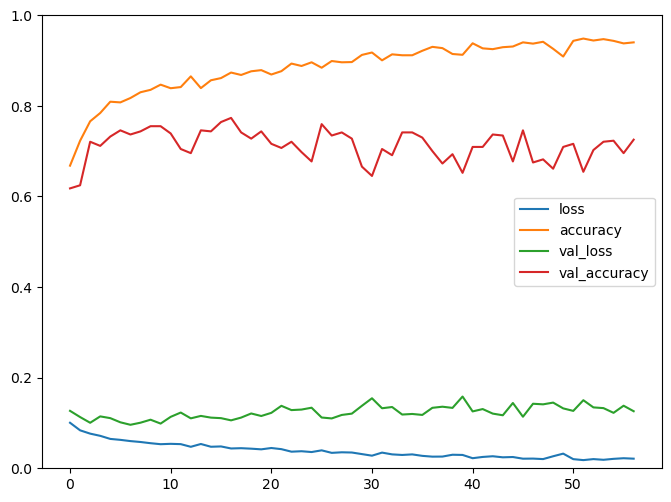

### Results auf test data ###
Accuracy for person  36 :  0.8571428571428571
[[28  0  0  0]
 [ 0 24  4  0]
 [10  2 16  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1041 - accuracy: 0.6454 - val_loss: 0.1183 - val_accuracy: 0.6636
Epoch 2/500
197/197 - 0s - loss: 0.0831 - accuracy: 0.7372 - val_loss: 0.1071 - val_accuracy: 0.6934
Epoch 3/500
197/197 - 0s - loss: 0.0760 - accuracy: 0.7708 - val_loss: 0.0910 - val_accuracy: 0.7849
Epoch 4/500
197/197 - 0s - loss: 0.0764 - accuracy: 0.7591 - val_loss: 0.0889 - val_accuracy: 0.7506
Epoch 5/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.8026 - val_loss: 0.0952 - val_accuracy: 0.7323
Epoch 6/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.8049 - val_loss: 0.1058 - val_accuracy: 0.7414
Epoch 7/500
197/197 - 0s - loss: 0.0645 - accuracy: 0.8118 - val_loss: 0.0955 - val_accuracy: 0.7437
Epoch 8/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8118 - val_loss: 0.0980 - val_accuracy: 0.7551
Epoch 9/500
197/197 - 0s - loss: 0.0565 - accuracy: 0.8

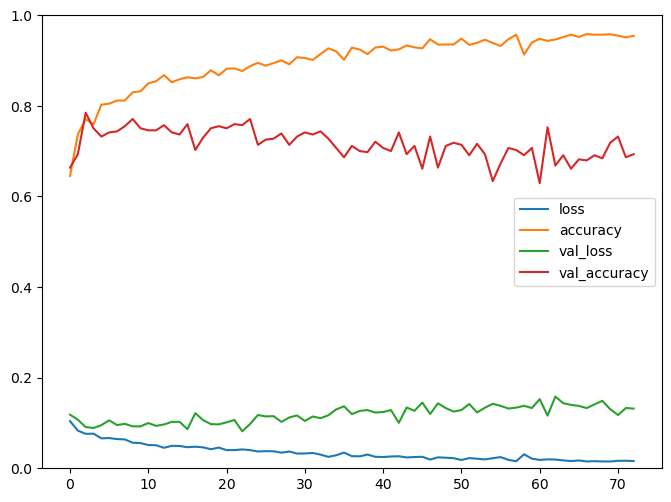

### Results auf test data ###
Accuracy for person  37 :  0.8392857142857143
[[28  0  0  0]
 [ 4 19  5  0]
 [ 9  0 19  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0989 - accuracy: 0.6779 - val_loss: 0.1093 - val_accuracy: 0.6499
Epoch 2/500
197/197 - 0s - loss: 0.0790 - accuracy: 0.7624 - val_loss: 0.1054 - val_accuracy: 0.7414
Epoch 3/500
197/197 - 0s - loss: 0.0784 - accuracy: 0.7695 - val_loss: 0.1005 - val_accuracy: 0.7460
Epoch 4/500
197/197 - 0s - loss: 0.0697 - accuracy: 0.7838 - val_loss: 0.0948 - val_accuracy: 0.8055
Epoch 5/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7924 - val_loss: 0.0914 - val_accuracy: 0.8146
Epoch 6/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8224 - val_loss: 0.0954 - val_accuracy: 0.7597
Epoch 7/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.8219 - val_loss: 0.0970 - val_accuracy: 0.7574
Epoch 8/500
197/197 - 0s - loss: 0.0568 - accuracy: 0.8339 - val_loss: 0.0946 - val_accuracy: 0.7597
Epoch 9/500
197/197 - 0s - loss: 0.0540 - accuracy: 0.8

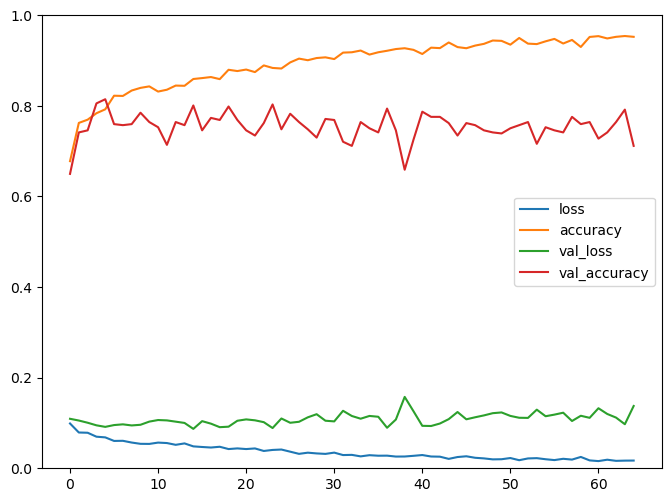

### Results auf test data ###
Accuracy for person  38 :  0.8392857142857143
[[28  0  0  0]
 [ 0 10 18  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0988 - accuracy: 0.6716 - val_loss: 0.0669 - val_accuracy: 0.7368
Epoch 2/500
197/197 - 0s - loss: 0.0836 - accuracy: 0.7278 - val_loss: 0.0535 - val_accuracy: 0.8650
Epoch 3/500
197/197 - 0s - loss: 0.0773 - accuracy: 0.7647 - val_loss: 0.0546 - val_accuracy: 0.8330
Epoch 4/500
197/197 - 0s - loss: 0.0724 - accuracy: 0.7787 - val_loss: 0.0447 - val_accuracy: 0.8856
Epoch 5/500
197/197 - 0s - loss: 0.0686 - accuracy: 0.7970 - val_loss: 0.0788 - val_accuracy: 0.7620
Epoch 6/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7911 - val_loss: 0.0505 - val_accuracy: 0.8535
Epoch 7/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8219 - val_loss: 0.0510 - val_accuracy: 0.8467
Epoch 8/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8194 - val_loss: 0.0629 - val_accuracy: 0.8330
Epoch 9/500
197/197 - 0s - loss: 0.0583 - accuracy: 0.8

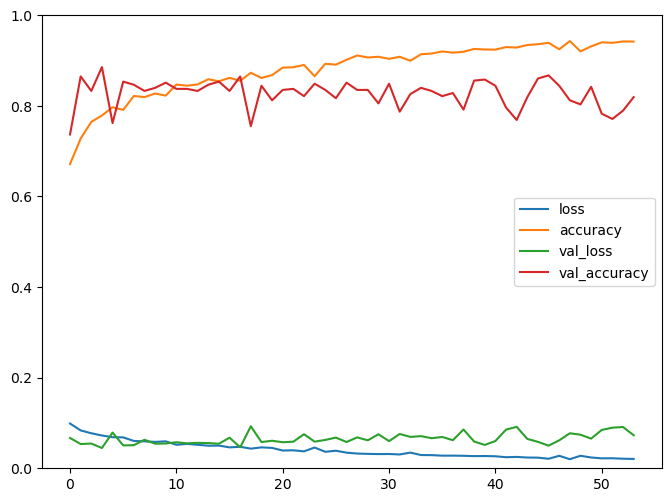

### Results auf test data ###
Accuracy for person  39 :  0.5625
[[21  7  0  0]
 [ 0 12  0 16]
 [ 0 22  2  4]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1022 - accuracy: 0.6589 - val_loss: 0.1160 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0837 - accuracy: 0.7281 - val_loss: 0.1047 - val_accuracy: 0.6773
Epoch 3/500
197/197 - 0s - loss: 0.0794 - accuracy: 0.7578 - val_loss: 0.1040 - val_accuracy: 0.7529
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7828 - val_loss: 0.0931 - val_accuracy: 0.7414
Epoch 5/500
197/197 - 0s - loss: 0.0636 - accuracy: 0.8064 - val_loss: 0.0732 - val_accuracy: 0.8398
Epoch 6/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8214 - val_loss: 0.0975 - val_accuracy: 0.7254
Epoch 7/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8288 - val_loss: 0.0965 - val_accuracy: 0.7666
Epoch 8/500
197/197 - 0s - loss: 0.0580 - accuracy: 0.8298 - val_loss: 0.0865 - val_accuracy: 0.7963
Epoch 9/500
197/197 - 0s - loss: 0.0545 - accuracy: 0.8374 - val_lo

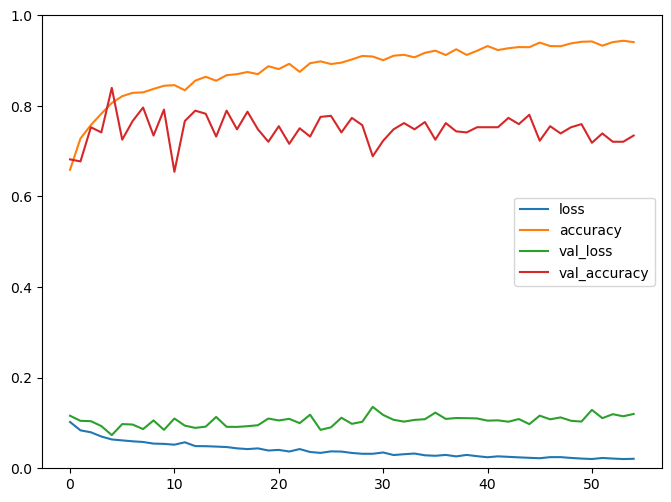

### Results auf test data ###
Accuracy for person  40 :  0.8125
[[28  0  0  0]
 [ 0 21  7  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]

 ##### overall accuracy:  0.7401785714285715 #####


In [31]:
# Ergebnis auf b)

accuracies = testANN_b(hp_ann_big, n_attributes, n_classes)
results_b[3] = accuracies

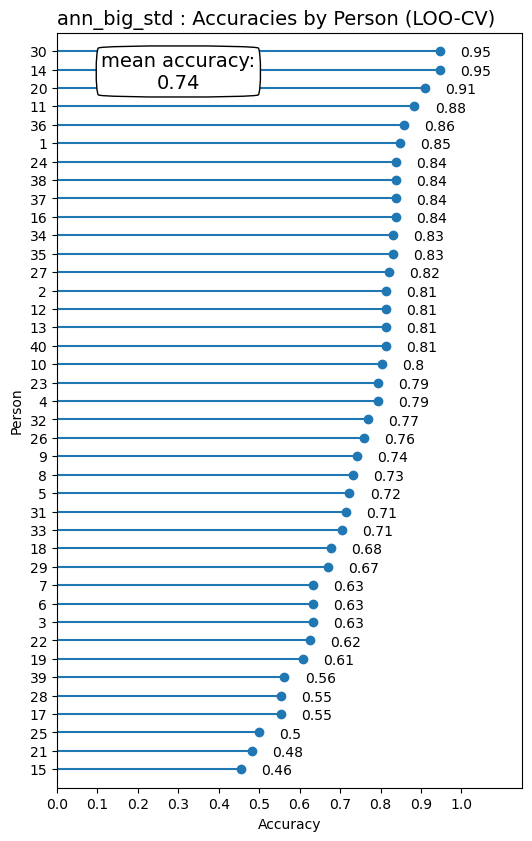

In [32]:
lolli_plot('ann_big_std')

## Random Forest 

In [33]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

In [34]:
## train test split
train_data, test_data, train_labels_raw, test_labels_raw = train_test_split(
                      data_input, data_labels_raw, test_size = 0.1, random_state=123)

In [35]:
rfc = RandomForestClassifier(n_estimators=200, max_depth=8, max_features = 'auto', criterion = 'gini')
model = rfc.fit(train_data,train_labels)

In [36]:
# classification of test set
print("######## Results auf test data #########")

predictions = np.argmax(model.predict(test_data), axis=-1)
cm= confusion_matrix(test_labels_raw, predictions+1)
acc = accuracy_score(test_labels_raw, predictions+1) 

print("Accuracy (test): ", acc)
print(cm)
results_a[4] = acc

######## Results auf test data #########
Accuracy (test):  0.8705357142857143
[[102   1   4   0]
 [ 13  90   5   0]
 [ 16  16  74   0]
 [  3   0   0 124]]


In [37]:
loocv_test = list()
loocv_train = list()

for i in range(1, 41):
    loocv_test.append(data[data['Person'] == i])
    loocv_train.append(data[data['Person'] != i])


accuracies = list()

for i in range(40):
    train_data = loocv_train[i].drop(['Person', 'class'], axis = 1)
    train_labels_raw = loocv_train[i]['class']
    test_data = loocv_test[i].drop(['Person', 'class'], axis = 1)
    test_labels_raw = loocv_test[i]['class']
    
    
    ## one-hot-encoding 
    encoder = LabelBinarizer().fit(train_labels_raw)
    train_labels = encoder.transform(train_labels_raw)
    test_labels = encoder.transform(test_labels_raw)
 
    
    clf = RandomForestClassifier(n_estimators=200, max_depth=8, max_features = 'auto', criterion = 'gini')
    model = clf.fit(train_data,train_labels)
    

    # classification of test set
    print("### Results auf test data ###")
    pred = model.predict(test_data)
    predictions = np.argmax(model.predict(test_data), axis=-1)  # neural network outputs to classes
    cm = confusion_matrix(test_labels_raw, predictions+1)

    acc = accuracy_score(test_labels_raw, predictions+1)
    accuracies.append(acc)
    print("Accuracy for person ", i+1, ": ", acc)
    print(cm)
    
    del model
    
print('\n ##### overall accuracy: ', np.mean(accuracies), '#####')

### Results auf test data ###
Accuracy for person  1 :  0.7321428571428571
[[25  3  0  0]
 [ 1 27  0  0]
 [ 5 21  2  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  2 :  0.8482142857142857
[[26  0  2  0]
 [ 4 17  7  0]
 [ 4  0 24  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  3 :  0.8035714285714286
[[26  2  0  0]
 [ 7 19  2  0]
 [ 6  4 18  0]
 [ 1  0  0 27]]
### Results auf test data ###
Accuracy for person  4 :  0.44642857142857145
[[28  0  0  0]
 [28  0  0  0]
 [28  0  0  0]
 [ 6  0  0 22]]
### Results auf test data ###
Accuracy for person  5 :  0.8482142857142857
[[28  0  0  0]
 [ 2 26  0  0]
 [ 9  6 13  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  6 :  0.6607142857142857
[[28  0  0  0]
 [24  4  0  0]
 [14  0 14  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  7 :  0.7589285714285714
[[28  0  0  0]
 [ 3 24  1  0]
 [ 9 14  5  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for pers

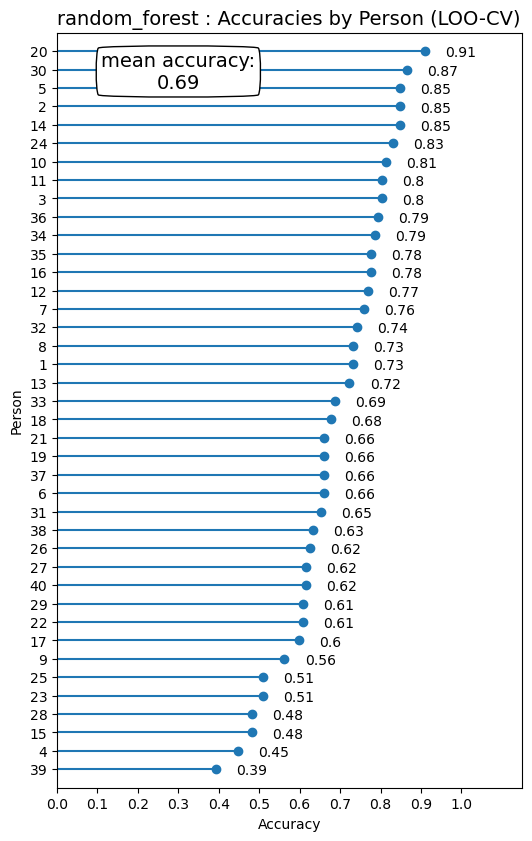

In [38]:
lolli_plot('random_forest')

In [39]:
results_b[4] = accuracies

## XGBoost 

In [40]:
import xgboost as xgb

In [41]:
## train test split
train_data, test_data, train_labels_raw, test_labels_raw = train_test_split(
                      data_input, data_labels_raw, test_size = 0.1, random_state=123)

## preprocessing: scale data to make sure each feature has equal influence
scaler = MinMaxScaler().fit(train_data)  # z-score

train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data) 

In [42]:
xgboost = xgb.XGBClassifier(use_label_encoder=False)

In [43]:
xgboost.fit(train_data, train_labels_raw-1, )

[12:39:02] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=24, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

In [44]:
# classification of test set
print("######## Results auf test data #########")
pred = xgboost.predict(test_data)+1

cm = confusion_matrix(test_labels_raw, pred)

acc = accuracy_score(test_labels_raw, pred)
print("Accuracy (test): ", acc)
print(cm)
results_a[5] = acc

######## Results auf test data #########
Accuracy (test):  0.9977678571428571
[[106   0   1   0]
 [  0 108   0   0]
 [  0   0 106   0]
 [  0   0   0 127]]


In [45]:
def testModel_b(model_in):

    # train test split / leave one out

    loocv_test = list()
    loocv_train = list()

    for i in range(1, 41):
        loocv_test.append(data[data['Person'] == i])
        loocv_train.append(data[data['Person'] != i])

    accuracies = list()

    for i in range(40):

        train_data = loocv_train[i].drop(['Person', 'class'], axis = 1)
        train_labels_raw = loocv_train[i]['class']
        test_data = loocv_test[i].drop(['Person', 'class'], axis = 1)
        test_labels_raw = loocv_test[i]['class']


        ## preprocessing: scale data to make sure each feature has equal influence
        #scaler = StandardScaler().fit(train_data)  # z-score
        scaler = MinMaxScaler().fit(train_data)
        train_data = scaler.transform(train_data)
        test_data = scaler.transform(test_data)

        ## one-hot-encoding 
        encoder = LabelBinarizer().fit(train_labels_raw)

        train_labels = encoder.transform(train_labels_raw)
        test_labels = encoder.transform(test_labels_raw)

        ## build and fit model
        model = model_in
        model = model.fit(train_data,train_labels_raw-1, verbose=0)

        # classification of test set
        print("### Results auf test data ###")
        pred = model.predict(test_data)+1
        cm = confusion_matrix(test_labels_raw, pred)
        acc = accuracy_score(test_labels_raw, pred)
        accuracies.append(acc)
        print("Accuracy for person ", i+1, ": ", acc)
        print(cm)

        del model

    print('\n ##### overall accuracy: ', np.mean(accuracies), '#####')
    return accuracies

In [46]:
accuracies = testModel_b(xgboost)
results_b[5] = accuracies

[12:39:09] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  1 :  0.6428571428571429
[[14 14  0  0]
 [ 0 28  0  0]
 [ 0 26  2  0]
 [ 0  0  0 28]]
[12:39:15] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  2 :  0.7857142857142857
[[25  0  3  0]
 [ 0  7 21  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
[12:39:20] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, t

### Results auf test data ###
Accuracy for person  20 :  0.9642857142857143
[[28  0  0  0]
 [ 0 28  0  0]
 [ 1  3 24  0]
 [ 0  0  0 28]]
[12:40:57] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  21 :  0.6875
[[15  0 13  0]
 [ 0 28  0  0]
 [ 0 22  6  0]
 [ 0  0  0 28]]
[12:41:02] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  22 :  0.7142857142857143
[[27  0  1  0]
 [ 0 11 13  4]
 [ 1 13 14  0]
 [ 0  0  0 

### Results auf test data ###
Accuracy for person  39 :  0.3392857142857143
[[28  0  0  0]
 [18  0  0 10]
 [26  0  0  2]
 [18  0  0 10]]
[12:42:39] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  40 :  0.5
[[28  0  0  0]
 [28  0  0  0]
 [28  0  0  0]
 [ 0  0  0 28]]

 ##### overall accuracy:  0.7618303571428571 #####


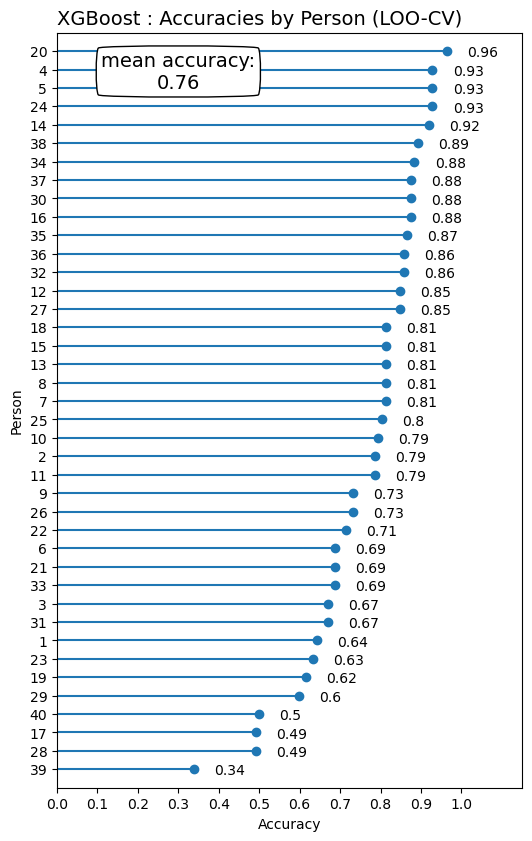

In [47]:
lolli_plot('XGBoost')

## Catboost

CatBoost benötigt kein one-hot-encoding. Das Modell liefert schon mit den default-Parametern gute Ergebnisse.

https://catboost.ai/

In [48]:
from catboost import CatBoostClassifier

In [49]:
cbc = CatBoostClassifier()
cbc.fit(train_data, train_labels_raw, verbose=50)

Learning rate set to 0.084958
0:	learn: 1.2630585	total: 111ms	remaining: 1m 51s
50:	learn: 0.3402989	total: 3.47s	remaining: 1m 4s
100:	learn: 0.2022634	total: 6.94s	remaining: 1m 1s
150:	learn: 0.1259838	total: 10.3s	remaining: 58.2s
200:	learn: 0.0851523	total: 13.7s	remaining: 54.3s
250:	learn: 0.0621397	total: 16.9s	remaining: 50.6s
300:	learn: 0.0479185	total: 20.3s	remaining: 47.2s
350:	learn: 0.0386677	total: 23.6s	remaining: 43.7s
400:	learn: 0.0310706	total: 26.9s	remaining: 40.2s
450:	learn: 0.0261354	total: 30.2s	remaining: 36.8s
500:	learn: 0.0223482	total: 33.5s	remaining: 33.4s
550:	learn: 0.0195174	total: 36.8s	remaining: 30s
600:	learn: 0.0170019	total: 40.1s	remaining: 26.6s
650:	learn: 0.0149489	total: 43.4s	remaining: 23.3s
700:	learn: 0.0133984	total: 46.7s	remaining: 19.9s
750:	learn: 0.0121165	total: 50.1s	remaining: 16.6s
800:	learn: 0.0110293	total: 53.4s	remaining: 13.3s
850:	learn: 0.0100648	total: 56.7s	remaining: 9.93s
900:	learn: 0.0092142	total: 60s	remai

In [50]:
# classification of test set
print("######## Results auf test data #########")
pred = cbc.predict(test_data)

cm = confusion_matrix(test_labels_raw, pred)

acc = accuracy_score(test_labels_raw, pred)
print("Accuracy (test): ", acc)
print(cm)
results_a[6] = acc

######## Results auf test data #########
Accuracy (test):  1.0
[[107   0   0   0]
 [  0 108   0   0]
 [  0   0 106   0]
 [  0   0   0 127]]


In [51]:

results_a

[0.9285714285714286,
 0.9642857142857143,
 0.9285714285714286,
 0.9151785714285714,
 0.8705357142857143,
 0.9977678571428571,
 1.0]

In [52]:
accuracies = testModel_b(cbc)


### Results auf test data ###
Accuracy for person  1 :  0.6339285714285714
[[14 14  0  0]
 [ 0 28  0  0]
 [ 0 27  1  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  2 :  0.7857142857142857
[[26  0  2  0]
 [ 0  6 22  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  3 :  0.7767857142857143
[[17 11  0  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  4 :  0.8125
[[28  0  0  0]
 [ 1  7 20  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  5 :  0.875
[[25  3  0  0]
 [ 0 20  8  0]
 [ 0  3 25  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  6 :  0.8125
[[28  0  0  0]
 [ 4 24  0  0]
 [17  0 11  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  7 :  0.8125
[[28  0  0  0]
 [ 0 28  0  0]
 [ 7 14  7  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  8 :  0.8035714285714286
[[26  2  0  0]
 [ 0 28

In [53]:
results_b[6] = accuracies

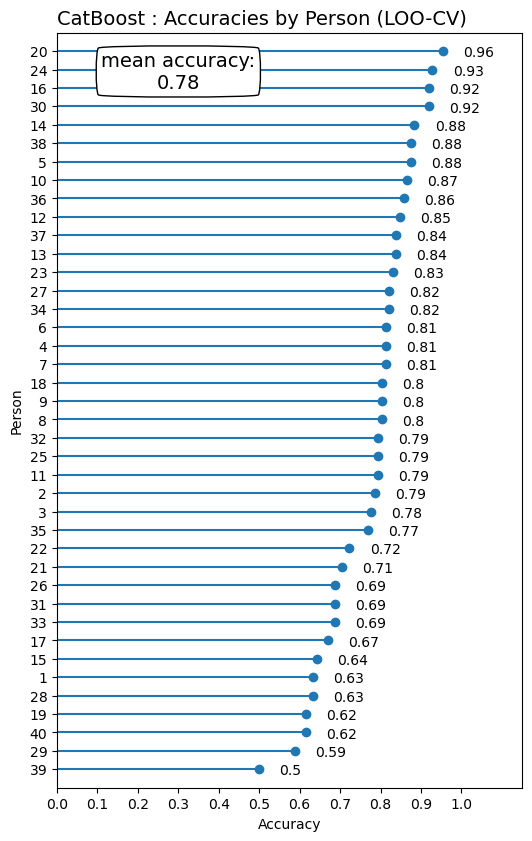

In [54]:
lolli_plot('CatBoost')

## Feature Selection

Es wurde die Möglichkeit untersucht, die Accuracy weiter zu steigern, indem die Zahl der Features mittels RFE reduziert wurde. Eine RFE mit CV wurde durchgeführt um die optimale Zahl der Features zu bestimmen. Das Ergebnis sind 184 Features (siehe Notebook 2). Die Modelle wurden nochmal auf das reduzierte Dataset trainiert und getestet.

In [55]:
# Aus Feature Selection im Notebook 2 kopiert

selection = np.array([False,  True, False,  True,  True, False, False,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True,  True,
       False, False, False, False,  True,  True,  True,  True,  True,
        True, False,  True, False,  True, False, False, False,  True,
        True, False,  True, False,  True,  True,  True,  True,  True,
        True, False, False, False,  True,  True,  True,  True,  True,
       False,  True, False, False, False,  True, False,  True, False,
       False, False, False,  True, False,  True,  True, False, False,
        True,  True,  True,  True,  True,  True, False,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False,  True,  True,  True,  True, False, False,
        True,  True,  True,  True,  True, False,  True,  True,  True,
        True,  True, False,  True, False, False,  True,  True,  True,
        True,  True, False,  True,  True,  True,  True,  True, False,
        True,  True, False,  True, False,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True, False,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False,  True, False, False,  True,  True,  True, False, False,
       False, False, False, False,  True,  True,  True, False, False,
       False, False,  True, False, False,  True,  True, False,  True,
        True, False,  True, False, False, False, False, False, False,
       False,  True, False, False,  True,  True, False,  True, False,
       False, False, False, False, False, False, False, False, False,
        True,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False,  True,
       False, False, False, False, False, False,  True, False, False,
        True,  True,  True, False, False, False, False, False,  True,
        True, False, False,  True, False, False, False, False, False,
        True,  True, False, False,  True,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False,  True, False, False, False,  True, False, False,
        True,  True, False, False, False, False,  True, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
        True, False, False, False, False, False, False,  True, False,
       False, False,  True, False, False,  True, False, False, False,
        True, False, False, False,  True,  True, False,  True,  True,
       False,  True, False, False, False, False, False, False, False,
       False, False,  True,  True, False,  True,  True, False, False,
       False,  True, False, False, False, False,  True, False,  True,
        True, False,  True,  True, False, False, False, False, False,
        True,  True,  True, False,  True,  True, False,  True, False,
       False, False, False, False, False, False, False,  True, False,
       False, False,  True, False,  True,  True,  True, False, False,
        True, False, False, False, False, False, False,  True, False,
       False, False, False, False, False,  True, False, False,  True,
        True, False, False, False, False,  True,  True,  True, False,
       False,  True])

In [56]:
features = np.array(data_input.columns)

rfecv = features[np.array(selection)]

In [57]:
len(rfecv)

184

In [58]:
results_a_fs = 5 * [0]
results_b_fs = 5 * [0]

In [59]:
data = data[['Person', 'class']+list(rfecv)]

In [60]:
# Data Preparation

data_input = data.drop(['Person', 'class'], axis = 1)
data_person = data['Person']
data_labels_raw = data['class']

## train test split
train_data, test_data, train_labels_raw, test_labels_raw = train_test_split(
                      data_input, data_labels_raw, test_size = 0.1, random_state=123)

## preprocessing: scale data to make sure each feature has equal influence
#scaler = StandardScaler().fit(train_data)  # z-score
scaler = MinMaxScaler().fit(train_data)

train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)

## one-hot-encoding 
encoder = LabelBinarizer().fit(train_labels_raw)

train_labels = encoder.transform(train_labels_raw)
test_labels = encoder.transform(test_labels_raw)


#extract number of features and classes 
n_attributes = data_input.shape[1]
n_classes = train_labels.shape[1]

## Kleines Neuronales Netz nach Feature Selection

In [61]:
model_ann_small = createANN(hp_ann_small, n_attributes, n_classes)

Epoch 1/500
182/182 - 0s - loss: 0.1181 - accuracy: 0.6315 - val_loss: 0.0871 - val_accuracy: 0.7129
Epoch 2/500
182/182 - 0s - loss: 0.0844 - accuracy: 0.7324 - val_loss: 0.0753 - val_accuracy: 0.7649
Epoch 3/500
182/182 - 0s - loss: 0.0742 - accuracy: 0.7787 - val_loss: 0.0695 - val_accuracy: 0.7946
Epoch 4/500
182/182 - 0s - loss: 0.0706 - accuracy: 0.7845 - val_loss: 0.0626 - val_accuracy: 0.8168
Epoch 5/500
182/182 - 0s - loss: 0.0685 - accuracy: 0.7980 - val_loss: 0.0592 - val_accuracy: 0.8416
Epoch 6/500
182/182 - 0s - loss: 0.0653 - accuracy: 0.8079 - val_loss: 0.0573 - val_accuracy: 0.8441
Epoch 7/500
182/182 - 0s - loss: 0.0632 - accuracy: 0.8098 - val_loss: 0.0563 - val_accuracy: 0.8342
Epoch 8/500
182/182 - 0s - loss: 0.0621 - accuracy: 0.8167 - val_loss: 0.0546 - val_accuracy: 0.8391
Epoch 9/500
182/182 - 0s - loss: 0.0604 - accuracy: 0.8173 - val_loss: 0.0526 - val_accuracy: 0.8540
Epoch 10/500
182/182 - 0s - loss: 0.0587 - accuracy: 0.8277 - val_loss: 0.0527 - val_accura

Epoch 82/500
182/182 - 0s - loss: 0.0336 - accuracy: 0.9099 - val_loss: 0.0305 - val_accuracy: 0.9134
Epoch 83/500
182/182 - 0s - loss: 0.0324 - accuracy: 0.9079 - val_loss: 0.0281 - val_accuracy: 0.9233
Epoch 84/500
182/182 - 0s - loss: 0.0331 - accuracy: 0.9057 - val_loss: 0.0291 - val_accuracy: 0.9257
Epoch 85/500
182/182 - 0s - loss: 0.0322 - accuracy: 0.9132 - val_loss: 0.0317 - val_accuracy: 0.9035
Epoch 86/500
182/182 - 0s - loss: 0.0315 - accuracy: 0.9173 - val_loss: 0.0282 - val_accuracy: 0.9356
Epoch 87/500
182/182 - 0s - loss: 0.0312 - accuracy: 0.9165 - val_loss: 0.0270 - val_accuracy: 0.9282
Epoch 88/500
182/182 - 0s - loss: 0.0309 - accuracy: 0.9154 - val_loss: 0.0302 - val_accuracy: 0.9158
Epoch 89/500
182/182 - 0s - loss: 0.0307 - accuracy: 0.9168 - val_loss: 0.0257 - val_accuracy: 0.9406
Epoch 90/500
182/182 - 0s - loss: 0.0310 - accuracy: 0.9173 - val_loss: 0.0347 - val_accuracy: 0.8985
Epoch 91/500
182/182 - 0s - loss: 0.0311 - accuracy: 0.9123 - val_loss: 0.0271 - v

Epoch 162/500
182/182 - 0s - loss: 0.0146 - accuracy: 0.9644 - val_loss: 0.0161 - val_accuracy: 0.9703
Epoch 163/500
182/182 - 0s - loss: 0.0144 - accuracy: 0.9639 - val_loss: 0.0210 - val_accuracy: 0.9356
Epoch 164/500
182/182 - 0s - loss: 0.0138 - accuracy: 0.9680 - val_loss: 0.0157 - val_accuracy: 0.9629
Epoch 165/500
182/182 - 0s - loss: 0.0134 - accuracy: 0.9675 - val_loss: 0.0165 - val_accuracy: 0.9629
Epoch 166/500
182/182 - 0s - loss: 0.0148 - accuracy: 0.9639 - val_loss: 0.0178 - val_accuracy: 0.9530
Epoch 167/500
182/182 - 0s - loss: 0.0134 - accuracy: 0.9672 - val_loss: 0.0193 - val_accuracy: 0.9530
Epoch 168/500
182/182 - 0s - loss: 0.0145 - accuracy: 0.9644 - val_loss: 0.0168 - val_accuracy: 0.9554
Epoch 169/500
182/182 - 0s - loss: 0.0134 - accuracy: 0.9689 - val_loss: 0.0151 - val_accuracy: 0.9653
Epoch 170/500
182/182 - 0s - loss: 0.0133 - accuracy: 0.9678 - val_loss: 0.0146 - val_accuracy: 0.9653
Epoch 171/500
182/182 - 0s - loss: 0.0130 - accuracy: 0.9700 - val_loss: 

Epoch 242/500
182/182 - 0s - loss: 0.0063 - accuracy: 0.9873 - val_loss: 0.0089 - val_accuracy: 0.9802
Epoch 243/500
182/182 - 0s - loss: 0.0068 - accuracy: 0.9843 - val_loss: 0.0083 - val_accuracy: 0.9802
Epoch 244/500
182/182 - 0s - loss: 0.0064 - accuracy: 0.9859 - val_loss: 0.0077 - val_accuracy: 0.9777
Epoch 245/500
182/182 - 0s - loss: 0.0062 - accuracy: 0.9865 - val_loss: 0.0078 - val_accuracy: 0.9777
Epoch 246/500
182/182 - 0s - loss: 0.0073 - accuracy: 0.9832 - val_loss: 0.0086 - val_accuracy: 0.9851
Epoch 247/500
182/182 - 0s - loss: 0.0066 - accuracy: 0.9846 - val_loss: 0.0087 - val_accuracy: 0.9752
Epoch 248/500
182/182 - 0s - loss: 0.0062 - accuracy: 0.9846 - val_loss: 0.0097 - val_accuracy: 0.9777
Epoch 249/500
182/182 - 0s - loss: 0.0060 - accuracy: 0.9873 - val_loss: 0.0077 - val_accuracy: 0.9777
Epoch 250/500
182/182 - 0s - loss: 0.0067 - accuracy: 0.9859 - val_loss: 0.0080 - val_accuracy: 0.9777
Epoch 251/500
182/182 - 0s - loss: 0.0067 - accuracy: 0.9837 - val_loss: 

Epoch 322/500
182/182 - 0s - loss: 0.0039 - accuracy: 0.9909 - val_loss: 0.0055 - val_accuracy: 0.9851
Epoch 323/500
182/182 - 0s - loss: 0.0057 - accuracy: 0.9843 - val_loss: 0.0099 - val_accuracy: 0.9777
Epoch 324/500
182/182 - 0s - loss: 0.0039 - accuracy: 0.9915 - val_loss: 0.0096 - val_accuracy: 0.9728
Epoch 325/500
182/182 - 0s - loss: 0.0042 - accuracy: 0.9901 - val_loss: 0.0083 - val_accuracy: 0.9777
Epoch 326/500
182/182 - 0s - loss: 0.0039 - accuracy: 0.9915 - val_loss: 0.0073 - val_accuracy: 0.9851
Epoch 327/500
182/182 - 0s - loss: 0.0038 - accuracy: 0.9917 - val_loss: 0.0071 - val_accuracy: 0.9827
Epoch 328/500
182/182 - 0s - loss: 0.0039 - accuracy: 0.9909 - val_loss: 0.0062 - val_accuracy: 0.9851
Epoch 329/500
182/182 - 0s - loss: 0.0051 - accuracy: 0.9879 - val_loss: 0.0064 - val_accuracy: 0.9851
Epoch 330/500
182/182 - 0s - loss: 0.0042 - accuracy: 0.9901 - val_loss: 0.0061 - val_accuracy: 0.9851
Epoch 331/500
182/182 - 0s - loss: 0.0041 - accuracy: 0.9906 - val_loss: 

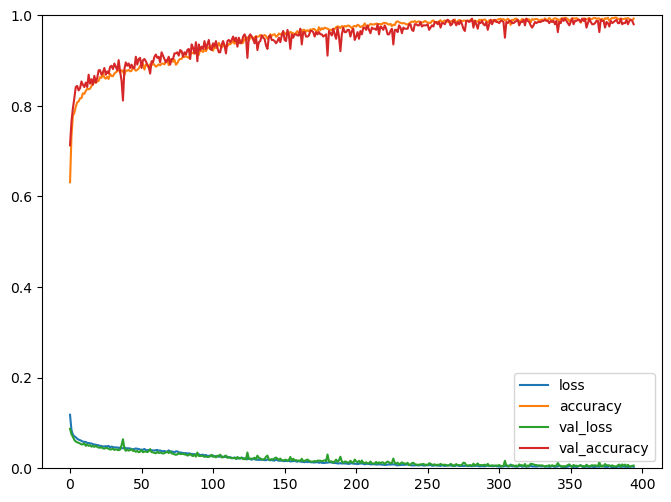

In [62]:
trainANN(model_ann_small, hp_ann_small, train_data, train_labels)

In [63]:
# Ergebnis auf a)

acc = testANN_a(model_ann_small)
results_a_fs[0]=acc

######## Results auf test data #########
Accuracy (test):  0.9799107142857143
[[104   2   1   0]
 [  0 106   2   0]
 [  0   3 103   0]
 [  0   0   1 126]]


Epoch 1/500
197/197 - 0s - loss: 0.1121 - accuracy: 0.6525 - val_loss: 0.1262 - val_accuracy: 0.6430
Epoch 2/500
197/197 - 0s - loss: 0.0831 - accuracy: 0.7362 - val_loss: 0.1188 - val_accuracy: 0.6430
Epoch 3/500
197/197 - 0s - loss: 0.0725 - accuracy: 0.7789 - val_loss: 0.1148 - val_accuracy: 0.6819
Epoch 4/500
197/197 - 0s - loss: 0.0719 - accuracy: 0.7749 - val_loss: 0.1094 - val_accuracy: 0.6636
Epoch 5/500
197/197 - 0s - loss: 0.0674 - accuracy: 0.7993 - val_loss: 0.1021 - val_accuracy: 0.7094
Epoch 6/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8008 - val_loss: 0.0989 - val_accuracy: 0.6888
Epoch 7/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8102 - val_loss: 0.1073 - val_accuracy: 0.6705
Epoch 8/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8100 - val_loss: 0.0961 - val_accuracy: 0.7460
Epoch 9/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8199 - val_loss: 0.0968 - val_accuracy: 0.7094
Epoch 10/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8265 - val_loss: 0.1019 - val_accura

Epoch 82/500
197/197 - 0s - loss: 0.0331 - accuracy: 0.9089 - val_loss: 0.0926 - val_accuracy: 0.7620
Model: "sequential_165"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                5550      
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 6,604
Trainable params: 6,604
Non-trainable params: 0
_________________________________________________________________


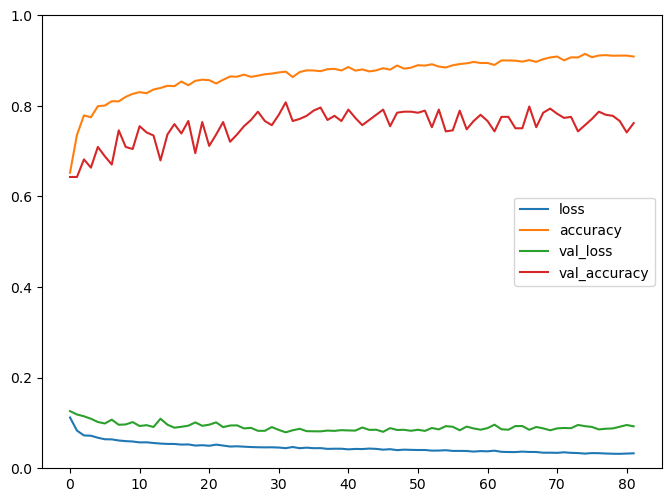

### Results auf test data ###
Accuracy for person  1 :  0.75
[[14 14  0  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1199 - accuracy: 0.6202 - val_loss: 0.1370 - val_accuracy: 0.6018
Epoch 2/500
197/197 - 0s - loss: 0.0826 - accuracy: 0.7446 - val_loss: 0.1283 - val_accuracy: 0.6453
Epoch 3/500
197/197 - 0s - loss: 0.0734 - accuracy: 0.7744 - val_loss: 0.1173 - val_accuracy: 0.6751
Epoch 4/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7894 - val_loss: 0.1176 - val_accuracy: 0.6705
Epoch 5/500
197/197 - 0s - loss: 0.0671 - accuracy: 0.8021 - val_loss: 0.1357 - val_accuracy: 0.6224
Epoch 6/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.8072 - val_loss: 0.1098 - val_accuracy: 0.6865
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8120 - val_loss: 0.1099 - val_accuracy: 0.7071
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8115 - val_loss: 0.1005 - val_accuracy: 0.7048
Epoch 9/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8209 - val_loss:

Epoch 81/500
197/197 - 0s - loss: 0.0299 - accuracy: 0.9201 - val_loss: 0.0993 - val_accuracy: 0.7597
Epoch 82/500
197/197 - 0s - loss: 0.0297 - accuracy: 0.9211 - val_loss: 0.1010 - val_accuracy: 0.7574
Model: "sequential_166"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                5550      
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 6,604
Trainable params: 6,604
Non-trainable params: 0
_________________________________________________________________


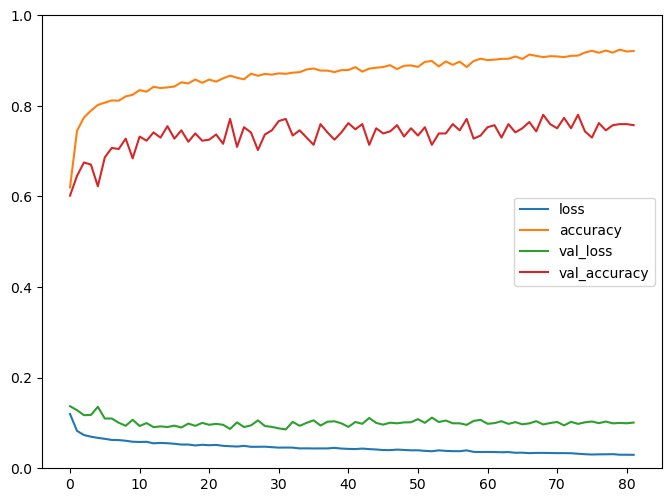

### Results auf test data ###
Accuracy for person  2 :  0.8035714285714286
[[12  0 16  0]
 [ 0 22  6  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1146 - accuracy: 0.6393 - val_loss: 0.1205 - val_accuracy: 0.6911
Epoch 2/500
197/197 - 0s - loss: 0.0801 - accuracy: 0.7558 - val_loss: 0.1102 - val_accuracy: 0.7117
Epoch 3/500
197/197 - 0s - loss: 0.0731 - accuracy: 0.7769 - val_loss: 0.1258 - val_accuracy: 0.6522
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7889 - val_loss: 0.1248 - val_accuracy: 0.6568
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.7950 - val_loss: 0.1117 - val_accuracy: 0.7071
Epoch 6/500
197/197 - 0s - loss: 0.0648 - accuracy: 0.8023 - val_loss: 0.1067 - val_accuracy: 0.7071
Epoch 7/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8118 - val_loss: 0.1032 - val_accuracy: 0.7254
Epoch 8/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8176 - val_loss: 0.0998 - val_accuracy: 0.7254
Epoch 9/500
197/197 - 0s - loss: 0.0598 - accuracy: 0.82

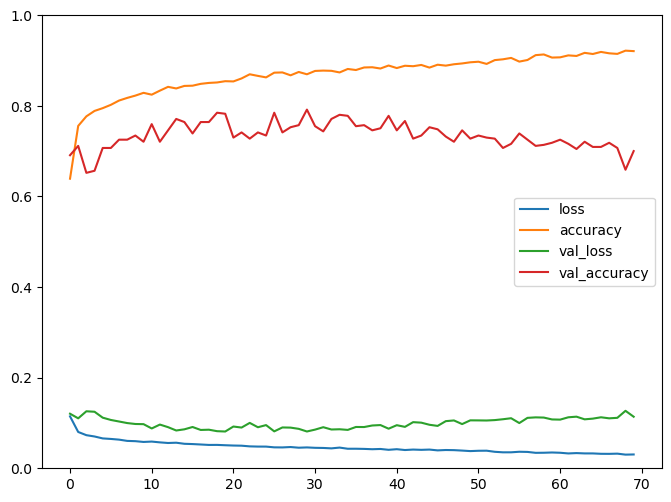

### Results auf test data ###
Accuracy for person  3 :  0.7857142857142857
[[28  0  0  0]
 [ 0 21  3  4]
 [ 0 11 11  6]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1131 - accuracy: 0.6449 - val_loss: 0.1233 - val_accuracy: 0.5973
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7471 - val_loss: 0.1258 - val_accuracy: 0.6270
Epoch 3/500
197/197 - 0s - loss: 0.0731 - accuracy: 0.7749 - val_loss: 0.1136 - val_accuracy: 0.6819
Epoch 4/500
197/197 - 0s - loss: 0.0700 - accuracy: 0.7779 - val_loss: 0.1145 - val_accuracy: 0.6636
Epoch 5/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.7952 - val_loss: 0.1200 - val_accuracy: 0.6682
Epoch 6/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8054 - val_loss: 0.1066 - val_accuracy: 0.6934
Epoch 7/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8046 - val_loss: 0.1033 - val_accuracy: 0.7162
Epoch 8/500
197/197 - 0s - loss: 0.0618 - accuracy: 0.8176 - val_loss: 0.1142 - val_accuracy: 0.6888
Epoch 9/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.82

197/197 - 0s - loss: 0.0308 - accuracy: 0.9173 - val_loss: 0.0839 - val_accuracy: 0.7941
Epoch 81/500
197/197 - 0s - loss: 0.0308 - accuracy: 0.9138 - val_loss: 0.0845 - val_accuracy: 0.7849
Epoch 82/500
197/197 - 0s - loss: 0.0301 - accuracy: 0.9219 - val_loss: 0.0903 - val_accuracy: 0.7620
Epoch 83/500
197/197 - 0s - loss: 0.0300 - accuracy: 0.9191 - val_loss: 0.0824 - val_accuracy: 0.7895
Model: "sequential_168"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                5550      
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 6,604
Trainable params: 6,604
Non-trainable params: 0
___________________________________________________

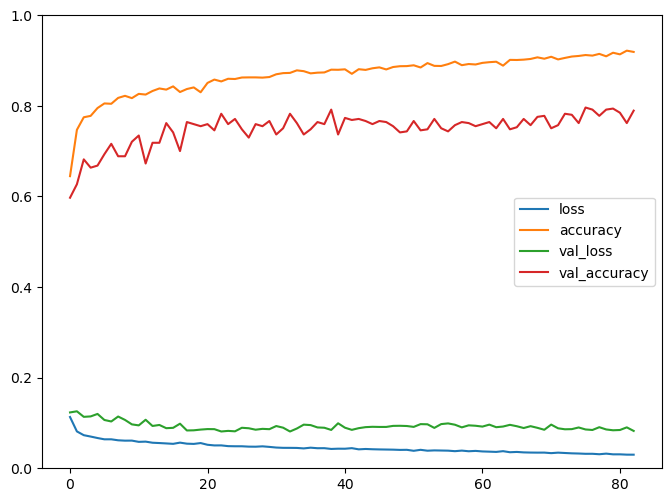

### Results auf test data ###
Accuracy for person  4 :  0.8125
[[26  0  2  0]
 [ 1 12 15  0]
 [ 0  0 28  0]
 [ 0  0  3 25]]
Epoch 1/500
197/197 - 0s - loss: 0.1151 - accuracy: 0.6400 - val_loss: 0.1379 - val_accuracy: 0.5789
Epoch 2/500
197/197 - 0s - loss: 0.0831 - accuracy: 0.7354 - val_loss: 0.1210 - val_accuracy: 0.6568
Epoch 3/500
197/197 - 0s - loss: 0.0735 - accuracy: 0.7736 - val_loss: 0.1342 - val_accuracy: 0.6087
Epoch 4/500
197/197 - 0s - loss: 0.0696 - accuracy: 0.7876 - val_loss: 0.1239 - val_accuracy: 0.6453
Epoch 5/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7962 - val_loss: 0.1202 - val_accuracy: 0.6522
Epoch 6/500
197/197 - 0s - loss: 0.0646 - accuracy: 0.8077 - val_loss: 0.1142 - val_accuracy: 0.6957
Epoch 7/500
197/197 - 0s - loss: 0.0635 - accuracy: 0.8120 - val_loss: 0.1115 - val_accuracy: 0.7071
Epoch 8/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8156 - val_loss: 0.1089 - val_accuracy: 0.6957
Epoch 9/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8133 - val_los

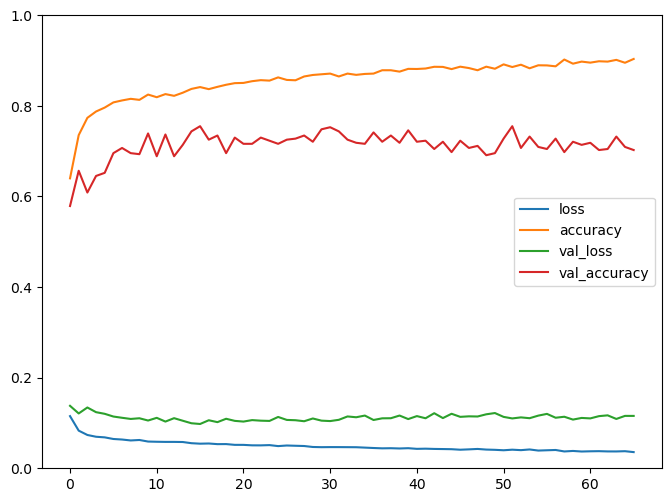

### Results auf test data ###
Accuracy for person  5 :  0.8928571428571429
[[23  5  0  0]
 [ 0 27  1  0]
 [ 0  6 22  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1178 - accuracy: 0.6164 - val_loss: 0.1259 - val_accuracy: 0.5767
Epoch 2/500
197/197 - 0s - loss: 0.0822 - accuracy: 0.7515 - val_loss: 0.1122 - val_accuracy: 0.7162
Epoch 3/500
197/197 - 0s - loss: 0.0735 - accuracy: 0.7754 - val_loss: 0.1115 - val_accuracy: 0.6888
Epoch 4/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7863 - val_loss: 0.1180 - val_accuracy: 0.6430
Epoch 5/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7955 - val_loss: 0.1077 - val_accuracy: 0.6865
Epoch 6/500
197/197 - 0s - loss: 0.0660 - accuracy: 0.7990 - val_loss: 0.1137 - val_accuracy: 0.6316
Epoch 7/500
197/197 - 0s - loss: 0.0635 - accuracy: 0.8133 - val_loss: 0.1085 - val_accuracy: 0.6819
Epoch 8/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8146 - val_loss: 0.1082 - val_accuracy: 0.6773
Epoch 9/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.82

197/197 - 0s - loss: 0.0283 - accuracy: 0.9285 - val_loss: 0.0942 - val_accuracy: 0.7666
Epoch 81/500
197/197 - 0s - loss: 0.0304 - accuracy: 0.9194 - val_loss: 0.0921 - val_accuracy: 0.7780
Model: "sequential_170"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                5550      
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 6,604
Trainable params: 6,604
Non-trainable params: 0
_________________________________________________________________


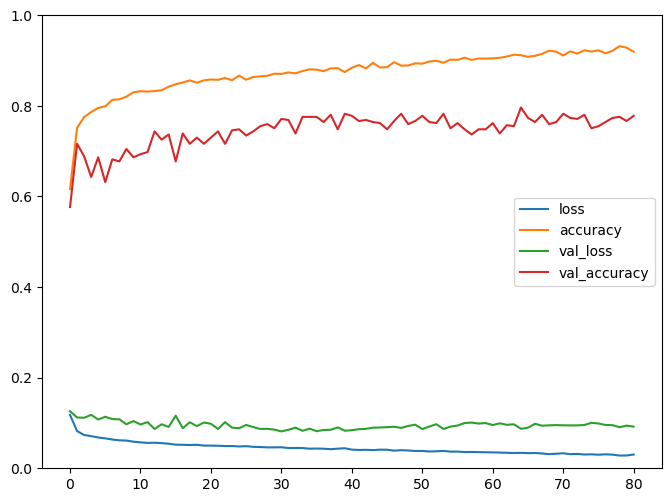

### Results auf test data ###
Accuracy for person  6 :  0.75
[[28  0  0  0]
 [ 0 28  0  0]
 [14 14  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1131 - accuracy: 0.6533 - val_loss: 0.1333 - val_accuracy: 0.5538
Epoch 2/500
197/197 - 0s - loss: 0.0797 - accuracy: 0.7530 - val_loss: 0.1279 - val_accuracy: 0.6407
Epoch 3/500
197/197 - 0s - loss: 0.0737 - accuracy: 0.7741 - val_loss: 0.1270 - val_accuracy: 0.6476
Epoch 4/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7889 - val_loss: 0.1176 - val_accuracy: 0.6796
Epoch 5/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.7988 - val_loss: 0.1135 - val_accuracy: 0.7025
Epoch 6/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8044 - val_loss: 0.1130 - val_accuracy: 0.6796
Epoch 7/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8021 - val_loss: 0.1122 - val_accuracy: 0.6659
Epoch 8/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.8171 - val_loss: 0.1127 - val_accuracy: 0.6773
Epoch 9/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8209 - val_loss:

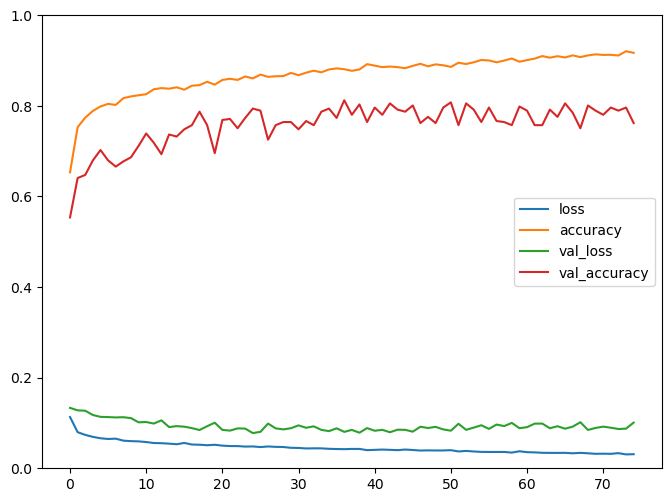

### Results auf test data ###
Accuracy for person  7 :  0.7232142857142857
[[23  0  5  0]
 [ 0 21  7  0]
 [ 7 12  9  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1142 - accuracy: 0.6446 - val_loss: 0.1176 - val_accuracy: 0.6568
Epoch 2/500
197/197 - 0s - loss: 0.0796 - accuracy: 0.7606 - val_loss: 0.1123 - val_accuracy: 0.7162
Epoch 3/500
197/197 - 0s - loss: 0.0722 - accuracy: 0.7894 - val_loss: 0.1112 - val_accuracy: 0.6957
Epoch 4/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7927 - val_loss: 0.1005 - val_accuracy: 0.7483
Epoch 5/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8023 - val_loss: 0.1018 - val_accuracy: 0.7162
Epoch 6/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.7957 - val_loss: 0.0902 - val_accuracy: 0.7666
Epoch 7/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8161 - val_loss: 0.0944 - val_accuracy: 0.7300
Epoch 8/500
197/197 - 0s - loss: 0.0598 - accuracy: 0.8240 - val_loss: 0.0841 - val_accuracy: 0.7872
Epoch 9/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.81

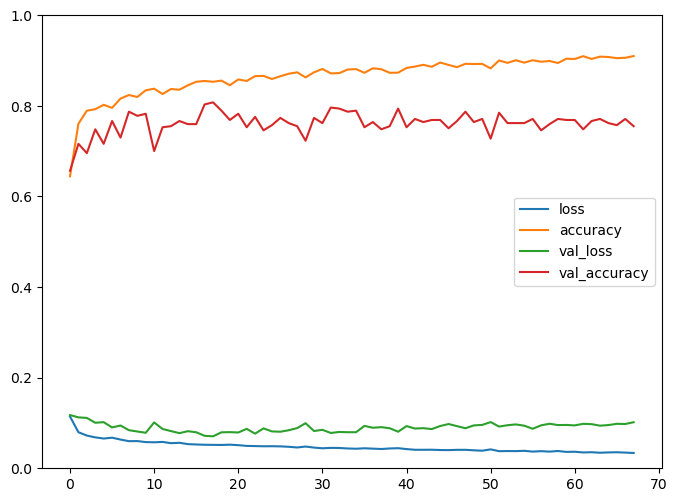

### Results auf test data ###
Accuracy for person  8 :  0.6964285714285714
[[22  6  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1151 - accuracy: 0.6365 - val_loss: 0.1364 - val_accuracy: 0.6728
Epoch 2/500
197/197 - 0s - loss: 0.0816 - accuracy: 0.7431 - val_loss: 0.1174 - val_accuracy: 0.7231
Epoch 3/500
197/197 - 0s - loss: 0.0743 - accuracy: 0.7726 - val_loss: 0.1084 - val_accuracy: 0.6957
Epoch 4/500
197/197 - 0s - loss: 0.0699 - accuracy: 0.7883 - val_loss: 0.1086 - val_accuracy: 0.7071
Epoch 5/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7985 - val_loss: 0.1015 - val_accuracy: 0.7117
Epoch 6/500
197/197 - 0s - loss: 0.0642 - accuracy: 0.8115 - val_loss: 0.1177 - val_accuracy: 0.6842
Epoch 7/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8051 - val_loss: 0.0978 - val_accuracy: 0.7368
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8130 - val_loss: 0.0964 - val_accuracy: 0.7254
Epoch 9/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.81

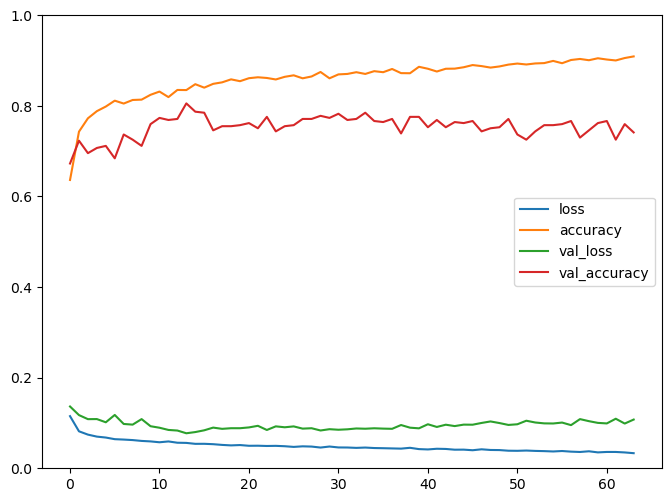

### Results auf test data ###
Accuracy for person  9 :  0.7946428571428571
[[23  0  5  0]
 [10 18  0  0]
 [ 0  7 20  1]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1101 - accuracy: 0.6622 - val_loss: 0.1354 - val_accuracy: 0.6156
Epoch 2/500
197/197 - 0s - loss: 0.0789 - accuracy: 0.7548 - val_loss: 0.1289 - val_accuracy: 0.6522
Epoch 3/500
197/197 - 0s - loss: 0.0715 - accuracy: 0.7820 - val_loss: 0.1228 - val_accuracy: 0.6705
Epoch 4/500
197/197 - 0s - loss: 0.0677 - accuracy: 0.7952 - val_loss: 0.1224 - val_accuracy: 0.6682
Epoch 5/500
197/197 - 0s - loss: 0.0665 - accuracy: 0.7960 - val_loss: 0.1193 - val_accuracy: 0.6751
Epoch 6/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8082 - val_loss: 0.1315 - val_accuracy: 0.6407
Epoch 7/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8135 - val_loss: 0.1184 - val_accuracy: 0.6751
Epoch 8/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8201 - val_loss: 0.1124 - val_accuracy: 0.7002
Epoch 9/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.82

197/197 - 0s - loss: 0.0283 - accuracy: 0.9234 - val_loss: 0.1112 - val_accuracy: 0.7208
Epoch 81/500
197/197 - 0s - loss: 0.0287 - accuracy: 0.9280 - val_loss: 0.1090 - val_accuracy: 0.7277
Model: "sequential_174"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                5550      
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 6,604
Trainable params: 6,604
Non-trainable params: 0
_________________________________________________________________


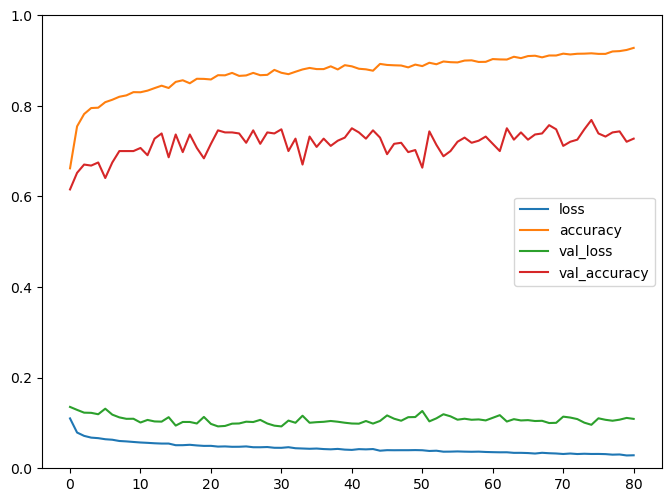

### Results auf test data ###
Accuracy for person  10 :  0.8035714285714286
[[20  2  6  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1165 - accuracy: 0.6352 - val_loss: 0.1274 - val_accuracy: 0.6613
Epoch 2/500
197/197 - 0s - loss: 0.0800 - accuracy: 0.7497 - val_loss: 0.1133 - val_accuracy: 0.6979
Epoch 3/500
197/197 - 0s - loss: 0.0733 - accuracy: 0.7700 - val_loss: 0.1154 - val_accuracy: 0.6957
Epoch 4/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7883 - val_loss: 0.1094 - val_accuracy: 0.7185
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.8044 - val_loss: 0.1150 - val_accuracy: 0.6819
Epoch 6/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.7998 - val_loss: 0.1026 - val_accuracy: 0.7208
Epoch 7/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8067 - val_loss: 0.1003 - val_accuracy: 0.7323
Epoch 8/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8123 - val_loss: 0.1097 - val_accuracy: 0.6590
Epoch 9/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8

197/197 - 0s - loss: 0.0330 - accuracy: 0.9125 - val_loss: 0.0996 - val_accuracy: 0.7391
Model: "sequential_175"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                5550      
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 6,604
Trainable params: 6,604
Non-trainable params: 0
_________________________________________________________________


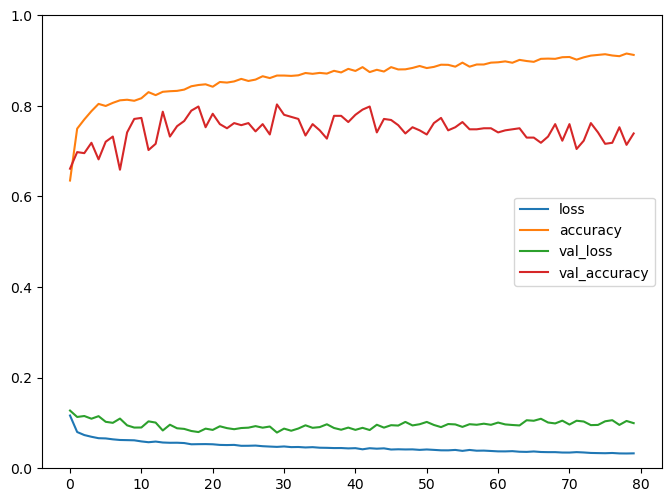

### Results auf test data ###
Accuracy for person  11 :  0.8392857142857143
[[19  6  3  0]
 [ 0 25  3  0]
 [ 0  6 22  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1135 - accuracy: 0.6451 - val_loss: 0.1317 - val_accuracy: 0.6110
Epoch 2/500
197/197 - 0s - loss: 0.0808 - accuracy: 0.7454 - val_loss: 0.1384 - val_accuracy: 0.5973
Epoch 3/500
197/197 - 0s - loss: 0.0748 - accuracy: 0.7708 - val_loss: 0.1169 - val_accuracy: 0.6957
Epoch 4/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7919 - val_loss: 0.1153 - val_accuracy: 0.6819
Epoch 5/500
197/197 - 0s - loss: 0.0669 - accuracy: 0.7985 - val_loss: 0.1151 - val_accuracy: 0.6728
Epoch 6/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8056 - val_loss: 0.1037 - val_accuracy: 0.7414
Epoch 7/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8016 - val_loss: 0.1031 - val_accuracy: 0.7231
Epoch 8/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8207 - val_loss: 0.0946 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8

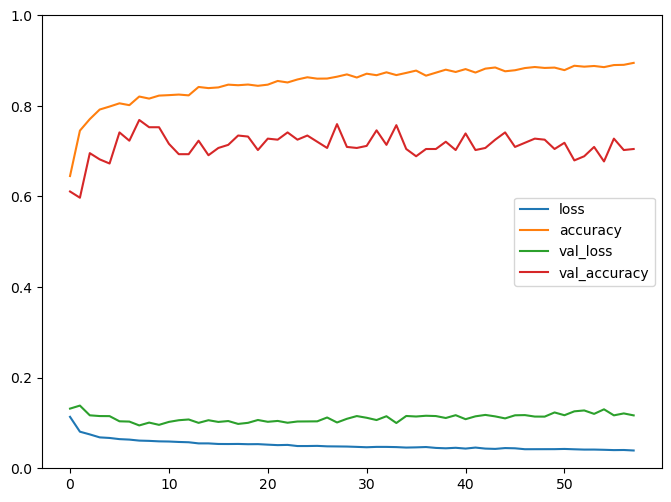

### Results auf test data ###
Accuracy for person  12 :  0.8928571428571429
[[18 10  0  0]
 [ 0 28  0  0]
 [ 0  2 26  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1121 - accuracy: 0.6581 - val_loss: 0.1249 - val_accuracy: 0.6247
Epoch 2/500
197/197 - 0s - loss: 0.0803 - accuracy: 0.7583 - val_loss: 0.1216 - val_accuracy: 0.6590
Epoch 3/500
197/197 - 0s - loss: 0.0717 - accuracy: 0.7830 - val_loss: 0.1199 - val_accuracy: 0.6705
Epoch 4/500
197/197 - 0s - loss: 0.0687 - accuracy: 0.7937 - val_loss: 0.1132 - val_accuracy: 0.7002
Epoch 5/500
197/197 - 0s - loss: 0.0652 - accuracy: 0.8062 - val_loss: 0.1139 - val_accuracy: 0.6979
Epoch 6/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8041 - val_loss: 0.1271 - val_accuracy: 0.6270
Epoch 7/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8059 - val_loss: 0.1242 - val_accuracy: 0.6224
Epoch 8/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8077 - val_loss: 0.1090 - val_accuracy: 0.6979
Epoch 9/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8

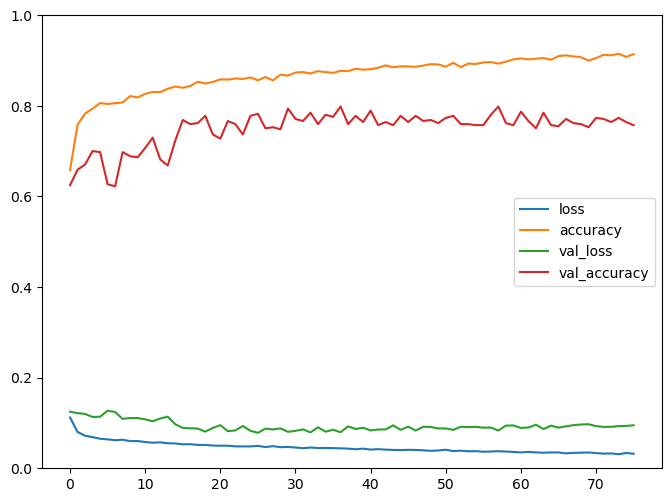

### Results auf test data ###
Accuracy for person  13 :  0.8660714285714286
[[28  0  0  0]
 [ 0 28  0  0]
 [ 1 14 13  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1116 - accuracy: 0.6629 - val_loss: 0.1328 - val_accuracy: 0.5789
Epoch 2/500
197/197 - 0s - loss: 0.0813 - accuracy: 0.7448 - val_loss: 0.1289 - val_accuracy: 0.6270
Epoch 3/500
197/197 - 0s - loss: 0.0735 - accuracy: 0.7726 - val_loss: 0.1269 - val_accuracy: 0.6407
Epoch 4/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7845 - val_loss: 0.1155 - val_accuracy: 0.6911
Epoch 5/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.7952 - val_loss: 0.1252 - val_accuracy: 0.6362
Epoch 6/500
197/197 - 0s - loss: 0.0660 - accuracy: 0.7998 - val_loss: 0.1165 - val_accuracy: 0.6728
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8184 - val_loss: 0.1118 - val_accuracy: 0.7185
Epoch 8/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8130 - val_loss: 0.1041 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8

197/197 - 0s - loss: 0.0325 - accuracy: 0.9127 - val_loss: 0.0994 - val_accuracy: 0.7529
Epoch 81/500
197/197 - 0s - loss: 0.0315 - accuracy: 0.9186 - val_loss: 0.0991 - val_accuracy: 0.7483
Epoch 82/500
197/197 - 0s - loss: 0.0312 - accuracy: 0.9173 - val_loss: 0.0939 - val_accuracy: 0.7712
Epoch 83/500
197/197 - 0s - loss: 0.0319 - accuracy: 0.9158 - val_loss: 0.0944 - val_accuracy: 0.7620
Epoch 84/500
197/197 - 0s - loss: 0.0327 - accuracy: 0.9125 - val_loss: 0.1018 - val_accuracy: 0.7483
Epoch 85/500
197/197 - 0s - loss: 0.0319 - accuracy: 0.9143 - val_loss: 0.1127 - val_accuracy: 0.7185
Epoch 86/500
197/197 - 0s - loss: 0.0330 - accuracy: 0.9084 - val_loss: 0.0958 - val_accuracy: 0.7666
Epoch 87/500
197/197 - 0s - loss: 0.0309 - accuracy: 0.9163 - val_loss: 0.0943 - val_accuracy: 0.7574
Epoch 88/500
197/197 - 0s - loss: 0.0297 - accuracy: 0.9206 - val_loss: 0.0995 - val_accuracy: 0.7597
Epoch 89/500
197/197 - 0s - loss: 0.0311 - accuracy: 0.9176 - val_loss: 0.0978 - val_accuracy: 

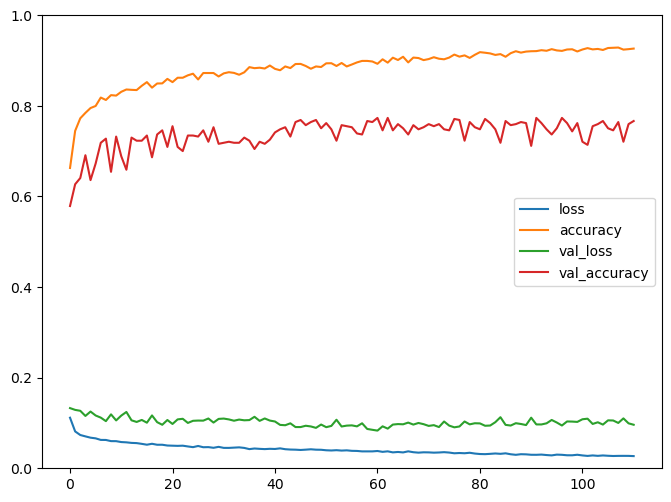

### Results auf test data ###
Accuracy for person  14 :  0.9017857142857143
[[28  0  0  0]
 [ 0 20  8  0]
 [ 0  3 25  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1107 - accuracy: 0.6685 - val_loss: 0.1218 - val_accuracy: 0.5973
Epoch 2/500
197/197 - 0s - loss: 0.0790 - accuracy: 0.7606 - val_loss: 0.1121 - val_accuracy: 0.7231
Epoch 3/500
197/197 - 0s - loss: 0.0720 - accuracy: 0.7800 - val_loss: 0.1147 - val_accuracy: 0.7048
Epoch 4/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7896 - val_loss: 0.1233 - val_accuracy: 0.6522
Epoch 5/500
197/197 - 0s - loss: 0.0663 - accuracy: 0.7980 - val_loss: 0.1009 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0628 - accuracy: 0.8138 - val_loss: 0.1258 - val_accuracy: 0.6407
Epoch 7/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8092 - val_loss: 0.1024 - val_accuracy: 0.6705
Epoch 8/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8100 - val_loss: 0.0951 - val_accuracy: 0.7231
Epoch 9/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.8

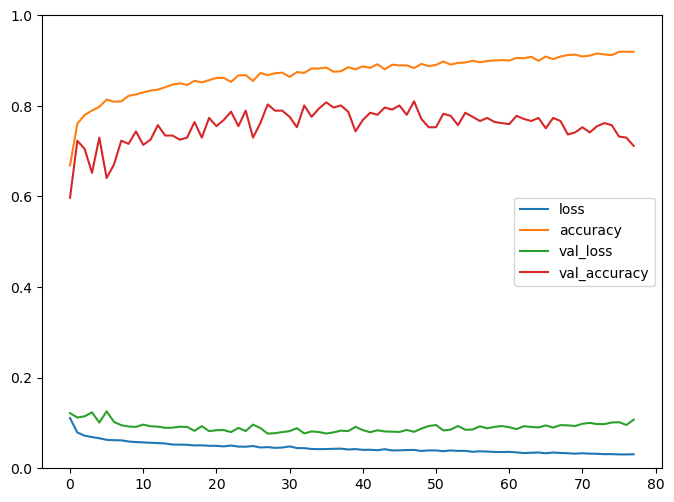

### Results auf test data ###
Accuracy for person  15 :  0.75
[[11  9  8  0]
 [ 0 26  2  0]
 [ 0  9 19  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1083 - accuracy: 0.6688 - val_loss: 0.1255 - val_accuracy: 0.5904
Epoch 2/500
197/197 - 0s - loss: 0.0797 - accuracy: 0.7512 - val_loss: 0.1192 - val_accuracy: 0.6613
Epoch 3/500
197/197 - 0s - loss: 0.0713 - accuracy: 0.7861 - val_loss: 0.1197 - val_accuracy: 0.6865
Epoch 4/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7894 - val_loss: 0.1216 - val_accuracy: 0.6568
Epoch 5/500
197/197 - 0s - loss: 0.0673 - accuracy: 0.7934 - val_loss: 0.1106 - val_accuracy: 0.6819
Epoch 6/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.8034 - val_loss: 0.1079 - val_accuracy: 0.6957
Epoch 7/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8074 - val_loss: 0.1067 - val_accuracy: 0.6865
Epoch 8/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8168 - val_loss: 0.1038 - val_accuracy: 0.6934
Epoch 9/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.8199 - val_loss

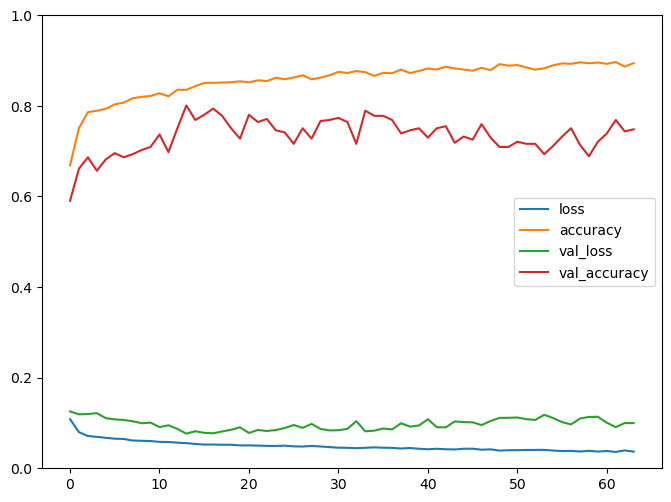

### Results auf test data ###
Accuracy for person  16 :  0.875
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1133 - accuracy: 0.6428 - val_loss: 0.1309 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0803 - accuracy: 0.7560 - val_loss: 0.1303 - val_accuracy: 0.6339
Epoch 3/500
197/197 - 0s - loss: 0.0727 - accuracy: 0.7766 - val_loss: 0.1179 - val_accuracy: 0.6682
Epoch 4/500
197/197 - 0s - loss: 0.0673 - accuracy: 0.7998 - val_loss: 0.1234 - val_accuracy: 0.6453
Epoch 5/500
197/197 - 0s - loss: 0.0636 - accuracy: 0.8125 - val_loss: 0.1117 - val_accuracy: 0.7002
Epoch 6/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8054 - val_loss: 0.1073 - val_accuracy: 0.7071
Epoch 7/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.8125 - val_loss: 0.1118 - val_accuracy: 0.6842
Epoch 8/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8168 - val_loss: 0.0962 - val_accuracy: 0.7460
Epoch 9/500
197/197 - 0s - loss: 0.0589 - accuracy: 0.8298 - val_los

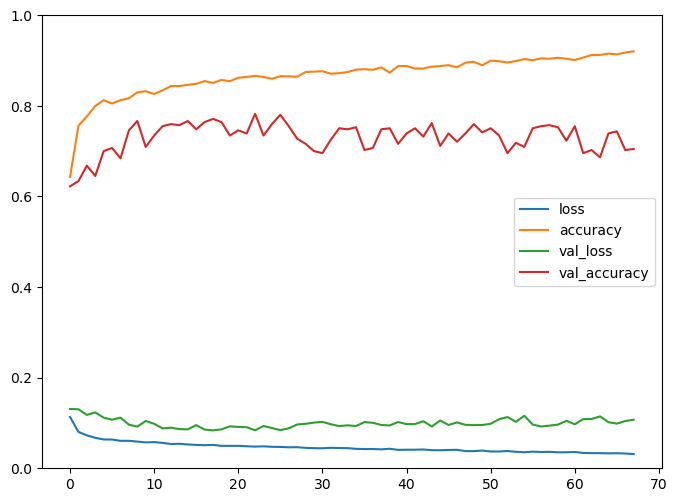

### Results auf test data ###
Accuracy for person  17 :  0.5714285714285714
[[ 7 21  0  0]
 [ 0 28  0  0]
 [ 0 27  1  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1127 - accuracy: 0.6484 - val_loss: 0.1143 - val_accuracy: 0.6865
Epoch 2/500
197/197 - 0s - loss: 0.0811 - accuracy: 0.7418 - val_loss: 0.1182 - val_accuracy: 0.6430
Epoch 3/500
197/197 - 0s - loss: 0.0739 - accuracy: 0.7731 - val_loss: 0.1050 - val_accuracy: 0.6705
Epoch 4/500
197/197 - 0s - loss: 0.0687 - accuracy: 0.7889 - val_loss: 0.1007 - val_accuracy: 0.7094
Epoch 5/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.7894 - val_loss: 0.0981 - val_accuracy: 0.7048
Epoch 6/500
197/197 - 0s - loss: 0.0652 - accuracy: 0.7985 - val_loss: 0.0912 - val_accuracy: 0.7277
Epoch 7/500
197/197 - 0s - loss: 0.0629 - accuracy: 0.8097 - val_loss: 0.0849 - val_accuracy: 0.7689
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8214 - val_loss: 0.0876 - val_accuracy: 0.7208
Epoch 9/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8

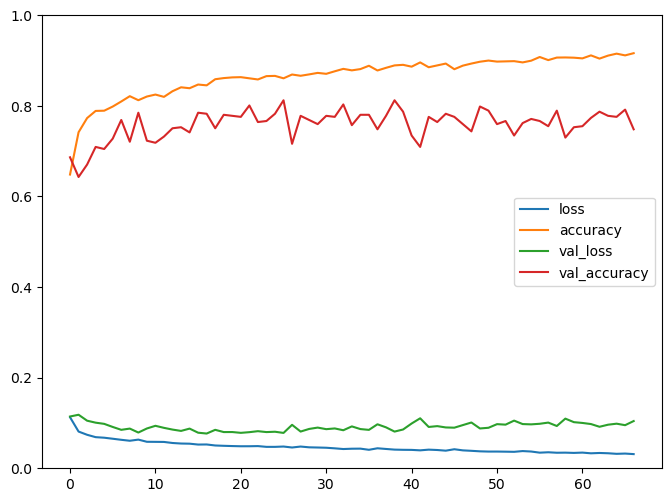

### Results auf test data ###
Accuracy for person  18 :  0.6517857142857143
[[28  0  0  0]
 [12 16  0  0]
 [13 14  1  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1126 - accuracy: 0.6622 - val_loss: 0.1225 - val_accuracy: 0.6476
Epoch 2/500
197/197 - 0s - loss: 0.0799 - accuracy: 0.7604 - val_loss: 0.1116 - val_accuracy: 0.7071
Epoch 3/500
197/197 - 0s - loss: 0.0719 - accuracy: 0.7889 - val_loss: 0.1030 - val_accuracy: 0.7483
Epoch 4/500
197/197 - 0s - loss: 0.0687 - accuracy: 0.7947 - val_loss: 0.1093 - val_accuracy: 0.7025
Epoch 5/500
197/197 - 0s - loss: 0.0663 - accuracy: 0.8051 - val_loss: 0.1020 - val_accuracy: 0.7140
Epoch 6/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8110 - val_loss: 0.1019 - val_accuracy: 0.6842
Epoch 7/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8184 - val_loss: 0.1031 - val_accuracy: 0.6682
Epoch 8/500
197/197 - 0s - loss: 0.0623 - accuracy: 0.8151 - val_loss: 0.0885 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8

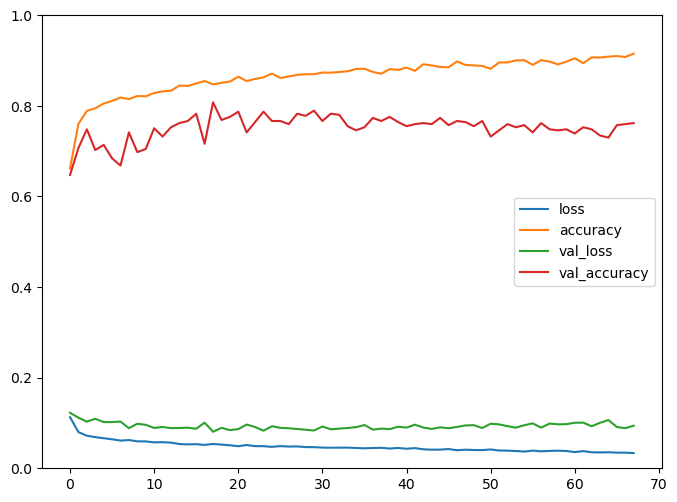

### Results auf test data ###
Accuracy for person  19 :  0.7142857142857143
[[21  7  0  0]
 [ 0 26  2  0]
 [ 0 23  5  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1165 - accuracy: 0.6383 - val_loss: 0.1346 - val_accuracy: 0.6178
Epoch 2/500
197/197 - 0s - loss: 0.0806 - accuracy: 0.7507 - val_loss: 0.1264 - val_accuracy: 0.6522
Epoch 3/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7784 - val_loss: 0.1154 - val_accuracy: 0.7002
Epoch 4/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7906 - val_loss: 0.1179 - val_accuracy: 0.6728
Epoch 5/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.7988 - val_loss: 0.1127 - val_accuracy: 0.7140
Epoch 6/500
197/197 - 0s - loss: 0.0645 - accuracy: 0.8079 - val_loss: 0.1227 - val_accuracy: 0.6499
Epoch 7/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8072 - val_loss: 0.1141 - val_accuracy: 0.6911
Epoch 8/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8219 - val_loss: 0.1049 - val_accuracy: 0.7346
Epoch 9/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8

197/197 - 0s - loss: 0.0302 - accuracy: 0.9229 - val_loss: 0.1042 - val_accuracy: 0.7231
Epoch 81/500
197/197 - 0s - loss: 0.0290 - accuracy: 0.9260 - val_loss: 0.1035 - val_accuracy: 0.7368
Epoch 82/500
197/197 - 0s - loss: 0.0288 - accuracy: 0.9247 - val_loss: 0.1039 - val_accuracy: 0.7231
Epoch 83/500
197/197 - 0s - loss: 0.0294 - accuracy: 0.9244 - val_loss: 0.1020 - val_accuracy: 0.7391
Epoch 84/500
197/197 - 0s - loss: 0.0304 - accuracy: 0.9211 - val_loss: 0.0981 - val_accuracy: 0.7368
Epoch 85/500
197/197 - 0s - loss: 0.0302 - accuracy: 0.9194 - val_loss: 0.1044 - val_accuracy: 0.7231
Epoch 86/500
197/197 - 0s - loss: 0.0285 - accuracy: 0.9267 - val_loss: 0.1050 - val_accuracy: 0.7391
Epoch 87/500
197/197 - 0s - loss: 0.0280 - accuracy: 0.9278 - val_loss: 0.1057 - val_accuracy: 0.7414
Epoch 88/500
197/197 - 0s - loss: 0.0279 - accuracy: 0.9308 - val_loss: 0.1085 - val_accuracy: 0.7346
Model: "sequential_184"
_________________________________________________________________
Layer

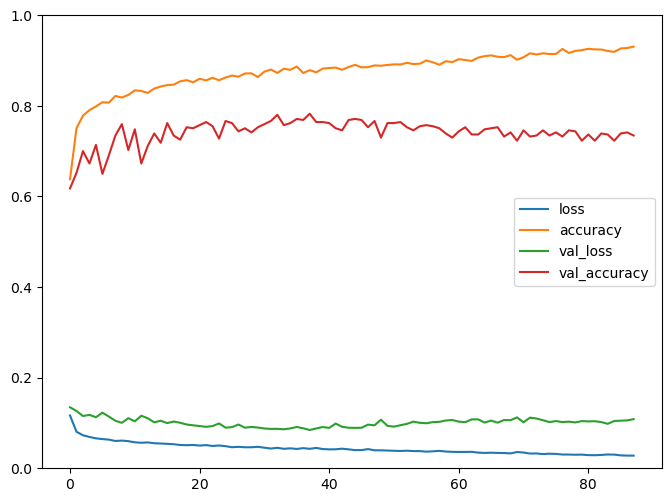

### Results auf test data ###
Accuracy for person  20 :  0.9285714285714286
[[28  0  0  0]
 [ 0 28  0  0]
 [ 2  6 20  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1130 - accuracy: 0.6632 - val_loss: 0.1419 - val_accuracy: 0.6156
Epoch 2/500
197/197 - 0s - loss: 0.0806 - accuracy: 0.7484 - val_loss: 0.1221 - val_accuracy: 0.6499
Epoch 3/500
197/197 - 0s - loss: 0.0723 - accuracy: 0.7838 - val_loss: 0.1270 - val_accuracy: 0.6270
Epoch 4/500
197/197 - 0s - loss: 0.0674 - accuracy: 0.7985 - val_loss: 0.1148 - val_accuracy: 0.7185
Epoch 5/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8049 - val_loss: 0.1079 - val_accuracy: 0.7094
Epoch 6/500
197/197 - 0s - loss: 0.0628 - accuracy: 0.8123 - val_loss: 0.1162 - val_accuracy: 0.6590
Epoch 7/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8173 - val_loss: 0.1060 - val_accuracy: 0.7323
Epoch 8/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8204 - val_loss: 0.1005 - val_accuracy: 0.7048
Epoch 9/500
197/197 - 0s - loss: 0.0573 - accuracy: 0.8

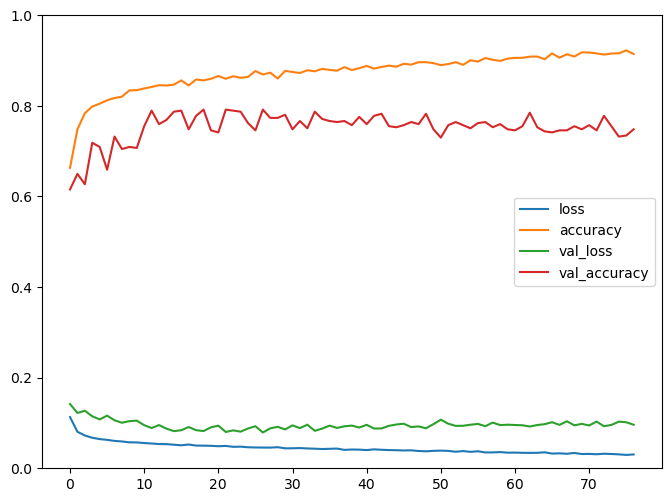

### Results auf test data ###
Accuracy for person  21 :  0.5178571428571429
[[12 16  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0 10  0 18]]
Epoch 1/500
197/197 - 0s - loss: 0.1144 - accuracy: 0.6558 - val_loss: 0.1320 - val_accuracy: 0.6339
Epoch 2/500
197/197 - 0s - loss: 0.0805 - accuracy: 0.7492 - val_loss: 0.1293 - val_accuracy: 0.6224
Epoch 3/500
197/197 - 0s - loss: 0.0705 - accuracy: 0.7886 - val_loss: 0.1234 - val_accuracy: 0.6728
Epoch 4/500
197/197 - 0s - loss: 0.0703 - accuracy: 0.7871 - val_loss: 0.1191 - val_accuracy: 0.6819
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.7975 - val_loss: 0.1198 - val_accuracy: 0.6911
Epoch 6/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8123 - val_loss: 0.1148 - val_accuracy: 0.6888
Epoch 7/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.8201 - val_loss: 0.1252 - val_accuracy: 0.6751
Epoch 8/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8247 - val_loss: 0.1242 - val_accuracy: 0.6773
Epoch 9/500
197/197 - 0s - loss: 0.0598 - accuracy: 0.8

197/197 - 0s - loss: 0.0296 - accuracy: 0.9222 - val_loss: 0.1194 - val_accuracy: 0.7140
Epoch 81/500
197/197 - 0s - loss: 0.0298 - accuracy: 0.9224 - val_loss: 0.1130 - val_accuracy: 0.7323
Model: "sequential_186"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                5550      
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 6,604
Trainable params: 6,604
Non-trainable params: 0
_________________________________________________________________


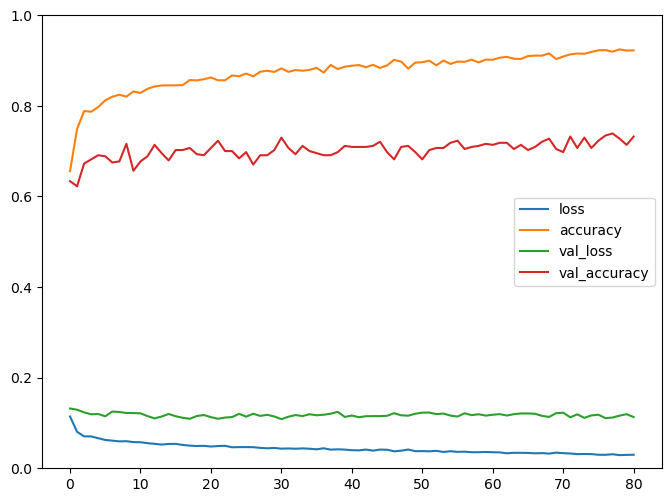

### Results auf test data ###
Accuracy for person  22 :  0.6517857142857143
[[27  0  1  0]
 [ 4  4 11  9]
 [14  0 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1125 - accuracy: 0.6461 - val_loss: 0.1279 - val_accuracy: 0.6545
Epoch 2/500
197/197 - 0s - loss: 0.0817 - accuracy: 0.7487 - val_loss: 0.1182 - val_accuracy: 0.6636
Epoch 3/500
197/197 - 0s - loss: 0.0733 - accuracy: 0.7820 - val_loss: 0.1183 - val_accuracy: 0.6476
Epoch 4/500
197/197 - 0s - loss: 0.0690 - accuracy: 0.7835 - val_loss: 0.1082 - val_accuracy: 0.6773
Epoch 5/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8056 - val_loss: 0.1014 - val_accuracy: 0.7185
Epoch 6/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8176 - val_loss: 0.1149 - val_accuracy: 0.6407
Epoch 7/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8118 - val_loss: 0.1052 - val_accuracy: 0.7117
Epoch 8/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8263 - val_loss: 0.1011 - val_accuracy: 0.6911
Epoch 9/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8

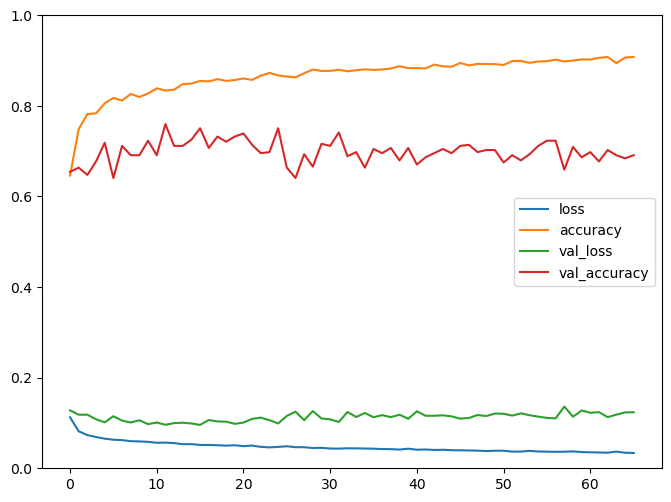

### Results auf test data ###
Accuracy for person  23 :  0.6517857142857143
[[28  0  0  0]
 [ 1 12  5 10]
 [13  7  5  3]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1134 - accuracy: 0.6505 - val_loss: 0.1344 - val_accuracy: 0.6201
Epoch 2/500
197/197 - 0s - loss: 0.0807 - accuracy: 0.7522 - val_loss: 0.1181 - val_accuracy: 0.6682
Epoch 3/500
197/197 - 0s - loss: 0.0730 - accuracy: 0.7772 - val_loss: 0.1137 - val_accuracy: 0.7002
Epoch 4/500
197/197 - 0s - loss: 0.0692 - accuracy: 0.7843 - val_loss: 0.1165 - val_accuracy: 0.6842
Epoch 5/500
197/197 - 0s - loss: 0.0675 - accuracy: 0.8011 - val_loss: 0.1039 - val_accuracy: 0.7048
Epoch 6/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8023 - val_loss: 0.1080 - val_accuracy: 0.7048
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8112 - val_loss: 0.1023 - val_accuracy: 0.7002
Epoch 8/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8153 - val_loss: 0.0998 - val_accuracy: 0.6979
Epoch 9/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8

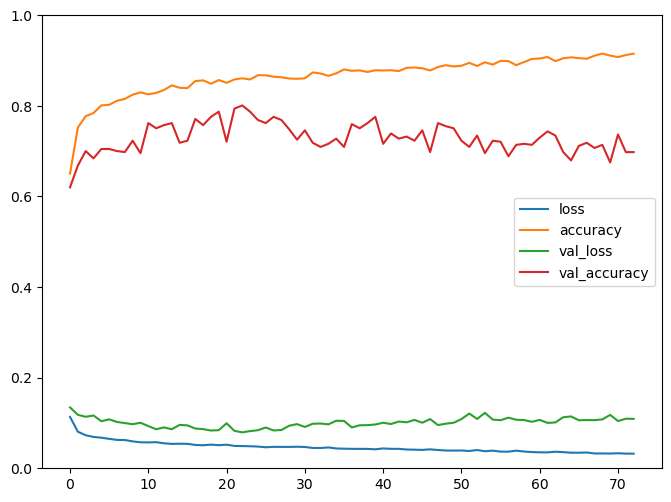

### Results auf test data ###
Accuracy for person  24 :  0.6964285714285714
[[28  0  0  0]
 [ 7 21  0  0]
 [14 13  1  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1104 - accuracy: 0.6594 - val_loss: 0.1099 - val_accuracy: 0.6613
Epoch 2/500
197/197 - 0s - loss: 0.0796 - accuracy: 0.7482 - val_loss: 0.1040 - val_accuracy: 0.7094
Epoch 3/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7805 - val_loss: 0.1079 - val_accuracy: 0.6682
Epoch 4/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7891 - val_loss: 0.1046 - val_accuracy: 0.6545
Epoch 5/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8074 - val_loss: 0.0964 - val_accuracy: 0.7025
Epoch 6/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8090 - val_loss: 0.0917 - val_accuracy: 0.7414
Epoch 7/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8087 - val_loss: 0.0890 - val_accuracy: 0.7277
Epoch 8/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8209 - val_loss: 0.0849 - val_accuracy: 0.7483
Epoch 9/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8

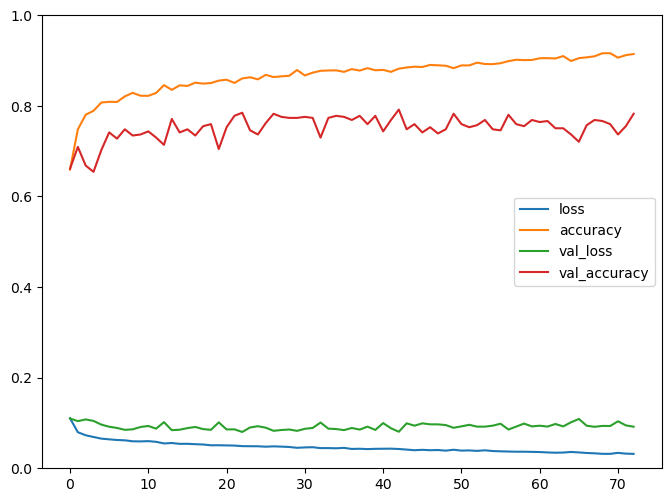

### Results auf test data ###
Accuracy for person  25 :  0.8214285714285714
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  6 22]]
Epoch 1/500
197/197 - 0s - loss: 0.1150 - accuracy: 0.6528 - val_loss: 0.1225 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0827 - accuracy: 0.7393 - val_loss: 0.1339 - val_accuracy: 0.5904
Epoch 3/500
197/197 - 0s - loss: 0.0736 - accuracy: 0.7779 - val_loss: 0.1328 - val_accuracy: 0.6224
Epoch 4/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7843 - val_loss: 0.1208 - val_accuracy: 0.6407
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8046 - val_loss: 0.1140 - val_accuracy: 0.6957
Epoch 6/500
197/197 - 0s - loss: 0.0646 - accuracy: 0.8056 - val_loss: 0.1101 - val_accuracy: 0.6773
Epoch 7/500
197/197 - 0s - loss: 0.0618 - accuracy: 0.8217 - val_loss: 0.1017 - val_accuracy: 0.7323
Epoch 8/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8196 - val_loss: 0.1105 - val_accuracy: 0.6842
Epoch 9/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8

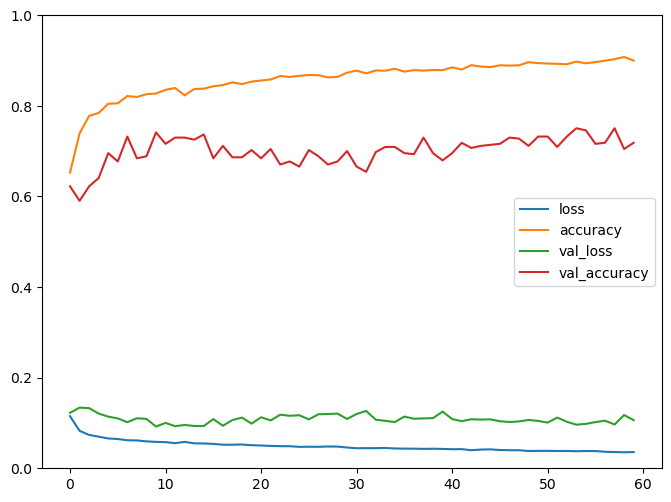

### Results auf test data ###
Accuracy for person  26 :  0.7678571428571429
[[28  0  0  0]
 [ 3 19  6  0]
 [10  7 11  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1093 - accuracy: 0.6604 - val_loss: 0.1217 - val_accuracy: 0.7025
Epoch 2/500
197/197 - 0s - loss: 0.0807 - accuracy: 0.7548 - val_loss: 0.1112 - val_accuracy: 0.7025
Epoch 3/500
197/197 - 0s - loss: 0.0732 - accuracy: 0.7746 - val_loss: 0.1073 - val_accuracy: 0.7506
Epoch 4/500
197/197 - 0s - loss: 0.0701 - accuracy: 0.7817 - val_loss: 0.1020 - val_accuracy: 0.7551
Epoch 5/500
197/197 - 0s - loss: 0.0665 - accuracy: 0.8006 - val_loss: 0.1029 - val_accuracy: 0.7071
Epoch 6/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8013 - val_loss: 0.0979 - val_accuracy: 0.7346
Epoch 7/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8013 - val_loss: 0.0932 - val_accuracy: 0.7391
Epoch 8/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8156 - val_loss: 0.0869 - val_accuracy: 0.7529
Epoch 9/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.8

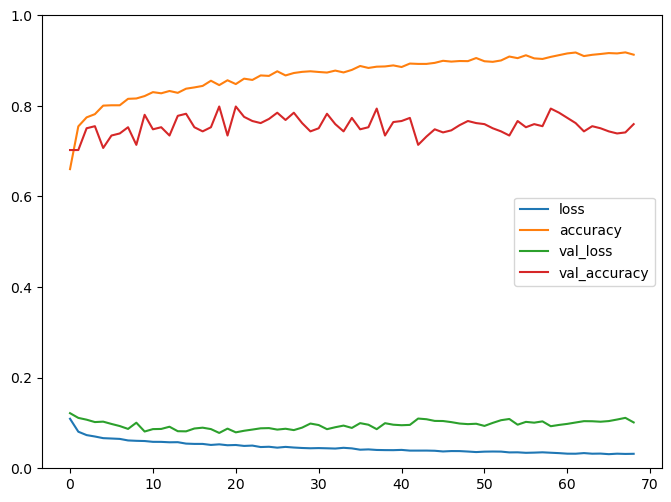

### Results auf test data ###
Accuracy for person  27 :  0.8303571428571429
[[23  0  5  0]
 [ 0 14 14  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1124 - accuracy: 0.6523 - val_loss: 0.1271 - val_accuracy: 0.6110
Epoch 2/500
197/197 - 0s - loss: 0.0795 - accuracy: 0.7512 - val_loss: 0.1265 - val_accuracy: 0.6407
Epoch 3/500
197/197 - 0s - loss: 0.0732 - accuracy: 0.7772 - val_loss: 0.1242 - val_accuracy: 0.6522
Epoch 4/500
197/197 - 0s - loss: 0.0695 - accuracy: 0.7896 - val_loss: 0.1305 - val_accuracy: 0.6339
Epoch 5/500
197/197 - 0s - loss: 0.0642 - accuracy: 0.8120 - val_loss: 0.1183 - val_accuracy: 0.6888
Epoch 6/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8064 - val_loss: 0.1287 - val_accuracy: 0.6339
Epoch 7/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8173 - val_loss: 0.1157 - val_accuracy: 0.6636
Epoch 8/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8306 - val_loss: 0.1094 - val_accuracy: 0.6911
Epoch 9/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.8

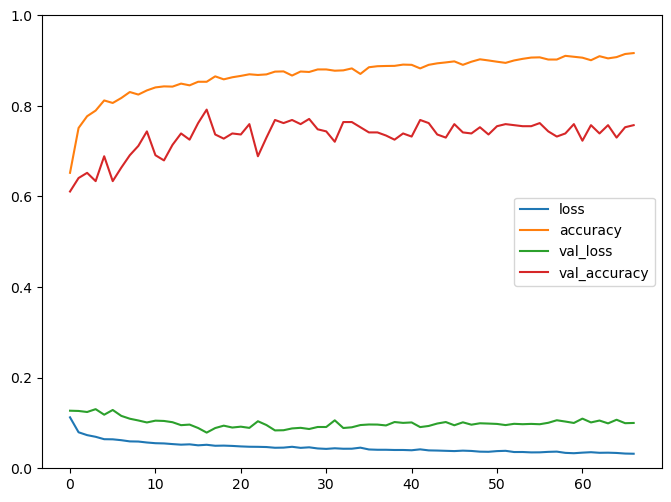

### Results auf test data ###
Accuracy for person  28 :  0.5267857142857143
[[28  0  0  0]
 [15  0 13  0]
 [16  9  3  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1166 - accuracy: 0.6474 - val_loss: 0.1220 - val_accuracy: 0.6522
Epoch 2/500
197/197 - 0s - loss: 0.0814 - accuracy: 0.7527 - val_loss: 0.1099 - val_accuracy: 0.6590
Epoch 3/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7779 - val_loss: 0.1099 - val_accuracy: 0.6499
Epoch 4/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7909 - val_loss: 0.1078 - val_accuracy: 0.6842
Epoch 5/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7975 - val_loss: 0.1020 - val_accuracy: 0.6911
Epoch 6/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8146 - val_loss: 0.1021 - val_accuracy: 0.6934
Epoch 7/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8125 - val_loss: 0.0907 - val_accuracy: 0.7254
Epoch 8/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8163 - val_loss: 0.0834 - val_accuracy: 0.7551
Epoch 9/500
197/197 - 0s - loss: 0.0584 - accuracy: 0.8

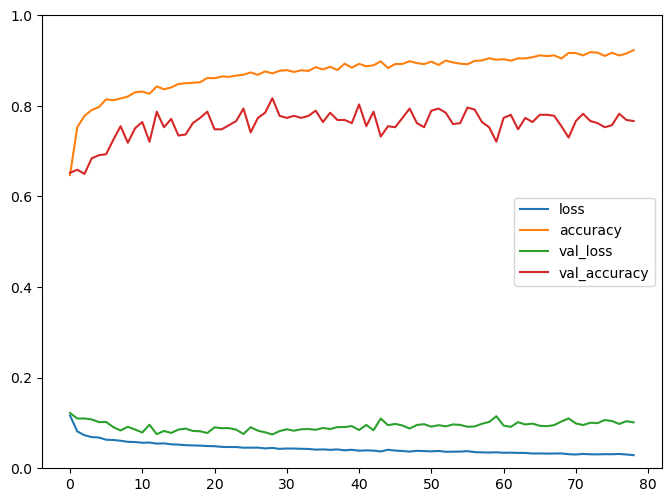

### Results auf test data ###
Accuracy for person  29 :  0.6607142857142857
[[12 15  1  0]
 [ 0 22  6  0]
 [ 0 16 12  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1126 - accuracy: 0.6566 - val_loss: 0.1233 - val_accuracy: 0.6453
Epoch 2/500
197/197 - 0s - loss: 0.0800 - accuracy: 0.7543 - val_loss: 0.1150 - val_accuracy: 0.6728
Epoch 3/500
197/197 - 0s - loss: 0.0713 - accuracy: 0.7871 - val_loss: 0.1139 - val_accuracy: 0.6796
Epoch 4/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7960 - val_loss: 0.1066 - val_accuracy: 0.7208
Epoch 5/500
197/197 - 0s - loss: 0.0676 - accuracy: 0.7952 - val_loss: 0.1006 - val_accuracy: 0.7368
Epoch 6/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8016 - val_loss: 0.1026 - val_accuracy: 0.6979
Epoch 7/500
197/197 - 0s - loss: 0.0651 - accuracy: 0.8074 - val_loss: 0.1150 - val_accuracy: 0.6590
Epoch 8/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8146 - val_loss: 0.0993 - val_accuracy: 0.6911
Epoch 9/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8

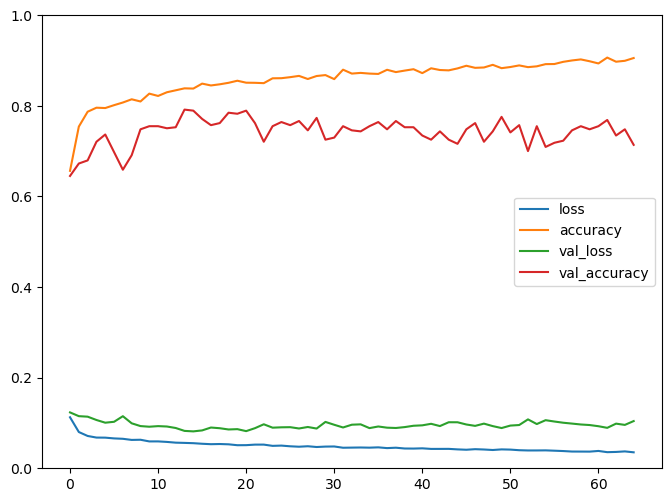

### Results auf test data ###
Accuracy for person  30 :  0.9642857142857143
[[28  0  0  0]
 [ 0 25  3  0]
 [ 0  1 27  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1165 - accuracy: 0.6327 - val_loss: 0.1183 - val_accuracy: 0.6339
Epoch 2/500
197/197 - 0s - loss: 0.0813 - accuracy: 0.7515 - val_loss: 0.1201 - val_accuracy: 0.6293
Epoch 3/500
197/197 - 0s - loss: 0.0728 - accuracy: 0.7812 - val_loss: 0.1246 - val_accuracy: 0.6110
Epoch 4/500
197/197 - 0s - loss: 0.0692 - accuracy: 0.7883 - val_loss: 0.1124 - val_accuracy: 0.6751
Epoch 5/500
197/197 - 0s - loss: 0.0669 - accuracy: 0.7932 - val_loss: 0.1087 - val_accuracy: 0.6934
Epoch 6/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8107 - val_loss: 0.1083 - val_accuracy: 0.6728
Epoch 7/500
197/197 - 0s - loss: 0.0627 - accuracy: 0.8128 - val_loss: 0.0955 - val_accuracy: 0.7277
Epoch 8/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8173 - val_loss: 0.1080 - val_accuracy: 0.6842
Epoch 9/500
197/197 - 0s - loss: 0.0602 - accuracy: 0.8

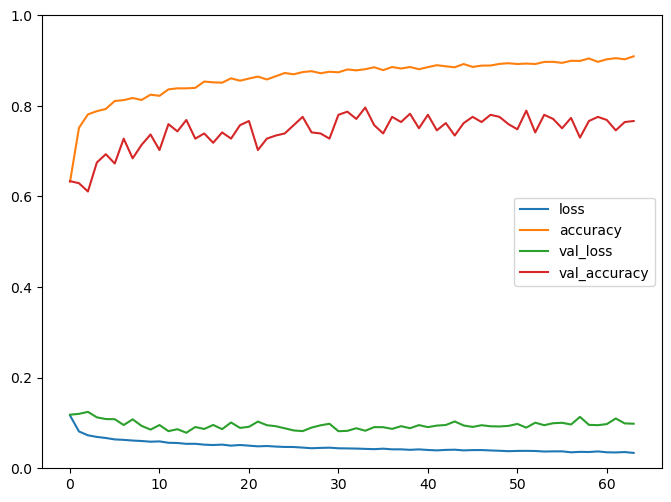

### Results auf test data ###
Accuracy for person  31 :  0.75
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1137 - accuracy: 0.6484 - val_loss: 0.1071 - val_accuracy: 0.6728
Epoch 2/500
197/197 - 0s - loss: 0.0796 - accuracy: 0.7545 - val_loss: 0.1041 - val_accuracy: 0.6842
Epoch 3/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7759 - val_loss: 0.0980 - val_accuracy: 0.6888
Epoch 4/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7978 - val_loss: 0.0926 - val_accuracy: 0.7254
Epoch 5/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8056 - val_loss: 0.0885 - val_accuracy: 0.7460
Epoch 6/500
197/197 - 0s - loss: 0.0638 - accuracy: 0.8110 - val_loss: 0.0898 - val_accuracy: 0.7506
Epoch 7/500
197/197 - 0s - loss: 0.0623 - accuracy: 0.8166 - val_loss: 0.0906 - val_accuracy: 0.7300
Epoch 8/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8186 - val_loss: 0.0785 - val_accuracy: 0.7757
Epoch 9/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8184 - val_loss

Epoch 81/500
197/197 - 0s - loss: 0.0318 - accuracy: 0.9173 - val_loss: 0.0763 - val_accuracy: 0.7918
Epoch 82/500
197/197 - 0s - loss: 0.0302 - accuracy: 0.9242 - val_loss: 0.0764 - val_accuracy: 0.8009
Epoch 83/500
197/197 - 0s - loss: 0.0298 - accuracy: 0.9237 - val_loss: 0.0852 - val_accuracy: 0.7803
Epoch 84/500
197/197 - 0s - loss: 0.0297 - accuracy: 0.9229 - val_loss: 0.0790 - val_accuracy: 0.7986
Epoch 85/500
197/197 - 0s - loss: 0.0299 - accuracy: 0.9211 - val_loss: 0.0815 - val_accuracy: 0.7872
Epoch 86/500
197/197 - 0s - loss: 0.0296 - accuracy: 0.9206 - val_loss: 0.0822 - val_accuracy: 0.7780
Epoch 87/500
197/197 - 0s - loss: 0.0289 - accuracy: 0.9252 - val_loss: 0.0846 - val_accuracy: 0.7849
Epoch 88/500
197/197 - 0s - loss: 0.0284 - accuracy: 0.9293 - val_loss: 0.0897 - val_accuracy: 0.7597
Epoch 89/500
197/197 - 0s - loss: 0.0294 - accuracy: 0.9229 - val_loss: 0.0830 - val_accuracy: 0.7963
Epoch 90/500
197/197 - 0s - loss: 0.0287 - accuracy: 0.9219 - val_loss: 0.0832 - v

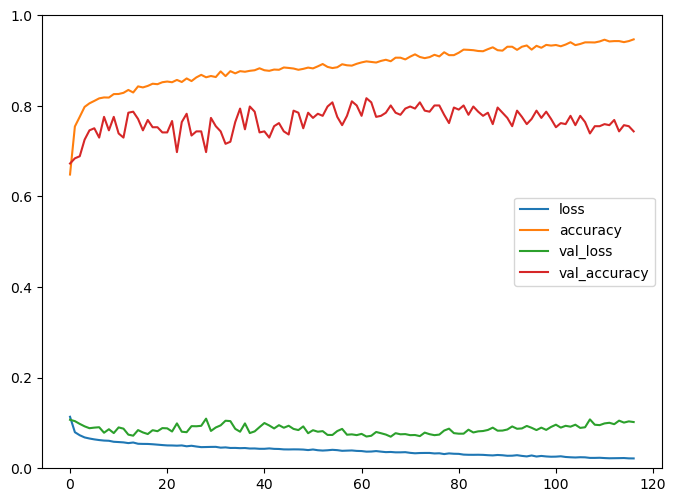

### Results auf test data ###
Accuracy for person  32 :  0.7589285714285714
[[16 12  0  0]
 [ 0 28  0  0]
 [ 0 15 13  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1086 - accuracy: 0.6690 - val_loss: 0.1227 - val_accuracy: 0.6568
Epoch 2/500
197/197 - 0s - loss: 0.0773 - accuracy: 0.7695 - val_loss: 0.1218 - val_accuracy: 0.6407
Epoch 3/500
197/197 - 0s - loss: 0.0724 - accuracy: 0.7761 - val_loss: 0.1205 - val_accuracy: 0.6865
Epoch 4/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7942 - val_loss: 0.1288 - val_accuracy: 0.6201
Epoch 5/500
197/197 - 0s - loss: 0.0672 - accuracy: 0.7967 - val_loss: 0.1201 - val_accuracy: 0.6568
Epoch 6/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8118 - val_loss: 0.1171 - val_accuracy: 0.6819
Epoch 7/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8148 - val_loss: 0.1109 - val_accuracy: 0.6796
Epoch 8/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8270 - val_loss: 0.1059 - val_accuracy: 0.6911
Epoch 9/500
197/197 - 0s - loss: 0.0597 - accuracy: 0.8

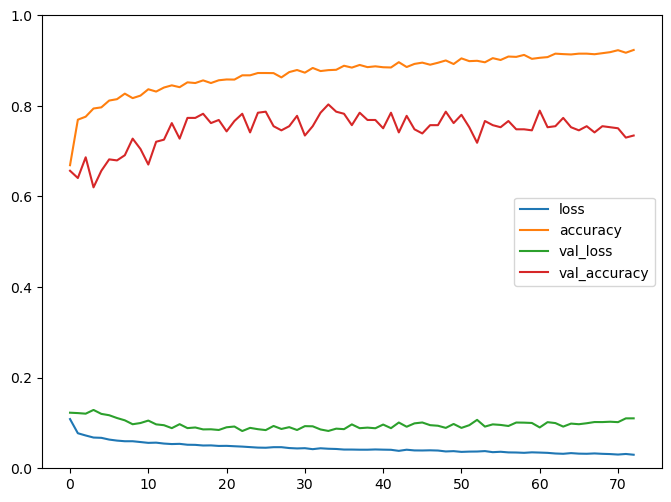

### Results auf test data ###
Accuracy for person  33 :  0.6875
[[28  0  0  0]
 [ 7 21  0  0]
 [14 14  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1149 - accuracy: 0.6502 - val_loss: 0.1164 - val_accuracy: 0.6865
Epoch 2/500
197/197 - 0s - loss: 0.0792 - accuracy: 0.7578 - val_loss: 0.1115 - val_accuracy: 0.6751
Epoch 3/500
197/197 - 0s - loss: 0.0731 - accuracy: 0.7787 - val_loss: 0.1083 - val_accuracy: 0.6773
Epoch 4/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.8041 - val_loss: 0.0904 - val_accuracy: 0.7529
Epoch 5/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.8003 - val_loss: 0.0877 - val_accuracy: 0.7460
Epoch 6/500
197/197 - 0s - loss: 0.0629 - accuracy: 0.8107 - val_loss: 0.0824 - val_accuracy: 0.7529
Epoch 7/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8191 - val_loss: 0.0801 - val_accuracy: 0.7551
Epoch 8/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8120 - val_loss: 0.0758 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8268 - val_lo

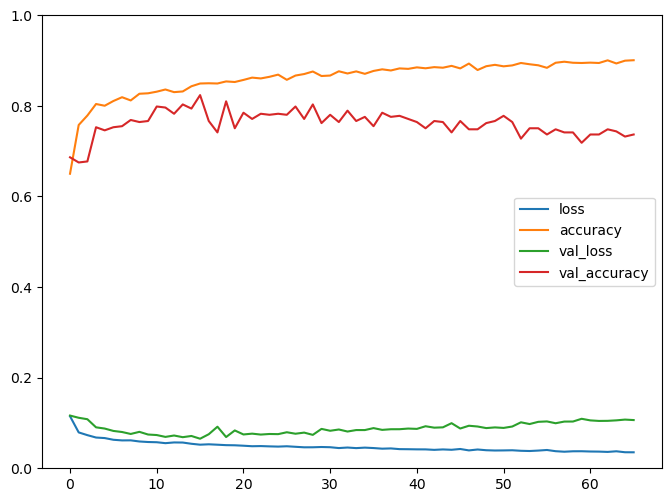

### Results auf test data ###
Accuracy for person  34 :  0.875
[[27  0  1  0]
 [ 0 18 10  0]
 [ 0  3 25  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1158 - accuracy: 0.6446 - val_loss: 0.1266 - val_accuracy: 0.6041
Epoch 2/500
197/197 - 0s - loss: 0.0808 - accuracy: 0.7487 - val_loss: 0.1251 - val_accuracy: 0.6499
Epoch 3/500
197/197 - 0s - loss: 0.0724 - accuracy: 0.7835 - val_loss: 0.1234 - val_accuracy: 0.6316
Epoch 4/500
197/197 - 0s - loss: 0.0690 - accuracy: 0.7922 - val_loss: 0.1240 - val_accuracy: 0.6545
Epoch 5/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8006 - val_loss: 0.1250 - val_accuracy: 0.6476
Epoch 6/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8125 - val_loss: 0.1189 - val_accuracy: 0.6636
Epoch 7/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8118 - val_loss: 0.1123 - val_accuracy: 0.6911
Epoch 8/500
197/197 - 0s - loss: 0.0629 - accuracy: 0.8079 - val_loss: 0.1045 - val_accuracy: 0.7346
Epoch 9/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8173 - val_los

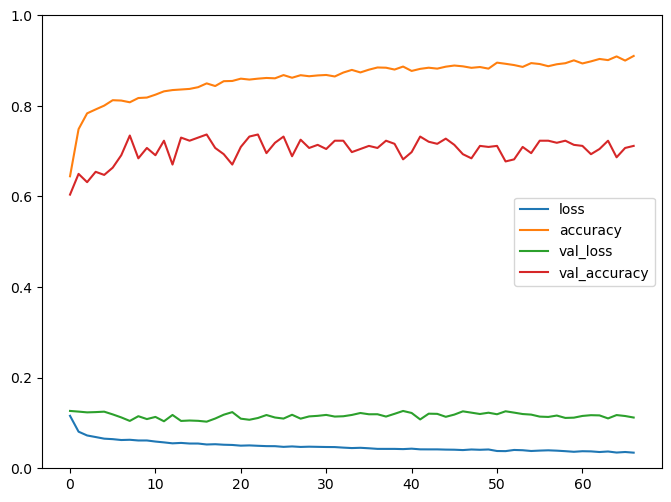

### Results auf test data ###
Accuracy for person  35 :  0.875
[[25  0  3  0]
 [ 0 25  3  0]
 [ 0  3 25  0]
 [ 0  0  5 23]]
Epoch 1/500
197/197 - 0s - loss: 0.1178 - accuracy: 0.6199 - val_loss: 0.1357 - val_accuracy: 0.5950
Epoch 2/500
197/197 - 0s - loss: 0.0817 - accuracy: 0.7484 - val_loss: 0.1289 - val_accuracy: 0.5950
Epoch 3/500
197/197 - 0s - loss: 0.0738 - accuracy: 0.7741 - val_loss: 0.1227 - val_accuracy: 0.6728
Epoch 4/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7873 - val_loss: 0.1266 - val_accuracy: 0.6636
Epoch 5/500
197/197 - 0s - loss: 0.0673 - accuracy: 0.8013 - val_loss: 0.1228 - val_accuracy: 0.6590
Epoch 6/500
197/197 - 0s - loss: 0.0656 - accuracy: 0.8031 - val_loss: 0.1195 - val_accuracy: 0.6636
Epoch 7/500
197/197 - 0s - loss: 0.0623 - accuracy: 0.8133 - val_loss: 0.1181 - val_accuracy: 0.7025
Epoch 8/500
197/197 - 0s - loss: 0.0623 - accuracy: 0.8153 - val_loss: 0.1113 - val_accuracy: 0.7117
Epoch 9/500
197/197 - 0s - loss: 0.0590 - accuracy: 0.8260 - val_los

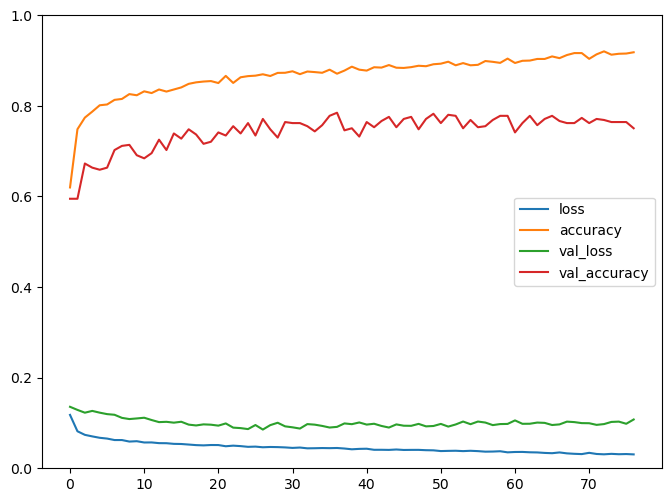

### Results auf test data ###
Accuracy for person  36 :  0.7678571428571429
[[28  0  0  0]
 [ 0 28  0  0]
 [14 12  2  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1139 - accuracy: 0.6586 - val_loss: 0.1207 - val_accuracy: 0.6430
Epoch 2/500
197/197 - 0s - loss: 0.0809 - accuracy: 0.7479 - val_loss: 0.1110 - val_accuracy: 0.7231
Epoch 3/500
197/197 - 0s - loss: 0.0742 - accuracy: 0.7680 - val_loss: 0.1125 - val_accuracy: 0.6888
Epoch 4/500
197/197 - 0s - loss: 0.0716 - accuracy: 0.7744 - val_loss: 0.1121 - val_accuracy: 0.6819
Epoch 5/500
197/197 - 0s - loss: 0.0683 - accuracy: 0.7901 - val_loss: 0.1165 - val_accuracy: 0.6819
Epoch 6/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.7995 - val_loss: 0.1003 - val_accuracy: 0.7208
Epoch 7/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8023 - val_loss: 0.1081 - val_accuracy: 0.7185
Epoch 8/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8049 - val_loss: 0.1120 - val_accuracy: 0.6888
Epoch 9/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8

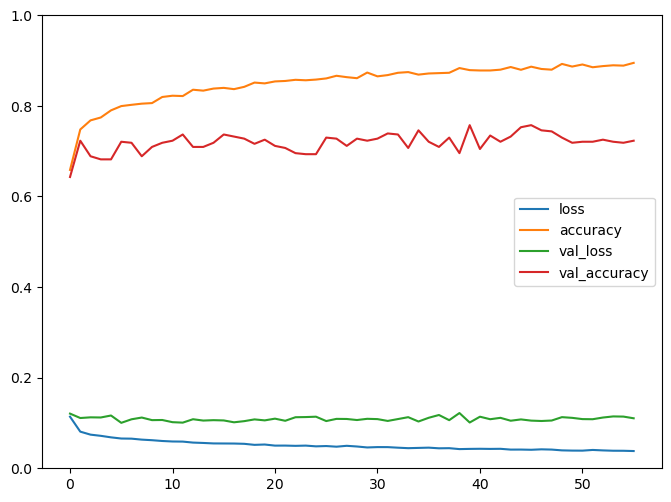

### Results auf test data ###
Accuracy for person  37 :  0.8125
[[28  0  0  0]
 [ 0  7 21  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1110 - accuracy: 0.6688 - val_loss: 0.1231 - val_accuracy: 0.5973
Epoch 2/500
197/197 - 0s - loss: 0.0798 - accuracy: 0.7464 - val_loss: 0.1105 - val_accuracy: 0.7094
Epoch 3/500
197/197 - 0s - loss: 0.0734 - accuracy: 0.7708 - val_loss: 0.1382 - val_accuracy: 0.6201
Epoch 4/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7838 - val_loss: 0.1106 - val_accuracy: 0.6888
Epoch 5/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.7955 - val_loss: 0.0959 - val_accuracy: 0.7346
Epoch 6/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.7985 - val_loss: 0.1097 - val_accuracy: 0.7185
Epoch 7/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8090 - val_loss: 0.1036 - val_accuracy: 0.7002
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8138 - val_loss: 0.1051 - val_accuracy: 0.6979
Epoch 9/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8092 - val_lo

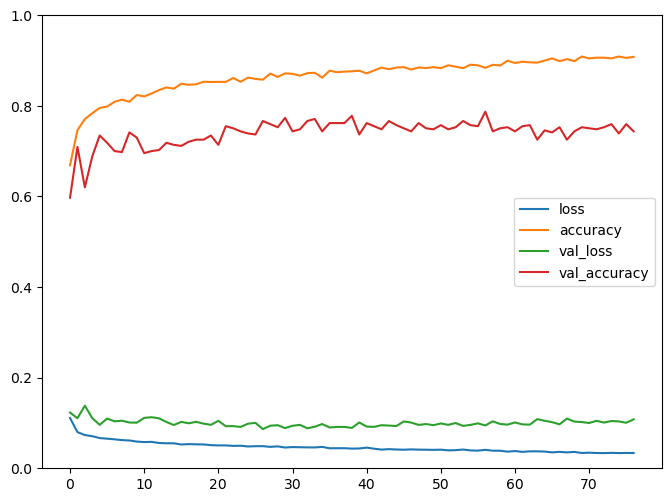

### Results auf test data ###
Accuracy for person  38 :  0.8214285714285714
[[28  0  0  0]
 [ 0 20  8  0]
 [ 0 12 16  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.1154 - accuracy: 0.6347 - val_loss: 0.0703 - val_accuracy: 0.7300
Epoch 2/500
197/197 - 0s - loss: 0.0826 - accuracy: 0.7400 - val_loss: 0.0584 - val_accuracy: 0.8398
Epoch 3/500
197/197 - 0s - loss: 0.0750 - accuracy: 0.7695 - val_loss: 0.0604 - val_accuracy: 0.8192
Epoch 4/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7929 - val_loss: 0.0609 - val_accuracy: 0.8124
Epoch 5/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7929 - val_loss: 0.0516 - val_accuracy: 0.8330
Epoch 6/500
197/197 - 0s - loss: 0.0646 - accuracy: 0.8084 - val_loss: 0.0639 - val_accuracy: 0.8032
Epoch 7/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8166 - val_loss: 0.0644 - val_accuracy: 0.7986
Epoch 8/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8123 - val_loss: 0.0620 - val_accuracy: 0.8009
Epoch 9/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.8

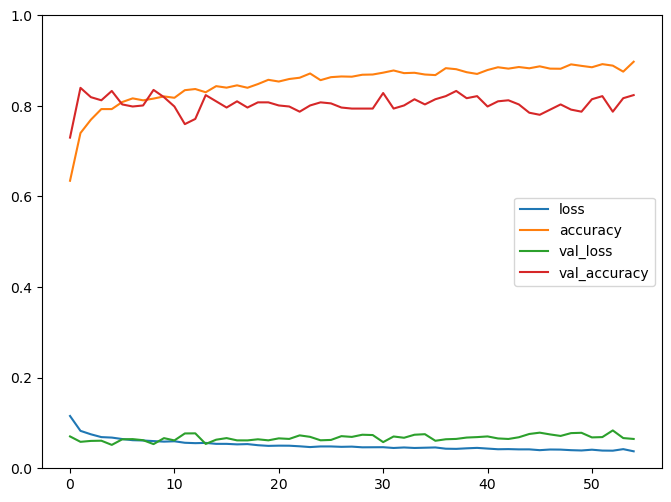

### Results auf test data ###
Accuracy for person  39 :  0.16964285714285715
[[10  8  0 10]
 [ 0  9  0 19]
 [ 0  0  0 28]
 [ 0 28  0  0]]
Epoch 1/500
197/197 - 0s - loss: 0.1154 - accuracy: 0.6360 - val_loss: 0.1228 - val_accuracy: 0.6430
Epoch 2/500
197/197 - 0s - loss: 0.0843 - accuracy: 0.7352 - val_loss: 0.1177 - val_accuracy: 0.6728
Epoch 3/500
197/197 - 0s - loss: 0.0758 - accuracy: 0.7647 - val_loss: 0.1094 - val_accuracy: 0.7346
Epoch 4/500
197/197 - 0s - loss: 0.0708 - accuracy: 0.7800 - val_loss: 0.1080 - val_accuracy: 0.7048
Epoch 5/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7906 - val_loss: 0.1051 - val_accuracy: 0.7094
Epoch 6/500
197/197 - 0s - loss: 0.0674 - accuracy: 0.7983 - val_loss: 0.1006 - val_accuracy: 0.7071
Epoch 7/500
197/197 - 0s - loss: 0.0644 - accuracy: 0.8056 - val_loss: 0.0942 - val_accuracy: 0.7391
Epoch 8/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8196 - val_loss: 0.0977 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0623 - accuracy: 0.

197/197 - 0s - loss: 0.0313 - accuracy: 0.9176 - val_loss: 0.0998 - val_accuracy: 0.7437
Epoch 81/500
197/197 - 0s - loss: 0.0309 - accuracy: 0.9145 - val_loss: 0.0967 - val_accuracy: 0.7551
Model: "sequential_204"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_30nodes (Dense)      (None, 30)                5550      
_________________________________________________________________
hidden1_30nodes (Dense)      (None, 30)                930       
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 124       
Total params: 6,604
Trainable params: 6,604
Non-trainable params: 0
_________________________________________________________________


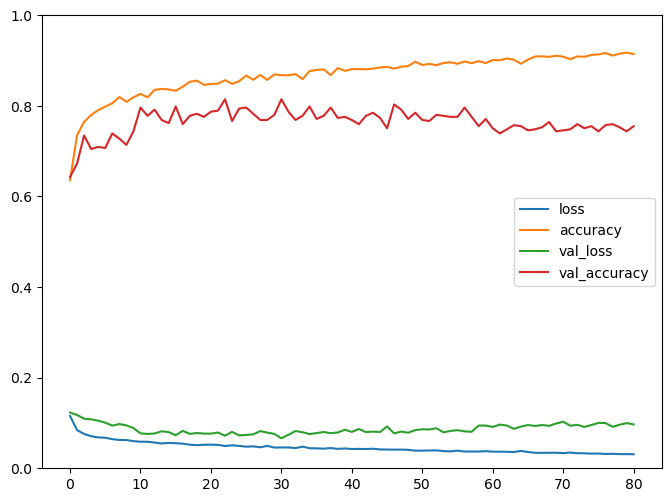

### Results auf test data ###
Accuracy for person  40 :  0.7678571428571429
[[28  0  0  0]
 [ 0 21  7  0]
 [ 3 16  9  0]
 [ 0  0  0 28]]

 ##### overall accuracy:  0.7544642857142858 #####


In [64]:
# Ergebnis auf b)
accuracies = testANN_b(hp_ann_small, n_attributes, n_classes)
results_b_fs[0] = accuracies

## Großes Neuronales Netz nach Feature Selection

In [65]:
hp_ann_big = {'units': 180, 'activation': 'tanh', 'learning_rate': 0.001, 'nbr_hidden_layers': 3}

In [66]:
model_ann_big = createANN(hp_ann_big, n_attributes, n_classes)

Epoch 1/500
182/182 - 0s - loss: 0.1001 - accuracy: 0.6827 - val_loss: 0.0864 - val_accuracy: 0.7525
Epoch 2/500
182/182 - 0s - loss: 0.0784 - accuracy: 0.7580 - val_loss: 0.0775 - val_accuracy: 0.7624
Epoch 3/500
182/182 - 0s - loss: 0.0711 - accuracy: 0.7869 - val_loss: 0.0707 - val_accuracy: 0.7649
Epoch 4/500
182/182 - 0s - loss: 0.0736 - accuracy: 0.7809 - val_loss: 0.0714 - val_accuracy: 0.7797
Epoch 5/500
182/182 - 0s - loss: 0.0692 - accuracy: 0.7913 - val_loss: 0.0652 - val_accuracy: 0.8020
Epoch 6/500
182/182 - 0s - loss: 0.0652 - accuracy: 0.8060 - val_loss: 0.0609 - val_accuracy: 0.8119
Epoch 7/500
182/182 - 0s - loss: 0.0665 - accuracy: 0.7988 - val_loss: 0.0617 - val_accuracy: 0.8317
Epoch 8/500
182/182 - 0s - loss: 0.0613 - accuracy: 0.8241 - val_loss: 0.0638 - val_accuracy: 0.8045
Epoch 9/500
182/182 - 0s - loss: 0.0606 - accuracy: 0.8222 - val_loss: 0.0659 - val_accuracy: 0.7995
Epoch 10/500
182/182 - 0s - loss: 0.0625 - accuracy: 0.8145 - val_loss: 0.0722 - val_accura

Epoch 82/500
182/182 - 0s - loss: 0.0110 - accuracy: 0.9697 - val_loss: 0.0142 - val_accuracy: 0.9653
Epoch 83/500
182/182 - 0s - loss: 0.0113 - accuracy: 0.9697 - val_loss: 0.0098 - val_accuracy: 0.9777
Epoch 84/500
182/182 - 0s - loss: 0.0088 - accuracy: 0.9779 - val_loss: 0.0096 - val_accuracy: 0.9728
Epoch 85/500
182/182 - 0s - loss: 0.0089 - accuracy: 0.9760 - val_loss: 0.0130 - val_accuracy: 0.9629
Epoch 86/500
182/182 - 0s - loss: 0.0094 - accuracy: 0.9760 - val_loss: 0.0123 - val_accuracy: 0.9653
Epoch 87/500
182/182 - 0s - loss: 0.0077 - accuracy: 0.9804 - val_loss: 0.0139 - val_accuracy: 0.9604
Epoch 88/500
182/182 - 0s - loss: 0.0088 - accuracy: 0.9763 - val_loss: 0.0116 - val_accuracy: 0.9678
Epoch 89/500
182/182 - 0s - loss: 0.0137 - accuracy: 0.9631 - val_loss: 0.0107 - val_accuracy: 0.9777
Epoch 90/500
182/182 - 0s - loss: 0.0101 - accuracy: 0.9757 - val_loss: 0.0118 - val_accuracy: 0.9678
Epoch 91/500
182/182 - 0s - loss: 0.0102 - accuracy: 0.9716 - val_loss: 0.0242 - v

Epoch 162/500
182/182 - 0s - loss: 0.0058 - accuracy: 0.9854 - val_loss: 0.0112 - val_accuracy: 0.9728
Epoch 163/500
182/182 - 0s - loss: 0.0045 - accuracy: 0.9895 - val_loss: 0.0077 - val_accuracy: 0.9777
Epoch 164/500
182/182 - 0s - loss: 0.0078 - accuracy: 0.9813 - val_loss: 0.0077 - val_accuracy: 0.9802
Epoch 165/500
182/182 - 0s - loss: 0.0040 - accuracy: 0.9895 - val_loss: 0.0046 - val_accuracy: 0.9901
Epoch 166/500
182/182 - 0s - loss: 0.0061 - accuracy: 0.9854 - val_loss: 0.0064 - val_accuracy: 0.9827
Epoch 167/500
182/182 - 0s - loss: 0.0040 - accuracy: 0.9890 - val_loss: 0.0077 - val_accuracy: 0.9851
Epoch 168/500
182/182 - 0s - loss: 0.0095 - accuracy: 0.9755 - val_loss: 0.0104 - val_accuracy: 0.9802
Epoch 169/500
182/182 - 0s - loss: 0.0041 - accuracy: 0.9890 - val_loss: 0.0081 - val_accuracy: 0.9827
Epoch 170/500
182/182 - 0s - loss: 0.0061 - accuracy: 0.9837 - val_loss: 0.0089 - val_accuracy: 0.9802
Epoch 171/500
182/182 - 0s - loss: 0.0037 - accuracy: 0.9906 - val_loss: 

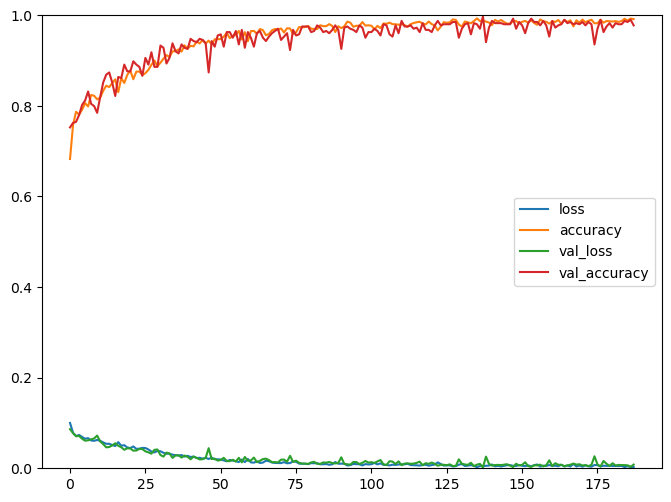

In [67]:
trainANN(model_ann_big, hp_ann_big, train_data, train_labels)

In [68]:
# Ergebnis auf a)

acc = testANN_a(model_ann_big)
results_a_fs[1] = acc

######## Results auf test data #########
Accuracy (test):  0.9799107142857143
[[106   0   1   0]
 [  0 101   7   0]
 [  0   1 105   0]
 [  0   0   0 127]]


Epoch 1/500
197/197 - 0s - loss: 0.0942 - accuracy: 0.7026 - val_loss: 0.1301 - val_accuracy: 0.6133
Epoch 2/500
197/197 - 0s - loss: 0.0742 - accuracy: 0.7736 - val_loss: 0.1137 - val_accuracy: 0.6728
Epoch 3/500
197/197 - 0s - loss: 0.0720 - accuracy: 0.7881 - val_loss: 0.1117 - val_accuracy: 0.6705
Epoch 4/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7922 - val_loss: 0.0994 - val_accuracy: 0.7208
Epoch 5/500
197/197 - 0s - loss: 0.0673 - accuracy: 0.7950 - val_loss: 0.0932 - val_accuracy: 0.7437
Epoch 6/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.7995 - val_loss: 0.0980 - val_accuracy: 0.7300
Epoch 7/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8092 - val_loss: 0.0976 - val_accuracy: 0.7506
Epoch 8/500
197/197 - 0s - loss: 0.0594 - accuracy: 0.8296 - val_loss: 0.0889 - val_accuracy: 0.7483
Epoch 9/500
197/197 - 0s - loss: 0.0582 - accuracy: 0.8255 - val_loss: 0.0961 - val_accuracy: 0.7437
Epoch 10/500
197/197 - 0s - loss: 0.0583 - accuracy: 0.8252 - val_loss: 0.1110 - val_accura

Epoch 82/500
197/197 - 0s - loss: 0.0101 - accuracy: 0.9725 - val_loss: 0.1233 - val_accuracy: 0.6934
Epoch 83/500
197/197 - 0s - loss: 0.0145 - accuracy: 0.9641 - val_loss: 0.1243 - val_accuracy: 0.7140
Epoch 84/500
197/197 - 0s - loss: 0.0105 - accuracy: 0.9710 - val_loss: 0.1283 - val_accuracy: 0.7094
Epoch 85/500
197/197 - 0s - loss: 0.0091 - accuracy: 0.9748 - val_loss: 0.1337 - val_accuracy: 0.6751
Epoch 86/500
197/197 - 0s - loss: 0.0063 - accuracy: 0.9837 - val_loss: 0.1240 - val_accuracy: 0.7254
Epoch 87/500
197/197 - 0s - loss: 0.0092 - accuracy: 0.9756 - val_loss: 0.1222 - val_accuracy: 0.7231
Epoch 88/500
197/197 - 0s - loss: 0.0095 - accuracy: 0.9758 - val_loss: 0.1227 - val_accuracy: 0.6934
Epoch 89/500
197/197 - 0s - loss: 0.0104 - accuracy: 0.9733 - val_loss: 0.1111 - val_accuracy: 0.7414
Epoch 90/500
197/197 - 0s - loss: 0.0089 - accuracy: 0.9763 - val_loss: 0.1231 - val_accuracy: 0.7025
Model: "sequential_206"
__________________________________________________________

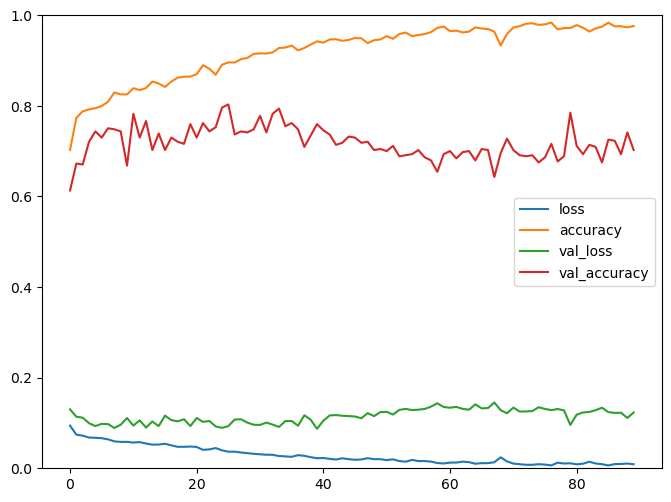

### Results auf test data ###
Accuracy for person  1 :  0.7232142857142857
[[14 14  0  0]
 [ 0 28  0  0]
 [ 0 17 11  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0923 - accuracy: 0.7069 - val_loss: 0.1218 - val_accuracy: 0.6659
Epoch 2/500
197/197 - 0s - loss: 0.0753 - accuracy: 0.7761 - val_loss: 0.1138 - val_accuracy: 0.6705
Epoch 3/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7863 - val_loss: 0.1172 - val_accuracy: 0.6796
Epoch 4/500
197/197 - 0s - loss: 0.0701 - accuracy: 0.7830 - val_loss: 0.1123 - val_accuracy: 0.6979
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.7985 - val_loss: 0.1046 - val_accuracy: 0.6796
Epoch 6/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8095 - val_loss: 0.0953 - val_accuracy: 0.7368
Epoch 7/500
197/197 - 0s - loss: 0.0635 - accuracy: 0.8120 - val_loss: 0.0954 - val_accuracy: 0.7414
Epoch 8/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8102 - val_loss: 0.0958 - val_accuracy: 0.7689
Epoch 9/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.82

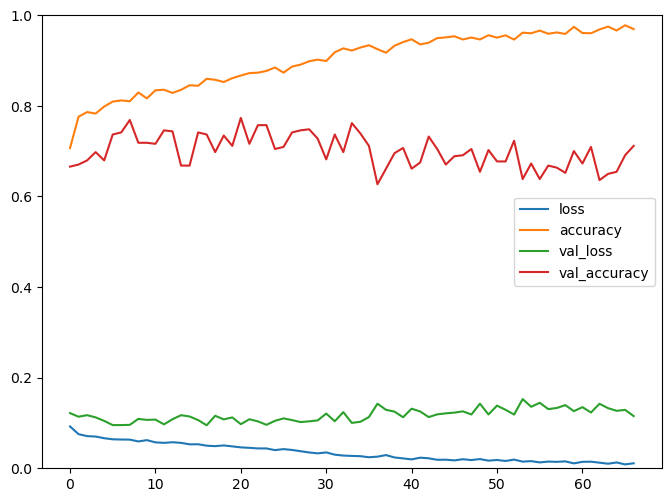

### Results auf test data ###
Accuracy for person  2 :  0.7232142857142857
[[12  0 16  0]
 [ 0 14 14  0]
 [ 0  0 27  1]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0907 - accuracy: 0.7156 - val_loss: 0.1256 - val_accuracy: 0.6178
Epoch 2/500
197/197 - 0s - loss: 0.0764 - accuracy: 0.7683 - val_loss: 0.1049 - val_accuracy: 0.7300
Epoch 3/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7738 - val_loss: 0.1170 - val_accuracy: 0.7162
Epoch 4/500
197/197 - 0s - loss: 0.0701 - accuracy: 0.7881 - val_loss: 0.1157 - val_accuracy: 0.6773
Epoch 5/500
197/197 - 0s - loss: 0.0697 - accuracy: 0.7904 - val_loss: 0.1164 - val_accuracy: 0.6888
Epoch 6/500
197/197 - 0s - loss: 0.0658 - accuracy: 0.8018 - val_loss: 0.0863 - val_accuracy: 0.7597
Epoch 7/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8115 - val_loss: 0.1048 - val_accuracy: 0.6911
Epoch 8/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8097 - val_loss: 0.0950 - val_accuracy: 0.7551
Epoch 9/500
197/197 - 0s - loss: 0.0600 - accuracy: 0.81

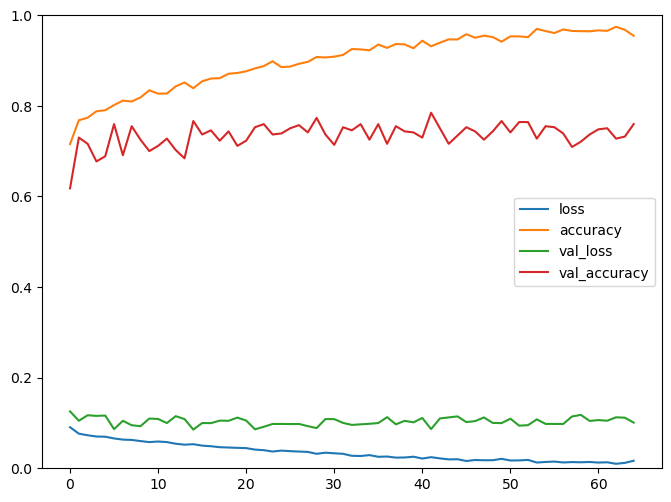

### Results auf test data ###
Accuracy for person  3 :  0.7589285714285714
[[17 11  0  0]
 [ 0 21  7  0]
 [ 0  9 19  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0922 - accuracy: 0.7047 - val_loss: 0.1228 - val_accuracy: 0.6682
Epoch 2/500
197/197 - 0s - loss: 0.0775 - accuracy: 0.7583 - val_loss: 0.1294 - val_accuracy: 0.6751
Epoch 3/500
197/197 - 0s - loss: 0.0717 - accuracy: 0.7843 - val_loss: 0.1061 - val_accuracy: 0.6728
Epoch 4/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7909 - val_loss: 0.0979 - val_accuracy: 0.7346
Epoch 5/500
197/197 - 0s - loss: 0.0656 - accuracy: 0.8018 - val_loss: 0.0896 - val_accuracy: 0.7551
Epoch 6/500
197/197 - 0s - loss: 0.0633 - accuracy: 0.8107 - val_loss: 0.1176 - val_accuracy: 0.6751
Epoch 7/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8074 - val_loss: 0.1037 - val_accuracy: 0.7277
Epoch 8/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8082 - val_loss: 0.1122 - val_accuracy: 0.6934
Epoch 9/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.82

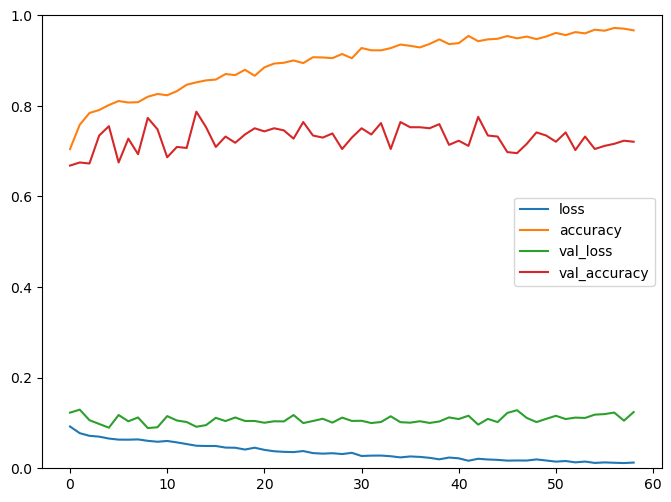

### Results auf test data ###
Accuracy for person  4 :  0.7857142857142857
[[28  0  0  0]
 [ 9  7 12  0]
 [ 0  0 28  0]
 [ 0  0  3 25]]
Epoch 1/500
197/197 - 0s - loss: 0.0935 - accuracy: 0.7054 - val_loss: 0.1227 - val_accuracy: 0.6178
Epoch 2/500
197/197 - 0s - loss: 0.0762 - accuracy: 0.7667 - val_loss: 0.1051 - val_accuracy: 0.7048
Epoch 3/500
197/197 - 0s - loss: 0.0739 - accuracy: 0.7736 - val_loss: 0.1410 - val_accuracy: 0.5973
Epoch 4/500
197/197 - 0s - loss: 0.0684 - accuracy: 0.7909 - val_loss: 0.0924 - val_accuracy: 0.7620
Epoch 5/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7812 - val_loss: 0.1091 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8077 - val_loss: 0.0952 - val_accuracy: 0.7391
Epoch 7/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8072 - val_loss: 0.0925 - val_accuracy: 0.7757
Epoch 8/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8153 - val_loss: 0.1007 - val_accuracy: 0.7185
Epoch 9/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.81

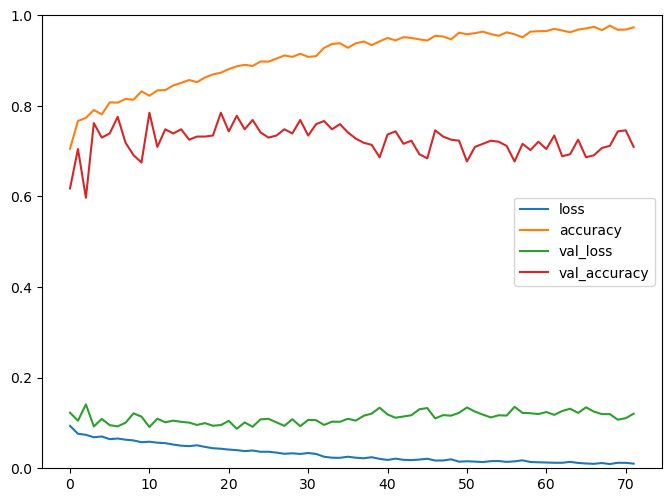

### Results auf test data ###
Accuracy for person  5 :  0.9017857142857143
[[28  0  0  0]
 [ 0 26  2  0]
 [ 0  9 19  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0922 - accuracy: 0.7044 - val_loss: 0.1171 - val_accuracy: 0.6636
Epoch 2/500
197/197 - 0s - loss: 0.0754 - accuracy: 0.7649 - val_loss: 0.1082 - val_accuracy: 0.7002
Epoch 3/500
197/197 - 0s - loss: 0.0732 - accuracy: 0.7708 - val_loss: 0.1075 - val_accuracy: 0.6590
Epoch 4/500
197/197 - 0s - loss: 0.0685 - accuracy: 0.7914 - val_loss: 0.0924 - val_accuracy: 0.7025
Epoch 5/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8069 - val_loss: 0.0897 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.7978 - val_loss: 0.1004 - val_accuracy: 0.7643
Epoch 7/500
197/197 - 0s - loss: 0.0636 - accuracy: 0.8125 - val_loss: 0.1076 - val_accuracy: 0.6865
Epoch 8/500
197/197 - 0s - loss: 0.0598 - accuracy: 0.8229 - val_loss: 0.1275 - val_accuracy: 0.6453
Epoch 9/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.82

197/197 - 0s - loss: 0.0091 - accuracy: 0.9748 - val_loss: 0.1035 - val_accuracy: 0.7391
Epoch 81/500
197/197 - 0s - loss: 0.0115 - accuracy: 0.9677 - val_loss: 0.1203 - val_accuracy: 0.7048
Epoch 82/500
197/197 - 0s - loss: 0.0077 - accuracy: 0.9812 - val_loss: 0.1235 - val_accuracy: 0.6979
Epoch 83/500
197/197 - 0s - loss: 0.0077 - accuracy: 0.9776 - val_loss: 0.1211 - val_accuracy: 0.7002
Epoch 84/500
197/197 - 0s - loss: 0.0074 - accuracy: 0.9809 - val_loss: 0.1173 - val_accuracy: 0.6865
Epoch 85/500
197/197 - 0s - loss: 0.0068 - accuracy: 0.9835 - val_loss: 0.1134 - val_accuracy: 0.7368
Epoch 86/500
197/197 - 0s - loss: 0.0071 - accuracy: 0.9809 - val_loss: 0.1156 - val_accuracy: 0.7140
Epoch 87/500
197/197 - 0s - loss: 0.0080 - accuracy: 0.9804 - val_loss: 0.1142 - val_accuracy: 0.7094
Epoch 88/500
197/197 - 0s - loss: 0.0072 - accuracy: 0.9814 - val_loss: 0.1292 - val_accuracy: 0.6934
Epoch 89/500
197/197 - 0s - loss: 0.0078 - accuracy: 0.9809 - val_loss: 0.1082 - val_accuracy: 

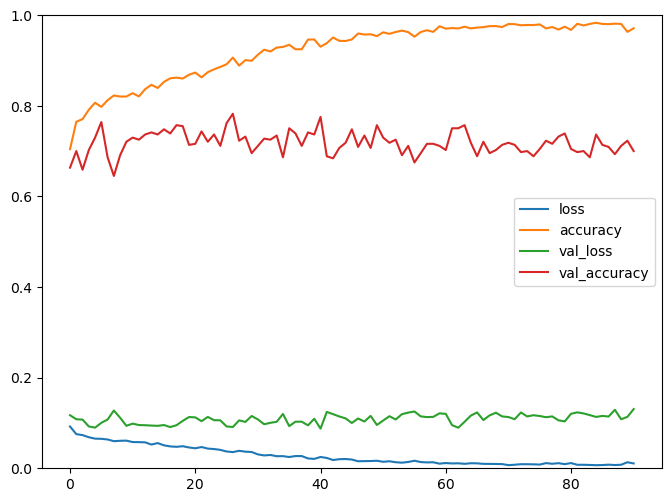

### Results auf test data ###
Accuracy for person  6 :  0.625
[[28  0  0  0]
 [13 14  1  0]
 [15 13  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0919 - accuracy: 0.7062 - val_loss: 0.1077 - val_accuracy: 0.7002
Epoch 2/500
197/197 - 0s - loss: 0.0745 - accuracy: 0.7726 - val_loss: 0.1087 - val_accuracy: 0.6888
Epoch 3/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7863 - val_loss: 0.1202 - val_accuracy: 0.6819
Epoch 4/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7919 - val_loss: 0.0970 - val_accuracy: 0.7300
Epoch 5/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8074 - val_loss: 0.1015 - val_accuracy: 0.7666
Epoch 6/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8194 - val_loss: 0.1064 - val_accuracy: 0.7071
Epoch 7/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8123 - val_loss: 0.1043 - val_accuracy: 0.7140
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8257 - val_loss: 0.0960 - val_accuracy: 0.7803
Epoch 9/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8199 - val_loss

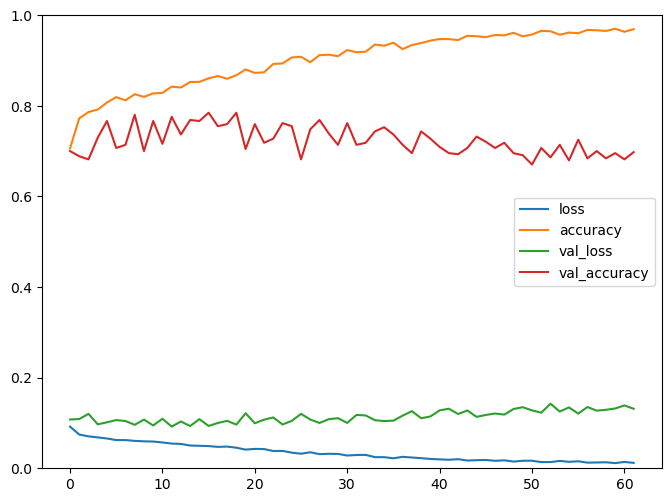

### Results auf test data ###
Accuracy for person  7 :  0.7232142857142857
[[21  0  7  0]
 [ 0 26  2  0]
 [ 7 14  7  0]
 [ 0  0  1 27]]
Epoch 1/500
197/197 - 0s - loss: 0.0909 - accuracy: 0.7103 - val_loss: 0.1092 - val_accuracy: 0.7048
Epoch 2/500
197/197 - 0s - loss: 0.0759 - accuracy: 0.7751 - val_loss: 0.0982 - val_accuracy: 0.7162
Epoch 3/500
197/197 - 0s - loss: 0.0711 - accuracy: 0.7850 - val_loss: 0.0962 - val_accuracy: 0.6957
Epoch 4/500
197/197 - 0s - loss: 0.0685 - accuracy: 0.7945 - val_loss: 0.1067 - val_accuracy: 0.7208
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8016 - val_loss: 0.0958 - val_accuracy: 0.7620
Epoch 6/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.8049 - val_loss: 0.0902 - val_accuracy: 0.7231
Epoch 7/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8181 - val_loss: 0.0841 - val_accuracy: 0.7803
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8232 - val_loss: 0.1067 - val_accuracy: 0.7185
Epoch 9/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.82

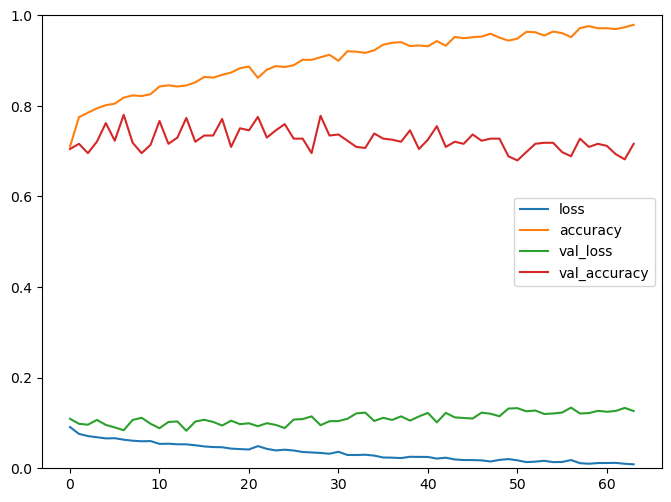

### Results auf test data ###
Accuracy for person  8 :  0.7321428571428571
[[26  2  0  0]
 [ 0 28  0  0]
 [ 3 25  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0908 - accuracy: 0.7146 - val_loss: 0.1024 - val_accuracy: 0.7208
Epoch 2/500
197/197 - 0s - loss: 0.0728 - accuracy: 0.7756 - val_loss: 0.1200 - val_accuracy: 0.6934
Epoch 3/500
197/197 - 0s - loss: 0.0694 - accuracy: 0.7950 - val_loss: 0.0924 - val_accuracy: 0.7643
Epoch 4/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.7955 - val_loss: 0.0988 - val_accuracy: 0.7780
Epoch 5/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7924 - val_loss: 0.0947 - val_accuracy: 0.7460
Epoch 6/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8107 - val_loss: 0.1061 - val_accuracy: 0.7162
Epoch 7/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.8013 - val_loss: 0.1086 - val_accuracy: 0.7368
Epoch 8/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8252 - val_loss: 0.1054 - val_accuracy: 0.6888
Epoch 9/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.83

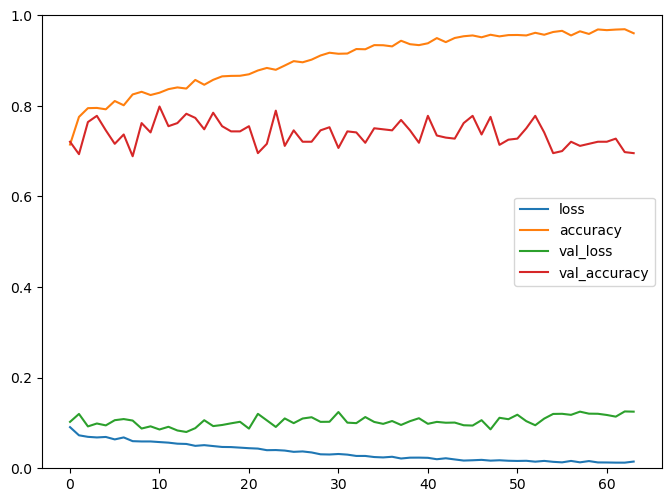

### Results auf test data ###
Accuracy for person  9 :  0.7232142857142857
[[19  0  9  0]
 [ 0 14 14  0]
 [ 0  2 20  6]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0932 - accuracy: 0.7011 - val_loss: 0.1129 - val_accuracy: 0.7094
Epoch 2/500
197/197 - 0s - loss: 0.0760 - accuracy: 0.7593 - val_loss: 0.1143 - val_accuracy: 0.7414
Epoch 3/500
197/197 - 0s - loss: 0.0760 - accuracy: 0.7705 - val_loss: 0.1019 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0694 - accuracy: 0.7848 - val_loss: 0.1085 - val_accuracy: 0.7117
Epoch 5/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8054 - val_loss: 0.1100 - val_accuracy: 0.6819
Epoch 6/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.7998 - val_loss: 0.1051 - val_accuracy: 0.7483
Epoch 7/500
197/197 - 0s - loss: 0.0611 - accuracy: 0.8219 - val_loss: 0.0982 - val_accuracy: 0.7346
Epoch 8/500
197/197 - 0s - loss: 0.0619 - accuracy: 0.8166 - val_loss: 0.1030 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.81

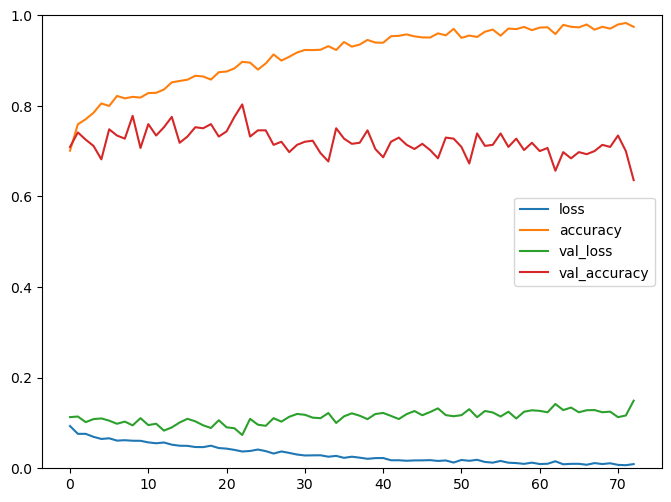

### Results auf test data ###
Accuracy for person  10 :  0.7946428571428571
[[19  1  8  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0920 - accuracy: 0.7105 - val_loss: 0.1373 - val_accuracy: 0.6384
Epoch 2/500
197/197 - 0s - loss: 0.0767 - accuracy: 0.7611 - val_loss: 0.1280 - val_accuracy: 0.6568
Epoch 3/500
197/197 - 0s - loss: 0.0744 - accuracy: 0.7713 - val_loss: 0.1097 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0683 - accuracy: 0.7960 - val_loss: 0.1029 - val_accuracy: 0.7254
Epoch 5/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.7945 - val_loss: 0.1130 - val_accuracy: 0.6888
Epoch 6/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8087 - val_loss: 0.1144 - val_accuracy: 0.7002
Epoch 7/500
197/197 - 0s - loss: 0.0652 - accuracy: 0.7978 - val_loss: 0.0954 - val_accuracy: 0.7437
Epoch 8/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8166 - val_loss: 0.1151 - val_accuracy: 0.6636
Epoch 9/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8

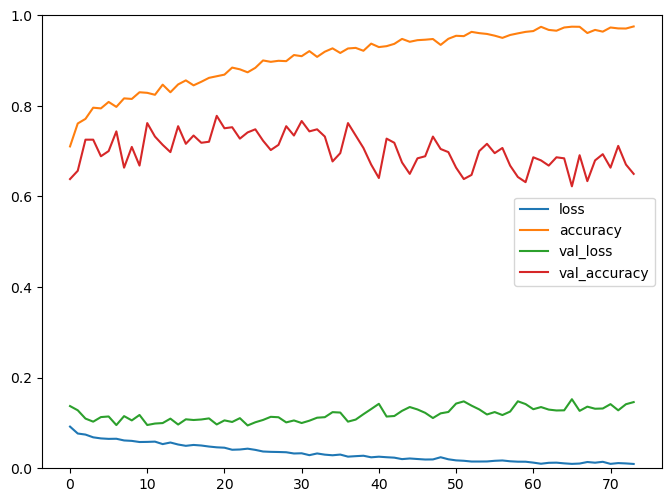

### Results auf test data ###
Accuracy for person  11 :  0.875
[[19  8  1  0]
 [ 0 24  4  0]
 [ 0  1 27  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0927 - accuracy: 0.6958 - val_loss: 0.1243 - val_accuracy: 0.6773
Epoch 2/500
197/197 - 0s - loss: 0.0769 - accuracy: 0.7634 - val_loss: 0.1179 - val_accuracy: 0.6270
Epoch 3/500
197/197 - 0s - loss: 0.0738 - accuracy: 0.7794 - val_loss: 0.1127 - val_accuracy: 0.6751
Epoch 4/500
197/197 - 0s - loss: 0.0705 - accuracy: 0.7861 - val_loss: 0.1005 - val_accuracy: 0.7185
Epoch 5/500
197/197 - 0s - loss: 0.0716 - accuracy: 0.7850 - val_loss: 0.1097 - val_accuracy: 0.6842
Epoch 6/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.8003 - val_loss: 0.0998 - val_accuracy: 0.7025
Epoch 7/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8112 - val_loss: 0.0870 - val_accuracy: 0.7849
Epoch 8/500
197/197 - 0s - loss: 0.0642 - accuracy: 0.8049 - val_loss: 0.0991 - val_accuracy: 0.7346
Epoch 9/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8217 - val_los

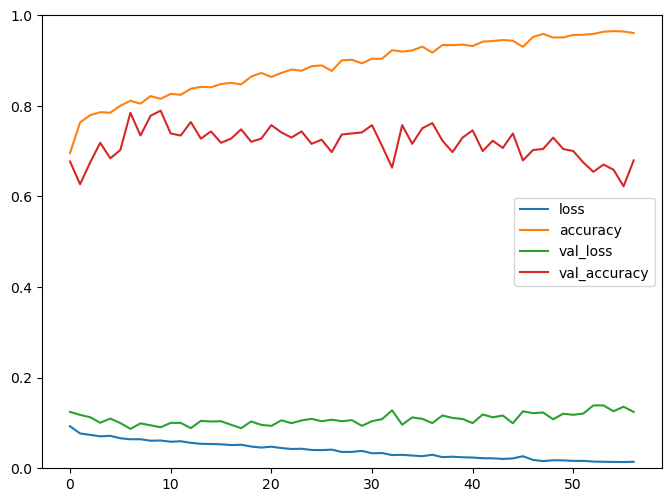

### Results auf test data ###
Accuracy for person  12 :  0.8928571428571429
[[27  1  0  0]
 [ 0 28  0  0]
 [ 0 11 17  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0919 - accuracy: 0.7087 - val_loss: 0.1086 - val_accuracy: 0.7391
Epoch 2/500
197/197 - 0s - loss: 0.0712 - accuracy: 0.7838 - val_loss: 0.1247 - val_accuracy: 0.6476
Epoch 3/500
197/197 - 0s - loss: 0.0734 - accuracy: 0.7805 - val_loss: 0.1061 - val_accuracy: 0.6842
Epoch 4/500
197/197 - 0s - loss: 0.0690 - accuracy: 0.7911 - val_loss: 0.0876 - val_accuracy: 0.7574
Epoch 5/500
197/197 - 0s - loss: 0.0674 - accuracy: 0.8006 - val_loss: 0.0926 - val_accuracy: 0.7483
Epoch 6/500
197/197 - 0s - loss: 0.0616 - accuracy: 0.8138 - val_loss: 0.0891 - val_accuracy: 0.7620
Epoch 7/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8156 - val_loss: 0.0866 - val_accuracy: 0.7757
Epoch 8/500
197/197 - 0s - loss: 0.0584 - accuracy: 0.8268 - val_loss: 0.0935 - val_accuracy: 0.7551
Epoch 9/500
197/197 - 0s - loss: 0.0578 - accuracy: 0.8

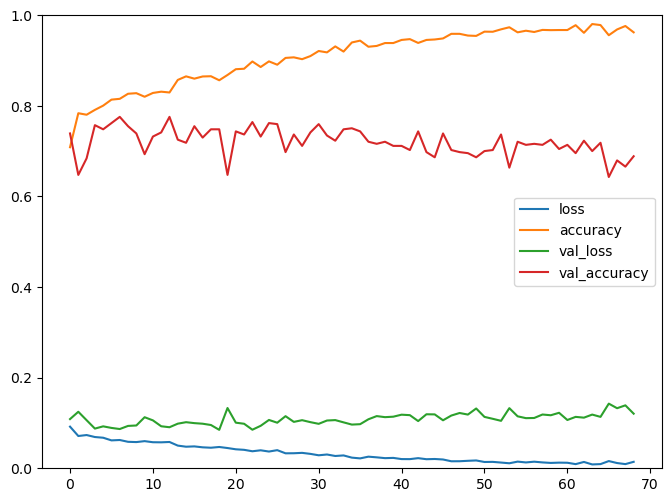

### Results auf test data ###
Accuracy for person  13 :  0.75
[[28  0  0  0]
 [ 0 14 14  0]
 [ 0 14 14  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0920 - accuracy: 0.6998 - val_loss: 0.1202 - val_accuracy: 0.7208
Epoch 2/500
197/197 - 0s - loss: 0.0776 - accuracy: 0.7558 - val_loss: 0.1132 - val_accuracy: 0.6705
Epoch 3/500
197/197 - 0s - loss: 0.0727 - accuracy: 0.7782 - val_loss: 0.1096 - val_accuracy: 0.6522
Epoch 4/500
197/197 - 0s - loss: 0.0683 - accuracy: 0.7990 - val_loss: 0.1084 - val_accuracy: 0.6682
Epoch 5/500
197/197 - 0s - loss: 0.0670 - accuracy: 0.7993 - val_loss: 0.1110 - val_accuracy: 0.6682
Epoch 6/500
197/197 - 0s - loss: 0.0672 - accuracy: 0.7967 - val_loss: 0.1055 - val_accuracy: 0.6842
Epoch 7/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8069 - val_loss: 0.1186 - val_accuracy: 0.6888
Epoch 8/500
197/197 - 0s - loss: 0.0598 - accuracy: 0.8296 - val_loss: 0.1052 - val_accuracy: 0.7437
Epoch 9/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8260 - val_loss

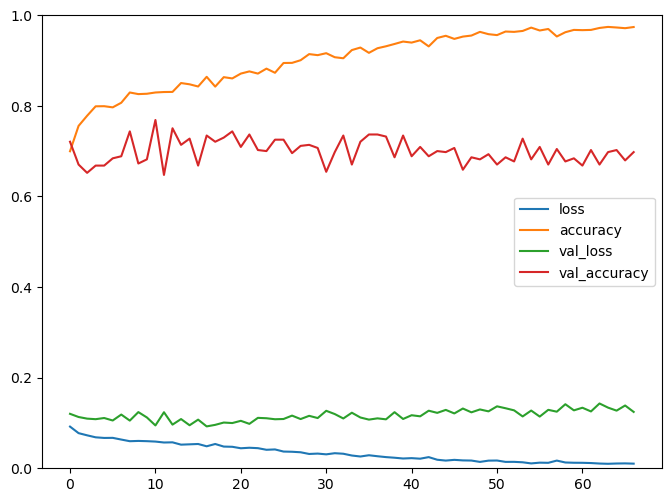

### Results auf test data ###
Accuracy for person  14 :  0.9107142857142857
[[28  0  0  0]
 [ 0 22  6  0]
 [ 0  4 24  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0918 - accuracy: 0.7006 - val_loss: 0.1309 - val_accuracy: 0.6316
Epoch 2/500
197/197 - 0s - loss: 0.0778 - accuracy: 0.7593 - val_loss: 0.1261 - val_accuracy: 0.6751
Epoch 3/500
197/197 - 0s - loss: 0.0700 - accuracy: 0.7873 - val_loss: 0.1349 - val_accuracy: 0.6407
Epoch 4/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7858 - val_loss: 0.1442 - val_accuracy: 0.6178
Epoch 5/500
197/197 - 0s - loss: 0.0673 - accuracy: 0.7914 - val_loss: 0.1001 - val_accuracy: 0.7117
Epoch 6/500
197/197 - 0s - loss: 0.0665 - accuracy: 0.8013 - val_loss: 0.1066 - val_accuracy: 0.7277
Epoch 7/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8171 - val_loss: 0.1037 - val_accuracy: 0.7140
Epoch 8/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8209 - val_loss: 0.0985 - val_accuracy: 0.7323
Epoch 9/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8

197/197 - 0s - loss: 0.0093 - accuracy: 0.9741 - val_loss: 0.1348 - val_accuracy: 0.6979
Epoch 81/500
197/197 - 0s - loss: 0.0116 - accuracy: 0.9682 - val_loss: 0.1367 - val_accuracy: 0.6888
Epoch 82/500
197/197 - 0s - loss: 0.0088 - accuracy: 0.9766 - val_loss: 0.1281 - val_accuracy: 0.7048
Epoch 83/500
197/197 - 0s - loss: 0.0105 - accuracy: 0.9718 - val_loss: 0.1182 - val_accuracy: 0.7162
Epoch 84/500
197/197 - 0s - loss: 0.0091 - accuracy: 0.9748 - val_loss: 0.1303 - val_accuracy: 0.6934
Epoch 85/500
197/197 - 0s - loss: 0.0111 - accuracy: 0.9720 - val_loss: 0.1164 - val_accuracy: 0.7231
Epoch 86/500
197/197 - 0s - loss: 0.0110 - accuracy: 0.9707 - val_loss: 0.1453 - val_accuracy: 0.6522
Epoch 87/500
197/197 - 0s - loss: 0.0102 - accuracy: 0.9743 - val_loss: 0.1198 - val_accuracy: 0.7277
Epoch 88/500
197/197 - 0s - loss: 0.0098 - accuracy: 0.9735 - val_loss: 0.1150 - val_accuracy: 0.7346
Model: "sequential_220"
_________________________________________________________________
Layer

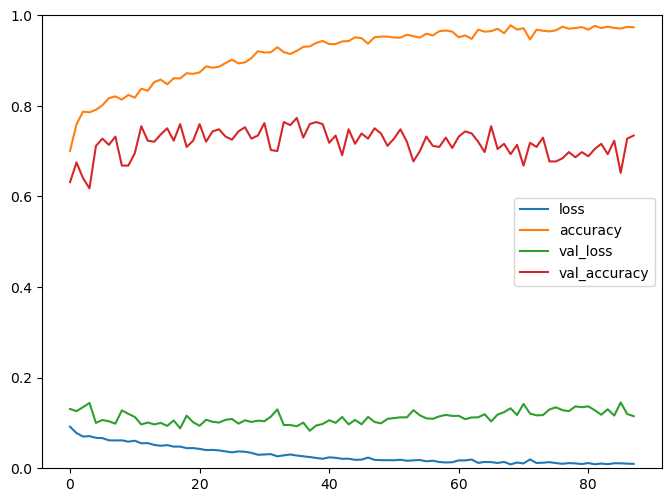

### Results auf test data ###
Accuracy for person  15 :  0.7767857142857143
[[12  0 16  0]
 [ 0 20  8  0]
 [ 0  1 27  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0942 - accuracy: 0.7057 - val_loss: 0.0990 - val_accuracy: 0.7117
Epoch 2/500
197/197 - 0s - loss: 0.0777 - accuracy: 0.7596 - val_loss: 0.0928 - val_accuracy: 0.7368
Epoch 3/500
197/197 - 0s - loss: 0.0733 - accuracy: 0.7782 - val_loss: 0.0961 - val_accuracy: 0.6773
Epoch 4/500
197/197 - 0s - loss: 0.0684 - accuracy: 0.7952 - val_loss: 0.0994 - val_accuracy: 0.7551
Epoch 5/500
197/197 - 0s - loss: 0.0660 - accuracy: 0.8069 - val_loss: 0.1135 - val_accuracy: 0.6842
Epoch 6/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.8028 - val_loss: 0.1096 - val_accuracy: 0.7094
Epoch 7/500
197/197 - 0s - loss: 0.0651 - accuracy: 0.8021 - val_loss: 0.1008 - val_accuracy: 0.7208
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8173 - val_loss: 0.0899 - val_accuracy: 0.7506
Epoch 9/500
197/197 - 0s - loss: 0.0593 - accuracy: 0.8

197/197 - 0s - loss: 0.0118 - accuracy: 0.9677 - val_loss: 0.1451 - val_accuracy: 0.6568
Epoch 81/500
197/197 - 0s - loss: 0.0106 - accuracy: 0.9723 - val_loss: 0.1585 - val_accuracy: 0.6270
Model: "sequential_221"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_180nodes (Dense)     (None, 180)               33300     
_________________________________________________________________
hidden1_180nodes (Dense)     (None, 180)               32580     
_________________________________________________________________
hidden2_180nodes (Dense)     (None, 180)               32580     
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 724       
Total params: 99,184
Trainable params: 99,184
Non-trainable params: 0
_________________________________________________________________


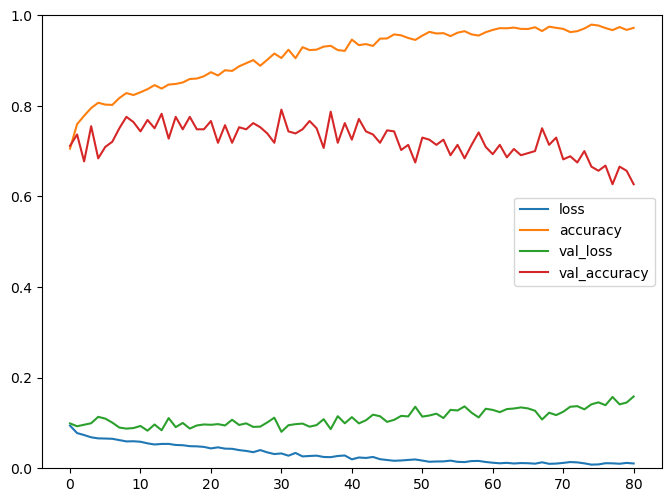

### Results auf test data ###
Accuracy for person  16 :  0.8839285714285714
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 13 15  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0919 - accuracy: 0.7110 - val_loss: 0.1316 - val_accuracy: 0.6270
Epoch 2/500
197/197 - 0s - loss: 0.0732 - accuracy: 0.7731 - val_loss: 0.1075 - val_accuracy: 0.7002
Epoch 3/500
197/197 - 0s - loss: 0.0688 - accuracy: 0.7929 - val_loss: 0.1232 - val_accuracy: 0.6522
Epoch 4/500
197/197 - 0s - loss: 0.0669 - accuracy: 0.7978 - val_loss: 0.1224 - val_accuracy: 0.6568
Epoch 5/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7886 - val_loss: 0.0977 - val_accuracy: 0.7666
Epoch 6/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8158 - val_loss: 0.1052 - val_accuracy: 0.7140
Epoch 7/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8148 - val_loss: 0.0975 - val_accuracy: 0.7185
Epoch 8/500
197/197 - 0s - loss: 0.0577 - accuracy: 0.8316 - val_loss: 0.1055 - val_accuracy: 0.7391
Epoch 9/500
197/197 - 0s - loss: 0.0604 - accuracy: 0.8

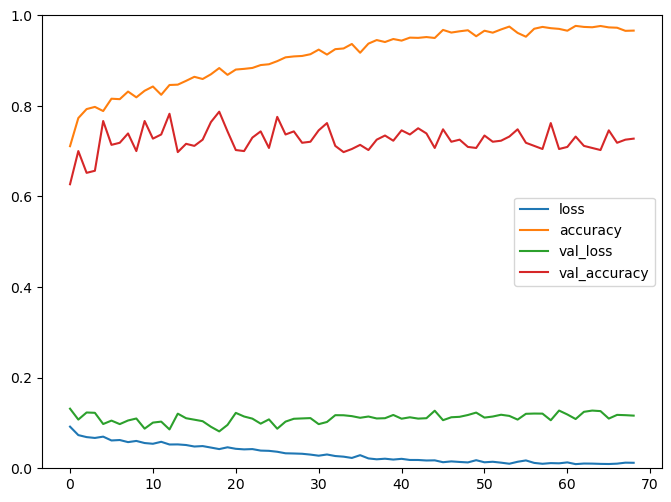

### Results auf test data ###
Accuracy for person  17 :  0.625
[[ 9 18  1  0]
 [ 0 28  0  0]
 [ 0 23  5  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0895 - accuracy: 0.7184 - val_loss: 0.0995 - val_accuracy: 0.7551
Epoch 2/500
197/197 - 0s - loss: 0.0773 - accuracy: 0.7616 - val_loss: 0.1137 - val_accuracy: 0.6888
Epoch 3/500
197/197 - 0s - loss: 0.0738 - accuracy: 0.7721 - val_loss: 0.1014 - val_accuracy: 0.7140
Epoch 4/500
197/197 - 0s - loss: 0.0667 - accuracy: 0.7988 - val_loss: 0.1047 - val_accuracy: 0.7025
Epoch 5/500
197/197 - 0s - loss: 0.0671 - accuracy: 0.7998 - val_loss: 0.1122 - val_accuracy: 0.6911
Epoch 6/500
197/197 - 0s - loss: 0.0659 - accuracy: 0.8049 - val_loss: 0.1078 - val_accuracy: 0.7506
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8140 - val_loss: 0.1035 - val_accuracy: 0.7025
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8194 - val_loss: 0.1003 - val_accuracy: 0.7025
Epoch 9/500
197/197 - 0s - loss: 0.0619 - accuracy: 0.8156 - val_los

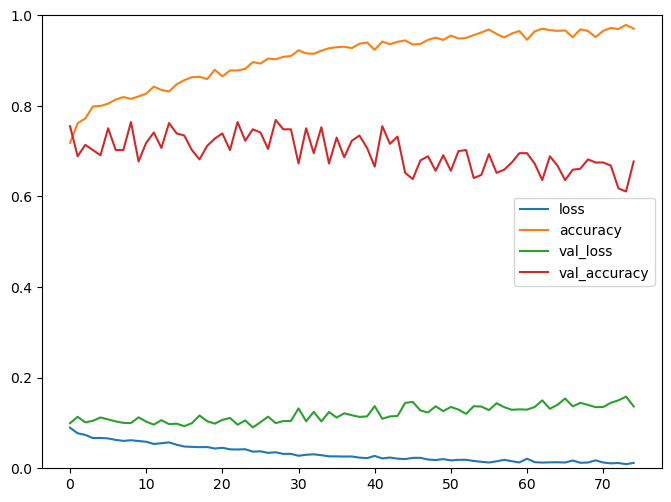

### Results auf test data ###
Accuracy for person  18 :  0.8214285714285714
[[26  0  2  0]
 [ 2 20  6  0]
 [ 0  8 20  0]
 [ 0  0  2 26]]
Epoch 1/500
197/197 - 0s - loss: 0.0920 - accuracy: 0.7041 - val_loss: 0.1090 - val_accuracy: 0.6934
Epoch 2/500
197/197 - 0s - loss: 0.0744 - accuracy: 0.7726 - val_loss: 0.1144 - val_accuracy: 0.6751
Epoch 3/500
197/197 - 0s - loss: 0.0738 - accuracy: 0.7769 - val_loss: 0.1251 - val_accuracy: 0.6224
Epoch 4/500
197/197 - 0s - loss: 0.0706 - accuracy: 0.7917 - val_loss: 0.1059 - val_accuracy: 0.6751
Epoch 5/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.8028 - val_loss: 0.0932 - val_accuracy: 0.7300
Epoch 6/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8100 - val_loss: 0.0989 - val_accuracy: 0.7689
Epoch 7/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8084 - val_loss: 0.1007 - val_accuracy: 0.7391
Epoch 8/500
197/197 - 0s - loss: 0.0587 - accuracy: 0.8316 - val_loss: 0.0923 - val_accuracy: 0.7620
Epoch 9/500
197/197 - 0s - loss: 0.0579 - accuracy: 0.8

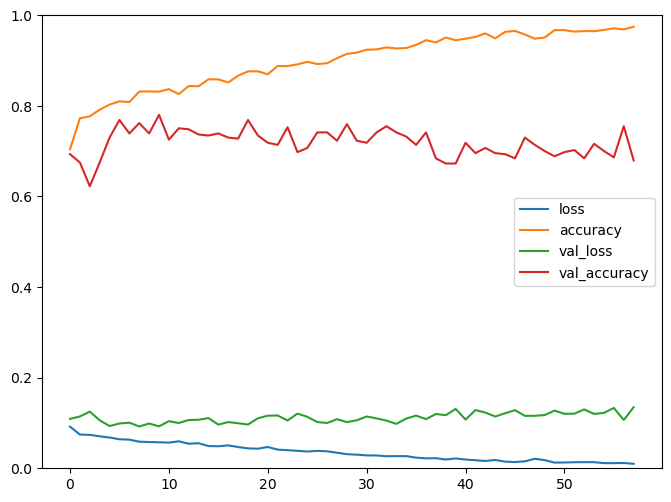

### Results auf test data ###
Accuracy for person  19 :  0.6696428571428571
[[12 16  0  0]
 [ 0 26  2  0]
 [ 0 19  9  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0905 - accuracy: 0.7197 - val_loss: 0.1109 - val_accuracy: 0.6819
Epoch 2/500
197/197 - 0s - loss: 0.0733 - accuracy: 0.7807 - val_loss: 0.1021 - val_accuracy: 0.7346
Epoch 3/500
197/197 - 0s - loss: 0.0743 - accuracy: 0.7782 - val_loss: 0.1076 - val_accuracy: 0.6865
Epoch 4/500
197/197 - 0s - loss: 0.0710 - accuracy: 0.7871 - val_loss: 0.1116 - val_accuracy: 0.6888
Epoch 5/500
197/197 - 0s - loss: 0.0670 - accuracy: 0.7985 - val_loss: 0.0989 - val_accuracy: 0.7437
Epoch 6/500
197/197 - 0s - loss: 0.0645 - accuracy: 0.8054 - val_loss: 0.0946 - val_accuracy: 0.7666
Epoch 7/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8084 - val_loss: 0.0972 - val_accuracy: 0.7208
Epoch 8/500
197/197 - 0s - loss: 0.0614 - accuracy: 0.8224 - val_loss: 0.0900 - val_accuracy: 0.7780
Epoch 9/500
197/197 - 0s - loss: 0.0620 - accuracy: 0.8

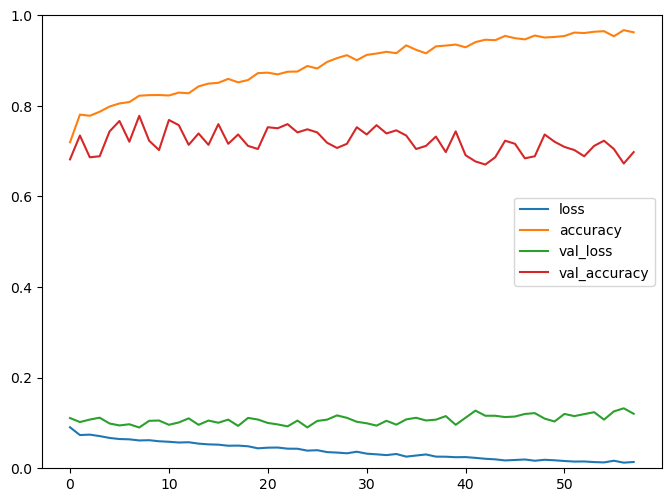

### Results auf test data ###
Accuracy for person  20 :  0.8839285714285714
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 12 16  0]
 [ 0  1  0 27]]
Epoch 1/500
197/197 - 0s - loss: 0.0912 - accuracy: 0.7067 - val_loss: 0.1340 - val_accuracy: 0.6201
Epoch 2/500
197/197 - 0s - loss: 0.0743 - accuracy: 0.7718 - val_loss: 0.1299 - val_accuracy: 0.5927
Epoch 3/500
197/197 - 0s - loss: 0.0703 - accuracy: 0.7871 - val_loss: 0.1273 - val_accuracy: 0.6362
Epoch 4/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.7975 - val_loss: 0.1382 - val_accuracy: 0.6293
Epoch 5/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8034 - val_loss: 0.1239 - val_accuracy: 0.6362
Epoch 6/500
197/197 - 0s - loss: 0.0629 - accuracy: 0.8112 - val_loss: 0.1239 - val_accuracy: 0.6522
Epoch 7/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7978 - val_loss: 0.1383 - val_accuracy: 0.6316
Epoch 8/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8090 - val_loss: 0.1220 - val_accuracy: 0.6613
Epoch 9/500
197/197 - 0s - loss: 0.0561 - accuracy: 0.8

197/197 - 0s - loss: 0.0096 - accuracy: 0.9723 - val_loss: 0.1186 - val_accuracy: 0.7231
Epoch 81/500
197/197 - 0s - loss: 0.0081 - accuracy: 0.9809 - val_loss: 0.1278 - val_accuracy: 0.7048
Model: "sequential_226"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_180nodes (Dense)     (None, 180)               33300     
_________________________________________________________________
hidden1_180nodes (Dense)     (None, 180)               32580     
_________________________________________________________________
hidden2_180nodes (Dense)     (None, 180)               32580     
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 724       
Total params: 99,184
Trainable params: 99,184
Non-trainable params: 0
_________________________________________________________________


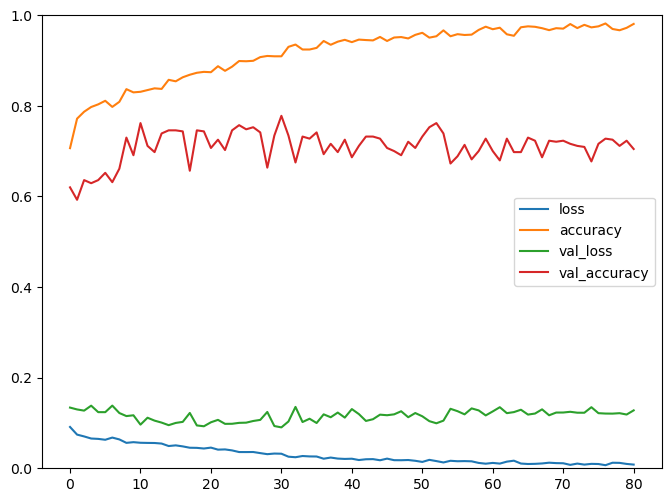

### Results auf test data ###
Accuracy for person  21 :  0.5357142857142857
[[12  9  7  0]
 [ 0 25  3  0]
 [ 0 24  4  0]
 [ 0  9  0 19]]
Epoch 1/500
197/197 - 0s - loss: 0.0922 - accuracy: 0.7077 - val_loss: 0.1230 - val_accuracy: 0.6865
Epoch 2/500
197/197 - 0s - loss: 0.0754 - accuracy: 0.7657 - val_loss: 0.1090 - val_accuracy: 0.7048
Epoch 3/500
197/197 - 0s - loss: 0.0709 - accuracy: 0.7863 - val_loss: 0.1127 - val_accuracy: 0.6979
Epoch 4/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7947 - val_loss: 0.1200 - val_accuracy: 0.6934
Epoch 5/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.8006 - val_loss: 0.1091 - val_accuracy: 0.7208
Epoch 6/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8051 - val_loss: 0.1019 - val_accuracy: 0.7574
Epoch 7/500
197/197 - 0s - loss: 0.0617 - accuracy: 0.8095 - val_loss: 0.1142 - val_accuracy: 0.7208
Epoch 8/500
197/197 - 0s - loss: 0.0606 - accuracy: 0.8201 - val_loss: 0.1034 - val_accuracy: 0.7323
Epoch 9/500
197/197 - 0s - loss: 0.0575 - accuracy: 0.8

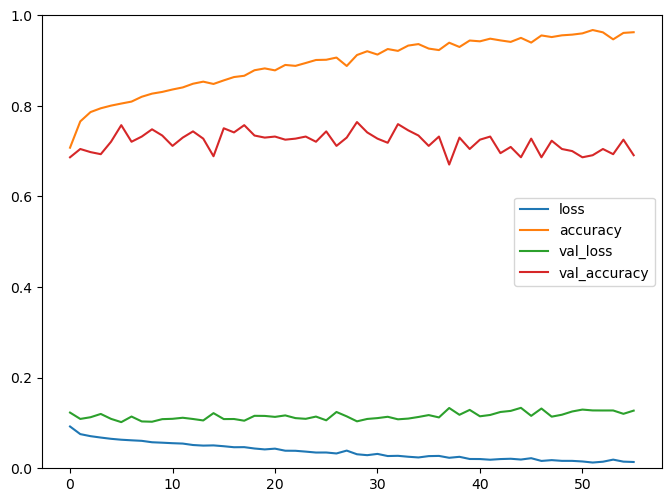

### Results auf test data ###
Accuracy for person  22 :  0.6785714285714286
[[28  0  0  0]
 [ 1  8  7 12]
 [13  3 12  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0943 - accuracy: 0.7003 - val_loss: 0.1307 - val_accuracy: 0.6316
Epoch 2/500
197/197 - 0s - loss: 0.0807 - accuracy: 0.7492 - val_loss: 0.0858 - val_accuracy: 0.7620
Epoch 3/500
197/197 - 0s - loss: 0.0703 - accuracy: 0.7856 - val_loss: 0.1300 - val_accuracy: 0.6293
Epoch 4/500
197/197 - 0s - loss: 0.0717 - accuracy: 0.7810 - val_loss: 0.1195 - val_accuracy: 0.6705
Epoch 5/500
197/197 - 0s - loss: 0.0708 - accuracy: 0.7840 - val_loss: 0.0921 - val_accuracy: 0.7414
Epoch 6/500
197/197 - 0s - loss: 0.0653 - accuracy: 0.7988 - val_loss: 0.0996 - val_accuracy: 0.6957
Epoch 7/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8133 - val_loss: 0.1026 - val_accuracy: 0.7185
Epoch 8/500
197/197 - 0s - loss: 0.0622 - accuracy: 0.8125 - val_loss: 0.0999 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0586 - accuracy: 0.8

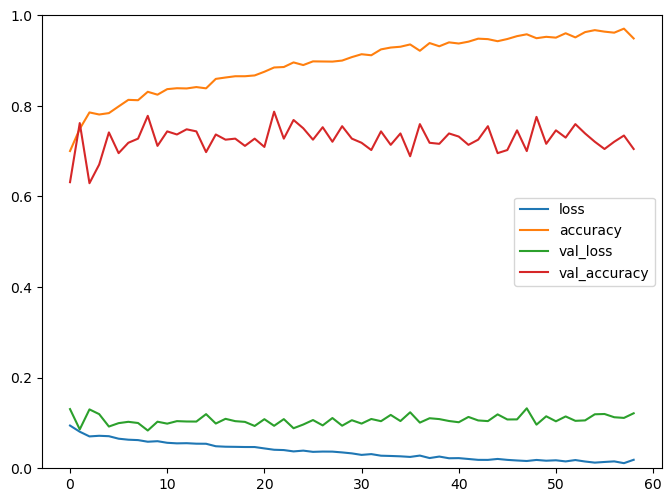

### Results auf test data ###
Accuracy for person  23 :  0.7410714285714286
[[28  0  0  0]
 [ 0 17  7  4]
 [ 3 13 11  1]
 [ 0  1  0 27]]
Epoch 1/500
197/197 - 0s - loss: 0.0926 - accuracy: 0.7125 - val_loss: 0.1612 - val_accuracy: 0.5332
Epoch 2/500
197/197 - 0s - loss: 0.0747 - accuracy: 0.7698 - val_loss: 0.1152 - val_accuracy: 0.7300
Epoch 3/500
197/197 - 0s - loss: 0.0689 - accuracy: 0.8011 - val_loss: 0.0995 - val_accuracy: 0.7666
Epoch 4/500
197/197 - 0s - loss: 0.0678 - accuracy: 0.7957 - val_loss: 0.1086 - val_accuracy: 0.6682
Epoch 5/500
197/197 - 0s - loss: 0.0681 - accuracy: 0.8001 - val_loss: 0.0930 - val_accuracy: 0.7551
Epoch 6/500
197/197 - 0s - loss: 0.0666 - accuracy: 0.8031 - val_loss: 0.1057 - val_accuracy: 0.7140
Epoch 7/500
197/197 - 0s - loss: 0.0603 - accuracy: 0.8224 - val_loss: 0.1018 - val_accuracy: 0.7140
Epoch 8/500
197/197 - 0s - loss: 0.0613 - accuracy: 0.8214 - val_loss: 0.1021 - val_accuracy: 0.7185
Epoch 9/500
197/197 - 0s - loss: 0.0631 - accuracy: 0.8

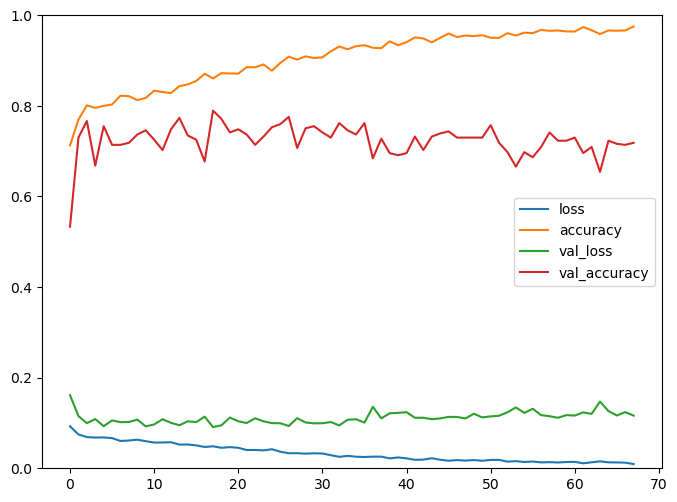

### Results auf test data ###
Accuracy for person  24 :  0.6875
[[28  0  0  0]
 [ 7 17  4  0]
 [14 10  4  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0947 - accuracy: 0.6952 - val_loss: 0.1110 - val_accuracy: 0.6590
Epoch 2/500
197/197 - 0s - loss: 0.0742 - accuracy: 0.7738 - val_loss: 0.1105 - val_accuracy: 0.7002
Epoch 3/500
197/197 - 0s - loss: 0.0707 - accuracy: 0.7822 - val_loss: 0.1322 - val_accuracy: 0.6499
Epoch 4/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7838 - val_loss: 0.0914 - val_accuracy: 0.7071
Epoch 5/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8041 - val_loss: 0.0857 - val_accuracy: 0.7368
Epoch 6/500
197/197 - 0s - loss: 0.0634 - accuracy: 0.8090 - val_loss: 0.1079 - val_accuracy: 0.7208
Epoch 7/500
197/197 - 0s - loss: 0.0619 - accuracy: 0.8125 - val_loss: 0.1097 - val_accuracy: 0.6705
Epoch 8/500
197/197 - 0s - loss: 0.0587 - accuracy: 0.8263 - val_loss: 0.1086 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8270 - val_lo

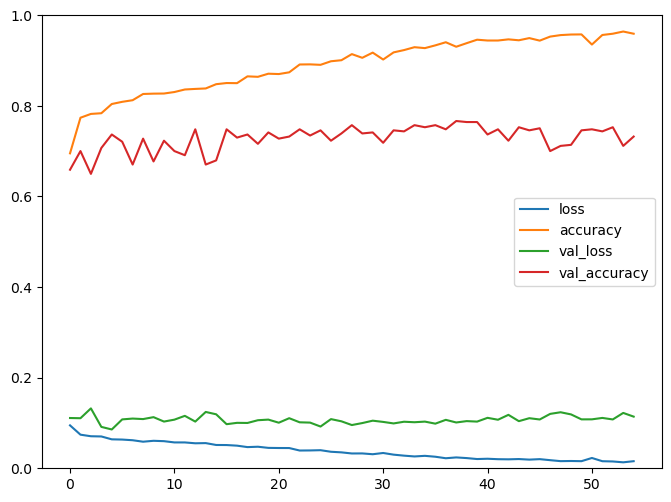

### Results auf test data ###
Accuracy for person  25 :  0.5803571428571429
[[21  0  7  0]
 [ 0 28  0  0]
 [ 0 14 14  0]
 [ 0  0 26  2]]
Epoch 1/500
197/197 - 0s - loss: 0.0916 - accuracy: 0.6996 - val_loss: 0.1165 - val_accuracy: 0.6224
Epoch 2/500
197/197 - 0s - loss: 0.0747 - accuracy: 0.7746 - val_loss: 0.1325 - val_accuracy: 0.6476
Epoch 3/500
197/197 - 0s - loss: 0.0739 - accuracy: 0.7759 - val_loss: 0.1062 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0676 - accuracy: 0.7960 - val_loss: 0.1011 - val_accuracy: 0.7391
Epoch 5/500
197/197 - 0s - loss: 0.0671 - accuracy: 0.7970 - val_loss: 0.0971 - val_accuracy: 0.7231
Epoch 6/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.8059 - val_loss: 0.1192 - val_accuracy: 0.6773
Epoch 7/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8077 - val_loss: 0.0935 - val_accuracy: 0.7483
Epoch 8/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8265 - val_loss: 0.1495 - val_accuracy: 0.6087
Epoch 9/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8

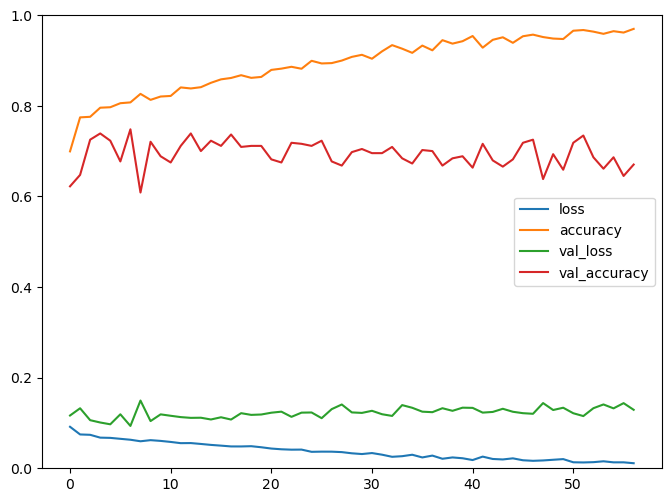

### Results auf test data ###
Accuracy for person  26 :  0.7053571428571429
[[28  0  0  0]
 [ 5 21  2  0]
 [14 12  2  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0961 - accuracy: 0.6848 - val_loss: 0.1138 - val_accuracy: 0.6156
Epoch 2/500
197/197 - 0s - loss: 0.0782 - accuracy: 0.7583 - val_loss: 0.1226 - val_accuracy: 0.6636
Epoch 3/500
197/197 - 0s - loss: 0.0725 - accuracy: 0.7812 - val_loss: 0.1433 - val_accuracy: 0.6339
Epoch 4/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7927 - val_loss: 0.1217 - val_accuracy: 0.7254
Epoch 5/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7973 - val_loss: 0.1082 - val_accuracy: 0.7048
Epoch 6/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.8006 - val_loss: 0.1161 - val_accuracy: 0.6682
Epoch 7/500
197/197 - 0s - loss: 0.0641 - accuracy: 0.8079 - val_loss: 0.1077 - val_accuracy: 0.6957
Epoch 8/500
197/197 - 0s - loss: 0.0605 - accuracy: 0.8222 - val_loss: 0.0963 - val_accuracy: 0.7346
Epoch 9/500
197/197 - 0s - loss: 0.0615 - accuracy: 0.8

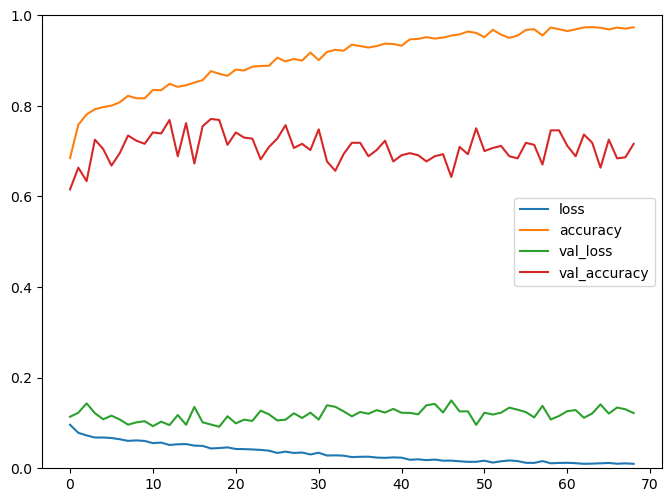

### Results auf test data ###
Accuracy for person  27 :  0.8214285714285714
[[22  0  6  0]
 [ 0 14 14  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0928 - accuracy: 0.6985 - val_loss: 0.1428 - val_accuracy: 0.5950
Epoch 2/500
197/197 - 0s - loss: 0.0737 - accuracy: 0.7749 - val_loss: 0.0946 - val_accuracy: 0.6888
Epoch 3/500
197/197 - 0s - loss: 0.0741 - accuracy: 0.7807 - val_loss: 0.1097 - val_accuracy: 0.7254
Epoch 4/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7906 - val_loss: 0.1088 - val_accuracy: 0.7048
Epoch 5/500
197/197 - 0s - loss: 0.0647 - accuracy: 0.8115 - val_loss: 0.1136 - val_accuracy: 0.6659
Epoch 6/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8209 - val_loss: 0.0942 - val_accuracy: 0.7048
Epoch 7/500
197/197 - 0s - loss: 0.0625 - accuracy: 0.8140 - val_loss: 0.0962 - val_accuracy: 0.7300
Epoch 8/500
197/197 - 0s - loss: 0.0575 - accuracy: 0.8308 - val_loss: 0.0966 - val_accuracy: 0.7323
Epoch 9/500
197/197 - 0s - loss: 0.0585 - accuracy: 0.8

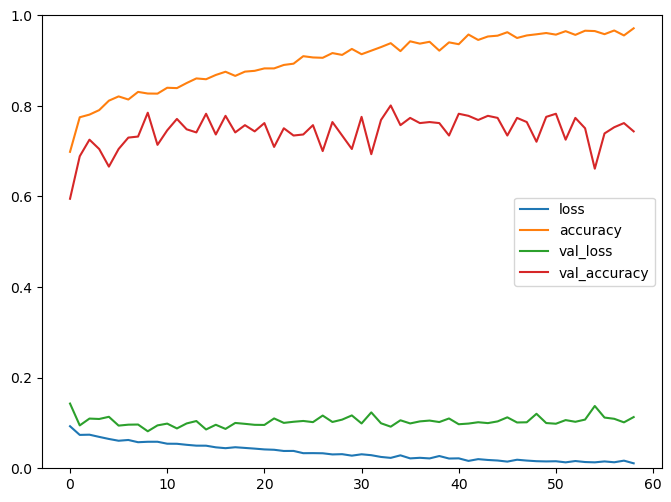

### Results auf test data ###
Accuracy for person  28 :  0.5892857142857143
[[25  3  0  0]
 [ 0  7 21  0]
 [ 3 19  6  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0920 - accuracy: 0.7092 - val_loss: 0.1067 - val_accuracy: 0.7643
Epoch 2/500
197/197 - 0s - loss: 0.0734 - accuracy: 0.7703 - val_loss: 0.0896 - val_accuracy: 0.7483
Epoch 3/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7871 - val_loss: 0.0992 - val_accuracy: 0.7162
Epoch 4/500
197/197 - 0s - loss: 0.0685 - accuracy: 0.7990 - val_loss: 0.1194 - val_accuracy: 0.6133
Epoch 5/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.8023 - val_loss: 0.0956 - val_accuracy: 0.7185
Epoch 6/500
197/197 - 0s - loss: 0.0624 - accuracy: 0.8133 - val_loss: 0.1038 - val_accuracy: 0.7483
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8128 - val_loss: 0.1185 - val_accuracy: 0.6888
Epoch 8/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8245 - val_loss: 0.1091 - val_accuracy: 0.7185
Epoch 9/500
197/197 - 0s - loss: 0.0598 - accuracy: 0.8

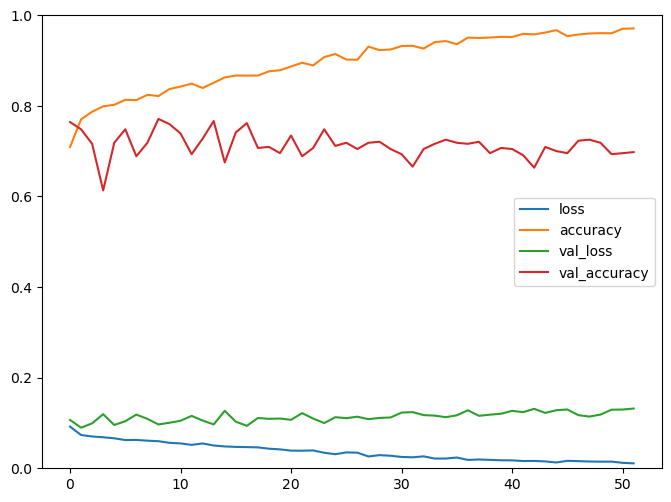

### Results auf test data ###
Accuracy for person  29 :  0.6428571428571429
[[15 13  0  0]
 [ 0 28  0  0]
 [ 0 25  1  2]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0947 - accuracy: 0.6889 - val_loss: 0.1342 - val_accuracy: 0.6041
Epoch 2/500
197/197 - 0s - loss: 0.0798 - accuracy: 0.7525 - val_loss: 0.1258 - val_accuracy: 0.6522
Epoch 3/500
197/197 - 0s - loss: 0.0752 - accuracy: 0.7721 - val_loss: 0.1034 - val_accuracy: 0.7025
Epoch 4/500
197/197 - 0s - loss: 0.0711 - accuracy: 0.7873 - val_loss: 0.1091 - val_accuracy: 0.6888
Epoch 5/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7911 - val_loss: 0.0993 - val_accuracy: 0.7551
Epoch 6/500
197/197 - 0s - loss: 0.0677 - accuracy: 0.7934 - val_loss: 0.0950 - val_accuracy: 0.7414
Epoch 7/500
197/197 - 0s - loss: 0.0635 - accuracy: 0.8128 - val_loss: 0.1064 - val_accuracy: 0.6888
Epoch 8/500
197/197 - 0s - loss: 0.0630 - accuracy: 0.8107 - val_loss: 0.1027 - val_accuracy: 0.7277
Epoch 9/500
197/197 - 0s - loss: 0.0619 - accuracy: 0.8

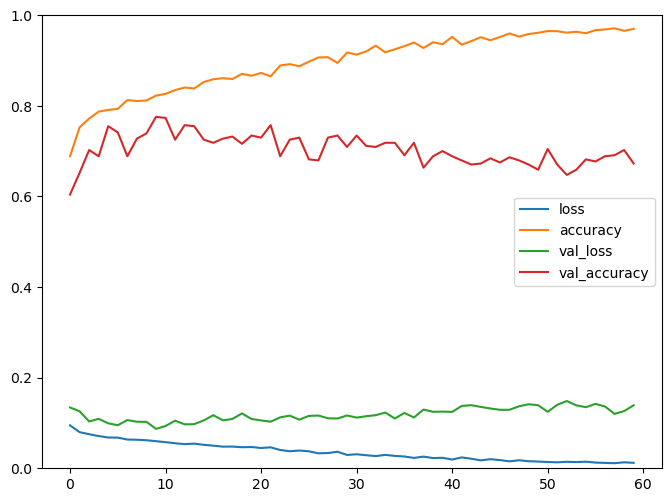

### Results auf test data ###
Accuracy for person  30 :  0.8839285714285714
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 13 15  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0949 - accuracy: 0.6963 - val_loss: 0.1233 - val_accuracy: 0.6773
Epoch 2/500
197/197 - 0s - loss: 0.0760 - accuracy: 0.7723 - val_loss: 0.1252 - val_accuracy: 0.6476
Epoch 3/500
197/197 - 0s - loss: 0.0721 - accuracy: 0.7817 - val_loss: 0.1077 - val_accuracy: 0.7346
Epoch 4/500
197/197 - 0s - loss: 0.0711 - accuracy: 0.7891 - val_loss: 0.1069 - val_accuracy: 0.7094
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.8018 - val_loss: 0.1043 - val_accuracy: 0.6934
Epoch 6/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8110 - val_loss: 0.1153 - val_accuracy: 0.6705
Epoch 7/500
197/197 - 0s - loss: 0.0657 - accuracy: 0.7978 - val_loss: 0.0974 - val_accuracy: 0.7689
Epoch 8/500
197/197 - 0s - loss: 0.0595 - accuracy: 0.8280 - val_loss: 0.0987 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0601 - accuracy: 0.8

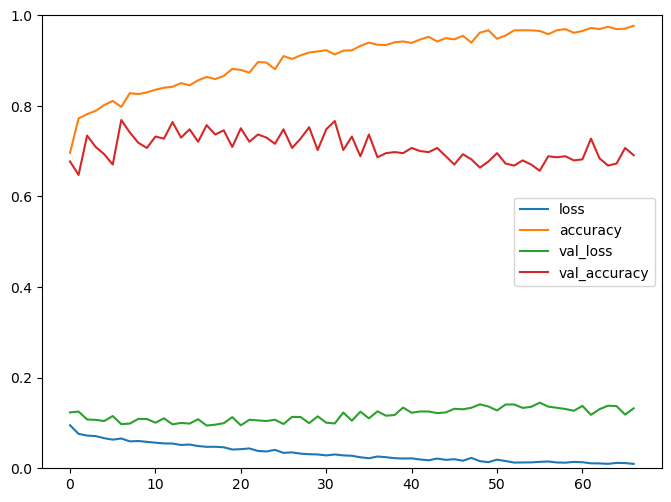

### Results auf test data ###
Accuracy for person  31 :  0.75
[[28  0  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0936 - accuracy: 0.7049 - val_loss: 0.1207 - val_accuracy: 0.6590
Epoch 2/500
197/197 - 0s - loss: 0.0744 - accuracy: 0.7797 - val_loss: 0.1251 - val_accuracy: 0.6568
Epoch 3/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7800 - val_loss: 0.1082 - val_accuracy: 0.7483
Epoch 4/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7967 - val_loss: 0.1044 - val_accuracy: 0.7437
Epoch 5/500
197/197 - 0s - loss: 0.0680 - accuracy: 0.7914 - val_loss: 0.0985 - val_accuracy: 0.7574
Epoch 6/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8023 - val_loss: 0.1097 - val_accuracy: 0.6934
Epoch 7/500
197/197 - 0s - loss: 0.0626 - accuracy: 0.8153 - val_loss: 0.1117 - val_accuracy: 0.7002
Epoch 8/500
197/197 - 0s - loss: 0.0650 - accuracy: 0.8069 - val_loss: 0.1041 - val_accuracy: 0.7391
Epoch 9/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8222 - val_loss

Model: "sequential_237"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
hidden0_180nodes (Dense)     (None, 180)               33300     
_________________________________________________________________
hidden1_180nodes (Dense)     (None, 180)               32580     
_________________________________________________________________
hidden2_180nodes (Dense)     (None, 180)               32580     
_________________________________________________________________
output_softmax (Dense)       (None, 4)                 724       
Total params: 99,184
Trainable params: 99,184
Non-trainable params: 0
_________________________________________________________________


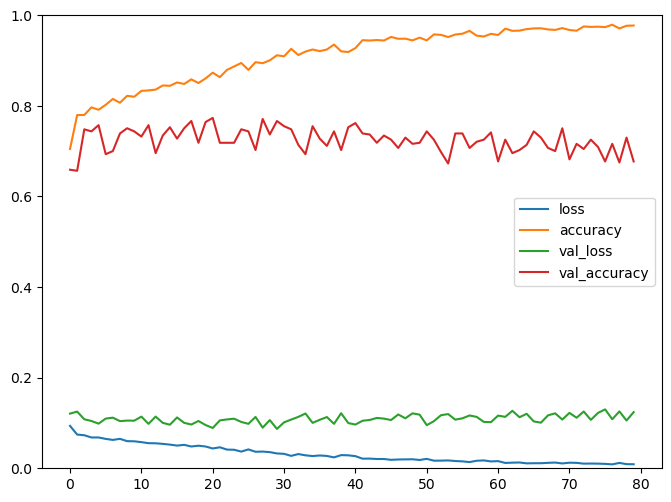

### Results auf test data ###
Accuracy for person  32 :  0.7678571428571429
[[19  9  0  0]
 [ 0 28  0  0]
 [ 0 17 11  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0937 - accuracy: 0.7001 - val_loss: 0.1200 - val_accuracy: 0.6499
Epoch 2/500
197/197 - 0s - loss: 0.0740 - accuracy: 0.7754 - val_loss: 0.1228 - val_accuracy: 0.6430
Epoch 3/500
197/197 - 0s - loss: 0.0696 - accuracy: 0.7932 - val_loss: 0.0950 - val_accuracy: 0.7483
Epoch 4/500
197/197 - 0s - loss: 0.0698 - accuracy: 0.7945 - val_loss: 0.1179 - val_accuracy: 0.6522
Epoch 5/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7914 - val_loss: 0.1020 - val_accuracy: 0.6934
Epoch 6/500
197/197 - 0s - loss: 0.0639 - accuracy: 0.8102 - val_loss: 0.1037 - val_accuracy: 0.7140
Epoch 7/500
197/197 - 0s - loss: 0.0618 - accuracy: 0.8148 - val_loss: 0.1014 - val_accuracy: 0.6911
Epoch 8/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8240 - val_loss: 0.1046 - val_accuracy: 0.7414
Epoch 9/500
197/197 - 0s - loss: 0.0575 - accuracy: 0.8

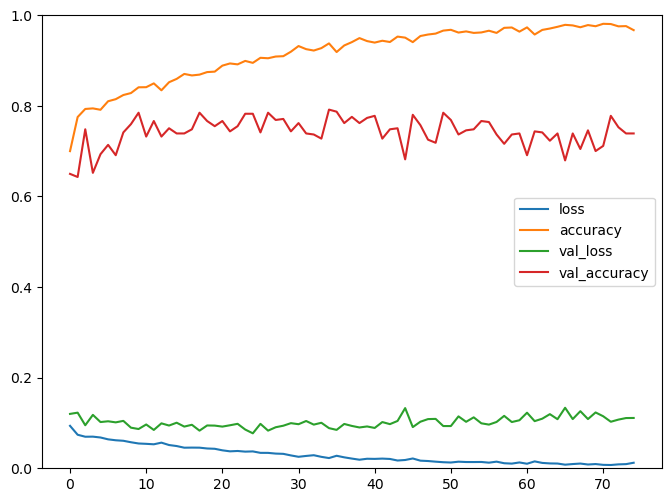

### Results auf test data ###
Accuracy for person  33 :  0.6428571428571429
[[28  0  0  0]
 [ 4 16  8  0]
 [14 14  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0948 - accuracy: 0.6991 - val_loss: 0.1238 - val_accuracy: 0.6613
Epoch 2/500
197/197 - 0s - loss: 0.0773 - accuracy: 0.7642 - val_loss: 0.1198 - val_accuracy: 0.6773
Epoch 3/500
197/197 - 0s - loss: 0.0700 - accuracy: 0.7845 - val_loss: 0.1187 - val_accuracy: 0.6865
Epoch 4/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7891 - val_loss: 0.1215 - val_accuracy: 0.6590
Epoch 5/500
197/197 - 0s - loss: 0.0664 - accuracy: 0.8044 - val_loss: 0.1095 - val_accuracy: 0.6865
Epoch 6/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8123 - val_loss: 0.1131 - val_accuracy: 0.6636
Epoch 7/500
197/197 - 0s - loss: 0.0610 - accuracy: 0.8201 - val_loss: 0.1306 - val_accuracy: 0.6522
Epoch 8/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8207 - val_loss: 0.1038 - val_accuracy: 0.7460
Epoch 9/500
197/197 - 0s - loss: 0.0618 - accuracy: 0.8

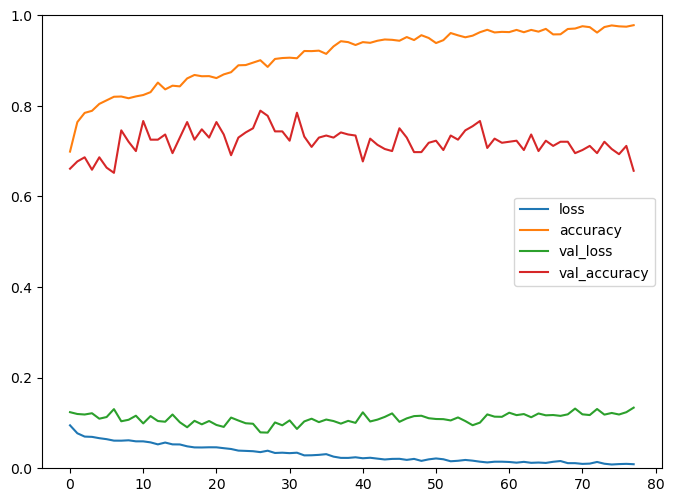

### Results auf test data ###
Accuracy for person  34 :  0.8035714285714286
[[27  0  1  0]
 [ 0  7 21  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0913 - accuracy: 0.7057 - val_loss: 0.1037 - val_accuracy: 0.7460
Epoch 2/500
197/197 - 0s - loss: 0.0761 - accuracy: 0.7642 - val_loss: 0.1316 - val_accuracy: 0.6293
Epoch 3/500
197/197 - 0s - loss: 0.0693 - accuracy: 0.7883 - val_loss: 0.1064 - val_accuracy: 0.7140
Epoch 4/500
197/197 - 0s - loss: 0.0691 - accuracy: 0.7911 - val_loss: 0.0888 - val_accuracy: 0.7666
Epoch 5/500
197/197 - 0s - loss: 0.0661 - accuracy: 0.8028 - val_loss: 0.0936 - val_accuracy: 0.7643
Epoch 6/500
197/197 - 0s - loss: 0.0660 - accuracy: 0.8018 - val_loss: 0.0930 - val_accuracy: 0.7071
Epoch 7/500
197/197 - 0s - loss: 0.0632 - accuracy: 0.8112 - val_loss: 0.1065 - val_accuracy: 0.7391
Epoch 8/500
197/197 - 0s - loss: 0.0621 - accuracy: 0.8158 - val_loss: 0.1129 - val_accuracy: 0.7208
Epoch 9/500
197/197 - 0s - loss: 0.0591 - accuracy: 0.8

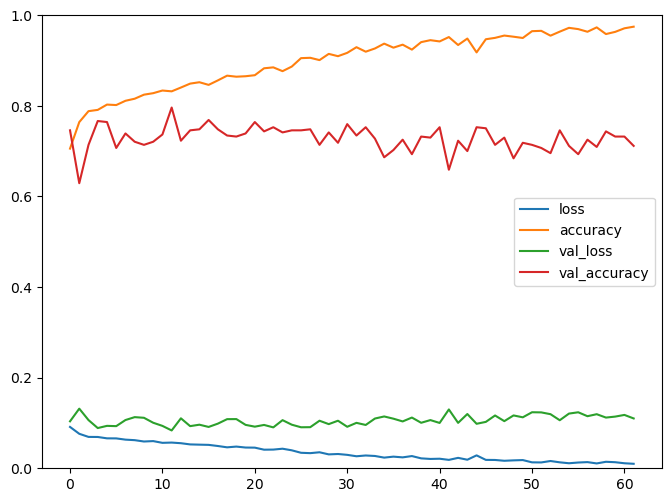

### Results auf test data ###
Accuracy for person  35 :  0.8660714285714286
[[21  0  7  0]
 [ 0 25  3  0]
 [ 0  3 25  0]
 [ 0  0  2 26]]
Epoch 1/500
197/197 - 0s - loss: 0.0940 - accuracy: 0.7003 - val_loss: 0.1285 - val_accuracy: 0.6156
Epoch 2/500
197/197 - 0s - loss: 0.0753 - accuracy: 0.7738 - val_loss: 0.1221 - val_accuracy: 0.6659
Epoch 3/500
197/197 - 0s - loss: 0.0732 - accuracy: 0.7733 - val_loss: 0.1211 - val_accuracy: 0.6819
Epoch 4/500
197/197 - 0s - loss: 0.0729 - accuracy: 0.7774 - val_loss: 0.1073 - val_accuracy: 0.7071
Epoch 5/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.8011 - val_loss: 0.1021 - val_accuracy: 0.7025
Epoch 6/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8023 - val_loss: 0.0870 - val_accuracy: 0.7780
Epoch 7/500
197/197 - 0s - loss: 0.0654 - accuracy: 0.8067 - val_loss: 0.0902 - val_accuracy: 0.7712
Epoch 8/500
197/197 - 0s - loss: 0.0637 - accuracy: 0.8097 - val_loss: 0.1086 - val_accuracy: 0.6865
Epoch 9/500
197/197 - 0s - loss: 0.0592 - accuracy: 0.8

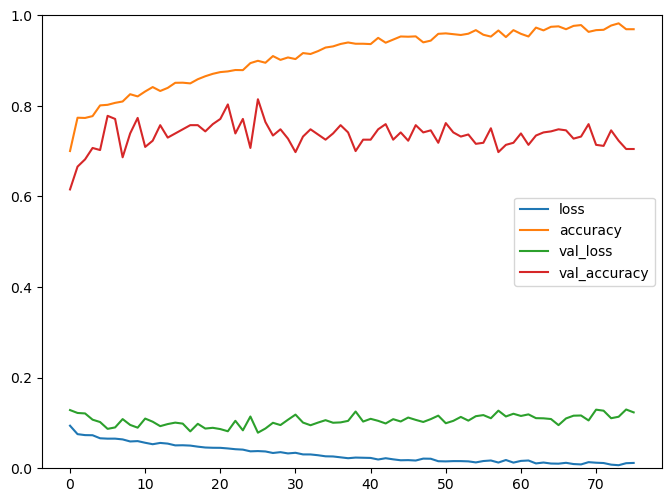

### Results auf test data ###
Accuracy for person  36 :  0.75
[[28  0  0  0]
 [ 0 28  0  0]
 [ 1 27  0  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0921 - accuracy: 0.7013 - val_loss: 0.1134 - val_accuracy: 0.6865
Epoch 2/500
197/197 - 0s - loss: 0.0756 - accuracy: 0.7675 - val_loss: 0.1029 - val_accuracy: 0.7002
Epoch 3/500
197/197 - 0s - loss: 0.0722 - accuracy: 0.7787 - val_loss: 0.1134 - val_accuracy: 0.7071
Epoch 4/500
197/197 - 0s - loss: 0.0700 - accuracy: 0.7840 - val_loss: 0.1037 - val_accuracy: 0.7048
Epoch 5/500
197/197 - 0s - loss: 0.0704 - accuracy: 0.7807 - val_loss: 0.0975 - val_accuracy: 0.7048
Epoch 6/500
197/197 - 0s - loss: 0.0702 - accuracy: 0.7955 - val_loss: 0.1041 - val_accuracy: 0.7826
Epoch 7/500
197/197 - 0s - loss: 0.0623 - accuracy: 0.8077 - val_loss: 0.1119 - val_accuracy: 0.6751
Epoch 8/500
197/197 - 0s - loss: 0.0619 - accuracy: 0.8095 - val_loss: 0.1020 - val_accuracy: 0.7551
Epoch 9/500
197/197 - 0s - loss: 0.0596 - accuracy: 0.8288 - val_loss

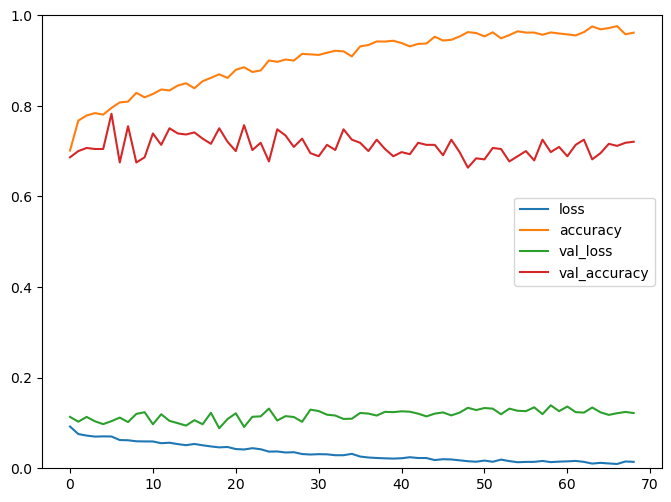

### Results auf test data ###
Accuracy for person  37 :  0.7857142857142857
[[28  0  0  0]
 [ 3  4 21  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0917 - accuracy: 0.7097 - val_loss: 0.1112 - val_accuracy: 0.6476
Epoch 2/500
197/197 - 0s - loss: 0.0776 - accuracy: 0.7680 - val_loss: 0.1187 - val_accuracy: 0.6682
Epoch 3/500
197/197 - 0s - loss: 0.0721 - accuracy: 0.7820 - val_loss: 0.1137 - val_accuracy: 0.7231
Epoch 4/500
197/197 - 0s - loss: 0.0679 - accuracy: 0.7952 - val_loss: 0.1124 - val_accuracy: 0.6522
Epoch 5/500
197/197 - 0s - loss: 0.0692 - accuracy: 0.7889 - val_loss: 0.1305 - val_accuracy: 0.6430
Epoch 6/500
197/197 - 0s - loss: 0.0662 - accuracy: 0.8016 - val_loss: 0.1015 - val_accuracy: 0.7666
Epoch 7/500
197/197 - 0s - loss: 0.0649 - accuracy: 0.8062 - val_loss: 0.0991 - val_accuracy: 0.7231
Epoch 8/500
197/197 - 0s - loss: 0.0607 - accuracy: 0.8176 - val_loss: 0.1072 - val_accuracy: 0.7162
Epoch 9/500
197/197 - 0s - loss: 0.0640 - accuracy: 0.8

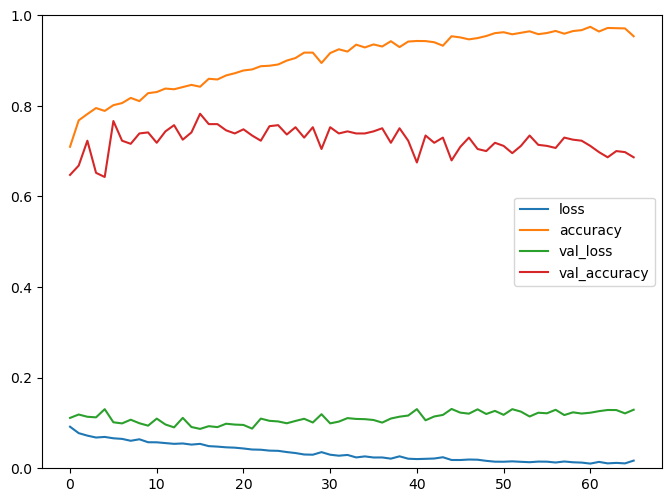

### Results auf test data ###
Accuracy for person  38 :  0.9107142857142857
[[28  0  0  0]
 [ 0 18 10  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
Epoch 1/500
197/197 - 0s - loss: 0.0972 - accuracy: 0.6947 - val_loss: 0.0578 - val_accuracy: 0.8055
Epoch 2/500
197/197 - 0s - loss: 0.0766 - accuracy: 0.7728 - val_loss: 0.0573 - val_accuracy: 0.8146
Epoch 3/500
197/197 - 0s - loss: 0.0728 - accuracy: 0.7769 - val_loss: 0.0501 - val_accuracy: 0.8490
Epoch 4/500
197/197 - 0s - loss: 0.0701 - accuracy: 0.7840 - val_loss: 0.0568 - val_accuracy: 0.8055
Epoch 5/500
197/197 - 0s - loss: 0.0682 - accuracy: 0.7950 - val_loss: 0.0519 - val_accuracy: 0.8307
Epoch 6/500
197/197 - 0s - loss: 0.0669 - accuracy: 0.8013 - val_loss: 0.0620 - val_accuracy: 0.8055
Epoch 7/500
197/197 - 0s - loss: 0.0643 - accuracy: 0.8026 - val_loss: 0.0688 - val_accuracy: 0.7941
Epoch 8/500
197/197 - 0s - loss: 0.0609 - accuracy: 0.8105 - val_loss: 0.0597 - val_accuracy: 0.8146
Epoch 9/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.8

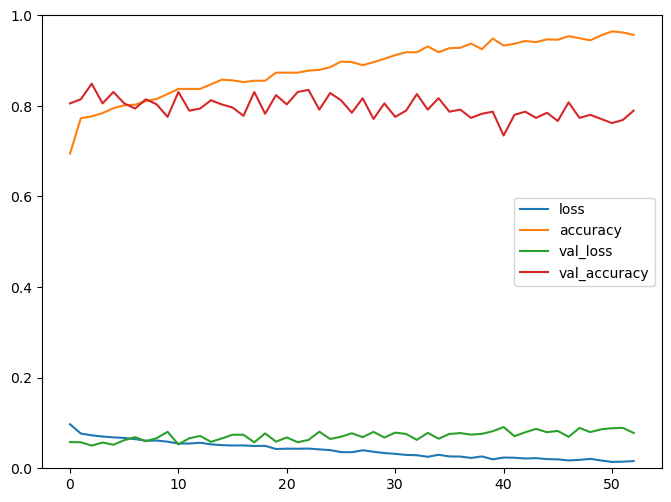

### Results auf test data ###
Accuracy for person  39 :  0.29464285714285715
[[ 9 19  0  0]
 [ 0 16  0 12]
 [ 0 19  0  9]
 [ 0 20  0  8]]
Epoch 1/500
197/197 - 0s - loss: 0.0935 - accuracy: 0.7047 - val_loss: 0.1220 - val_accuracy: 0.6568
Epoch 2/500
197/197 - 0s - loss: 0.0758 - accuracy: 0.7680 - val_loss: 0.1220 - val_accuracy: 0.6453
Epoch 3/500
197/197 - 0s - loss: 0.0728 - accuracy: 0.7817 - val_loss: 0.1323 - val_accuracy: 0.5950
Epoch 4/500
197/197 - 0s - loss: 0.0708 - accuracy: 0.7932 - val_loss: 0.1194 - val_accuracy: 0.7185
Epoch 5/500
197/197 - 0s - loss: 0.0683 - accuracy: 0.7909 - val_loss: 0.1161 - val_accuracy: 0.7117
Epoch 6/500
197/197 - 0s - loss: 0.0668 - accuracy: 0.8006 - val_loss: 0.1012 - val_accuracy: 0.7963
Epoch 7/500
197/197 - 0s - loss: 0.0599 - accuracy: 0.8227 - val_loss: 0.0996 - val_accuracy: 0.7254
Epoch 8/500
197/197 - 0s - loss: 0.0608 - accuracy: 0.8171 - val_loss: 0.1208 - val_accuracy: 0.7025
Epoch 9/500
197/197 - 0s - loss: 0.0612 - accuracy: 0.

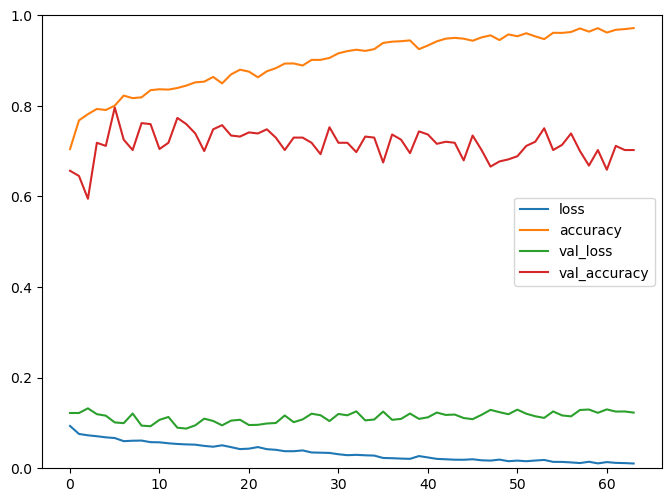

### Results auf test data ###
Accuracy for person  40 :  0.7410714285714286
[[28  0  0  0]
 [ 0 21  7  0]
 [ 8 14  6  0]
 [ 0  0  0 28]]

 ##### overall accuracy:  0.7439732142857143 #####


In [69]:
# Ergebnis auf b)

accuracies = testANN_b(hp_ann_big, n_attributes, n_classes)
results_b_fs[1] = accuracies

## Random Forest nach Feature Selection

In [70]:
## train test split
train_data, test_data, train_labels_raw, test_labels_raw = train_test_split(
                      data_input, data_labels_raw, test_size = 0.1, random_state=123)

## preprocessing: scale data to make sure each feature has equal influence
#scaler = StandardScaler().fit(train_data)  # z-score
scaler = MinMaxScaler().fit(train_data)

train_data = scaler.transform(train_data)
test_data = scaler.transform(test_data)

## one-hot-encoding 
encoder = LabelBinarizer().fit(train_labels_raw)

train_labels = encoder.transform(train_labels_raw)
test_labels = encoder.transform(test_labels_raw)

In [71]:
rfc = RandomForestClassifier(n_estimators=200, max_depth=8, max_features = 'auto', criterion = 'gini')
model = rfc.fit(train_data,train_labels)

In [72]:
# classification of test set
print("######## Results auf test data #########")

predictions = np.argmax(model.predict(test_data), axis=-1)
cm= confusion_matrix(test_labels_raw, predictions+1)
acc = accuracy_score(test_labels_raw, predictions+1) 

print("Accuracy (test): ", acc)
print(cm)
results_a_fs[2] = acc

######## Results auf test data #########
Accuracy (test):  0.8705357142857143
[[101   2   4   0]
 [ 11  90   7   0]
 [ 12  19  75   0]
 [  3   0   0 124]]


In [73]:
loocv_test = list()
loocv_train = list()

for i in range(1, 41):
    loocv_test.append(data[data['Person'] == i])
    loocv_train.append(data[data['Person'] != i])


accuracies = list()

for i in range(40):
    train_data = loocv_train[i].drop(['Person', 'class'], axis = 1)
    train_labels_raw = loocv_train[i]['class']
    test_data = loocv_test[i].drop(['Person', 'class'], axis = 1)
    test_labels_raw = loocv_test[i]['class']
    
    
    ## one-hot-encoding 
    encoder = LabelBinarizer().fit(train_labels_raw)
    train_labels = encoder.transform(train_labels_raw)
    test_labels = encoder.transform(test_labels_raw)
 
    
    clf = RandomForestClassifier(n_estimators=200, max_depth=8, max_features = 'auto', criterion = 'gini')
    model = clf.fit(train_data,train_labels)
    

    # classification of test set
    print("### Results auf test data ###")
    pred = model.predict(test_data)
    predictions = np.argmax(model.predict(test_data), axis=-1)  # neural network outputs to classes
    cm = confusion_matrix(test_labels_raw, predictions+1)

    acc = accuracy_score(test_labels_raw, predictions+1)
    accuracies.append(acc)
    print("Accuracy for person ", i+1, ": ", acc)
    print(cm)
    
    del model
    
print('\n ##### overall accuracy: ', np.mean(accuracies), '#####')

### Results auf test data ###
Accuracy for person  1 :  0.7053571428571429
[[21  7  0  0]
 [ 0 28  0  0]
 [ 1 25  2  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  2 :  0.8571428571428571
[[26  0  2  0]
 [ 2 17  9  0]
 [ 3  0 25  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  3 :  0.8214285714285714
[[26  2  0  0]
 [ 4 16  8  0]
 [ 1  4 23  0]
 [ 1  0  0 27]]
### Results auf test data ###
Accuracy for person  4 :  0.4732142857142857
[[28  0  0  0]
 [28  0  0  0]
 [28  0  0  0]
 [ 3  0  0 25]]
### Results auf test data ###
Accuracy for person  5 :  0.8482142857142857
[[28  0  0  0]
 [ 0 28  0  0]
 [11  6 11  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  6 :  0.5982142857142857
[[28  0  0  0]
 [24  4  0  0]
 [21  0  7  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  7 :  0.75
[[28  0  0  0]
 [ 4 23  1  0]
 [ 9 14  5  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  8 :  0.7321

In [74]:
results_b_fs[2] = accuracies

## XGBoost nach Feature Selection

In [82]:
# Data Preparation

data_input = data.drop(['Person', 'class'], axis = 1)
data_person = data['Person']
data_labels_raw = data['class']

## train test split
train_data, test_data, train_labels_raw, test_labels_raw = train_test_split(
                      data_input, data_labels_raw, test_size = 0.1, random_state=123)



In [83]:
xgboost = xgb.XGBClassifier(use_label_encoder=False)

In [84]:
xgboost.fit(train_data, train_labels_raw-1, )

[14:07:06] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=24, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

In [85]:
# classification of test set
print("######## Results auf test data #########")
pred = xgboost.predict(test_data)+1

cm = confusion_matrix(test_labels_raw, pred)

acc = accuracy_score(test_labels_raw, pred)
print("Accuracy (test): ", acc)
print(cm)
results_a_fs[3] = acc



######## Results auf test data #########
Accuracy (test):  0.9977678571428571
[[106   0   1   0]
 [  0 108   0   0]
 [  0   0 106   0]
 [  0   0   0 127]]


In [86]:
accuracies = testModel_b(xgboost)
results_b_fs[3] = accuracies

[14:07:08] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  1 :  0.6607142857142857
[[14 14  0  0]
 [ 0 28  0  0]
 [ 0 24  4  0]
 [ 0  0  0 28]]
[14:07:11] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  2 :  0.7857142857142857
[[26  0  2  0]
 [ 0  6 22  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
[14:07:14] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, t

### Results auf test data ###
Accuracy for person  20 :  0.8482142857142857
[[28  0  0  0]
 [ 0 28  0  0]
 [11  6 11  0]
 [ 0  0  0 28]]
[14:07:55] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  21 :  0.6875
[[17  2  9  0]
 [ 0 28  0  0]
 [ 0 24  4  0]
 [ 0  0  0 28]]
[14:07:58] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  22 :  0.7142857142857143
[[28  0  0  0]
 [ 1 16 10  1]
 [ 6 14  8  0]
 [ 0  0  0 

### Results auf test data ###
Accuracy for person  39 :  0.33035714285714285
[[28  0  0  0]
 [19  0  0  9]
 [28  0  0  0]
 [19  0  0  9]]
[14:08:36] WARNING: /tmp/build/80754af9/xgboost-split_1619724447847/work/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
### Results auf test data ###
Accuracy for person  40 :  0.5
[[28  0  0  0]
 [28  0  0  0]
 [28  0  0  0]
 [ 0  0  0 28]]

 ##### overall accuracy:  0.7551339285714286 #####


## Catboost nach Feature Selection

In [87]:
cbc = CatBoostClassifier()
cbc.fit(train_data, train_labels_raw, verbose=50)

Learning rate set to 0.084958
0:	learn: 1.2686243	total: 44.8ms	remaining: 44.7s
50:	learn: 0.3280322	total: 1.21s	remaining: 22.4s
100:	learn: 0.1984890	total: 2.41s	remaining: 21.5s
150:	learn: 0.1233405	total: 3.7s	remaining: 20.8s
200:	learn: 0.0848424	total: 4.97s	remaining: 19.7s
250:	learn: 0.0623182	total: 6.24s	remaining: 18.6s
300:	learn: 0.0480295	total: 7.49s	remaining: 17.4s
350:	learn: 0.0374822	total: 8.63s	remaining: 16s
400:	learn: 0.0302078	total: 9.8s	remaining: 14.6s
450:	learn: 0.0250822	total: 11s	remaining: 13.4s
500:	learn: 0.0211962	total: 12.2s	remaining: 12.2s
550:	learn: 0.0182482	total: 13.4s	remaining: 10.9s
600:	learn: 0.0160781	total: 14.6s	remaining: 9.69s
650:	learn: 0.0141423	total: 15.8s	remaining: 8.46s
700:	learn: 0.0125869	total: 16.9s	remaining: 7.21s
750:	learn: 0.0112691	total: 18.1s	remaining: 6s
800:	learn: 0.0102038	total: 19.3s	remaining: 4.79s
850:	learn: 0.0092231	total: 20.5s	remaining: 3.58s
900:	learn: 0.0085314	total: 21.7s	remaining:

In [88]:
# classification of test set
print("######## Results auf test data #########")
pred = cbc.predict(test_data)

cm = confusion_matrix(test_labels_raw, pred)

acc = accuracy_score(test_labels_raw, pred)
print("Accuracy (test): ", acc)
print(cm)
results_a_fs[4] = acc

######## Results auf test data #########
Accuracy (test):  1.0
[[107   0   0   0]
 [  0 108   0   0]
 [  0   0 106   0]
 [  0   0   0 127]]


In [89]:
accuracies = testModel_b(cbc)
results_b_fs[4] = accuracies

### Results auf test data ###
Accuracy for person  1 :  0.625
[[14 14  0  0]
 [ 0 28  0  0]
 [ 0 28  0  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  2 :  0.8035714285714286
[[26  0  2  0]
 [ 0  8 20  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  3 :  0.7857142857142857
[[17  9  2  0]
 [ 0 28  0  0]
 [ 0 13 15  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  4 :  0.8660714285714286
[[28  0  0  0]
 [ 2 13 13  0]
 [ 0  0 28  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  5 :  0.9017857142857143
[[28  0  0  0]
 [ 0 20  8  0]
 [ 0  3 25  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  6 :  0.7946428571428571
[[28  0  0  0]
 [ 9 19  0  0]
 [14  0 14  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  7 :  0.8125
[[28  0  0  0]
 [ 0 27  1  0]
 [ 7 13  8  0]
 [ 0  0  0 28]]
### Results auf test data ###
Accuracy for person  8 :  0.8125
[[26  2  0

# Vergleich der Ergebnisse

In [90]:
results_a

[0.9285714285714286,
 0.9642857142857143,
 0.9285714285714286,
 0.9151785714285714,
 0.8705357142857143,
 0.9977678571428571,
 1.0]

In [103]:
df_results = pd.DataFrame()
df_results['model'] = 2 * ['ann_small', 'ann_big'] + ['random forest', 'xgboost', 'catboost']
df_results['scaler'] = ['minmax', 'minmax', 'standard', 'standard', 'minmax', 'minmax', 'minmax']
df_results['accuracy_a'] = results_a
df_results['accuracy_b'] = results_b
df_results

,model,scaler,accuracy_a,accuracy_b
0,ann_small,minmax,0.928571,"[0.6785714285714286, 0.6875, 0.723214285714285..."
1,ann_big,minmax,0.964286,"[0.75, 0.7232142857142857, 0.6339285714285714,..."
2,ann_small,standard,0.928571,"[0.8482142857142857, 0.7142857142857143, 0.75,..."
3,ann_big,standard,0.915179,"[0.8482142857142857, 0.8125, 0.633928571428571..."
4,random forest,minmax,0.870536,"[0.7321428571428571, 0.8482142857142857, 0.803..."
5,xgboost,minmax,0.997768,"[0.6428571428571429, 0.7857142857142857, 0.669..."
6,catboost,minmax,1.000000,"[0.6339285714285714, 0.7857142857142857, 0.776..."


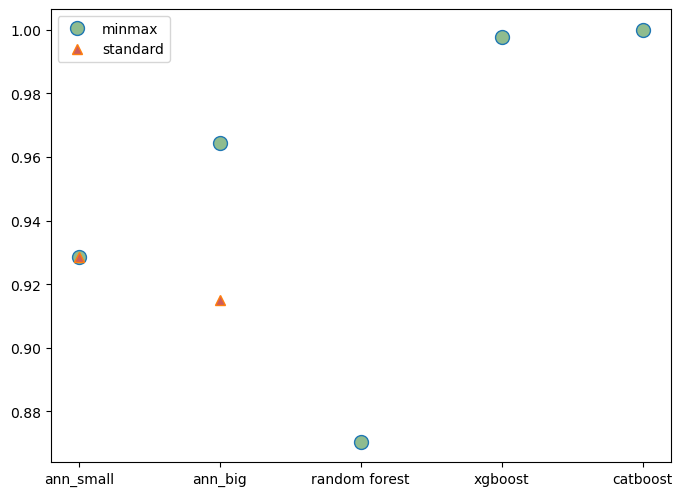

In [116]:
fig, ax = plt.subplots(figsize=(8, 6), dpi = 100)
ax.plot('model', 'accuracy_a', data=df_results[df_results['scaler']=='minmax'], linestyle='none', marker='o', 
         markerfacecolor= 'darkseagreen', markersize= '10')
ax.plot('model', 'accuracy_a', data=df_results[df_results['scaler']=='standard'], linestyle='none', marker='^', 
         markerfacecolor= 'indianred', markersize= '7')  
ax.legend(df_results['scaler'].unique())
plt.savefig('../pictures/model_comparison_a.png', dpi = 200)
plt.show()

In [118]:
import seaborn as sns

In [134]:
results_b_list = list()
for elem in results_b:
    results_b_list += elem
    
len(results_b_list)
df_results_b = pd.DataFrame()
df_results_b['model'] = np.array(['ann_small', 'ann_big', 'ann_small', 'ann_big', 'random forest', 'xgboost', 'catboost']).repeat(repeats=40)
df_results_b['scaler'] = np.array(['minmax', 'minmax', 'standard', 'standard', 'minmax', 'minmax', 'minmax']).repeat(repeats=40)
df_results_b['accuracy_b'] = results_b_list
df_results_b

,model,scaler,accuracy_b
0,ann_small,minmax,0.678571
1,ann_small,minmax,0.687500
2,ann_small,minmax,0.723214
3,ann_small,minmax,0.919643
4,ann_small,minmax,0.848214
...,...,...,...
275,catboost,minmax,0.857143
276,catboost,minmax,0.839286
277,catboost,minmax,0.875000
278,catboost,minmax,0.500000


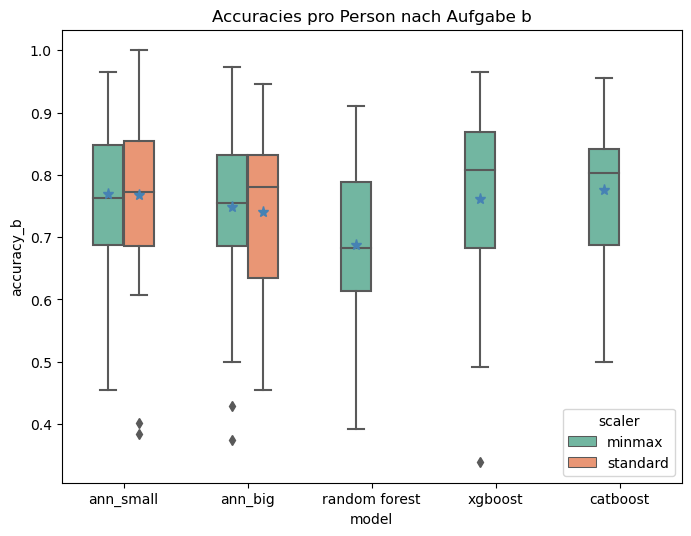

In [135]:
fig, ax = plt.subplots(figsize=(8, 6), dpi = 100)
sns.boxplot(x='model', y='accuracy_b', hue='scaler', data=df_results_b, 
            palette='Set2', width=0.5, showmeans=True,
            meanprops={"marker": "*", 
                       "markeredgecolor": "steelblue", 
                       "markerfacecolor": "steelblue",
                       "markersize": "8"})
plt.title('Accuracies pro Person nach Aufgabe b')

plt.savefig('../pictures/model_comparison_b.png', dpi = 200)
plt.show()

## Fazit
Die Ergebnisse für b sind bei allen Modellen deutlich schlechter als für a. Am besten schneidet der Catboost-Algorithmus ab, wobei die Unterschiede relativ klein sind. Am schlechtesten schnidet der Random Forest ab.
Beim Vergleich der Scaler kann man erkennen, dass nach Mittelwert der MinMaxScaler besser ist, nach Median allerdings der Standardscaler.

In [152]:
mean_b = list()
for elem in results_b:
    mean_b.append(np.mean(elem))
    
mean_b_fs = list()
for elem in results_b_fs:
    mean_b_fs.append(np.mean(elem))

In [155]:
mean_b_fs

[0.7544642857142858,
 0.7439732142857143,
 0.6939732142857142,
 0.7551339285714286,
 0.7761160714285713]

In [159]:
df_results_fs = pd.DataFrame()
df_results_fs['model'] = 2 * ['ann_small', 'ann_big'] + ['random forest', 'xgboost', 'catboost']
df_results_fs['scaler'] = ['minmax', 'minmax', 'standard', 'standard', 'minmax', 'minmax', 'minmax']

df_results_fs['accuracy_b'] = mean_b
df_results_fs['accuracy_b_fs'] = mean_b_fs[:2] + [None, None] + mean_b_fs[2:]

df_results_fs

,model,scaler,accuracy_b,accuracy_b_fs
0,ann_small,minmax,0.768750,0.754464
1,ann_big,minmax,0.747991,0.743973
2,ann_small,standard,0.767188,NaN
3,ann_big,standard,0.740179,NaN
4,random forest,minmax,0.687723,0.693973
5,xgboost,minmax,0.761830,0.755134
6,catboost,minmax,0.775893,0.776116


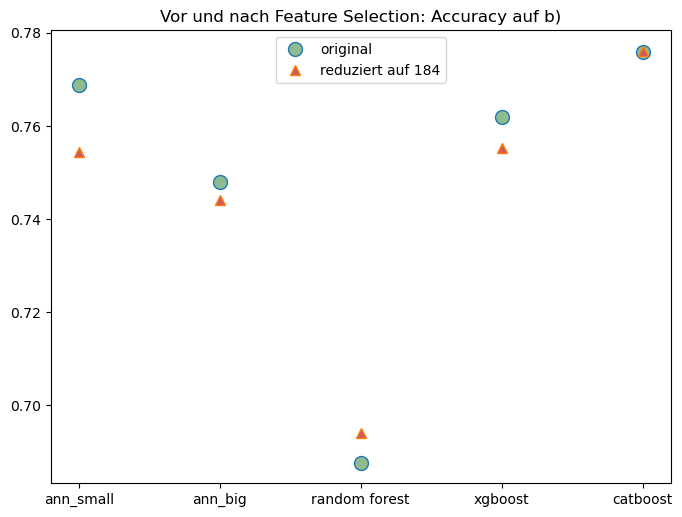

In [164]:
fig, ax = plt.subplots(figsize=(8, 6), dpi = 100)
ax.plot('model', 'accuracy_b', data=df_results_fs[df_results_fs['scaler']=='minmax'], linestyle='none', marker='o', 
         markerfacecolor= 'darkseagreen', markersize= '10')
ax.plot('model', 'accuracy_b_fs', data=df_results_fs[df_results_fs['scaler']=='minmax'], linestyle='none', marker='^', 
         markerfacecolor= 'indianred', markersize= '7')  
ax.legend(['original', 'reduziert auf 184'], loc='upper center')
plt.title('Vor und nach Feature Selection: Accuracy auf b)')
plt.savefig('../pictures/model_comparison_fs.png', dpi = 200)
plt.show()

Die Feature Selection hat nur beim Random Forest einen kleinen Vorteil gebracht. Bei den anderen gleich oder leicht schlechter. Der Vorteil ist allerdings in der besseren Performance zu sehen, da 184 statt 530 features berücksichtigt werden.